# Regression Analysis Project -1 and 2

## To Predict the sales price of Houses in King's County, USA

## Importing Relevant Modules/Libraries 

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import KFold
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import r2_score
from sklearn.tree import export_graphviz
from io import StringIO
from IPython.display import Image  
import pydotplus
import pydot


In [2]:
df = pd.read_csv('kc_house_data.csv')

# Variable Description

id - Unique ID for each home sold

date - Date of the home sale

price - Price of each home sold

bedrooms - Number of bedrooms

bathrooms - Number of bathrooms, where .5 accounts for a room with a toilet but no shower

sqft_living - Square footage of the apartments interior living space

sqft_lot - Square footage of the land space

floors - Number of floors

waterfront - A dummy variable for whether the apartment was overlooking the waterfront or not

view - An index from 0 to 4 of how good the view of the property was

condition - An index from 1 to 5 on the condition of the apartment,

grade - An index from 1 to 13, where 1-3 falls short of building construction and design, 7 has an average level of construction and design, and 11-13 have a high quality level of construction and design.

sqft_above - The square footage of the interior housing space that is above ground level

sqft_basement - The square footage of the interior housing space that is below ground level

yr_built - The year the house was initially built

yr_renovated - The year of the house’s last renovation

zipcode - What zipcode area the house is in

lat - Lattitude

long - Longitude

sqft_living15 - The square footage of interior housing living space for the nearest 15 neighbors

sqft_lot15 - The square footage of the land lots of the nearest 15 neighbors

The Initial Dataset contains 20 explanatory variables and 1 response/dependent variable(price)

The dataset contains 21,613 rows of data

In [3]:
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,...,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,...,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,...,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,...,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,...,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


In [4]:
df.columns

Index(['id', 'date', 'price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade',
       'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'sqft_living15', 'sqft_lot15'],
      dtype='object')

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21613 non-null  int64  
 1   date           21613 non-null  object 
 2   price          21613 non-null  float64
 3   bedrooms       21613 non-null  int64  
 4   bathrooms      21613 non-null  float64
 5   sqft_living    21613 non-null  int64  
 6   sqft_lot       21613 non-null  int64  
 7   floors         21613 non-null  float64
 8   waterfront     21613 non-null  int64  
 9   view           21613 non-null  int64  
 10  condition      21613 non-null  int64  
 11  grade          21613 non-null  int64  
 12  sqft_above     21613 non-null  int64  
 13  sqft_basement  21613 non-null  int64  
 14  yr_built       21613 non-null  int64  
 15  yr_renovated   21613 non-null  int64  
 16  zipcode        21613 non-null  int64  
 17  lat            21613 non-null  float64
 18  long  

Summary Statistics Of The Data

In [6]:
df.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.161300e+04,2.161300e+04,21613.000000,21613.000000,21613.000000,2.161300e+04,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000
mean,4.580302e+09,5.400881e+05,3.370842,2.114757,2079.899736,1.510697e+04,1.494309,0.007542,0.234303,3.409430,7.656873,1788.390691,291.509045,1971.005136,84.402258,98077.939805,47.560053,-122.213896,1986.552492,12768.455652
std,2.876566e+09,3.671272e+05,0.930062,0.770163,918.440897,4.142051e+04,0.539989,0.086517,0.766318,0.650743,1.175459,828.090978,442.575043,29.373411,401.679240,53.505026,0.138564,0.140828,685.391304,27304.179631
min,1.000102e+06,7.500000e+04,0.000000,0.000000,290.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,1.000000,290.000000,0.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000
25%,2.123049e+09,3.219500e+05,3.000000,1.750000,1427.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,0.000000,1951.000000,0.000000,98033.000000,47.471000,-122.328000,1490.000000,5100.000000
50%,3.904930e+09,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,0.000000,1975.000000,0.000000,98065.000000,47.571800,-122.230000,1840.000000,7620.000000
75%,7.308900e+09,6.450000e+05,4.000000,2.500000,2550.000000,1.068800e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,560.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000
max,9.900000e+09,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,4820.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000


In [7]:
df['view'].unique()

array([0, 3, 4, 2, 1], dtype=int64)

# Data Cleaning 

As the columns id and date would not provide any value in predicting the price of the houses its better to drop these irrelevant variables from the dataset.

In [8]:
df.drop(['id','date'],axis=1,inplace=True)

In [9]:
df.loc[(df['yr_renovated'] == 0),'yr_renovated']= 0
df.loc[(df['yr_renovated'] != 0),'yr_renovated']= 1
df.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1,98125,47.7210,-122.319,1690,7639
2,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


As we see that there were a lot many houses that were not renovted so to make this column of information useful we converted this column to a binary column taking the value of 1 if the house was ever renovated and 0 if it was never renovated.

In [10]:
df.drop(['lat','long'],axis=1,inplace=True)

# EDA and Data Visualization

In [11]:
sns.set_style('darkgrid')

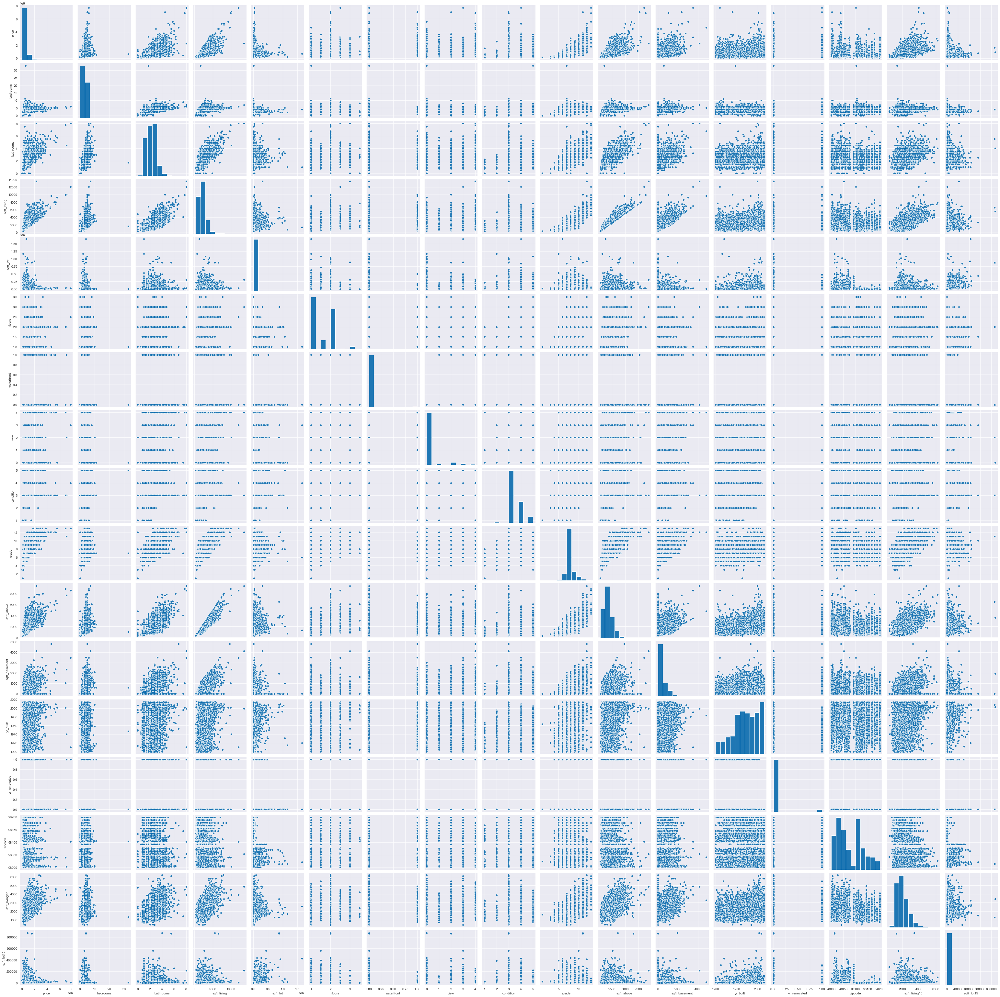

In [12]:
sns.pairplot(df)

# Correlation Matrix

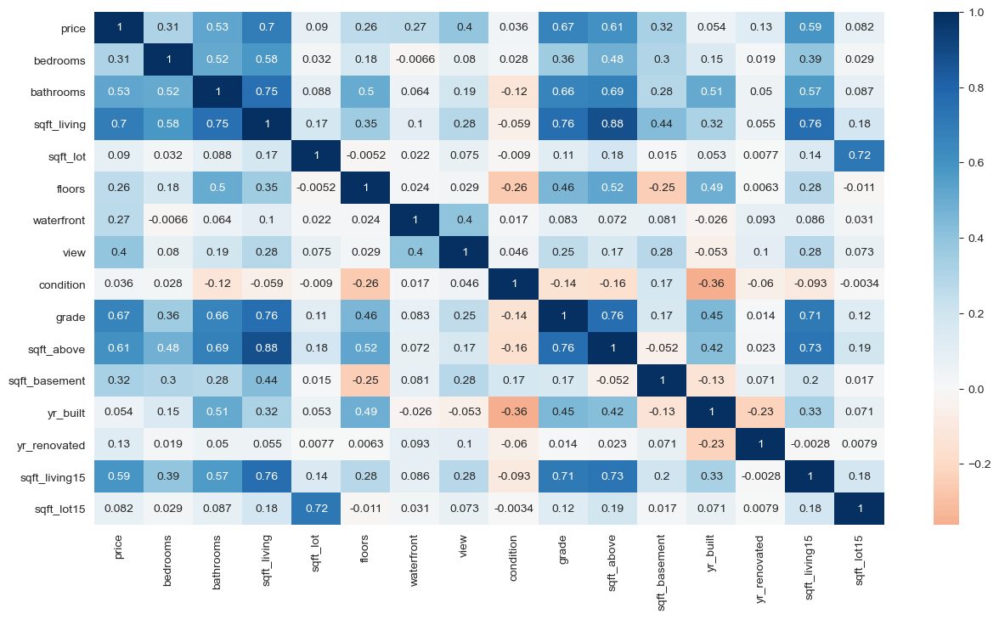

In [13]:
fig = plt.figure(figsize=(15,8),dpi=100)
sns.heatmap(df.drop('zipcode',axis=1).corr(),cmap="RdBu",annot=True,center=0)

We see that most of the variables have positive relationship with the dependent variable price.
we see that the explanatory variable price has the highest correlation with the dependent variable price and that too a positive one which indicates that as the living area of the house increases so does the price of the house

Variables like grade(the type of construction of the house) and the average area of 15 houses near the house of concern also have a very significant correlation with the price of the house of concern.

Variables such as condition of the house and whether the house was ever renovated or not did not have significant correlations with the dependent variables price.

In [14]:
df.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,sqft_living15,sqft_lot15
0,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,1340,5650
1,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1,98125,1690,7639
2,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,2720,8062
3,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,1360,5000
4,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,1800,7503


In [15]:
# Distribution Of Price

Text(0.5, 1.0, 'Distribution Of Price')

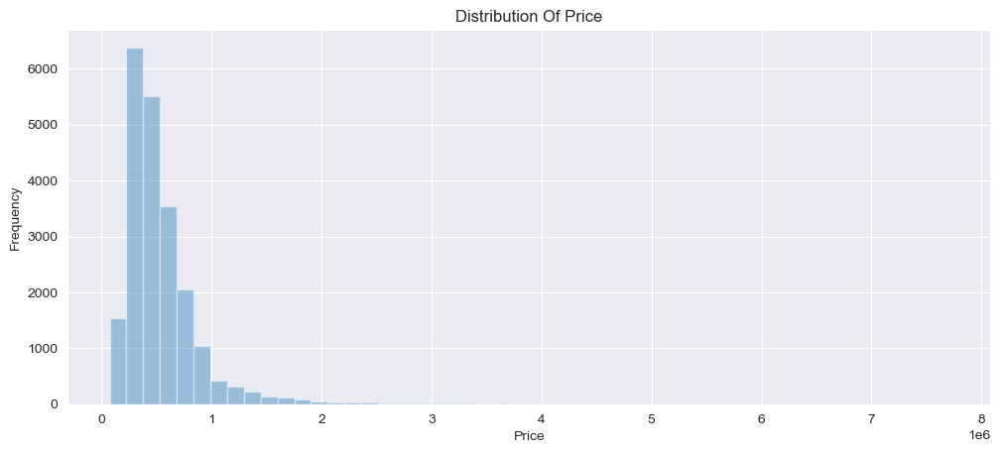

In [16]:
fig = plt.figure(figsize=(12,5),dpi=100)
sns.distplot(df['price'],bins=50,kde=False)
plt.ylabel('Frequency')
plt.xlabel('Price')
plt.title('Distribution Of Price')

The dependent variable price seems to be very positively skewed which makes sense as there are very less houses that are extremely expensive and more houses that are affordable by the common folks in our datasets.

# Price Vs Bedrooms

(0.0, 5000000.0)

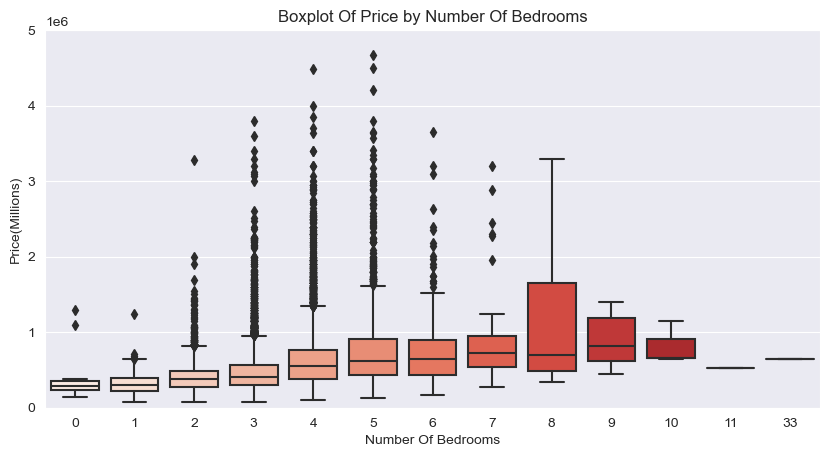

In [17]:
fig = plt.figure(figsize=(10,5),dpi=100)
sns.boxplot(x='bedrooms',y='price',data=df,palette='Reds')
plt.ylabel('Price(Millions)')
plt.xlabel('Number Of Bedrooms')
plt.title('Boxplot Of Price by Number Of Bedrooms')
plt.ylim([0,5000000])

Price Of The House Increases Significantly With Increase in Number Of bedrooms
that are there in the house

# Price Vs Bathrooms

Text(0, 0.5, 'Price(Millions)')

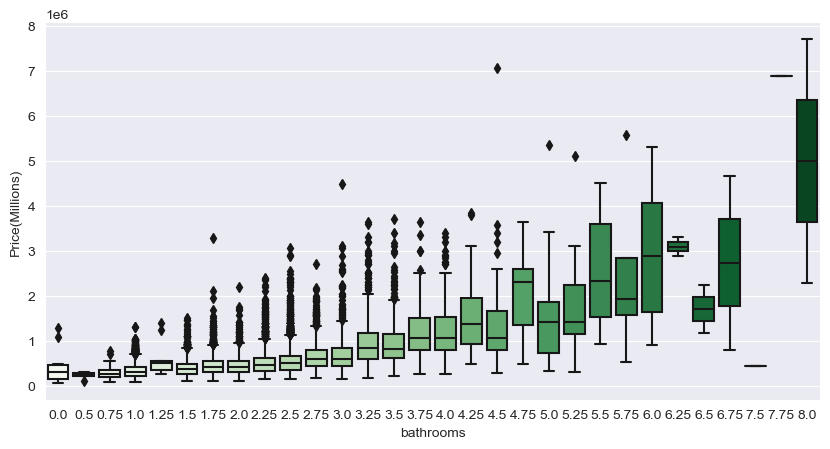

In [18]:
fig = plt.figure(figsize=(10,5),dpi=100)
sns.boxplot(x='bathrooms',y='price',data=df,palette='Greens')
plt.ylabel('Price(Millions)')


Price Of The House Increases Significantly With Increase in Number Of bathrooms
that are there in the house

Text(0, 0.5, 'Price(Millions)')

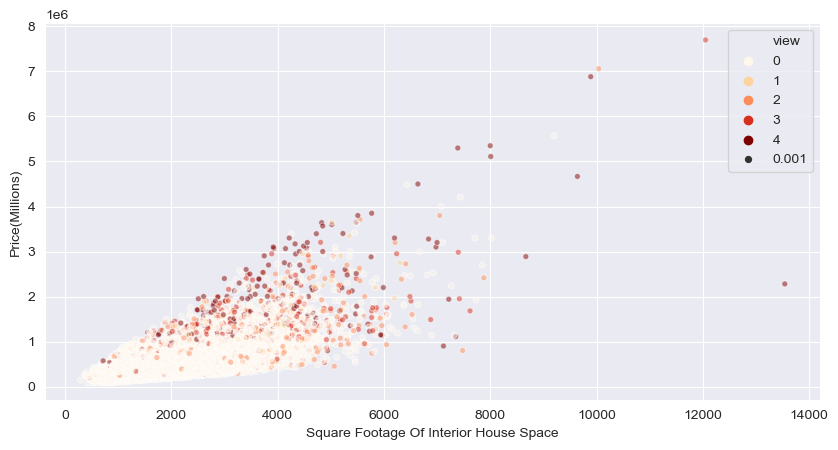

In [19]:
# Square Foot Of the interior Space
fig = plt.figure(figsize=(10,5),dpi=100,edgecolor='black')
sns.scatterplot(x=df['sqft_living'],y='price',data=df,
                size=0.001,alpha=0.5,hue=df['view'],legend='full',palette='OrRd')
plt.xlabel('Square Footage Of Interior House Space')
plt.ylabel('Price(Millions)')


A positive correlation between the price of the house and the area of living of the house is very evident and the dark spots rising towards the upper right hand side of the graph indicates that view also has a positive correlation with the house as the view increases(or getts better) so does the price of the house.

Text(0, 0.5, 'Price(Millions)')

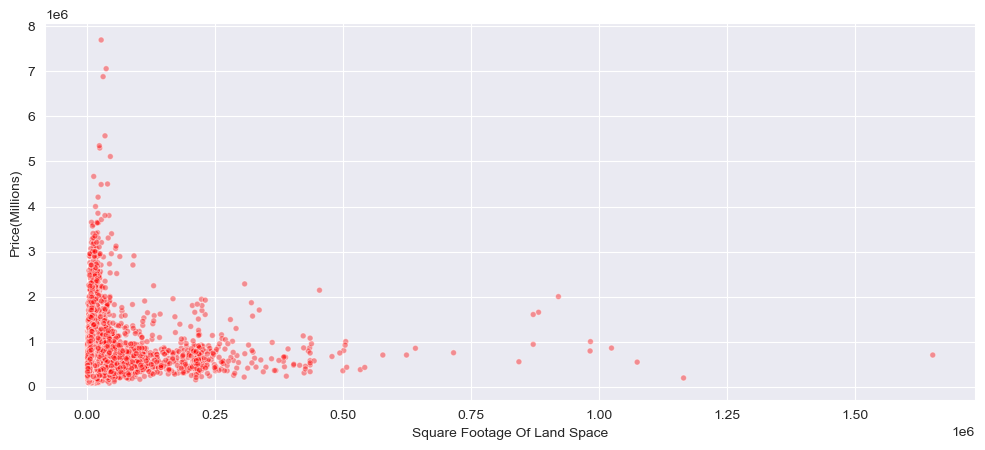

In [20]:
# Square Foot Of The Plot
fig = plt.figure(figsize=(12,5),dpi=100)
sns.scatterplot(x=df['sqft_lot'],y='price',data=df,
                size=0.001,alpha=0.4,color='red',legend=False)
plt.xlabel('Square Footage Of Land Space')
plt.ylabel('Price(Millions)')



It can be seen that the area of the entire plot dosen't seem to affect the overall price of the house as the lack of correlatio  is very evident in the plot above.

Text(0.5, 1.0, 'Boxplot Of Price by Number Of Floors')

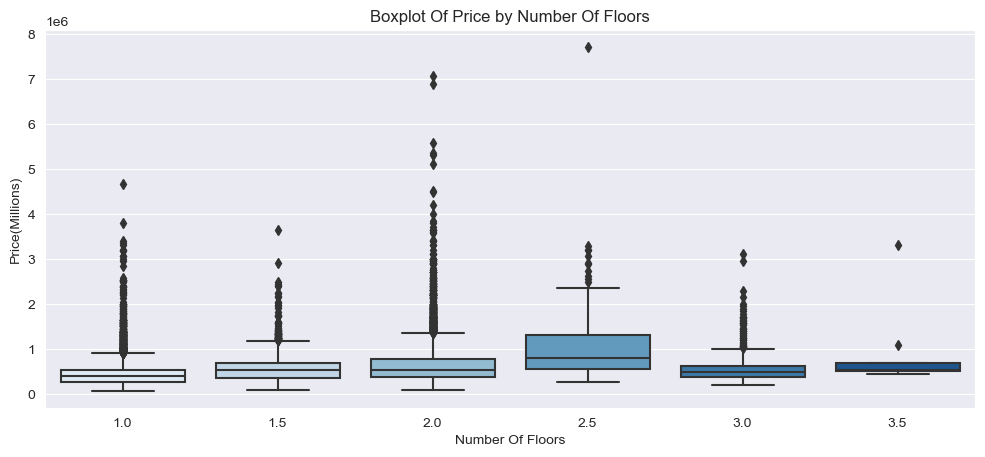

In [21]:
# Floors
fig = plt.figure(figsize=(12,5),dpi=100)
sns.boxplot(x='floors',y='price',data=df,palette='Blues')
plt.ylabel('Price(Millions)')
plt.xlabel('Number Of Floors')
plt.title('Boxplot Of Price by Number Of Floors')

We can see that the price of the houses as the floors increase form 1 to 2.5 but we can see a sudden decline in prices for houses that have more than 2.5 floors

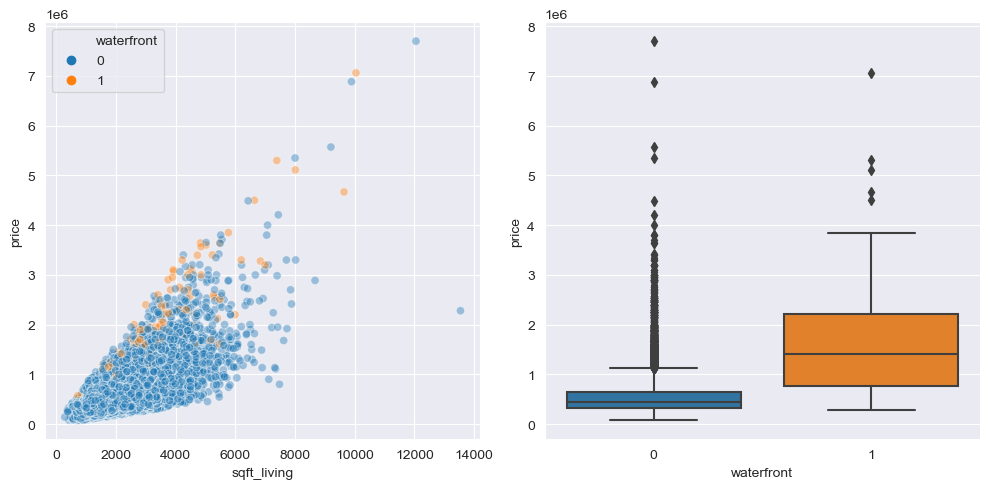

In [22]:
# Waterview
fig,axs = plt.subplots(ncols=2,figsize=(10,5),dpi=100)
sns.scatterplot(x='sqft_living', y='price', data=df,hue=df['waterfront'],alpha=0.4, ax=axs[0])
sns.boxplot(x='waterfront', y='price', data=df, ax=axs[1])
plt.tight_layout()


From the above scatterplot and the boxplot we can clearly see that houses that have waterfront are significantly more expensive than the houses that do not have the waterfront.

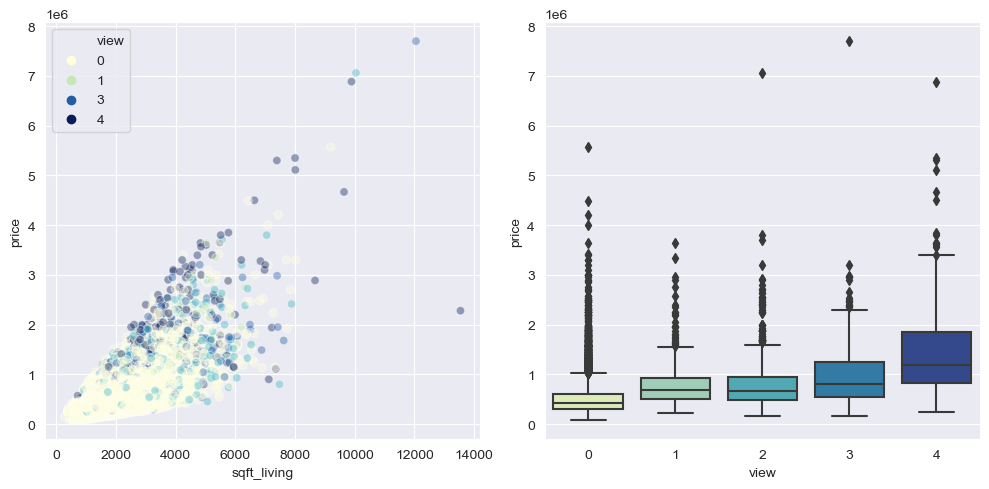

In [23]:
# View
fig,axs = plt.subplots(ncols=2,figsize=(10,5),dpi=100)
sns.scatterplot(x='sqft_living', y='price', data=df,hue=df['view'],alpha=0.4, ax=axs[0],palette='YlGnBu')
sns.boxplot(x='view', y='price', data=df, ax=axs[1],palette='YlGnBu')
plt.tight_layout()

From the above scatterplot and the boxplot we can clearly see that houses that have better views(More the value of View)are significantly more expensive than the houses that have poorer views(less value of View).

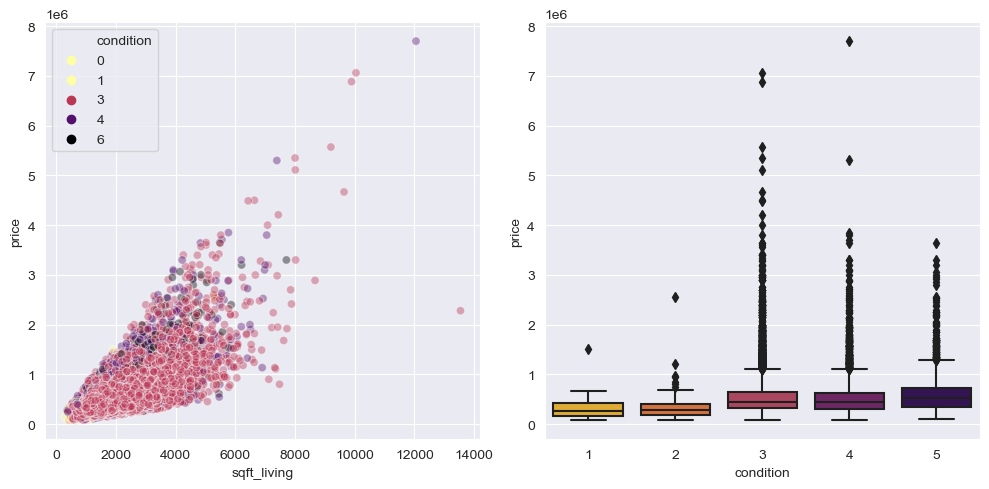

In [24]:
# Condition
fig,axs = plt.subplots(ncols=2,figsize=(10,5),dpi=100)
sns.scatterplot(x='sqft_living', y='price', data=df,hue=df['condition'],alpha=0.4, ax=axs[0],palette='inferno_r')
sns.boxplot(x='condition', y='price', data=df, ax=axs[1],palette='inferno_r')
plt.tight_layout()

From the above scatterplot and the boxplot we can clearly see that houses that are in better condition(More the value of condition)are significantly more expensive than the houses that are in poorer condition(less value of condition).

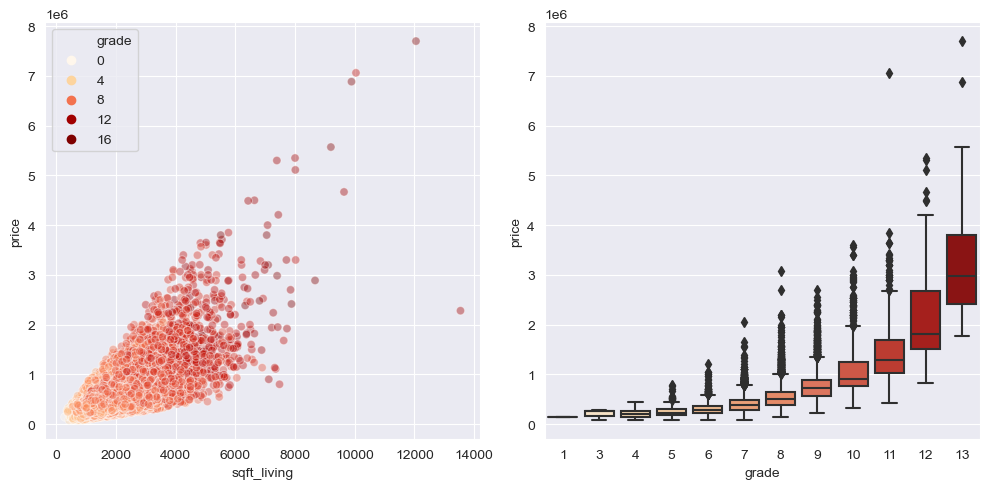

In [25]:
# grade
fig,axs = plt.subplots(ncols=2,figsize=(10,5),dpi=100)
sns.scatterplot(x='sqft_living', y='price', data=df,hue=df['grade'],alpha=0.4, ax=axs[0],palette='OrRd')
sns.boxplot(x='grade', y='price', data=df, ax=axs[1],palette='OrRd')
plt.tight_layout()

From the above scatterplot and the boxplot we can clearly see that houses that have better Construction or Grade (More the value of grade)are significantly more expensive than the houses that have poorer construction(less value of grade).

Text(0, 0.5, 'Price(Millions)')

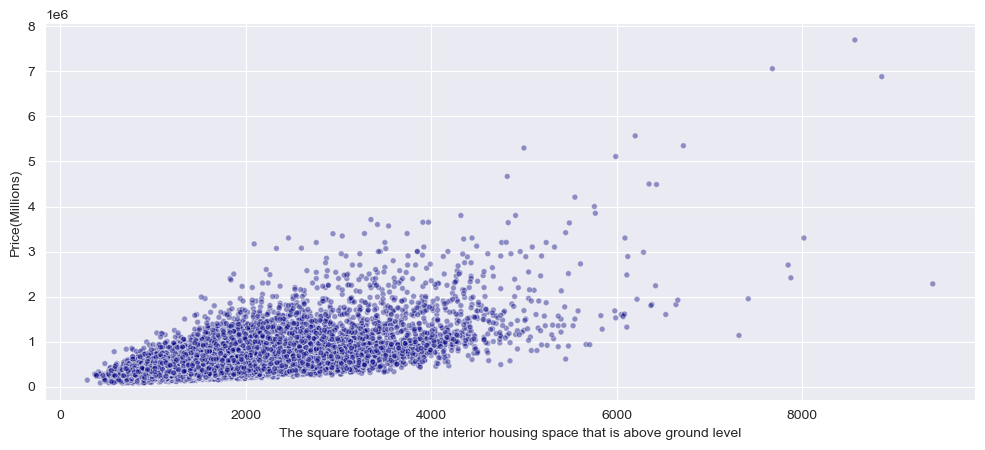

In [26]:
# Condition
fig = plt.figure(figsize=(12,5),dpi=100)
sns.scatterplot(x=df['sqft_above'],y='price',data=df,
                size=0.001,alpha=0.4,color='navy',legend=False)
plt.xlabel('The square footage of the interior housing space that is above ground level')
plt.ylabel('Price(Millions)')


We see that the area of the houses without the basement has a fair amount of correlation with the dependent variable price of the house

Text(0, 0.5, 'Price(Millions)')

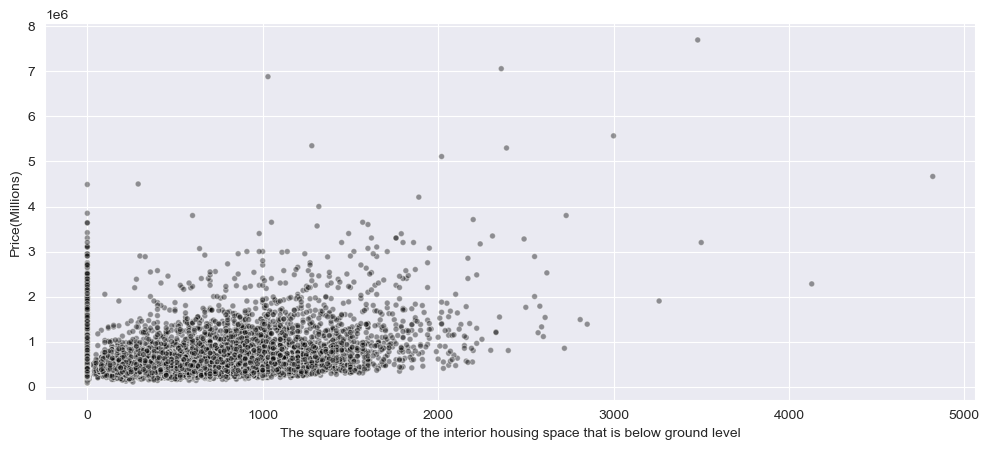

In [27]:
fig = plt.figure(figsize=(12,5),dpi=100)
sns.scatterplot(x=df['sqft_basement'],y='price',data=df,
                size=0.001,alpha=0.4,color='black',legend=False)
plt.xlabel('The square footage of the interior housing space that is below ground level')
plt.ylabel('Price(Millions)')

We see that the area of the basemenent of the house has absolutely no correlation with the dependent variable price of the house.

Text(0, 0.5, 'Price(Millions)')

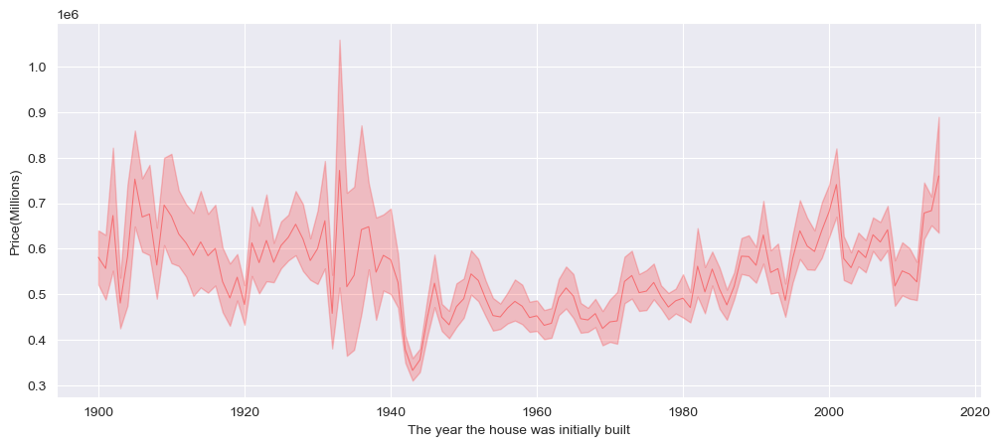

In [28]:
# year
fig = plt.figure(figsize=(12,5),dpi=100)
sns.lineplot(x=df['yr_built'],y='price',data=df,
                size=0.001,alpha=0.4,color='red',legend=False)
plt.xlabel('The year the house was initially built')
plt.ylabel('Price(Millions)')

We can clearly see that the house prices in the King's County has remained pretty stable but there was a sudden decrease in the prices of the house just after 1940 somewhere around 1942. It remained stable for a while and is on the rise in 1980.

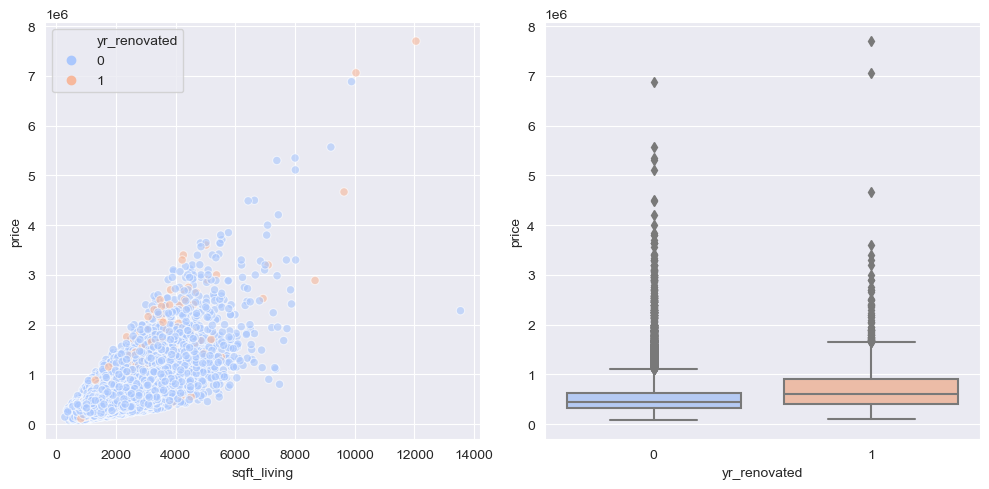

In [29]:
fig,axs = plt.subplots(ncols=2,figsize=(10,5),dpi=100)
sns.scatterplot(x='sqft_living', y='price', data=df,hue=df['yr_renovated'],alpha=0.6, ax=axs[0],palette='coolwarm')
sns.boxplot(x='yr_renovated', y='price', data=df, ax=axs[1],palette='coolwarm')
plt.tight_layout()

From the scatterplot and the boxplot we can see that the houses that have been renovated have higer price than the houses that were never renovated.

Text(0, 0.5, 'Price(Millions)')

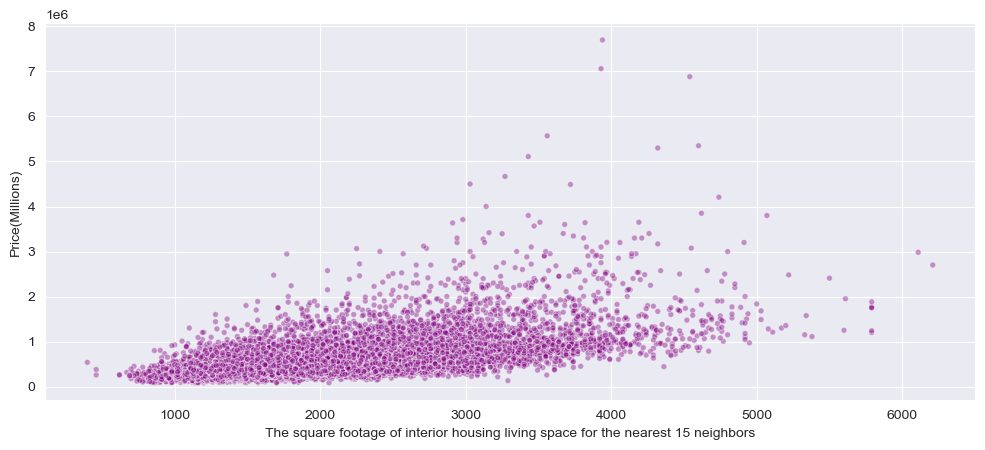

In [30]:
# sqft_living15
fig = plt.figure(figsize=(12,5),dpi=100)
sns.scatterplot(x=df['sqft_living15'],y='price',data=df,
                size=0.001,alpha=0.4,color='Purple',legend=False)
plt.xlabel('The square footage of interior housing living space for the nearest 15 neighbors')
plt.ylabel('Price(Millions)')

The living area of the 15 neighbourhood houses has a less correlation with the dependent variable price of the house of concern.

Text(0, 0.5, 'Price(Millions)')

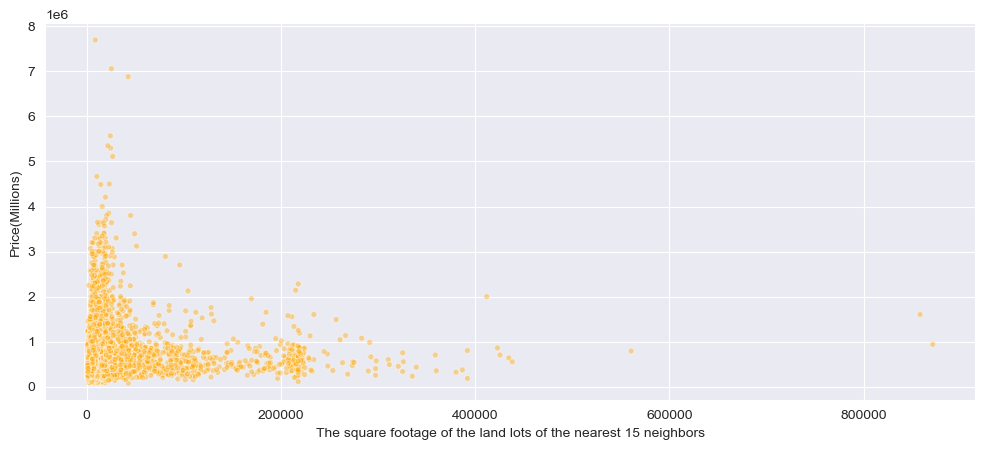

In [31]:
fig = plt.figure(figsize=(12,5),dpi=100)
sns.scatterplot(x=df['sqft_lot15'],y='price',data=df,
                size=0.001,alpha=0.4,color='Orange',legend=False)
plt.xlabel('The square footage of the land lots of the nearest 15 neighbors')
plt.ylabel('Price(Millions)')

The area of the plot of the 15 houses near the chosen house has no correlation with the price of chosen house.

# Machine Learning Implementations

In [32]:
df.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,sqft_living15,sqft_lot15
0,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,1340,5650
1,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1,98125,1690,7639
2,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,2720,8062
3,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,1360,5000
4,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,1800,7503


In [33]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 17 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   price          21613 non-null  float64
 1   bedrooms       21613 non-null  int64  
 2   bathrooms      21613 non-null  float64
 3   sqft_living    21613 non-null  int64  
 4   sqft_lot       21613 non-null  int64  
 5   floors         21613 non-null  float64
 6   waterfront     21613 non-null  int64  
 7   view           21613 non-null  int64  
 8   condition      21613 non-null  int64  
 9   grade          21613 non-null  int64  
 10  sqft_above     21613 non-null  int64  
 11  sqft_basement  21613 non-null  int64  
 12  yr_built       21613 non-null  int64  
 13  yr_renovated   21613 non-null  int64  
 14  zipcode        21613 non-null  int64  
 15  sqft_living15  21613 non-null  int64  
 16  sqft_lot15     21613 non-null  int64  
dtypes: float64(3), int64(14)
memory usage: 2.8 MB


In [34]:
df.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,sqft_living15,sqft_lot15
0,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,1340,5650
1,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1,98125,1690,7639
2,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,2720,8062
3,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,1360,5000
4,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,1800,7503


In [35]:
df.drop('zipcode',axis=1,inplace=True)

There are many zipcodes and hence deriving relevant information from it form the regression models is very less hence we decided to drop the zipcodes of the houses.

In [36]:
df.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,sqft_living15,sqft_lot15
0,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,1340,5650
1,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1,1690,7639
2,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,2720,8062
3,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,1360,5000
4,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,1800,7503


In [37]:
df.columns

Index(['price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors',
       'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'sqft_living15',
       'sqft_lot15'],
      dtype='object')

In [38]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 16 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   price          21613 non-null  float64
 1   bedrooms       21613 non-null  int64  
 2   bathrooms      21613 non-null  float64
 3   sqft_living    21613 non-null  int64  
 4   sqft_lot       21613 non-null  int64  
 5   floors         21613 non-null  float64
 6   waterfront     21613 non-null  int64  
 7   view           21613 non-null  int64  
 8   condition      21613 non-null  int64  
 9   grade          21613 non-null  int64  
 10  sqft_above     21613 non-null  int64  
 11  sqft_basement  21613 non-null  int64  
 12  yr_built       21613 non-null  int64  
 13  yr_renovated   21613 non-null  int64  
 14  sqft_living15  21613 non-null  int64  
 15  sqft_lot15     21613 non-null  int64  
dtypes: float64(3), int64(13)
memory usage: 2.6 MB


# Setting Up Predictor and Response Variables

Setting the predictor and response variables

In [39]:
X = df[['bedrooms',     'bathrooms',   'sqft_living',
            'sqft_lot',        'floors',    'waterfront',          'view',
           'condition',         'grade',    'sqft_above', 'sqft_basement',
            'yr_built',  'yr_renovated', 'sqft_living15',
          'sqft_lot15']]

In [40]:
X.head()

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,sqft_living15,sqft_lot15
0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,1340,5650
1,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1,1690,7639
2,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,2720,8062
3,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,1360,5000
4,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,1800,7503


In [41]:
X.shape

(21613, 15)

In [42]:
y = df['price']

In [43]:
y.head()

0    221900.0
1    538000.0
2    180000.0
3    604000.0
4    510000.0
Name: price, dtype: float64

Imputing the 10% Null values at random in the dataset

In [44]:
# Imputing 10% of the columns with Null Values
for col in X.columns: X.loc[X.sample(frac=0.1).index, col] = pd.np.nan

C:\Users\behab\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: FutureWarning: The pandas.np module is deprecated and will be removed from pandas in a future version. Import numpy directly instead
  
C:\Users\behab\Anaconda3\lib\site-packages\pandas\core\indexing.py:966: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s


In [45]:
X.head(30)

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,sqft_living15,sqft_lot15
0,3.0,1.00,1180.0,5650.0,NaN,0.0,0.0,3.0,7.0,1180.0,0.0,1955.0,0.0,NaN,5650.0
1,3.0,2.25,2570.0,7242.0,2.0,0.0,0.0,3.0,7.0,2170.0,400.0,1951.0,1.0,1690.0,7639.0
2,2.0,1.00,770.0,10000.0,1.0,0.0,0.0,3.0,6.0,770.0,0.0,1933.0,0.0,2720.0,8062.0
3,4.0,3.00,1960.0,5000.0,1.0,0.0,0.0,5.0,7.0,1050.0,910.0,1965.0,0.0,1360.0,5000.0
4,3.0,2.00,NaN,8080.0,1.0,0.0,NaN,3.0,8.0,1680.0,0.0,1987.0,0.0,1800.0,7503.0
5,4.0,4.50,NaN,101930.0,1.0,NaN,NaN,3.0,11.0,3890.0,1530.0,2001.0,0.0,4760.0,101930.0
6,3.0,2.25,1715.0,6819.0,2.0,0.0,0.0,3.0,7.0,1715.0,0.0,1995.0,0.0,2238.0,6819.0
7,3.0,1.50,1060.0,9711.0,1.0,0.0,0.0,3.0,7.0,1060.0,0.0,1963.0,0.0,1650.0,9711.0
8,3.0,1.00,1780.0,7470.0,1.0,0.0,0.0,3.0,7.0,NaN,730.0,1960.0,0.0,NaN,8113.0
9,3.0,2.50,1890.0,6560.0,2.0,0.0,0.0,3.0,7.0,1890.0,0.0,2003.0,0.0,2390.0,7570.0


In [46]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 15 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   bedrooms       19452 non-null  float64
 1   bathrooms      19452 non-null  float64
 2   sqft_living    19452 non-null  float64
 3   sqft_lot       19452 non-null  float64
 4   floors         19452 non-null  float64
 5   waterfront     19452 non-null  float64
 6   view           19452 non-null  float64
 7   condition      19452 non-null  float64
 8   grade          19452 non-null  float64
 9   sqft_above     19452 non-null  float64
 10  sqft_basement  19452 non-null  float64
 11  yr_built       19452 non-null  float64
 12  yr_renovated   19452 non-null  float64
 13  sqft_living15  19452 non-null  float64
 14  sqft_lot15     19452 non-null  float64
dtypes: float64(15)
memory usage: 2.5 MB


In [47]:
X.isna().sum()

bedrooms         2161
bathrooms        2161
sqft_living      2161
sqft_lot         2161
floors           2161
waterfront       2161
view             2161
condition        2161
grade            2161
sqft_above       2161
sqft_basement    2161
yr_built         2161
yr_renovated     2161
sqft_living15    2161
sqft_lot15       2161
dtype: int64

We have Successfully Made 10% of all columns Randomly as NaN

# Imputing The NaN Values

Imputation Of Quantitative Variables

# sqft_living

Text(0.5, 0, 'Square Foot Area Of the Houes(Millions)')

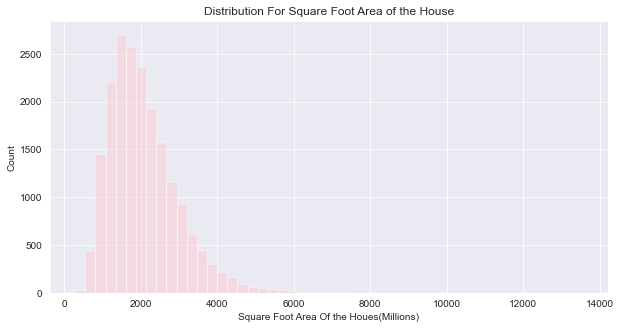

In [48]:
fig=plt.figure(figsize=(10,5))
sns.distplot(X['sqft_living'],color='pink',kde=False)
plt.title('Distribution For Square Foot Area of the House')
plt.ylabel('Count')
plt.xlabel('Square Foot Area Of the Houes(Millions)')


The Distribution Of the Variable suggests that the variable is positively skewed


In [49]:
X.groupby('grade')['sqft_living'].mean()

grade
1.0      290.000000
3.0      596.666667
4.0      661.478261
5.0      971.735751
6.0     1190.512867
7.0     1685.845294
8.0     2181.810443
9.0     2865.151544
10.0    3531.699566
11.0    4392.553191
12.0    5491.527027
13.0    7483.076923
Name: sqft_living, dtype: float64

In [50]:
X['sqft_living'] = X['sqft_living'].fillna(X.groupby('grade')['sqft_living'].transform('mean'))

C:\Users\behab\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [51]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 15 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   bedrooms       19452 non-null  float64
 1   bathrooms      19452 non-null  float64
 2   sqft_living    21402 non-null  float64
 3   sqft_lot       19452 non-null  float64
 4   floors         19452 non-null  float64
 5   waterfront     19452 non-null  float64
 6   view           19452 non-null  float64
 7   condition      19452 non-null  float64
 8   grade          19452 non-null  float64
 9   sqft_above     19452 non-null  float64
 10  sqft_basement  19452 non-null  float64
 11  yr_built       19452 non-null  float64
 12  yr_renovated   19452 non-null  float64
 13  sqft_living15  19452 non-null  float64
 14  sqft_lot15     19452 non-null  float64
dtypes: float64(15)
memory usage: 2.5 MB


In [52]:
X.head(30)

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,sqft_living15,sqft_lot15
0,3.0,1.00,1180.000000,5650.0,NaN,0.0,0.0,3.0,7.0,1180.0,0.0,1955.0,0.0,NaN,5650.0
1,3.0,2.25,2570.000000,7242.0,2.0,0.0,0.0,3.0,7.0,2170.0,400.0,1951.0,1.0,1690.0,7639.0
2,2.0,1.00,770.000000,10000.0,1.0,0.0,0.0,3.0,6.0,770.0,0.0,1933.0,0.0,2720.0,8062.0
3,4.0,3.00,1960.000000,5000.0,1.0,0.0,0.0,5.0,7.0,1050.0,910.0,1965.0,0.0,1360.0,5000.0
4,3.0,2.00,2181.810443,8080.0,1.0,0.0,NaN,3.0,8.0,1680.0,0.0,1987.0,0.0,1800.0,7503.0
5,4.0,4.50,4392.553191,101930.0,1.0,NaN,NaN,3.0,11.0,3890.0,1530.0,2001.0,0.0,4760.0,101930.0
6,3.0,2.25,1715.000000,6819.0,2.0,0.0,0.0,3.0,7.0,1715.0,0.0,1995.0,0.0,2238.0,6819.0
7,3.0,1.50,1060.000000,9711.0,1.0,0.0,0.0,3.0,7.0,1060.0,0.0,1963.0,0.0,1650.0,9711.0
8,3.0,1.00,1780.000000,7470.0,1.0,0.0,0.0,3.0,7.0,NaN,730.0,1960.0,0.0,NaN,8113.0
9,3.0,2.50,1890.000000,6560.0,2.0,0.0,0.0,3.0,7.0,1890.0,0.0,2003.0,0.0,2390.0,7570.0


In [53]:
X['sqft_living'].isna().sum()

211

202 Have still not been imputed as the values for grades in the corresponding columns were also NaN

In [54]:
X.groupby('bathrooms')['sqft_living'].mean()

bathrooms
0.00     1636.800000
0.50     1312.628217
0.75      947.121324
1.00     1207.162588
1.25     1864.093570
1.50     1558.016005
1.75     1795.356620
2.00     1792.896258
2.25     2093.810654
2.50     2373.770465
2.75     2627.233947
3.00     2709.916817
3.25     3175.179011
3.50     3361.181251
3.75     3779.179064
4.00     4100.745063
4.25     4388.413215
4.50     4245.818483
4.75     5228.333333
5.00     4843.277778
5.25     5006.879433
5.50     6506.000000
5.75     6876.666667
6.00     6443.333333
6.25     8345.000000
6.50     6765.000000
6.75     8560.000000
7.50     4050.000000
7.75     9890.000000
8.00    12795.000000
Name: sqft_living, dtype: float64

In [55]:
X['sqft_living'] = X['sqft_living'].fillna(X.groupby('bathrooms')['sqft_living'].transform('mean'))

C:\Users\behab\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [56]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 15 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   bedrooms       19452 non-null  float64
 1   bathrooms      19452 non-null  float64
 2   sqft_living    21594 non-null  float64
 3   sqft_lot       19452 non-null  float64
 4   floors         19452 non-null  float64
 5   waterfront     19452 non-null  float64
 6   view           19452 non-null  float64
 7   condition      19452 non-null  float64
 8   grade          19452 non-null  float64
 9   sqft_above     19452 non-null  float64
 10  sqft_basement  19452 non-null  float64
 11  yr_built       19452 non-null  float64
 12  yr_renovated   19452 non-null  float64
 13  sqft_living15  19452 non-null  float64
 14  sqft_lot15     19452 non-null  float64
dtypes: float64(15)
memory usage: 2.5 MB


In [57]:
X['sqft_living'].isna().sum()

19

26 values are still missing

In [58]:
X.groupby('bedrooms')['sqft_living'].mean()

bedrooms
0.0     1977.547826
1.0      918.674468
2.0     1276.184642
3.0     1818.391647
4.0     2532.397204
5.0     3019.008373
6.0     3230.147062
7.0     3590.447076
8.0     3699.622299
9.0     3966.000000
10.0    3706.666667
11.0    3000.000000
33.0    1620.000000
Name: sqft_living, dtype: float64

In [59]:
X['sqft_living'] = X['sqft_living'].fillna(X.groupby('bedrooms')['sqft_living'].transform('mean'))

C:\Users\behab\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [60]:
X['sqft_living'].isna().sum()

1

In [61]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 15 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   bedrooms       19452 non-null  float64
 1   bathrooms      19452 non-null  float64
 2   sqft_living    21612 non-null  float64
 3   sqft_lot       19452 non-null  float64
 4   floors         19452 non-null  float64
 5   waterfront     19452 non-null  float64
 6   view           19452 non-null  float64
 7   condition      19452 non-null  float64
 8   grade          19452 non-null  float64
 9   sqft_above     19452 non-null  float64
 10  sqft_basement  19452 non-null  float64
 11  yr_built       19452 non-null  float64
 12  yr_renovated   19452 non-null  float64
 13  sqft_living15  19452 non-null  float64
 14  sqft_lot15     19452 non-null  float64
dtypes: float64(15)
memory usage: 2.5 MB


1 values are still missing

In [62]:
X.groupby('floors')['sqft_living'].mean()

floors
1.0    1736.972444
1.5    1896.007811
2.0    2565.394594
2.5    3036.384817
3.0    1826.261339
3.5    2518.000000
Name: sqft_living, dtype: float64

In [63]:
X['sqft_living'] = X['sqft_living'].fillna(X.groupby('floors')['sqft_living'].transform('mean'))

C:\Users\behab\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [64]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 15 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   bedrooms       19452 non-null  float64
 1   bathrooms      19452 non-null  float64
 2   sqft_living    21612 non-null  float64
 3   sqft_lot       19452 non-null  float64
 4   floors         19452 non-null  float64
 5   waterfront     19452 non-null  float64
 6   view           19452 non-null  float64
 7   condition      19452 non-null  float64
 8   grade          19452 non-null  float64
 9   sqft_above     19452 non-null  float64
 10  sqft_basement  19452 non-null  float64
 11  yr_built       19452 non-null  float64
 12  yr_renovated   19452 non-null  float64
 13  sqft_living15  19452 non-null  float64
 14  sqft_lot15     19452 non-null  float64
dtypes: float64(15)
memory usage: 2.5 MB


In [65]:
X['sqft_living'].isna().sum()

1

As the distribution of the sqft_living  is positively skewed and not normally distributed hence it would be appropriate to impute the 1 nan that is remaining with the median of the column

In [66]:
X['sqft_living'].median()

1909.5

In [67]:
X.loc[(X['sqft_living'].isna()),'sqft_living']=  X['sqft_living'].median()

C:\Users\behab\Anaconda3\lib\site-packages\pandas\core\indexing.py:671: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
C:\Users\behab\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [68]:
X.loc[(X['sqft_living'].isna()),'sqft_living']= X['sqft_living'].median()

C:\Users\behab\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [69]:
X['sqft_living'].isna().sum()

0

The column was imputed by the grouped mean of the variables to with which it had very high correlation and once it was done by that and still the null values prevailed then it was done by the median of the column as the distribution of the column was positively skewed and not normally distributed

# sqft_lot

Text(0.5, 0, 'Square Foot Of the Land(Millions)')

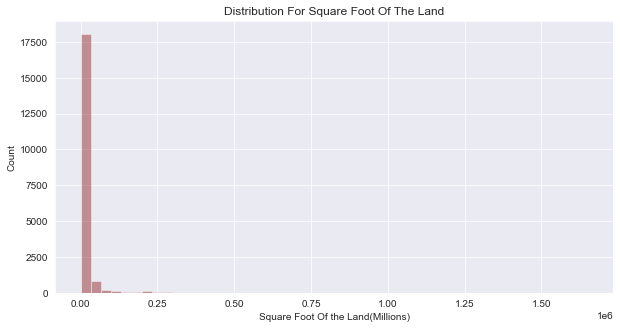

In [70]:
fig=plt.figure(figsize=(10,5))
sns.distplot(X['sqft_lot'],color='maroon',bins=50,kde=False)
plt.title('Distribution For Square Foot Of The Land')
plt.ylabel('Count')
plt.xlabel('Square Foot Of the Land(Millions)')

The Distribution is positively skewed and has correlations with none of the other variables hence we are imputing it with the median of the column

In [71]:
X['sqft_lot'].median()

7605.0

In [72]:
X.loc[(X['sqft_lot'].isna()),'sqft_lot']= X['sqft_lot'].median()



C:\Users\behab\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [73]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 15 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   bedrooms       19452 non-null  float64
 1   bathrooms      19452 non-null  float64
 2   sqft_living    21613 non-null  float64
 3   sqft_lot       21613 non-null  float64
 4   floors         19452 non-null  float64
 5   waterfront     19452 non-null  float64
 6   view           19452 non-null  float64
 7   condition      19452 non-null  float64
 8   grade          19452 non-null  float64
 9   sqft_above     19452 non-null  float64
 10  sqft_basement  19452 non-null  float64
 11  yr_built       19452 non-null  float64
 12  yr_renovated   19452 non-null  float64
 13  sqft_living15  19452 non-null  float64
 14  sqft_lot15     19452 non-null  float64
dtypes: float64(15)
memory usage: 2.5 MB


In [74]:
X['sqft_lot'].isna().sum()

0

The Null Values were imputing was done by the median of the column as the distribution of the column was positively skewed and not normally distributed

The Variable sqft_lot has been successfully imputed

# sqft_above

Text(0.5, 0, 'interior housing space(sqft_above)')

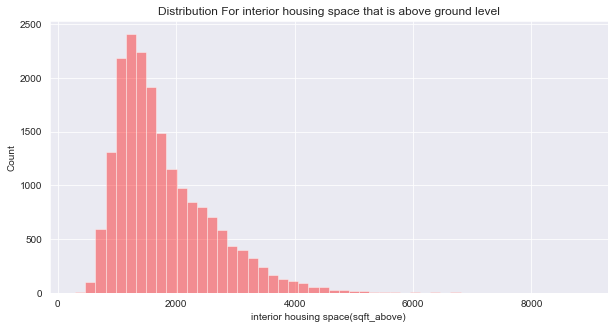

In [75]:
fig=plt.figure(figsize=(10,5))
sns.distplot(X['sqft_above'],color='red',kde=False)
plt.title('Distribution For interior housing space that is above ground level')
plt.ylabel('Count')
plt.xlabel('interior housing space(sqft_above)')

In [76]:
X.groupby('grade')['sqft_above'].mean()

grade
1.0      290.000000
3.0      596.666667
4.0      677.000000
5.0      927.596774
6.0     1066.188494
7.0     1409.519598
8.0     1869.188397
9.0     2553.294592
10.0    3107.479826
11.0    3855.443038
12.0    4518.381579
13.0    6060.769231
Name: sqft_above, dtype: float64

In [77]:
X.head()

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,sqft_living15,sqft_lot15
0,3.0,1.00,1180.000000,5650.0,NaN,0.0,0.0,3.0,7.0,1180.0,0.0,1955.0,0.0,NaN,5650.0
1,3.0,2.25,2570.000000,7242.0,2.0,0.0,0.0,3.0,7.0,2170.0,400.0,1951.0,1.0,1690.0,7639.0
2,2.0,1.00,770.000000,10000.0,1.0,0.0,0.0,3.0,6.0,770.0,0.0,1933.0,0.0,2720.0,8062.0
3,4.0,3.00,1960.000000,5000.0,1.0,0.0,0.0,5.0,7.0,1050.0,910.0,1965.0,0.0,1360.0,5000.0
4,3.0,2.00,2181.810443,8080.0,1.0,0.0,NaN,3.0,8.0,1680.0,0.0,1987.0,0.0,1800.0,7503.0


In [78]:
X['sqft_above'] = X['sqft_above'].fillna(X.groupby('grade')['sqft_above'].transform('mean'))

C:\Users\behab\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [79]:
X['sqft_above'].isna().sum()

203

212 More Null values remain that have to be taken care of.

In [80]:
X.groupby('bathrooms')['sqft_above'].mean()

bathrooms
0.00    1636.800000
0.50     992.500000
0.75     876.676499
1.00    1111.666314
1.25    1248.888889
1.50    1358.092395
1.75    1425.274999
2.00    1491.422181
2.25    1752.698749
2.50    2166.307228
2.75    2149.058227
3.00    2227.018154
3.25    2661.374071
3.50    2793.843421
3.75    3193.777762
4.00    3413.659729
4.25    3607.078488
4.50    3652.186371
4.75    4265.259192
5.00    3825.524581
5.25    4120.833333
5.50    5146.544304
5.75    5520.000000
6.00    4988.333333
6.25    7070.000000
6.50    5630.000000
6.75    4950.000000
7.50    4050.000000
7.75    8860.000000
8.00    6544.190789
Name: sqft_above, dtype: float64

In [81]:
X['sqft_above'] = X['sqft_above'].fillna(X.groupby('bathrooms')['sqft_above'].transform('mean'))

C:\Users\behab\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [82]:
X['sqft_above'].isna().sum()

18

17 More Null values remain that have to be taken care of.

In [83]:
X.groupby('floors')['sqft_above'].mean()

floors
1.0    1349.682730
1.5    1633.261261
2.0    2378.952368
2.5    2692.549815
3.0    1747.873513
3.5    2315.500000
Name: sqft_above, dtype: float64

In [84]:
X['sqft_above'] = X['sqft_above'].fillna(X.groupby('floors')['sqft_above'].transform('mean'))

C:\Users\behab\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [85]:
X['sqft_above'].isna().sum()

5

In [86]:
X.groupby('bedrooms')['sqft_above'].mean()

bedrooms
0.0     1950.400000
1.0      883.008995
2.0     1134.150416
3.0     1594.950442
4.0     2178.384519
5.0     2386.179664
6.0     2457.189196
7.0     2989.557725
8.0     2835.454545
9.0     3146.000000
10.0    2456.666667
11.0    2400.000000
33.0    1040.000000
Name: sqft_above, dtype: float64

In [87]:
X['sqft_above'] = X['sqft_above'].fillna(X.groupby('bedrooms')['sqft_above'].transform('mean'))

C:\Users\behab\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [88]:
X.loc[(X['sqft_above'].isna()),'sqft_above']= X['sqft_above'].median()

C:\Users\behab\Anaconda3\lib\site-packages\pandas\core\indexing.py:671: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
C:\Users\behab\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [89]:
X['sqft_above'].isna().sum()

0

The column was imputed by the grouped mean of the variables to with which it had very high correlation and once it was done by that and still the null values prevailed then it was done by the median of the column as the distribution of the column was positively skewed and not normally distributed

The Variable sqft_above has been successfully imputed

# sqft_basement

Text(0.5, 0, 'interior housing space Below Ground(sqft_basement)')

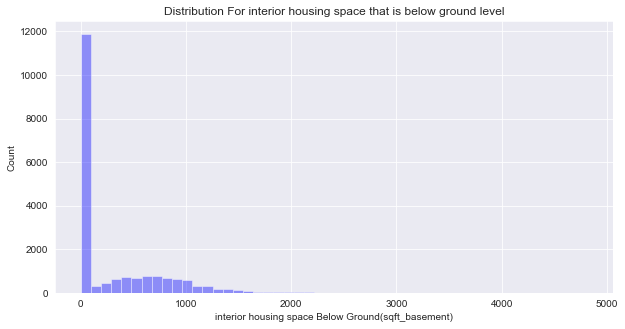

In [90]:
fig=plt.figure(figsize=(10,5))
sns.distplot(X['sqft_basement'],color='blue',kde=False)
plt.title('Distribution For interior housing space that is below ground level')
plt.ylabel('Count')
plt.xlabel('interior housing space Below Ground(sqft_basement)')

In [91]:
X.groupby('bedrooms')['sqft_basement'].mean()

bedrooms
0.0        0.000000
1.0       65.568182
2.0      133.283662
3.0      221.607515
4.0      358.453990
5.0      637.324615
6.0      786.728111
7.0      674.000000
8.0     1106.000000
9.0      820.000000
10.0    1250.000000
11.0     600.000000
33.0     580.000000
Name: sqft_basement, dtype: float64

In [92]:
X['sqft_basement'] = X['sqft_basement'].fillna(X.groupby('bedrooms')['sqft_basement'].transform('mean'))

C:\Users\behab\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [93]:
X['sqft_basement'].isna().sum()

210

221 More Null values remain that have to be taken care of.

In [94]:
X.groupby('view')['sqft_basement'].mean()

view
0.0    253.418062
1.0    579.053658
2.0    536.668960
3.0    689.788565
4.0    814.442885
Name: sqft_basement, dtype: float64

In [95]:
X['sqft_basement'] = X['sqft_basement'].fillna(X.groupby('view')['sqft_basement'].transform('mean'))

C:\Users\behab\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [96]:
X['sqft_basement'].isna().sum()

19

19 More Null values remain that have to be taken care of.

In [97]:
X.groupby('bathrooms')['sqft_basement'].mean()

bathrooms
0.00       0.000000
0.50     242.500000
0.75      75.015336
1.00      97.006545
1.25     186.845279
1.50     203.150225
1.75     370.612068
2.00     303.576028
2.25     340.159274
2.50     207.675463
2.75     493.253010
3.00     506.706368
3.25     506.122038
3.50     578.478376
3.75     536.174448
4.00     629.954998
4.25     804.259536
4.50     601.348204
4.75     937.389624
5.00     853.397553
5.25     741.937449
5.50    1092.000000
5.75    1356.666667
6.00    1455.000000
6.25    1275.000000
6.50    1135.000000
6.75    2747.000000
7.50       0.000000
7.75    1030.000000
8.00    3805.000000
Name: sqft_basement, dtype: float64

In [98]:
X['sqft_basement'] = X['sqft_basement'].fillna(X.groupby('bathrooms')['sqft_basement'].transform('mean'))

C:\Users\behab\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [99]:
X['sqft_basement'].isna().sum()

1

In [100]:
X['sqft_basement'] = X['sqft_basement'].fillna(X.groupby('grade')['sqft_basement'].transform('mean'))

C:\Users\behab\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [101]:
X.loc[(X['sqft_basement'].isna()),'sqft_basement']= X['sqft_basement'].median()

C:\Users\behab\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [102]:
X['sqft_basement'].isna().sum()

0

The column was imputed by the grouped mean of the variables to with which it had very high correlation and once it was done by that and still the null values prevailed then it was done by the median of the column as the distribution of the column was positively skewed and not normally distributed

The Variable sqft_basement has been successfully imputed

# sqft_living15

Text(0, 0.5, 'Count')

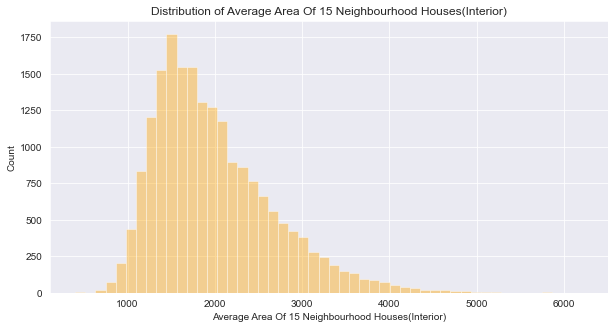

In [103]:
fig = plt.figure(figsize=(10,5))
sns.distplot(X['sqft_living15'],color='orange',kde=False)
plt.title('Distribution of Average Area Of 15 Neighbourhood Houses(Interior)')
plt.xlabel('Average Area Of 15 Neighbourhood Houses(Interior)')
plt.ylabel('Count')

In [104]:
X.groupby('grade')['sqft_living15'].mean()

grade
1.0             NaN
3.0     1250.000000
4.0     1501.153846
5.0     1375.712042
6.0     1386.870948
7.0     1677.116420
8.0     2065.355237
9.0     2618.858016
10.0    3034.796926
11.0    3521.765432
12.0    4026.833333
13.0    4110.833333
Name: sqft_living15, dtype: float64

In [105]:
X['sqft_living15'] = X['sqft_living15'].fillna(X.groupby('grade')['sqft_living15'].transform('mean'))

C:\Users\behab\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [106]:
X['sqft_living15'].isna().sum()

234

229 More Null values remain that have to be taken care of.

In [107]:
X.groupby('bathrooms')['sqft_living15'].mean()

bathrooms
0.00    1976.941295
0.50    1606.338809
0.75    1480.400682
1.00    1460.153772
1.25    1659.359205
1.50    1624.962599
1.75    1797.055005
2.00    1732.345388
2.25    2023.189024
2.50    2256.418952
2.75    2339.514296
3.00    2245.302805
3.25    2650.143730
3.50    2676.147765
3.75    2835.443384
4.00    3163.178129
4.25    3171.956987
4.50    3006.473333
4.75    3411.468254
5.00    3283.726779
5.25    3073.750000
5.50    3662.000000
5.75    2910.000000
6.00    3691.666667
6.25    4150.000000
6.50    2255.000000
6.75    3040.000000
7.50    1448.000000
7.75    4540.000000
8.00    4395.000000
Name: sqft_living15, dtype: float64

In [108]:
X['sqft_living15'] = X['sqft_living15'].fillna(X.groupby('bathrooms')['sqft_living15'].transform('mean'))

C:\Users\behab\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [109]:
X['sqft_living15'].isna().sum()

24

18 More Null values remain that have to be taken care of.

In [110]:
X.groupby('bedrooms')['sqft_living15'].mean()

bedrooms
0.0     2222.941295
1.0     1462.413856
2.0     1523.364574
3.0     1841.953194
4.0     2276.888666
5.0     2433.183281
6.0     2286.702955
7.0     2271.667779
8.0     2291.832015
9.0     2017.600000
10.0    2193.333333
11.0    1420.000000
33.0    1330.000000
Name: sqft_living15, dtype: float64

In [111]:
X['sqft_living15'] = X['sqft_living15'].fillna(X.groupby('bedrooms')['sqft_living15'].transform('mean'))

C:\Users\behab\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [112]:
X['sqft_living15'].isna().sum()

5

In [113]:
X.loc[(X['sqft_living15'].isna()),'sqft_living15']= X['sqft_living15'].median()

C:\Users\behab\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [114]:
X['sqft_living15'].isna().sum()

0

The column was imputed by the grouped mean of the variables to with which it had very high correlation and once it was done by that and still the null values prevailed then it was done by the median of the column as the distribution of the column was positively skewed and not normally distributed

The Variable sqft_living15 has been successfully imputed

# sqft_lot15

Text(0, 0.5, 'Count')

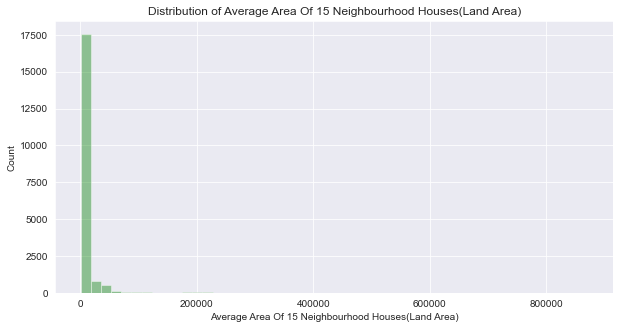

In [115]:
fig = plt.figure(figsize=(10,5))
sns.distplot(X['sqft_lot15'],color='green',kde=False)
plt.title('Distribution of Average Area Of 15 Neighbourhood Houses(Land Area)')
plt.xlabel('Average Area Of 15 Neighbourhood Houses(Land Area)')
plt.ylabel('Count')

The Distribution is positively skewed and has correlations with none of the other variables hence we are imputing it with the median of the column

In [116]:
X['sqft_lot15'].median()

7615.0

In [117]:
X.loc[(X['sqft_lot15'].isna()),'sqft_lot15']= X['sqft_lot15'].median()

C:\Users\behab\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [118]:
X['sqft_lot15'].isna().sum()

0

The Variable sqft_lot15 has been successfully imputed

In [119]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 15 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   bedrooms       19452 non-null  float64
 1   bathrooms      19452 non-null  float64
 2   sqft_living    21613 non-null  float64
 3   sqft_lot       21613 non-null  float64
 4   floors         19452 non-null  float64
 5   waterfront     19452 non-null  float64
 6   view           19452 non-null  float64
 7   condition      19452 non-null  float64
 8   grade          19452 non-null  float64
 9   sqft_above     21613 non-null  float64
 10  sqft_basement  21613 non-null  float64
 11  yr_built       19452 non-null  float64
 12  yr_renovated   19452 non-null  float64
 13  sqft_living15  21613 non-null  float64
 14  sqft_lot15     21613 non-null  float64
dtypes: float64(15)
memory usage: 2.5 MB


The Null Values were imputing was done by the median of the column as the distribution of the column was positively skewed and not normally distributed

# Imputing Categorical Variables

# Floors

The number of floors a house will have is very highly correlated with the mean Area that the house occupies above the land hence we will use the sqft_above variable to impute the floors variable

Text(0.5, 0, 'Floors')

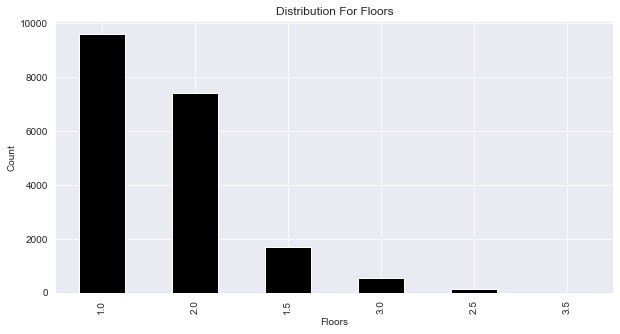

In [120]:
fig=plt.figure(figsize=(10,5))
X['floors'].value_counts().plot.bar(color='black')
plt.title('Distribution For Floors')
plt.ylabel('Count')
plt.xlabel('Floors')

In [121]:
X.groupby('floors')['sqft_above'].mean()

floors
1.0    1349.682730
1.5    1633.261261
2.0    2378.952368
2.5    2692.549815
3.0    1747.873513
3.5    2315.500000
Name: sqft_above, dtype: float64

In [122]:
df['floors'].value_counts(normalize=True)

1.0    0.494147
2.0    0.381298
1.5    0.088373
3.0    0.028363
2.5    0.007449
3.5    0.000370
Name: floors, dtype: float64

Almost 90% of the houses have floors 1 or 2 hence it makes sense to impute the null values in the floor column with either 1 or 2 based on a cutoff 

In [123]:
# Cutoff

In [124]:
((2368.027330 - 1349.777303)/2) + (1349.777303)

1858.9023164999999

In [125]:
X.loc[((X['floors'].isna()) & ((X['sqft_above'])<= 1858.9023164999999)),'floors']= 1.0
X.loc[((X['floors'].isna()) & ((X['sqft_above']) > 1858.9023164999999)),'floors']= 2.0


C:\Users\behab\Anaconda3\lib\site-packages\pandas\core\indexing.py:671: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
C:\Users\behab\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
C:\Users\behab\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


 Floors 3 and 3.5 breaks the general trend and we see that there are way many houses with 3 floors than 3.5 floors
hence we want to impute the rest of the values with 3 floors as there are only 8 houses out of 21,613 houses that have 3.5 floors

In [126]:
X['floors'].isna().sum()

0

The Variable floors has been successfully imputed

# Bedrooms

There is a mistake while recording the data as we can see that the number of bedrooms in 1 of the record is 33 and by the area and other variables it looks like its 3 

Text(0.5, 0, 'Number Of Bedrooms')

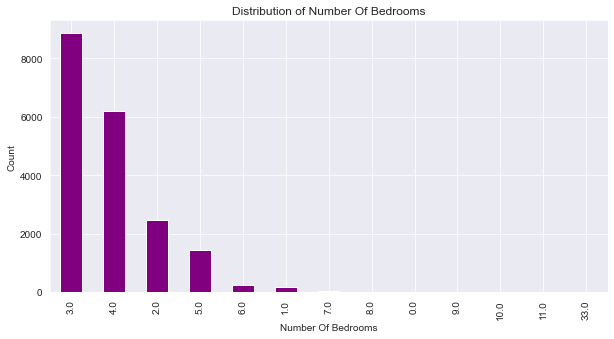

In [127]:
fig=plt.figure(figsize=(10,5))
X['bedrooms'].value_counts().plot.bar(color='purple')
plt.title('Distribution of Number Of Bedrooms')
plt.ylabel('Count')
plt.xlabel('Number Of Bedrooms')

In [128]:
X.loc[(X['bedrooms'] == 33),'bedrooms']= 3.0

C:\Users\behab\Anaconda3\lib\site-packages\pandas\core\indexing.py:671: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
C:\Users\behab\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [129]:
X.groupby('bedrooms')['sqft_living'].mean()

bedrooms
0.0     1977.547826
1.0      918.674468
2.0     1276.184642
3.0     1818.369242
4.0     2532.397204
5.0     3019.008373
6.0     3230.147062
7.0     3590.447076
8.0     3699.622299
9.0     3966.000000
10.0    3706.666667
11.0    3000.000000
Name: sqft_living, dtype: float64

In [130]:
X['bedrooms'].value_counts(normalize=True)

3.0     0.455223
4.0     0.318065
2.0     0.127133
5.0     0.073874
6.0     0.012801
1.0     0.009613
7.0     0.001748
8.0     0.000565
0.0     0.000514
9.0     0.000257
10.0    0.000154
11.0    0.000051
Name: bedrooms, dtype: float64

It can be seen that correlation between the square foot area of the house and that of the number of bedrooms are very highly correlated hence we can make use of the square foot column to impute the bedrooms column

We can see that almost 95% of the houses have bedrooms such as 2, 3 , 4, 5, 6, 7. Hence we will use the ranges of mean square foot values of all these bedrooms to impute the bedrooms column

In [131]:
X.loc[((X['bedrooms'].isna()) & ((X['sqft_living'])<= 1278.056771)),'bedrooms']= 2.0
X.loc[((X['bedrooms'].isna()) & (((((X['sqft_living'])<= 1816.872496)) & (X['sqft_living'] > 1278.056771)))),'bedrooms']= 3.0
X.loc[((X['bedrooms'].isna()) & (((((X['sqft_living'])<= 2533.530047)) & (X['sqft_living'] > 1816.872496)))),'bedrooms']= 4.0
X.loc[((X['bedrooms'].isna()) & (((((X['sqft_living'])<= 3000.203482)) & (X['sqft_living'] > 2533.530047)))),'bedrooms']= 5.0


C:\Users\behab\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
C:\Users\behab\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
C:\Users\behab\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so w

In [132]:
X['bedrooms'].isna().sum()

273

There are still 304 nulls and as the bedrooms 3 and 4 are in almost 80% of the houses hence the house is either going have 3 or 4 bedrooms according to the following cutoff

In [133]:
# Cuttoff

In [134]:
((2533.530047-1816.872496)/2) + (1816.872496)

2175.2012715

In [135]:
X.loc[((X['bedrooms'].isna()) & ((X['sqft_living'])<= 2175.2012715)),'bedrooms']= 3.0
X.loc[((X['bedrooms'].isna()) & ((X['sqft_living']) > 2175.2012715)),'bedrooms']= 4.0

C:\Users\behab\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
C:\Users\behab\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [136]:
X['bedrooms'].isna().sum()

0

The Variable bedrooms has been successfully imputed

# Bathrooms

Text(0.5, 0, 'Number Of Bathrooms')

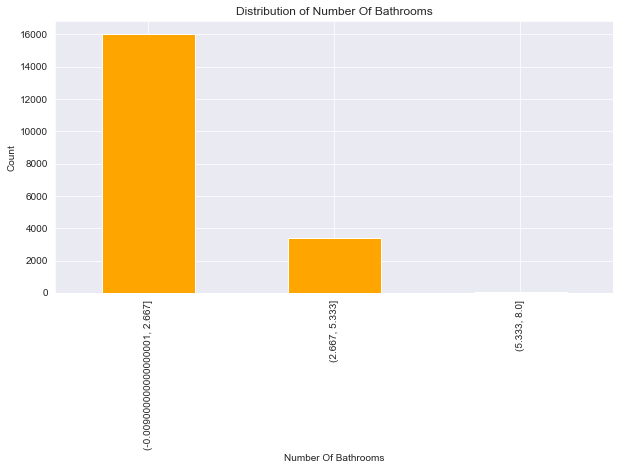

In [137]:
fig=plt.figure(figsize=(10,5))
X['bathrooms'].value_counts(bins=3).plot.bar(color='orange')
plt.title('Distribution of Number Of Bathrooms')
plt.ylabel('Count')
plt.xlabel('Number Of Bathrooms')

In [138]:
X.groupby('bathrooms')['sqft_living'].mean()

bathrooms
0.00     1636.800000
0.50     1312.628217
0.75      947.121324
1.00     1207.162588
1.25     1864.093570
1.50     1558.016005
1.75     1795.356620
2.00     1792.896258
2.25     2093.810654
2.50     2373.770465
2.75     2627.233947
3.00     2709.916817
3.25     3175.179011
3.50     3361.181251
3.75     3779.179064
4.00     4100.745063
4.25     4388.413215
4.50     4245.818483
4.75     5228.333333
5.00     4843.277778
5.25     5006.879433
5.50     6506.000000
5.75     6876.666667
6.00     6443.333333
6.25     8345.000000
6.50     6765.000000
6.75     8560.000000
7.50     4050.000000
7.75     9890.000000
8.00    12795.000000
Name: sqft_living, dtype: float64

In [139]:
X['bathrooms'].value_counts(normalize=True)

2.50    0.251131
1.00    0.177103
1.75    0.140243
2.25    0.094746
2.00    0.088885
1.50    0.066780
2.75    0.054802
3.00    0.034649
3.50    0.034084
3.25    0.027452
3.75    0.006889
4.00    0.006118
4.50    0.004678
4.25    0.003701
0.75    0.003444
4.75    0.001080
5.00    0.000925
5.25    0.000617
0.00    0.000514
5.50    0.000514
1.25    0.000463
6.00    0.000308
0.50    0.000206
5.75    0.000154
8.00    0.000103
6.25    0.000103
6.50    0.000103
6.75    0.000103
7.50    0.000051
7.75    0.000051
Name: bathrooms, dtype: float64

Maximum houses have the bathrooms either 1 or 2.5 hence choosing appropriate values of mean living area to impute the number of bathrooms as the two variables are very highly correlated. We will be selecting an appropriate cuttoff value for the imputation

In [140]:
((2376.896569 - 1209.031391)/2) + 1209.031391

1792.96398

In [141]:
X.loc[((X['bathrooms'].isna()) & ((X['sqft_living'])<= 1792.96398)),'bathrooms']= 1
X.loc[((X['bathrooms'].isna()) & ((X['sqft_living']) > 1792.96398)),'bathrooms']= 2.5

#X.loc[((X['bathrooms'].isna()) & (((((X['sqft_living'])<= 1822.186282)) & (X['sqft_living'] > 2061.443682)))),'bathrooms']= 3.0
#X.loc[((X['bathrooms'].isna()) & (((((X['sqft_living'])<= 2530.850591)) & (X['sqft_living'] > 1822.186282)))),'bathrooms']= 4.0
#X.loc[((X['bathrooms'].isna()) & (((((X['sqft_living'])<= 3003.129655)) & (X['sqft_living'] > 2530.850591)))),'bathrooms']= 5.0


C:\Users\behab\Anaconda3\lib\site-packages\pandas\core\indexing.py:671: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
C:\Users\behab\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
C:\Users\behab\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [142]:
X['bathrooms'].isna().sum()

0

In [143]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 15 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   bedrooms       21613 non-null  float64
 1   bathrooms      21613 non-null  float64
 2   sqft_living    21613 non-null  float64
 3   sqft_lot       21613 non-null  float64
 4   floors         21613 non-null  float64
 5   waterfront     19452 non-null  float64
 6   view           19452 non-null  float64
 7   condition      19452 non-null  float64
 8   grade          19452 non-null  float64
 9   sqft_above     21613 non-null  float64
 10  sqft_basement  21613 non-null  float64
 11  yr_built       19452 non-null  float64
 12  yr_renovated   19452 non-null  float64
 13  sqft_living15  21613 non-null  float64
 14  sqft_lot15     21613 non-null  float64
dtypes: float64(15)
memory usage: 2.5 MB


# Waterfront

Text(0.5, 0, 'Waterfront')

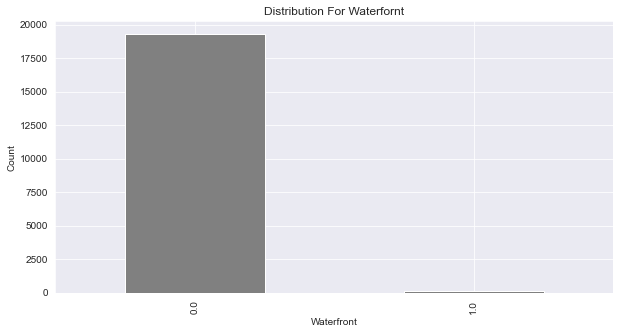

In [144]:
fig=plt.figure(figsize=(10,5))
X['waterfront'].value_counts().plot.bar(color='gray')
plt.title('Distribution For Waterfornt')
plt.ylabel('Count')
plt.xlabel('Waterfront')

In [145]:
X['waterfront'].value_counts(normalize=True)

0.0    0.99234
1.0    0.00766
Name: waterfront, dtype: float64

99% of the houses do not have waterfront hence we would impute it with 0 (The Mode)

In [146]:
X['waterfront'].mode()

0    0.0
dtype: float64

In [147]:
X.loc[(X['waterfront'].isna()),'waterfront']= 0

C:\Users\behab\Anaconda3\lib\site-packages\pandas\core\indexing.py:671: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
C:\Users\behab\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [148]:
X['waterfront'].isna().sum()

0

# View

Text(0.5, 0, 'Views Type')

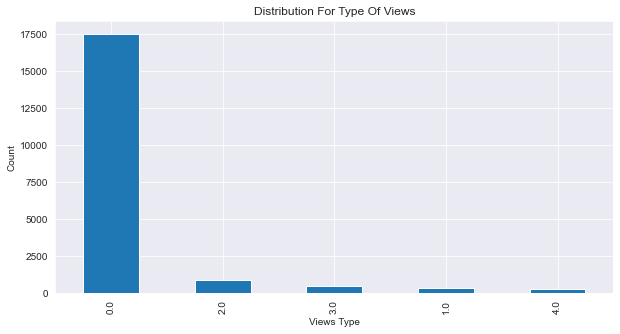

In [149]:
fig=plt.figure(figsize=(10,5))
X['view'].value_counts().plot.bar()
plt.title('Distribution For Type Of Views')
plt.ylabel('Count')
plt.xlabel('Views Type')

In [150]:
X.groupby('view')['sqft_living'].mean()

view
0.0    1995.300476
1.0    2555.469071
2.0    2652.534937
3.0    2990.136946
4.0    3346.935324
Name: sqft_living, dtype: float64

In [151]:
X['view'].value_counts(normalize=True)

0.0    0.901295
2.0    0.044725
3.0    0.023597
1.0    0.015525
4.0    0.014857
Name: view, dtype: float64

In [152]:
X.loc[(X['view'].isna()),'view']= 0

C:\Users\behab\Anaconda3\lib\site-packages\pandas\core\indexing.py:671: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
C:\Users\behab\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [153]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 15 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   bedrooms       21613 non-null  float64
 1   bathrooms      21613 non-null  float64
 2   sqft_living    21613 non-null  float64
 3   sqft_lot       21613 non-null  float64
 4   floors         21613 non-null  float64
 5   waterfront     21613 non-null  float64
 6   view           21613 non-null  float64
 7   condition      19452 non-null  float64
 8   grade          19452 non-null  float64
 9   sqft_above     21613 non-null  float64
 10  sqft_basement  21613 non-null  float64
 11  yr_built       19452 non-null  float64
 12  yr_renovated   19452 non-null  float64
 13  sqft_living15  21613 non-null  float64
 14  sqft_lot15     21613 non-null  float64
dtypes: float64(15)
memory usage: 2.5 MB


In [154]:
X['view'].isnull().sum()

0

# Condition

Text(0.5, 0, 'Condition Type')

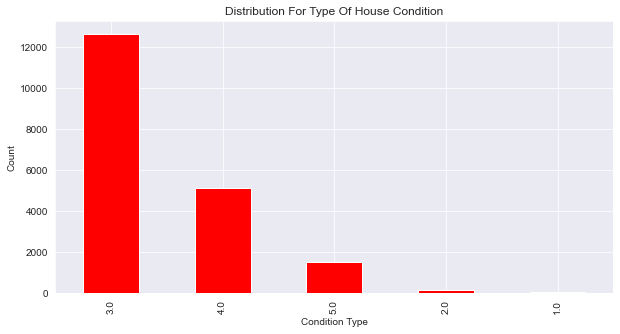

In [155]:
fig=plt.figure(figsize=(10,5))
X['condition'].value_counts().plot.bar(color='red')
plt.title('Distribution For Type Of House Condition')
plt.ylabel('Count')
plt.xlabel('Condition Type')

In [156]:
X['condition'].value_counts(normalize=True)

3.0    0.649702
4.0    0.262955
5.0    0.078090
2.0    0.007814
1.0    0.001439
Name: condition, dtype: float64

In [157]:
X.groupby('condition')['yr_built'].max()

condition
1.0    1966.0
2.0    1995.0
3.0    2015.0
4.0    2009.0
5.0    2005.0
Name: yr_built, dtype: float64

In [158]:
X.loc[((X['condition'].isna()) & ((X['yr_built']) >= 2000 )),'bathrooms']= 3

C:\Users\behab\Anaconda3\lib\site-packages\pandas\core\indexing.py:671: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
C:\Users\behab\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [159]:
X['condition']

0        3.0
1        3.0
2        3.0
3        5.0
4        3.0
        ... 
21608    3.0
21609    3.0
21610    3.0
21611    NaN
21612    3.0
Name: condition, Length: 21613, dtype: float64

In [160]:
X.loc[(X['condition'].isna()),'condition']= 3

C:\Users\behab\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [161]:
X['condition'].isna().sum()

0

# Grade

Text(0.5, 0, 'House Construction Quality(House Grade)')

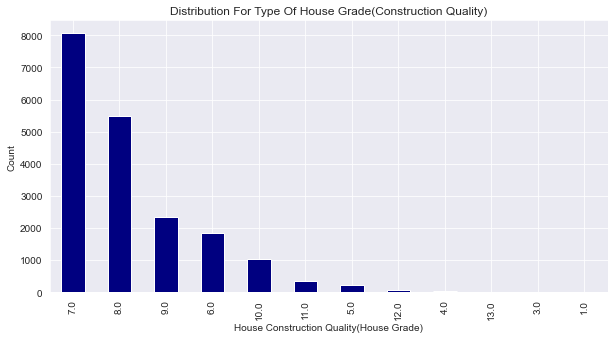

In [162]:
fig=plt.figure(figsize=(10,5))
X['grade'].value_counts().plot.bar(color='navy')
plt.title('Distribution For Type Of House Grade(Construction Quality)')
plt.ylabel('Count')
plt.xlabel('House Construction Quality(House Grade)')

In [163]:
X['grade'].value_counts(normalize=True)

7.0     0.414559
8.0     0.281976
9.0     0.120193
6.0     0.094797
10.0    0.052488
11.0    0.018301
5.0     0.011104
12.0    0.004267
4.0     0.001439
13.0    0.000668
3.0     0.000154
1.0     0.000051
Name: grade, dtype: float64

In [164]:
X.groupby('grade')['sqft_living'].mean()

grade
1.0      290.000000
3.0      596.666667
4.0      661.478261
5.0      971.735751
6.0     1190.512867
7.0     1685.845294
8.0     2181.810443
9.0     2865.151544
10.0    3531.699566
11.0    4392.553191
12.0    5491.527027
13.0    7483.076923
Name: sqft_living, dtype: float64

In [165]:
X.loc[(X['grade'].isna()),'grade']= 7

C:\Users\behab\Anaconda3\lib\site-packages\pandas\core\indexing.py:671: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
C:\Users\behab\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [166]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 15 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   bedrooms       21613 non-null  float64
 1   bathrooms      21613 non-null  float64
 2   sqft_living    21613 non-null  float64
 3   sqft_lot       21613 non-null  float64
 4   floors         21613 non-null  float64
 5   waterfront     21613 non-null  float64
 6   view           21613 non-null  float64
 7   condition      21613 non-null  float64
 8   grade          21613 non-null  float64
 9   sqft_above     21613 non-null  float64
 10  sqft_basement  21613 non-null  float64
 11  yr_built       19452 non-null  float64
 12  yr_renovated   19452 non-null  float64
 13  sqft_living15  21613 non-null  float64
 14  sqft_lot15     21613 non-null  float64
dtypes: float64(15)
memory usage: 2.5 MB


In [167]:
X['grade'].isna().sum()

0

# yr_renovated

Text(0.5, 0, 'Renovation Status')

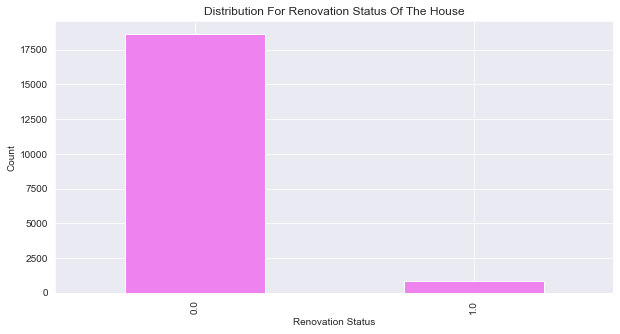

In [168]:
fig=plt.figure(figsize=(10,5))
X['yr_renovated'].value_counts().plot.bar(color='violet')
plt.title('Distribution For Renovation Status Of The House')
plt.ylabel('Count')
plt.xlabel('Renovation Status')

In [169]:
X['yr_renovated'].value_counts()

0.0    18629
1.0      823
Name: yr_renovated, dtype: int64

 Almost all the houses in our dataset have never been renovated hence we will impute this column by the mode that is 0

In [170]:
X.loc[(X['yr_renovated'].isna()),'yr_renovated']= 0

C:\Users\behab\Anaconda3\lib\site-packages\pandas\core\indexing.py:671: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
C:\Users\behab\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [171]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 15 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   bedrooms       21613 non-null  float64
 1   bathrooms      21613 non-null  float64
 2   sqft_living    21613 non-null  float64
 3   sqft_lot       21613 non-null  float64
 4   floors         21613 non-null  float64
 5   waterfront     21613 non-null  float64
 6   view           21613 non-null  float64
 7   condition      21613 non-null  float64
 8   grade          21613 non-null  float64
 9   sqft_above     21613 non-null  float64
 10  sqft_basement  21613 non-null  float64
 11  yr_built       19452 non-null  float64
 12  yr_renovated   21613 non-null  float64
 13  sqft_living15  21613 non-null  float64
 14  sqft_lot15     21613 non-null  float64
dtypes: float64(15)
memory usage: 2.5 MB


In [172]:
X['yr_renovated'].isna().sum()

0

# yr_built

Text(0, 0.5, 'Count')

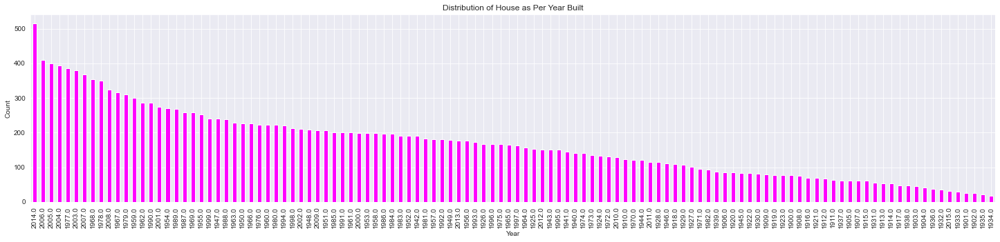

In [173]:
fig=plt.figure(figsize=(25,5))
X['yr_built'].value_counts().plot.bar(color='magenta')
plt.title('Distribution of House as Per Year Built')
plt.xlabel('Year')
plt.ylabel('Count')

In [174]:
X.groupby('condition')['yr_built'].mean()

condition
1.0    1930.739130
2.0    1947.121429
3.0    1978.225130
4.0    1958.145411
5.0    1946.803412
Name: yr_built, dtype: float64

In [175]:
X['yr_built'].value_counts(bins=11)

(2004.545, 2015.0]      2829
(1983.636, 1994.091]    2420
(1994.091, 2004.545]    2393
(1952.273, 1962.727]    2285
(1973.182, 1983.636]    2268
(1962.727, 1973.182]    2189
(1941.818, 1952.273]    1911
(1920.909, 1931.364]    1146
(1899.884, 1910.455]     700
(1910.455, 1920.909]     688
(1931.364, 1941.818]     623
Name: yr_built, dtype: int64

In [176]:
X['yr_built'].median()

1975.0

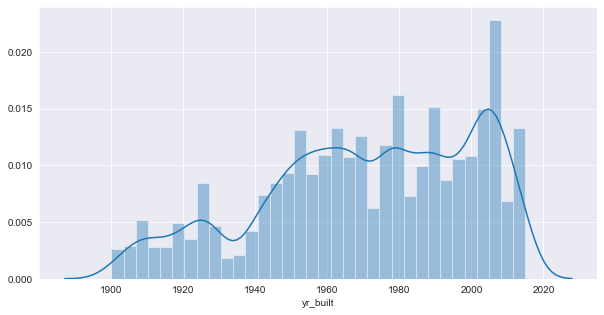

In [177]:
fig = plt.figure(figsize=(10,5))
sns.distplot(X['yr_built'])

In [178]:
X.loc[(X['yr_built'].isna()),'yr_built']= 1975

C:\Users\behab\Anaconda3\lib\site-packages\pandas\core\indexing.py:671: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
C:\Users\behab\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [179]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 15 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   bedrooms       21613 non-null  float64
 1   bathrooms      21613 non-null  float64
 2   sqft_living    21613 non-null  float64
 3   sqft_lot       21613 non-null  float64
 4   floors         21613 non-null  float64
 5   waterfront     21613 non-null  float64
 6   view           21613 non-null  float64
 7   condition      21613 non-null  float64
 8   grade          21613 non-null  float64
 9   sqft_above     21613 non-null  float64
 10  sqft_basement  21613 non-null  float64
 11  yr_built       21613 non-null  float64
 12  yr_renovated   21613 non-null  float64
 13  sqft_living15  21613 non-null  float64
 14  sqft_lot15     21613 non-null  float64
dtypes: float64(15)
memory usage: 2.5 MB


In [180]:
X.isna().sum().sum()

0

 The Dataset has finally been imputed

# Checking Whether The Predictors Or The Response variable Has any suspecious or unexplained values

In [181]:
X.columns

Index(['bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors',
       'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'sqft_living15',
       'sqft_lot15'],
      dtype='object')

In [182]:
X['bedrooms'].unique()

array([ 3.,  2.,  4.,  5.,  1.,  6.,  0.,  7.,  8.,  9., 11., 10.])

In [183]:
X['bedrooms'].value_counts()

3.0     9459
4.0     7123
2.0     2863
5.0     1668
6.0      249
1.0      187
7.0       34
8.0       11
0.0       10
9.0        5
10.0       3
11.0       1
Name: bedrooms, dtype: int64

Text(0.5, 0, 'Number Of Bedrooms')

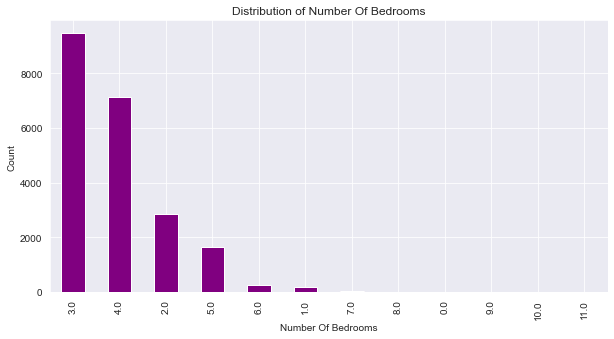

In [184]:
fig=plt.figure(figsize=(10,5))
X['bedrooms'].value_counts().plot.bar(color='purple')
plt.title('Distribution of Number Of Bedrooms')
plt.ylabel('Count')
plt.xlabel('Number Of Bedrooms')

The Bedrooms columns looks perfectly fine with all the understandable values

In [185]:
X['bathrooms'].unique()

array([1.  , 2.25, 3.  , 2.  , 4.5 , 1.5 , 2.5 , 1.75, 2.75, 3.25, 4.  ,
       3.5 , 0.75, 4.75, 5.  , 4.25, 3.75, 0.  , 1.25, 5.25, 6.  , 0.5 ,
       5.5 , 6.75, 8.  , 7.5 , 7.75, 6.25, 5.75, 6.5 ])

In [186]:
X['bathrooms'].value_counts(bins=3)

(-0.009000000000000001, 2.667]    17865
(2.667, 5.333]                     3720
(5.333, 8.0]                         28
Name: bathrooms, dtype: int64

Text(0.5, 0, 'Number Of Bathrooms')

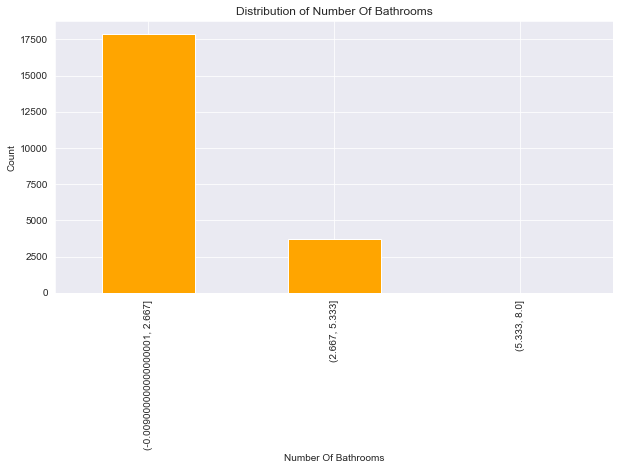

In [187]:
fig=plt.figure(figsize=(10,5))
X['bathrooms'].value_counts(bins=3).plot.bar(color='orange')
plt.title('Distribution of Number Of Bathrooms')
plt.ylabel('Count')
plt.xlabel('Number Of Bathrooms')

The Bathrooms column looks perfectly fine with all the understandable or comprehendible values

In [188]:
X['sqft_living'].unique()

array([1180., 2570.,  770., ..., 3087., 3118., 1425.])

In [189]:
X['sqft_living'].value_counts(bins=3)

(276.749, 4706.667]     21344
(4706.667, 9123.333]      263
(9123.333, 13540.0]         6
Name: sqft_living, dtype: int64

Text(0.5, 0, 'Square Foot Area Of the Houes(Millions)')

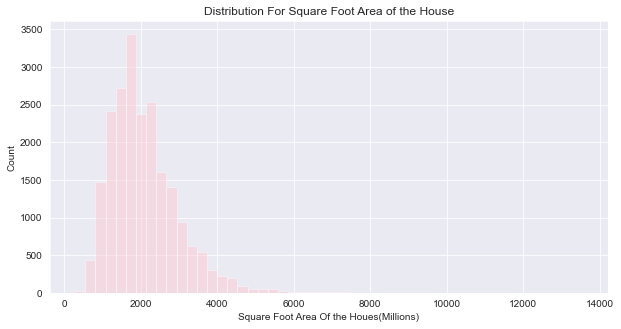

In [190]:
fig=plt.figure(figsize=(10,5))
sns.distplot(X['sqft_living'],color='pink',kde=False)
plt.title('Distribution For Square Foot Area of the House')
plt.ylabel('Count')
plt.xlabel('Square Foot Area Of the Houes(Millions)')


The Sqft_living column looks perfectly fine with all the understandable or comprehendible values

In [191]:
X['sqft_lot'].unique()

array([ 5650.,  7242., 10000., ...,  5813.,  2388.,  1076.])

In [192]:
X['sqft_lot'].value_counts(bins=20)

(-1130.84, 83061.95]       21138
(83061.95, 165603.9]         206
(165603.9, 248145.85]        174
(248145.85, 330687.8]         46
(413229.75, 495771.7]         17
(330687.8, 413229.75]         13
(495771.7, 578313.65]          7
(908481.45, 991023.4]          3
(825939.5, 908481.45]          3
(578313.65, 660855.6]          2
(660855.6, 743397.55]          1
(1568817.05, 1651359.0]        1
(991023.4, 1073565.35]         1
(1073565.35, 1156107.3]        1
(1486275.1, 1568817.05]        0
(1156107.3, 1238649.25]        0
(1238649.25, 1321191.2]        0
(1321191.2, 1403733.15]        0
(1403733.15, 1486275.1]        0
(743397.55, 825939.5]          0
Name: sqft_lot, dtype: int64

Text(0.5, 0, 'Square Foot Of the Land(Millions)')

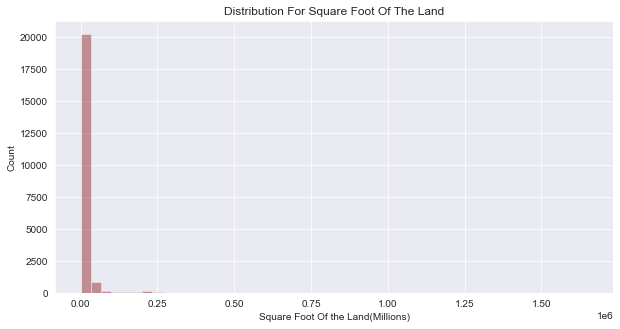

In [193]:
fig=plt.figure(figsize=(10,5))
sns.distplot(X['sqft_lot'],color='maroon',bins=50,kde=False)
plt.title('Distribution For Square Foot Of The Land')
plt.ylabel('Count')
plt.xlabel('Square Foot Of the Land(Millions)')

The sqft_lot column looks perfectly fine with all the understandable or comprehendible values

In [194]:
X['floors'].unique()

array([1. , 2. , 1.5, 3. , 2.5, 3.5])

In [195]:
X['floors'].value_counts()

1.0    10974
2.0     8226
1.5     1718
3.0      544
2.5      143
3.5        8
Name: floors, dtype: int64

Text(0.5, 0, 'Floors')

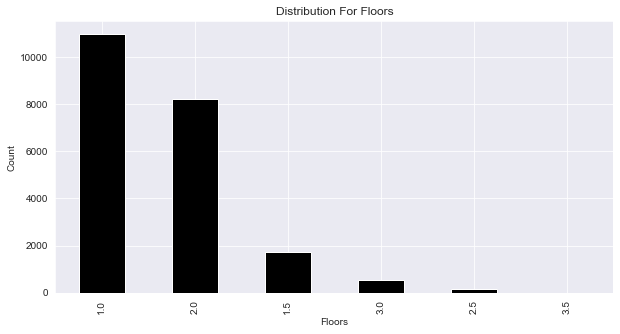

In [196]:
fig=plt.figure(figsize=(10,5))
X['floors'].value_counts().plot.bar(color='black')
plt.title('Distribution For Floors')
plt.ylabel('Count')
plt.xlabel('Floors')

The floors column looks perfectly fine with all the understandable or comprehendible values

In [197]:
X['waterfront'].unique()

array([0., 1.])

In [198]:
X['waterfront'].value_counts()

0.0    21464
1.0      149
Name: waterfront, dtype: int64

Text(0.5, 0, 'Waterfront')

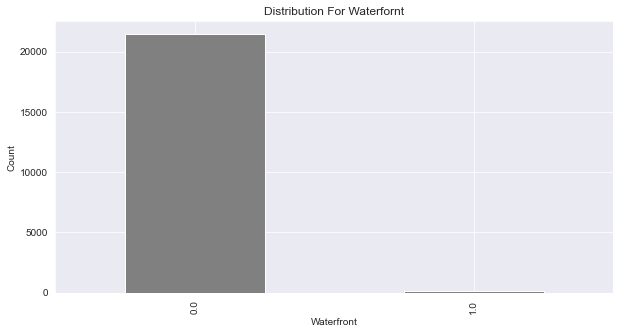

In [199]:
fig=plt.figure(figsize=(10,5))
X['waterfront'].value_counts().plot.bar(color='gray')
plt.title('Distribution For Waterfornt')
plt.ylabel('Count')
plt.xlabel('Waterfront')

The Waterfront column looks perfectly fine with all the understandable or comprehendible values

In [200]:
X.columns

Index(['bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors',
       'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'sqft_living15',
       'sqft_lot15'],
      dtype='object')

In [201]:
X['view'].unique()

array([0., 3., 4., 2., 1.])

Text(0.5, 0, 'Views Type')

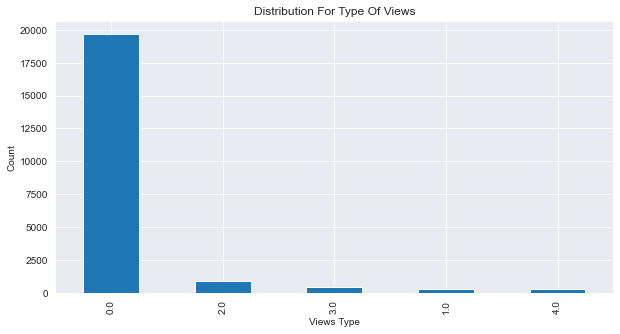

In [202]:
fig=plt.figure(figsize=(10,5))
X['view'].value_counts().plot.bar()
plt.title('Distribution For Type Of Views')
plt.ylabel('Count')
plt.xlabel('Views Type')

The Views column looks perfectly fine with all the understandable or comprehendible values

In [203]:
X['condition'].unique()

array([3., 5., 4., 1., 2.])

In [204]:
X['condition'].value_counts()

3.0    14799
4.0     5115
5.0     1519
2.0      152
1.0       28
Name: condition, dtype: int64

Text(0.5, 0, 'Condition Type')

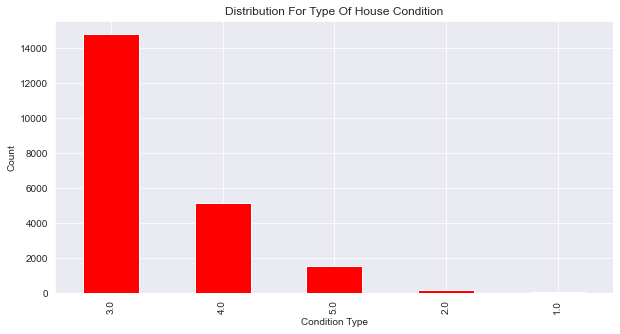

In [205]:
fig=plt.figure(figsize=(10,5))
X['condition'].value_counts().plot.bar(color='red')
plt.title('Distribution For Type Of House Condition')
plt.ylabel('Count')
plt.xlabel('Condition Type')

The Condition column looks perfectly fine with all the understandable or comprehendible values

In [206]:
X['grade'].unique()

array([ 7.,  6.,  8., 11.,  9.,  5., 10., 12.,  4.,  3., 13.,  1.])

In [207]:
X['grade'].value_counts()

7.0     10225
8.0      5485
9.0      2338
6.0      1844
10.0     1021
11.0      356
5.0       216
12.0       83
4.0        28
13.0       13
3.0         3
1.0         1
Name: grade, dtype: int64

Text(0.5, 0, 'House Construction Quality(House Grade)')

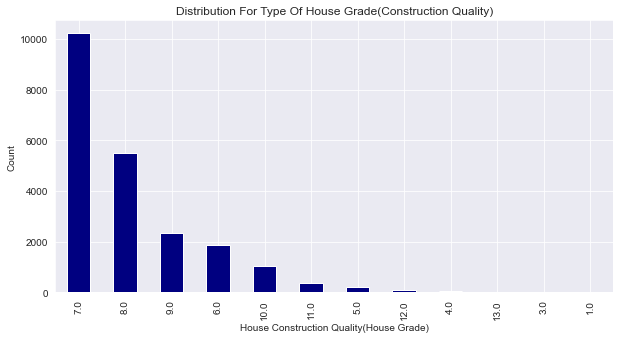

In [208]:
fig=plt.figure(figsize=(10,5))
X['grade'].value_counts().plot.bar(color='navy')
plt.title('Distribution For Type Of House Grade(Construction Quality)')
plt.ylabel('Count')
plt.xlabel('House Construction Quality(House Grade)')

The Grade column looks perfectly fine with all the understandable or comprehendible values

In [209]:
X['sqft_above'].unique()

array([1180.        , 2170.        ,  770.        , 1050.        ,
       1680.        , 3890.        , 1715.        , 1060.        ,
       1409.5195984 , 1890.        , 1860.        ,  860.        ,
       1430.        , 1370.        , 1810.        , 1980.        ,
       1600.        , 1200.        , 1250.        , 2330.        ,
       2270.        , 1070.        , 2450.        , 1710.        ,
       1750.        , 1400.        ,  790.        , 2570.        ,
       2320.        , 1190.        , 1090.        , 1510.        ,
        927.59677419, 2360.        ,  890.        , 2620.        ,
       2600.        , 3595.        , 1570.        ,  920.        ,
       3160.        ,  990.        , 2290.        , 2165.        ,
       1640.        , 2130.        , 2830.        , 2250.        ,
       2420.        , 3250.        , 1850.        , 1590.        ,
       1260.        , 2519.        , 1540.        , 1110.        ,
       1770.        , 2720.        , 2240.        , 1000.     

In [210]:
X['sqft_above'].value_counts(bins=5)

(281.42900000000003, 2004.0]    15102
(2004.0, 3718.0]                 5888
(3718.0, 5432.0]                  579
(5432.0, 7146.0]                   37
(7146.0, 8860.0]                    7
Name: sqft_above, dtype: int64

Text(0.5, 0, 'interior housing space(sqft_above)')

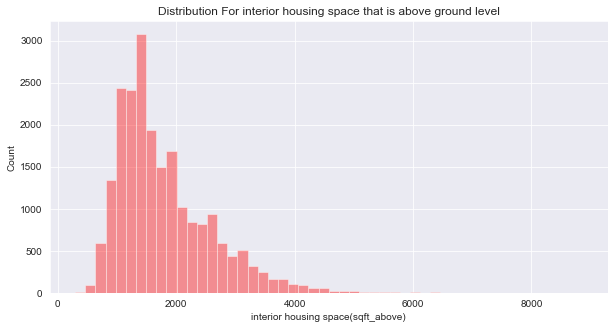

In [211]:
fig=plt.figure(figsize=(10,5))
sns.distplot(X['sqft_above'],color='red',kde=False)
plt.title('Distribution For interior housing space that is above ground level')
plt.ylabel('Count')
plt.xlabel('interior housing space(sqft_above)')

The sqft_above column looks perfectly fine with all the understandable or comprehendible values

In [212]:
X['sqft_basement'].unique()

array([   0.        ,  400.        ,  910.        , 1530.        ,
        730.        , 1700.        ,  300.        ,  221.6075154 ,
        970.        ,  358.45398994,  720.        ,  700.        ,
        133.28366248,  780.        ,  790.        ,  330.        ,
       1620.        ,  360.        ,  588.        , 1510.        ,
        410.        ,  990.        ,  600.        ,  560.        ,
        550.        , 1000.        , 1600.        ,  500.        ,
       1040.        ,  880.        , 1010.        ,  240.        ,
        265.        ,  637.32461538,  290.        ,  800.        ,
        540.        ,  380.        ,  710.        ,  840.        ,
        770.        ,  480.        ,  570.        , 1490.        ,
        620.        , 1250.        , 1270.        ,  650.        ,
        180.        , 1130.        ,  450.        , 1640.        ,
       1460.        , 1020.        , 1030.        ,  750.        ,
        640.        , 1070.        ,  490.        , 1310.     

In [213]:
X['sqft_basement'].value_counts(bins=5)

(-4.821000000000001, 964.0]    19665
(964.0, 1928.0]                 1867
(1928.0, 2892.0]                  75
(2892.0, 3856.0]                   4
(3856.0, 4820.0]                   2
Name: sqft_basement, dtype: int64

Text(0.5, 0, 'interior housing space Below Ground(sqft_basement)')

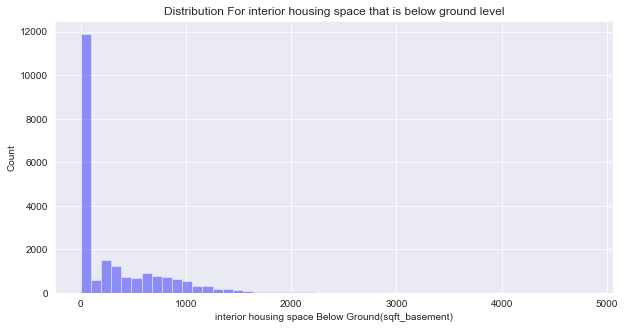

In [214]:
fig=plt.figure(figsize=(10,5))
sns.distplot(X['sqft_basement'],color='blue',kde=False)
plt.title('Distribution For interior housing space that is below ground level')
plt.ylabel('Count')
plt.xlabel('interior housing space Below Ground(sqft_basement)')

The sqft_basement column looks perfectly fine with all the understandable or comprehendible values

In [215]:
X['yr_built'].unique()

array([1955., 1951., 1933., 1965., 1987., 2001., 1995., 1963., 1960.,
       2003., 1942., 1927., 1975., 1900., 1979., 1994., 1921., 1969.,
       1947., 1968., 1985., 1941., 1915., 1909., 2005., 1929., 1981.,
       1930., 1904., 1996., 2000., 1984., 2014., 1922., 1959., 1966.,
       1953., 1950., 2008., 1991., 1954., 1973., 1925., 1989., 1972.,
       1986., 1956., 2002., 1992., 1948., 1964., 1952., 1961., 2006.,
       1988., 1962., 1939., 1946., 1967., 1980., 1910., 1978., 1905.,
       1971., 2010., 1945., 1924., 1990., 1914., 1926., 2004., 1923.,
       2007., 1916., 1976., 1949., 1999., 1993., 1901., 1977., 1920.,
       1997., 1943., 1983., 1957., 1940., 1918., 1928., 1974., 1911.,
       1937., 1982., 1908., 1931., 1998., 1913., 2013., 1907., 1958.,
       2012., 1912., 2011., 1917., 1932., 1944., 1902., 2009., 1903.,
       1970., 2015., 1938., 1919., 1906., 1936., 1935., 1934.])

In [216]:
X['yr_built'].value_counts()

1975.0    2327
2014.0     515
2006.0     410
2005.0     400
2004.0     394
          ... 
1933.0      29
1901.0      25
1902.0      25
1935.0      21
1934.0      17
Name: yr_built, Length: 116, dtype: int64

Text(0, 0.5, 'Count')

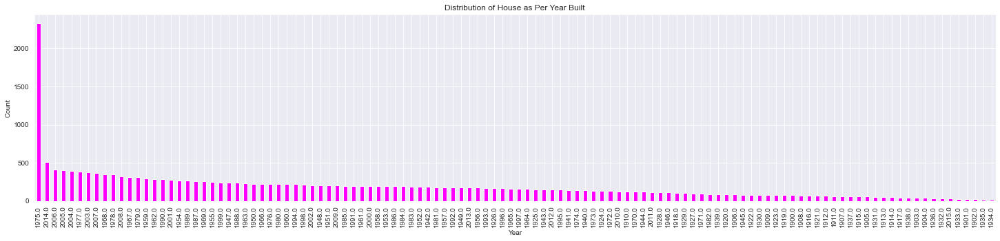

In [217]:
fig=plt.figure(figsize=(25,5))
X['yr_built'].value_counts().plot.bar(color='magenta')
plt.title('Distribution of House as Per Year Built')
plt.xlabel('Year')
plt.ylabel('Count')

The Year Built column looks perfectly fine with all the understandable or comprehendible values

In [218]:
X['yr_renovated'].unique()

array([0., 1.])

In [219]:
X['yr_renovated'].value_counts()

0.0    20790
1.0      823
Name: yr_renovated, dtype: int64

Text(0.5, 0, 'Renovation Status')

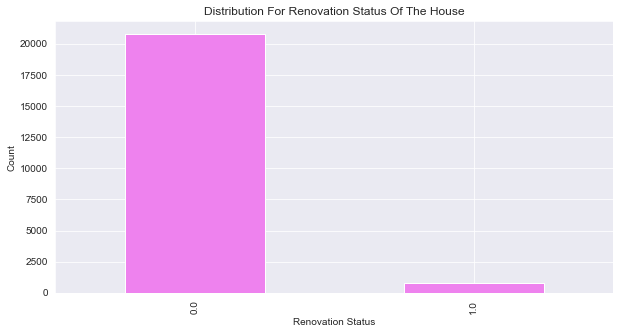

In [220]:
fig=plt.figure(figsize=(10,5))
X['yr_renovated'].value_counts().plot.bar(color='violet')
plt.title('Distribution For Renovation Status Of The House')
plt.ylabel('Count')
plt.xlabel('Renovation Status')

The yr_renovated column looks perfectly fine with all the understandable or comprehendible values

In [221]:
X['sqft_living15'].unique()

array([1677.11642038, 1690.        , 2720.        , 1360.        ,
       1800.        , 4760.        , 2238.        , 1650.        ,
       2390.        , 2210.        , 1330.        , 1370.        ,
       2140.        , 1890.        , 1610.        , 1060.        ,
       1280.        , 1400.        , 4110.        , 2240.        ,
       1220.        , 2200.        , 1030.        , 1760.        ,
       1860.        , 1520.        , 2630.        , 2580.        ,
       1390.        , 1460.        , 1570.        , 2020.        ,
       1590.        , 2160.        , 1730.        , 1290.        ,
       2620.        , 2470.        , 2410.        , 3625.        ,
       1580.        , 1340.        , 3050.        , 1228.        ,
       2680.        ,  970.        , 1190.        , 1990.        ,
       1410.        , 1480.        , 2065.35523655, 1950.        ,
       2250.        , 2690.        , 2960.        , 2270.        ,
       2570.        , 1440.        , 2750.        , 2221.     

In [222]:
X['sqft_living15'].value_counts(bins=5)

(1561.2, 2723.4]                12370
(393.18800000000005, 1561.2]     6310
(2723.4, 3885.6]                 2614
(3885.6, 5047.8]                  300
(5047.8, 6210.0]                   19
Name: sqft_living15, dtype: int64

Text(0, 0.5, 'Count')

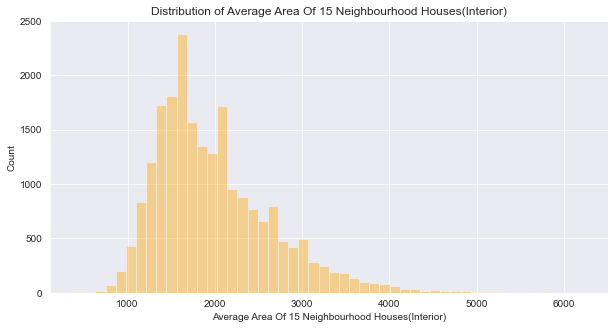

In [223]:
fig = plt.figure(figsize=(10,5))
sns.distplot(X['sqft_living15'],color='orange',kde=False)
plt.title('Distribution of Average Area Of 15 Neighbourhood Houses(Interior)')
plt.xlabel('Average Area Of 15 Neighbourhood Houses(Interior)')
plt.ylabel('Count')

The sqft_living15 column looks perfectly fine with all the understandable or comprehendible values

In [224]:
X['sqft_lot15'].unique()

array([5650., 7639., 8062., ..., 5731., 1509., 2007.])

In [225]:
X['sqft_lot15'].value_counts(bins=5)

(-219.55, 174760.8]     21429
(174760.8, 348870.6]      170
(348870.6, 522980.4]       11
(697090.2, 871200.0]        2
(522980.4, 697090.2]        1
Name: sqft_lot15, dtype: int64

Text(0, 0.5, 'Count')

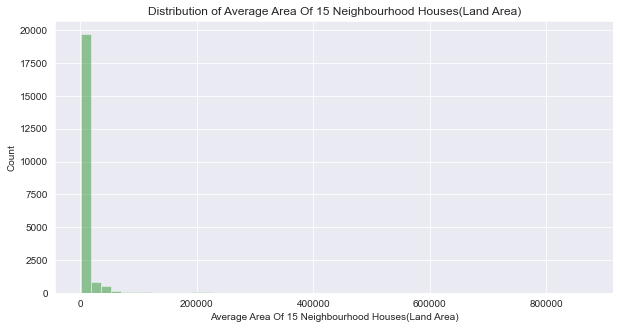

In [226]:
fig = plt.figure(figsize=(10,5))
sns.distplot(X['sqft_lot15'],color='green',kde=False)
plt.title('Distribution of Average Area Of 15 Neighbourhood Houses(Land Area)')
plt.xlabel('Average Area Of 15 Neighbourhood Houses(Land Area)')
plt.ylabel('Count')

The sqft_lot15 column looks perfectly fine with all the understandable or comprehendible values

In [227]:
y.value_counts(bins=5)

(67374.999, 1600000.0]    21187
(1600000.0, 3125000.0]      388
(3125000.0, 4650000.0]       30
(4650000.0, 6175000.0]        5
(6175000.0, 7700000.0]        3
Name: price, dtype: int64

Text(0, 0.5, 'Count')

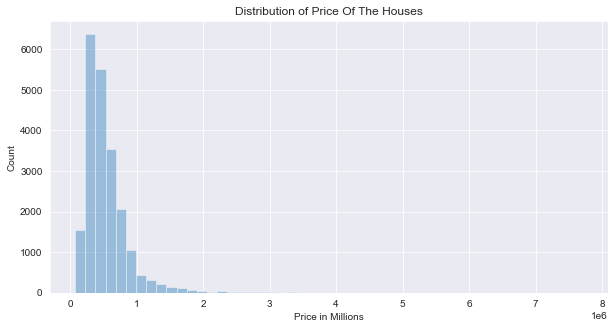

In [228]:
fig = plt.figure(figsize=(10,5))
sns.distplot(y,kde=False)
plt.title('Distribution of Price Of The Houses')
plt.xlabel('Price in Millions')
plt.ylabel('Count')

In [229]:
X.head()

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,sqft_living15,sqft_lot15
0,3.0,1.00,1180.000000,5650.0,1.0,0.0,0.0,3.0,7.0,1180.0,0.0,1955.0,0.0,1677.11642,5650.0
1,3.0,2.25,2570.000000,7242.0,2.0,0.0,0.0,3.0,7.0,2170.0,400.0,1951.0,1.0,1690.00000,7639.0
2,2.0,1.00,770.000000,10000.0,1.0,0.0,0.0,3.0,6.0,770.0,0.0,1933.0,0.0,2720.00000,8062.0
3,4.0,3.00,1960.000000,5000.0,1.0,0.0,0.0,5.0,7.0,1050.0,910.0,1965.0,0.0,1360.00000,5000.0
4,3.0,2.00,2181.810443,8080.0,1.0,0.0,0.0,3.0,8.0,1680.0,0.0,1987.0,0.0,1800.00000,7503.0


In [230]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 15 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   bedrooms       21613 non-null  float64
 1   bathrooms      21613 non-null  float64
 2   sqft_living    21613 non-null  float64
 3   sqft_lot       21613 non-null  float64
 4   floors         21613 non-null  float64
 5   waterfront     21613 non-null  float64
 6   view           21613 non-null  float64
 7   condition      21613 non-null  float64
 8   grade          21613 non-null  float64
 9   sqft_above     21613 non-null  float64
 10  sqft_basement  21613 non-null  float64
 11  yr_built       21613 non-null  float64
 12  yr_renovated   21613 non-null  float64
 13  sqft_living15  21613 non-null  float64
 14  sqft_lot15     21613 non-null  float64
dtypes: float64(15)
memory usage: 2.5 MB


In [231]:
X.describe()

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,sqft_living15,sqft_lot15
count,21613.000000,21613.000000,21613.000000,2.161300e+04,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000
mean,3.378892,2.095093,2077.623664,1.417626e+04,1.481539,0.006894,0.211678,3.367603,7.590524,1787.810057,291.017470,1971.378198,0.038079,1985.984805,12232.938463
std,0.908661,0.776276,900.450808,3.847108e+04,0.535248,0.082745,0.731632,0.628404,1.133593,808.387435,421.388736,27.897114,0.191391,670.136780,26279.726701
min,0.000000,0.000000,290.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,1.000000,290.000000,0.000000,1900.000000,0.000000,399.000000,651.000000
25%,3.000000,1.500000,1450.000000,5.314000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1210.000000,0.000000,1954.000000,0.000000,1510.000000,5333.000000
50%,3.000000,2.250000,1909.500000,7.605000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1560.000000,0.000000,1975.000000,0.000000,1830.000000,7615.000000
75%,4.000000,2.500000,2520.000000,1.012500e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2190.000000,510.000000,1994.000000,0.000000,2340.000000,9724.000000
max,11.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,8860.000000,4820.000000,2015.000000,1.000000,6210.000000,871200.000000


In [232]:
y.head()

0    221900.0
1    538000.0
2    180000.0
3    604000.0
4    510000.0
Name: price, dtype: float64

# Train-Test Split

Splitting The Data Into Train and Test For Model Evaluation Purposes

For this Case we take 75% of the data as training data and 25% of the data as testing data

In [233]:
X_train  , X_test , y_train , y_test = train_test_split(X,y,random_state = 0)

In [234]:
X_train.shape

(16209, 15)

In [235]:
X_test.shape

(5404, 15)

In [236]:
y_test.shape

(5404,)

In [237]:
y_train.shape

(16209,)

# Data Scaling

Scaling for better Predictive Accuracy as the variables have different ranges

What Type of Scaling to use?

MinMax Scaling is the scaling type that has been chosen for this project because as we have witnessed before the distribution of the variables in our dataset is highly skewed and applying Standard Scaler would only have made sense if the variables were normally distributed to start with as it normalizes the variable with mean 0 and SD 1. As the distribution of variable is not normal hence applying Min Max scaling makes more sense here as it dosen't assume any distribution of variables and dose not distort it either as it only just scales the variables between 0 and 1.

In [238]:
scaler = MinMaxScaler()

In [239]:
X_trn = scaler.fit_transform(X_train)
X_tst = scaler.transform(X_test)

In [240]:
X_train = pd.DataFrame(X_trn,columns=X_train.columns)
X_test = pd.DataFrame(X_tst,columns=X_test.columns)

In [241]:
X_train.head()

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,sqft_living15,sqft_lot15
0,0.090909,0.12500,0.050566,0.024488,0.0,0.0,0.0,1.00,0.500000,0.080918,0.013603,0.391304,0.0,0.161268,0.008121
1,0.272727,0.21875,0.092075,0.005573,0.0,0.0,0.0,0.50,0.500000,0.147343,0.000000,0.417391,1.0,0.196288,0.010946
2,0.272727,0.28125,0.104151,0.003570,0.0,0.0,0.0,0.75,0.583333,0.190723,0.000000,0.530435,0.0,0.291780,0.007445
3,0.272727,0.25000,0.194351,0.116049,0.0,0.0,0.0,0.75,0.666667,0.286232,0.000000,0.556522,0.0,0.380144,0.050042
4,0.272727,0.12500,0.105660,0.007863,0.0,0.0,0.0,0.75,0.500000,0.169082,0.000000,0.678261,0.0,0.271581,0.011486


# Predictive Models

The metric that we are going to use to access the model is going to be the R-Squared it basically tells us the amount of variation in the dependent variable(price) that is explaned by the explanatory variables or the predictor variables for a model. It ranges from 0 to 1. One being the best value or the ideal value and 0 being the worst possible value

A model will have certainly higher predictive power if it explains higher amount of variation in the dependent variable by the predictors. A model with the higher value of R-Squared will have better predictive power and will make better predictions so the best model would be the one that will have the highest R-Squared Value.

# Model - 1 KNN Regressor

In [242]:
knn = KNeighborsRegressor()

Default Value Of K is taken which is 5

In [243]:
knn.fit(X_train,y_train)

KNeighborsRegressor()

In [244]:
prediction_knn = knn.predict(X_test)

In [245]:
# Training Score

In [246]:
knn.score(X_train,y_train)

0.7565876015012198

In [247]:
# Test Score

In [248]:
knn.score(X_test,y_test)

0.629922795672869

In [249]:
from sklearn import metrics

In [250]:
rmse_knn = metrics.mean_squared_error(y_test,prediction_knn)**(0.5)
print('The RMSE of Knn with 5 neighbours is {}'.format(round(rmse_knn,2)))

The RMSE of Knn with 5 neighbours is 221723.42


# Hyperparameter Tuning To Find The Best Value Of K

In [251]:
n = list(range(1,51))
#lf_size = list(range(1,51))

In [252]:
knn = KNeighborsRegressor()

In [253]:
# grid_params  = {'n_neighbors':n,'leaf_size':lf_size}

In [254]:
grid_params  = {'n_neighbors':n}

In [255]:
kfold = KFold(n_splits=5,random_state=0)

C:\Users\behab\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:297: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


In [256]:
grid = GridSearchCV(knn,grid_params,cv=kfold,verbose=3)

In [257]:
grid.fit(X_train,y_train)

Fitting 5 folds for each of 50 candidates, totalling 250 fits
[CV] n_neighbors=1 ...................................................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] ....................... n_neighbors=1, score=0.463, total=   0.6s
[CV] n_neighbors=1 ...................................................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV] ....................... n_neighbors=1, score=0.317, total=   0.6s
[CV] n_neighbors=1 ...................................................


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    1.1s remaining:    0.0s


[CV] ....................... n_neighbors=1, score=0.464, total=   0.6s
[CV] n_neighbors=1 ...................................................
[CV] ....................... n_neighbors=1, score=0.393, total=   0.7s
[CV] n_neighbors=1 ...................................................
[CV] ....................... n_neighbors=1, score=0.374, total=   0.6s
[CV] n_neighbors=2 ...................................................
[CV] ....................... n_neighbors=2, score=0.558, total=   0.6s
[CV] n_neighbors=2 ...................................................
[CV] ....................... n_neighbors=2, score=0.487, total=   1.1s
[CV] n_neighbors=2 ...................................................
[CV] ....................... n_neighbors=2, score=0.570, total=   0.7s
[CV] n_neighbors=2 ...................................................
[CV] ....................... n_neighbors=2, score=0.597, total=   0.8s
[CV] n_neighbors=2 ...................................................
[CV] .

[CV] ...................... n_neighbors=13, score=0.591, total=   0.7s
[CV] n_neighbors=13 ..................................................
[CV] ...................... n_neighbors=13, score=0.606, total=   0.7s
[CV] n_neighbors=13 ..................................................
[CV] ...................... n_neighbors=13, score=0.629, total=   0.7s
[CV] n_neighbors=13 ..................................................
[CV] ...................... n_neighbors=13, score=0.691, total=   1.5s
[CV] n_neighbors=13 ..................................................
[CV] ...................... n_neighbors=13, score=0.646, total=   1.3s
[CV] n_neighbors=14 ..................................................
[CV] ...................... n_neighbors=14, score=0.590, total=   1.0s
[CV] n_neighbors=14 ..................................................
[CV] ...................... n_neighbors=14, score=0.610, total=   1.4s
[CV] n_neighbors=14 ..................................................
[CV] .

[CV] ...................... n_neighbors=24, score=0.674, total=   0.8s
[CV] n_neighbors=24 ..................................................
[CV] ...................... n_neighbors=24, score=0.632, total=   0.9s
[CV] n_neighbors=25 ..................................................
[CV] ...................... n_neighbors=25, score=0.576, total=   0.8s
[CV] n_neighbors=25 ..................................................
[CV] ...................... n_neighbors=25, score=0.604, total=   0.7s
[CV] n_neighbors=25 ..................................................
[CV] ...................... n_neighbors=25, score=0.610, total=   0.7s
[CV] n_neighbors=25 ..................................................
[CV] ...................... n_neighbors=25, score=0.672, total=   0.8s
[CV] n_neighbors=25 ..................................................
[CV] ...................... n_neighbors=25, score=0.633, total=   0.7s
[CV] n_neighbors=26 ..................................................
[CV] .

[CV] ...................... n_neighbors=36, score=0.592, total=   1.0s
[CV] n_neighbors=36 ..................................................
[CV] ...................... n_neighbors=36, score=0.591, total=   0.9s
[CV] n_neighbors=36 ..................................................
[CV] ...................... n_neighbors=36, score=0.656, total=   1.0s
[CV] n_neighbors=36 ..................................................
[CV] ...................... n_neighbors=36, score=0.618, total=   1.0s
[CV] n_neighbors=37 ..................................................
[CV] ...................... n_neighbors=37, score=0.563, total=   1.0s
[CV] n_neighbors=37 ..................................................
[CV] ...................... n_neighbors=37, score=0.591, total=   0.9s
[CV] n_neighbors=37 ..................................................
[CV] ...................... n_neighbors=37, score=0.590, total=   0.8s
[CV] n_neighbors=37 ..................................................
[CV] .

[CV] ...................... n_neighbors=47, score=0.610, total=   1.0s
[CV] n_neighbors=48 ..................................................
[CV] ...................... n_neighbors=48, score=0.549, total=   1.0s
[CV] n_neighbors=48 ..................................................
[CV] ...................... n_neighbors=48, score=0.580, total=   1.1s
[CV] n_neighbors=48 ..................................................
[CV] ...................... n_neighbors=48, score=0.570, total=   0.9s
[CV] n_neighbors=48 ..................................................
[CV] ...................... n_neighbors=48, score=0.642, total=   1.0s
[CV] n_neighbors=48 ..................................................
[CV] ...................... n_neighbors=48, score=0.609, total=   1.1s
[CV] n_neighbors=49 ..................................................
[CV] ...................... n_neighbors=49, score=0.547, total=   1.0s
[CV] n_neighbors=49 ..................................................
[CV] .

[Parallel(n_jobs=1)]: Done 250 out of 250 | elapsed:  3.6min finished


GridSearchCV(cv=KFold(n_splits=5, random_state=0, shuffle=False),
             estimator=KNeighborsRegressor(),
             param_grid={'n_neighbors': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12,
                                         13, 14, 15, 16, 17, 18, 19, 20, 21, 22,
                                         23, 24, 25, 26, 27, 28, 29, 30, ...]},
             verbose=3)

In [258]:
grid.best_params_

{'n_neighbors': 11}

In [259]:
grid.best_score_

0.6345814346206223

In [260]:
results_knn = pd.DataFrame(grid.cv_results_)

Text(0.5, 1.0, 'Testing Accuracy For Different values of K(Neighbours)')

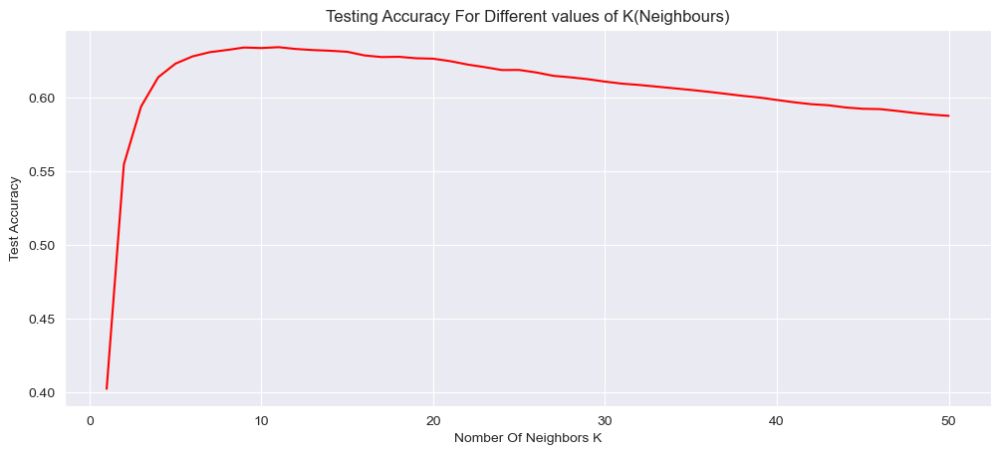

In [261]:
fig = plt.figure(figsize=(12,5),dpi=100)
sns.lineplot(data=results_knn,x=results_knn['param_n_neighbors'],y=results_knn['mean_test_score'],color='red')
plt.xlabel('Nomber Of Neighbors K')
plt.ylabel('Test Accuracy')
plt.title('Testing Accuracy For Different values of K(Neighbours)')

In [262]:
results_knn.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_neighbors,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.136422,0.011161,0.497081,0.061471,1,{'n_neighbors': 1},0.462974,0.317448,0.464445,0.392918,0.373539,0.402265,0.055961,50
1,0.163769,0.057086,0.592615,0.134181,2,{'n_neighbors': 2},0.557873,0.487206,0.569993,0.596530,0.562499,0.554820,0.036359,49
2,0.124676,0.022462,0.523000,0.060143,3,{'n_neighbors': 3},0.580440,0.532440,0.620430,0.647283,0.590266,0.594172,0.038794,41
3,0.109531,0.008449,0.479303,0.045087,4,{'n_neighbors': 4},0.597994,0.557356,0.631891,0.673584,0.609803,0.614126,0.038347,24
4,0.121114,0.022475,0.519196,0.070092,5,{'n_neighbors': 5},0.595025,0.579590,0.638541,0.678324,0.625372,0.623370,0.034566,17


In [263]:
knn = KNeighborsRegressor(n_neighbors=8)


In [264]:
cross_val_knn = cross_val_score(knn,X_train,y_train,cv=kfold,verbose=3)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  ................................................................
[CV] .................................... , score=0.595, total=   0.7s
[CV]  ................................................................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.6s remaining:    0.0s


[CV] .................................... , score=0.599, total=   0.7s
[CV]  ................................................................


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    1.3s remaining:    0.0s


[CV] .................................... , score=0.631, total=   0.6s
[CV]  ................................................................
[CV] .................................... , score=0.689, total=   0.7s
[CV]  ................................................................
[CV] .................................... , score=0.650, total=   0.7s


[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    3.3s finished


In [265]:
knn_mean_score_cv = cross_val_knn.mean()
print('The cross validated R-Squared score of the best knn model with 10 neighbours is: {}'.format(round(knn_mean_score_cv,4)))

The cross validated R-Squared score of the best knn model with 10 neighbours is: 0.6327


This Means that the in this model the explanatory variables can successfully explain 62.99% of the variance in the price.

# Model -2 Linear Regression

In [266]:
lm = LinearRegression()

In [267]:
lm.fit(X_train,y_train)

LinearRegression()

In [268]:
lm.score(X_train,y_train)

0.6337299251163646

In [269]:
lm.score(X_test,y_test)

0.6249205036278962

In [270]:
cross_val_lm = cross_val_score(lm,X_train,y_train,cv=kfold,verbose=3)
lm_mean_score_cv= cross_val_lm.mean()

[CV]  ................................................................
[CV] .................................... , score=0.637, total=   0.0s
[CV]  ................................................................
[CV] .................................... , score=0.558, total=   0.0s
[CV]  ................................................................
[CV] .................................... , score=0.641, total=   0.0s
[CV]  ................................................................
[CV] .................................... , score=0.662, total=   0.0s
[CV]  ................................................................
[CV] .................................... , score=0.631, total=   0.0s


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


Text(0.5, 1.0, 'Testing Accuracy For different Cross Validation Iteration')

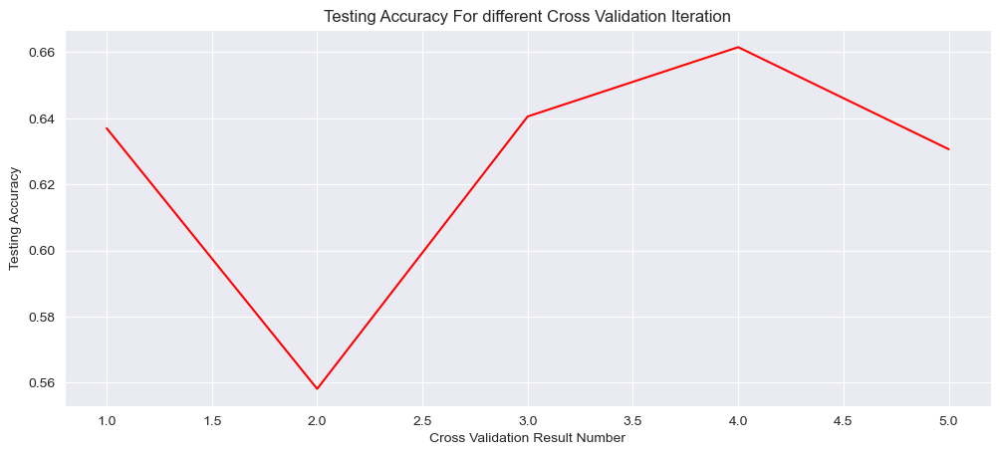

In [271]:
fig = plt.figure(figsize=(12,5),dpi=100)
plt.plot(np.arange(1,6),cross_val_lm,c='red')
plt.xlabel('Cross Validation Result Number')
plt.ylabel('Testing Accuracy')
plt.title('Testing Accuracy For different Cross Validation Iteration')

In [272]:
print('The cross validated Test score(R-Squared) of the best Linear model is: {}'.format(round(lm_mean_score_cv,4)))

The cross validated Test score(R-Squared) of the best Linear model is: 0.6256


In [273]:
X_train.head()

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,sqft_living15,sqft_lot15
0,0.090909,0.12500,0.050566,0.024488,0.0,0.0,0.0,1.00,0.500000,0.080918,0.013603,0.391304,0.0,0.161268,0.008121
1,0.272727,0.21875,0.092075,0.005573,0.0,0.0,0.0,0.50,0.500000,0.147343,0.000000,0.417391,1.0,0.196288,0.010946
2,0.272727,0.28125,0.104151,0.003570,0.0,0.0,0.0,0.75,0.583333,0.190723,0.000000,0.530435,0.0,0.291780,0.007445
3,0.272727,0.25000,0.194351,0.116049,0.0,0.0,0.0,0.75,0.666667,0.286232,0.000000,0.556522,0.0,0.380144,0.050042
4,0.272727,0.12500,0.105660,0.007863,0.0,0.0,0.0,0.75,0.500000,0.169082,0.000000,0.678261,0.0,0.271581,0.011486


This Means that the in this model the explanatory variables can successfully explain 62.03% of the variance in the price.

# Model 3 - Ridge Regression

In [274]:
# With Default Value of Alpha = 1

In [275]:
ridge = Ridge(random_state=0)

In [276]:
ridge.fit(X_train,y_train)

Ridge(random_state=0)

In [277]:
ridge.score(X_train,y_train)

0.633646611285265

In [278]:
ridge.score(X_test,y_test)

0.6248217938179781

In [279]:
ridge = Ridge(random_state=0)

In [280]:
alpha_range = [0.0001,0.001,0.01,0.1,1,10,100,1000,10000]

In [281]:
grid_params = {'alpha':[0.0001,0.001,0.01,0.1,1,10,100,1000,10000]}

In [282]:
grid = GridSearchCV(ridge,grid_params,cv=kfold,verbose=3)

In [283]:
grid.fit(X_train,y_train)

Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] alpha=0.0001 ....................................................
[CV] ........................ alpha=0.0001, score=0.637, total=   0.0s
[CV] alpha=0.0001 ....................................................
[CV] ........................ alpha=0.0001, score=0.558, total=   0.0s
[CV] alpha=0.0001 ....................................................
[CV] ........................ alpha=0.0001, score=0.641, total=   0.0s
[CV] alpha=0.0001 ....................................................
[CV] ........................ alpha=0.0001, score=0.662, total=   0.0s
[CV] alpha=0.0001 ....................................................
[CV] ........................ alpha=0.0001, score=0.631, total=   0.0s
[CV] alpha=0.001 .....................................................
[CV] ......................... alpha=0.001, score=0.637, total=   0.0s
[CV] alpha=0.001 .....................................................
[CV] ............

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s



[CV] alpha=0.01 ......................................................
[CV] .......................... alpha=0.01, score=0.662, total=   0.0s
[CV] alpha=0.01 ......................................................
[CV] .......................... alpha=0.01, score=0.631, total=   0.0s
[CV] alpha=0.1 .......................................................
[CV] ........................... alpha=0.1, score=0.637, total=   0.0s
[CV] alpha=0.1 .......................................................
[CV] ........................... alpha=0.1, score=0.558, total=   0.0s
[CV] alpha=0.1 .......................................................
[CV] ........................... alpha=0.1, score=0.641, total=   0.0s
[CV] alpha=0.1 .......................................................
[CV] ........................... alpha=0.1, score=0.662, total=   0.0s
[CV] alpha=0.1 .......................................................
[CV] ........................... alpha=0.1, score=0.631, total=   0.0s
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:    0.5s finished


GridSearchCV(cv=KFold(n_splits=5, random_state=0, shuffle=False),
             estimator=Ridge(random_state=0),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.1, 1, 10, 100, 1000,
                                   10000]},
             verbose=3)

In [284]:
grid.best_params_

{'alpha': 1}

In [285]:
grid.best_score_

0.6256162008940382

In [286]:
results_ridge = pd.DataFrame(grid.cv_results_)

In [287]:
results_ridge.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.010173,0.000746,0.003191,0.000399,0.0001,{'alpha': 0.0001},0.636997,0.558084,0.640560,0.661537,0.630640,0.625564,0.035296,5
1,0.008577,0.001196,0.002992,0.000631,0.001,{'alpha': 0.001},0.636997,0.558085,0.640560,0.661538,0.630640,0.625564,0.035295,4
2,0.009375,0.001352,0.003391,0.000488,0.01,{'alpha': 0.01},0.636988,0.558100,0.640560,0.661542,0.630639,0.625566,0.035290,3
3,0.010571,0.000798,0.002792,0.000746,0.1,{'alpha': 0.1},0.636898,0.558239,0.640551,0.661581,0.630636,0.625581,0.035238,2
4,0.008777,0.001163,0.003191,0.000746,1,{'alpha': 1},0.635954,0.559403,0.640276,0.661865,0.630582,0.625616,0.034769,1


Text(0.5, 1.0, 'Testing Accuracy by Range of Alpha(Tuning Parameter) values Ridge Regression')

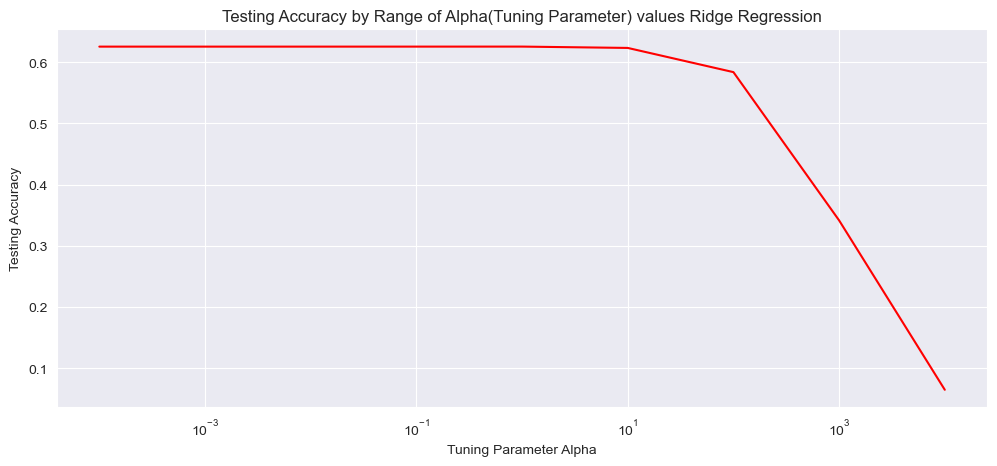

In [288]:
fig = plt.figure(figsize=(12,5),dpi=100)
sns.lineplot(data=results_ridge,x='param_alpha',y='mean_test_score',color = 'red')
plt.xlabel('Tuning Parameter Alpha')
plt.ylabel('Testing Accuracy')
plt.xscale('log')
plt.title('Testing Accuracy by Range of Alpha(Tuning Parameter) values Ridge Regression')

In [289]:
cross_val_ridge = cross_val_score(ridge,X_train,y_train,cv=kfold,verbose=3)
ridge_mean_score_cv= cross_val_ridge.mean()

[CV]  ................................................................
[CV] .................................... , score=0.636, total=   0.0s
[CV]  ................................................................
[CV] .................................... , score=0.559, total=   0.0s
[CV]  ................................................................
[CV] .................................... , score=0.640, total=   0.0s
[CV]  ................................................................
[CV] .................................... , score=0.662, total=   0.0s
[CV]  ................................................................
[CV] .................................... , score=0.631, total=   0.0s


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


In [290]:
print('The cross validated Testing score (R-Squared) of the best Ridge model which is a linear model initself is: {}'.format(round(ridge_mean_score_cv,4)))

The cross validated Testing score (R-Squared) of the best Ridge model which is a linear model initself is: 0.6256


This Means that the in this model the explanatory variables can successfully explain 62.03% of the variance in the price.

In [291]:
X_train.head()

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,sqft_living15,sqft_lot15
0,0.090909,0.12500,0.050566,0.024488,0.0,0.0,0.0,1.00,0.500000,0.080918,0.013603,0.391304,0.0,0.161268,0.008121
1,0.272727,0.21875,0.092075,0.005573,0.0,0.0,0.0,0.50,0.500000,0.147343,0.000000,0.417391,1.0,0.196288,0.010946
2,0.272727,0.28125,0.104151,0.003570,0.0,0.0,0.0,0.75,0.583333,0.190723,0.000000,0.530435,0.0,0.291780,0.007445
3,0.272727,0.25000,0.194351,0.116049,0.0,0.0,0.0,0.75,0.666667,0.286232,0.000000,0.556522,0.0,0.380144,0.050042
4,0.272727,0.12500,0.105660,0.007863,0.0,0.0,0.0,0.75,0.500000,0.169082,0.000000,0.678261,0.0,0.271581,0.011486


# Model 4 - Lasso Regression

In [292]:
lasso = Lasso(random_state=0)

In [293]:
lasso.fit(X_train,y_train)

Lasso(random_state=0)

In [294]:
lasso.score(X_train,y_train)

0.6337299002646608

In [295]:
lasso.score(X_test,y_test)

0.6249145999819712

In [296]:
alpha_range = [0.0001,0.001,0.01,0.1,1,10,100,1000,10000]
grid_params = {'alpha':[0.0001,0.001,0.01,0.1,1,10,100,1000,10000]}

In [297]:
grid = GridSearchCV(lasso,grid_params,cv=kfold,verbose=3)

In [298]:
grid.fit(X_train,y_train)

Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] alpha=0.0001 ....................................................
[CV] ........................ alpha=0.0001, score=0.637, total=   0.0s
[CV] alpha=0.0001 ....................................................
[CV] ........................ alpha=0.0001, score=0.558, total=   0.0s
[CV] alpha=0.0001 ....................................................
[CV] ........................ alpha=0.0001, score=0.641, total=   0.0s
[CV] alpha=0.0001 ....................................................
[CV] ........................ alpha=0.0001, score=0.662, total=   0.0s

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s



[CV] alpha=0.0001 ....................................................
[CV] ........................ alpha=0.0001, score=0.631, total=   0.0s
[CV] alpha=0.001 .....................................................
[CV] ......................... alpha=0.001, score=0.637, total=   0.0s
[CV] alpha=0.001 .....................................................
[CV] ......................... alpha=0.001, score=0.558, total=   0.0s
[CV] alpha=0.001 .....................................................
[CV] ......................... alpha=0.001, score=0.641, total=   0.0s
[CV] alpha=0.001 .....................................................
[CV] ......................... alpha=0.001, score=0.662, total=   0.0s
[CV] alpha=0.001 .....................................................
[CV] ......................... alpha=0.001, score=0.631, total=   0.0s
[CV] alpha=0.01 ......................................................
[CV] .......................... alpha=0.01, score=0.637, total=   0.0s
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:    1.4s finished


GridSearchCV(cv=KFold(n_splits=5, random_state=0, shuffle=False),
             estimator=Lasso(random_state=0),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.1, 1, 10, 100, 1000,
                                   10000]},
             verbose=3)

In [299]:
grid.best_params_

{'alpha': 100}

In [300]:
grid.best_score_

0.6256330292321816

In [301]:
results_lasso = pd.DataFrame(grid.cv_results_)

In [302]:
results_lasso.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.041689,0.002918,0.003391,0.001018,0.0001,{'alpha': 0.0001},0.636998,0.558084,0.640560,0.661537,0.630640,0.625564,0.035296,7
1,0.039095,0.001163,0.003790,0.000399,0.001,{'alpha': 0.001},0.636998,0.558084,0.640560,0.661537,0.630640,0.625564,0.035296,6
2,0.036702,0.012669,0.003591,0.001017,0.01,{'alpha': 0.01},0.636997,0.558084,0.640560,0.661537,0.630640,0.625564,0.035296,5
3,0.031915,0.000892,0.003391,0.000488,0.1,{'alpha': 0.1},0.636997,0.558086,0.640559,0.661538,0.630641,0.625564,0.035295,4
4,0.028922,0.001261,0.003790,0.000399,1,{'alpha': 1},0.636990,0.558107,0.640551,0.661540,0.630654,0.625568,0.035287,3


Text(0.5, 1.0, 'Testing Accuracy by Range of Alpha(Tuning Parameter) values For Lasso Regression')

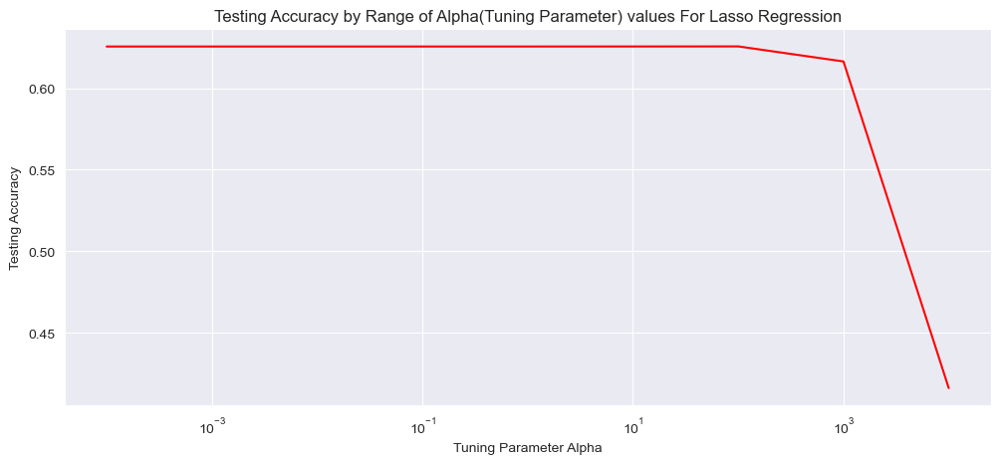

In [303]:
fig = plt.figure(figsize=(12,5),dpi=100)
sns.lineplot(data=results_lasso,x='param_alpha',y='mean_test_score',color = 'red')
plt.xlabel('Tuning Parameter Alpha')
plt.ylabel('Testing Accuracy')
plt.xscale('log')
plt.title('Testing Accuracy by Range of Alpha(Tuning Parameter) values For Lasso Regression')

In [304]:
lasso = Lasso(alpha=100)

In [305]:
cross_val_lasso = cross_val_score(lasso,X_train,y_train,cv=kfold,verbose=3)
lasso_mean_score_cv = cross_val_lasso.mean()

[CV]  ................................................................
[CV] .................................... , score=0.635, total=   0.0s
[CV]  ................................................................
[CV] .................................... , score=0.560, total=   0.0s
[CV]  ................................................................
[CV] .................................... , score=0.639, total=   0.0s
[CV]  ................................................................
[CV] .................................... , score=0.662, total=   0.0s
[CV]  ................................................................
[CV] .................................... , score=0.632, total=   0.0s


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


In [306]:
print('The cross validated Testing score(R-Squared) of the best Lasso model is: {}'.format(round(lasso_mean_score_cv,4)))

The cross validated Testing score(R-Squared) of the best Lasso model is: 0.6256


This Means that the in this model the explanatory variables can successfully explain 62.03% of the variance in the price.

In [307]:
X_train.head()

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,sqft_living15,sqft_lot15
0,0.090909,0.12500,0.050566,0.024488,0.0,0.0,0.0,1.00,0.500000,0.080918,0.013603,0.391304,0.0,0.161268,0.008121
1,0.272727,0.21875,0.092075,0.005573,0.0,0.0,0.0,0.50,0.500000,0.147343,0.000000,0.417391,1.0,0.196288,0.010946
2,0.272727,0.28125,0.104151,0.003570,0.0,0.0,0.0,0.75,0.583333,0.190723,0.000000,0.530435,0.0,0.291780,0.007445
3,0.272727,0.25000,0.194351,0.116049,0.0,0.0,0.0,0.75,0.666667,0.286232,0.000000,0.556522,0.0,0.380144,0.050042
4,0.272727,0.12500,0.105660,0.007863,0.0,0.0,0.0,0.75,0.500000,0.169082,0.000000,0.678261,0.0,0.271581,0.011486


# Model 5 -Decision Tree Regressor

In [308]:
tree = DecisionTreeRegressor(random_state=0)

In [309]:
tree.fit(X_train,y_train)

DecisionTreeRegressor(random_state=0)

In [310]:
tree.score(X_train,y_train)

0.9999287418430224

In [311]:
tree.score(X_test,y_test)

0.46837168901280835

In [312]:
depth = list(range(1,101))

In [313]:
grid_params = {'max_depth':depth}

In [314]:
grid = GridSearchCV(tree,grid_params,cv=kfold,verbose=3)

In [315]:
grid.fit(X_train,y_train)

Fitting 5 folds for each of 100 candidates, totalling 500 fits
[CV] max_depth=1 .....................................................
[CV] ......................... max_depth=1, score=0.309, total=   0.0s
[CV] max_depth=1 .....................................................
[CV] ......................... max_depth=1, score=0.285, total=   0.0s
[CV] max_depth=1 .....................................................
[CV] ......................... max_depth=1, score=0.300, total=   0.0s
[CV] max_depth=1 .....................................................
[CV] ......................... max_depth=1, score=0.332, total=   0.0s
[CV] max_depth=1 .....................................................
[CV] ......................... max_depth=1, score=0.299, total=   0.0s
[CV] max_depth=2 .....................................................
[CV] ......................... max_depth=2, score=0.456, total=   0.0s
[CV] max_depth=2 .....................................................
[CV] .........

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


[CV] ......................... max_depth=2, score=0.426, total=   0.0s
[CV] max_depth=3 .....................................................
[CV] ......................... max_depth=3, score=0.477, total=   0.0s
[CV] max_depth=3 .....................................................
[CV] ......................... max_depth=3, score=0.441, total=   0.0s
[CV] max_depth=3 .....................................................
[CV] ......................... max_depth=3, score=0.466, total=   0.0s
[CV] max_depth=3 .....................................................
[CV] ......................... max_depth=3, score=0.496, total=   0.0s
[CV] max_depth=3 .....................................................
[CV] ......................... max_depth=3, score=0.464, total=   0.0s
[CV] max_depth=4 .....................................................
[CV] ......................... max_depth=4, score=0.543, total=   0.0s
[CV] max_depth=4 .....................................................
[CV] .

[CV] ........................ max_depth=14, score=0.451, total=   0.1s
[CV] max_depth=14 ....................................................
[CV] ........................ max_depth=14, score=0.423, total=   0.1s
[CV] max_depth=15 ....................................................
[CV] ........................ max_depth=15, score=0.545, total=   0.1s
[CV] max_depth=15 ....................................................
[CV] ........................ max_depth=15, score=0.359, total=   0.1s
[CV] max_depth=15 ....................................................
[CV] ........................ max_depth=15, score=0.501, total=   0.1s
[CV] max_depth=15 ....................................................
[CV] ........................ max_depth=15, score=0.432, total=   0.1s
[CV] max_depth=15 ....................................................
[CV] ........................ max_depth=15, score=0.445, total=   0.1s
[CV] max_depth=16 ....................................................
[CV] .

[CV] ........................ max_depth=26, score=0.492, total=   0.1s
[CV] max_depth=26 ....................................................
[CV] ........................ max_depth=26, score=0.360, total=   0.1s
[CV] max_depth=26 ....................................................
[CV] ........................ max_depth=26, score=0.381, total=   0.1s
[CV] max_depth=27 ....................................................
[CV] ........................ max_depth=27, score=0.498, total=   0.1s
[CV] max_depth=27 ....................................................
[CV] ........................ max_depth=27, score=0.282, total=   0.1s
[CV] max_depth=27 ....................................................
[CV] ........................ max_depth=27, score=0.490, total=   0.1s
[CV] max_depth=27 ....................................................
[CV] ........................ max_depth=27, score=0.352, total=   0.1s
[CV] max_depth=27 ....................................................
[CV] .

[CV] ........................ max_depth=38, score=0.487, total=   0.1s
[CV] max_depth=38 ....................................................
[CV] ........................ max_depth=38, score=0.281, total=   0.1s
[CV] max_depth=38 ....................................................
[CV] ........................ max_depth=38, score=0.418, total=   0.1s
[CV] max_depth=38 ....................................................
[CV] ........................ max_depth=38, score=0.349, total=   0.2s
[CV] max_depth=38 ....................................................
[CV] ........................ max_depth=38, score=0.342, total=   0.2s
[CV] max_depth=39 ....................................................
[CV] ........................ max_depth=39, score=0.488, total=   0.2s
[CV] max_depth=39 ....................................................
[CV] ........................ max_depth=39, score=0.281, total=   0.1s
[CV] max_depth=39 ....................................................
[CV] .

[CV] ........................ max_depth=49, score=0.364, total=   0.2s
[CV] max_depth=50 ....................................................
[CV] ........................ max_depth=50, score=0.491, total=   0.2s
[CV] max_depth=50 ....................................................
[CV] ........................ max_depth=50, score=0.281, total=   0.3s
[CV] max_depth=50 ....................................................
[CV] ........................ max_depth=50, score=0.418, total=   0.2s
[CV] max_depth=50 ....................................................
[CV] ........................ max_depth=50, score=0.349, total=   0.2s
[CV] max_depth=50 ....................................................
[CV] ........................ max_depth=50, score=0.364, total=   0.2s
[CV] max_depth=51 ....................................................
[CV] ........................ max_depth=51, score=0.491, total=   0.2s
[CV] max_depth=51 ....................................................
[CV] .

[CV] ........................ max_depth=61, score=0.418, total=   0.2s
[CV] max_depth=61 ....................................................
[CV] ........................ max_depth=61, score=0.349, total=   0.2s
[CV] max_depth=61 ....................................................
[CV] ........................ max_depth=61, score=0.364, total=   0.2s
[CV] max_depth=62 ....................................................
[CV] ........................ max_depth=62, score=0.491, total=   0.2s
[CV] max_depth=62 ....................................................
[CV] ........................ max_depth=62, score=0.281, total=   0.2s
[CV] max_depth=62 ....................................................
[CV] ........................ max_depth=62, score=0.418, total=   0.2s
[CV] max_depth=62 ....................................................
[CV] ........................ max_depth=62, score=0.349, total=   0.2s
[CV] max_depth=62 ....................................................
[CV] .

[CV] ........................ max_depth=73, score=0.491, total=   0.1s
[CV] max_depth=73 ....................................................
[CV] ........................ max_depth=73, score=0.281, total=   0.1s
[CV] max_depth=73 ....................................................
[CV] ........................ max_depth=73, score=0.418, total=   0.2s
[CV] max_depth=73 ....................................................
[CV] ........................ max_depth=73, score=0.349, total=   0.2s
[CV] max_depth=73 ....................................................
[CV] ........................ max_depth=73, score=0.364, total=   0.2s
[CV] max_depth=74 ....................................................
[CV] ........................ max_depth=74, score=0.491, total=   0.2s
[CV] max_depth=74 ....................................................
[CV] ........................ max_depth=74, score=0.281, total=   0.1s
[CV] max_depth=74 ....................................................
[CV] .

[CV] ........................ max_depth=84, score=0.349, total=   0.1s
[CV] max_depth=84 ....................................................
[CV] ........................ max_depth=84, score=0.364, total=   0.1s
[CV] max_depth=85 ....................................................
[CV] ........................ max_depth=85, score=0.491, total=   0.1s
[CV] max_depth=85 ....................................................
[CV] ........................ max_depth=85, score=0.281, total=   0.1s
[CV] max_depth=85 ....................................................
[CV] ........................ max_depth=85, score=0.418, total=   0.1s
[CV] max_depth=85 ....................................................
[CV] ........................ max_depth=85, score=0.349, total=   0.1s
[CV] max_depth=85 ....................................................
[CV] ........................ max_depth=85, score=0.364, total=   0.1s
[CV] max_depth=86 ....................................................
[CV] .

[CV] ........................ max_depth=96, score=0.418, total=   0.1s
[CV] max_depth=96 ....................................................
[CV] ........................ max_depth=96, score=0.349, total=   0.1s
[CV] max_depth=96 ....................................................
[CV] ........................ max_depth=96, score=0.364, total=   0.1s
[CV] max_depth=97 ....................................................
[CV] ........................ max_depth=97, score=0.491, total=   0.1s
[CV] max_depth=97 ....................................................
[CV] ........................ max_depth=97, score=0.281, total=   0.1s
[CV] max_depth=97 ....................................................
[CV] ........................ max_depth=97, score=0.418, total=   0.1s
[CV] max_depth=97 ....................................................
[CV] ........................ max_depth=97, score=0.349, total=   0.1s
[CV] max_depth=97 ....................................................
[CV] .

[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:  1.1min finished


GridSearchCV(cv=KFold(n_splits=5, random_state=0, shuffle=False),
             estimator=DecisionTreeRegressor(random_state=0),
             param_grid={'max_depth': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12,
                                       13, 14, 15, 16, 17, 18, 19, 20, 21, 22,
                                       23, 24, 25, 26, 27, 28, 29, 30, ...]},
             verbose=3)

In [316]:
grid.best_params_

{'max_depth': 6}

In [317]:
grid.best_score_

0.590926130248538

In [318]:
results_tree = pd.DataFrame(grid.cv_results_)

In [319]:
results_tree.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.012774,0.000746,0.002602,0.000491,1,{'max_depth': 1},0.308715,0.284935,0.299857,0.331896,0.299330,0.304947,0.015481,100
1,0.020545,0.000797,0.002393,0.000489,2,{'max_depth': 2},0.455945,0.393516,0.469373,0.463135,0.426464,0.441687,0.028220,14
2,0.028352,0.001008,0.001994,0.000004,3,{'max_depth': 3},0.477425,0.441236,0.465534,0.496112,0.464093,0.468880,0.017961,12
3,0.035704,0.001467,0.002394,0.000489,4,{'max_depth': 4},0.542850,0.488393,0.559162,0.542294,0.552883,0.537117,0.025173,6
4,0.037116,0.001176,0.002192,0.000384,5,{'max_depth': 5},0.610224,0.520860,0.542752,0.565630,0.591855,0.566264,0.032256,5


Text(0.5, 1.0, 'Testing Accuracy by The Maximum Depth Of The Tree')

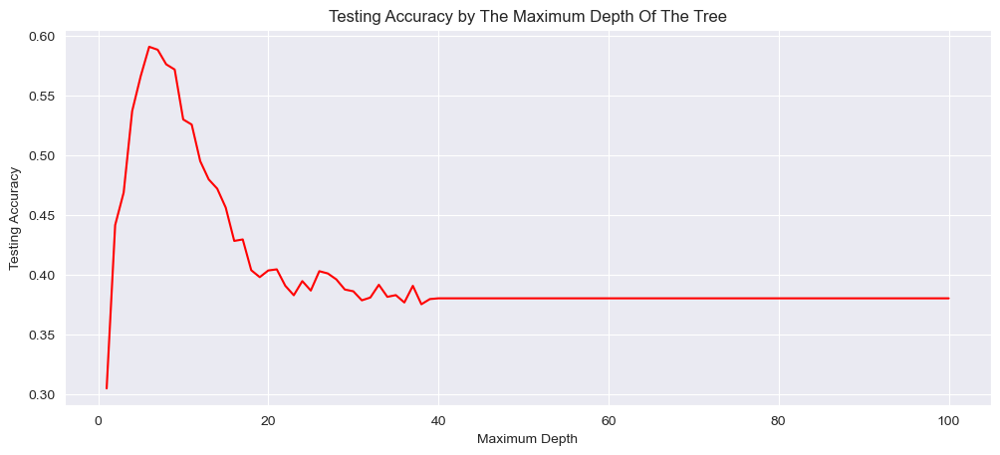

In [320]:
fig = plt.figure(figsize=(12,5),dpi=100)
sns.lineplot(data=results_tree,x='param_max_depth',y='mean_test_score',color='red')
plt.xlabel('Maximum Depth')
plt.ylabel('Testing Accuracy')
plt.title('Testing Accuracy by The Maximum Depth Of The Tree')

In [321]:
tree = DecisionTreeRegressor(max_depth=6)

In [322]:
tree.fit(X_train,y_train)

DecisionTreeRegressor(max_depth=6)

In [323]:
cross_val_tree = cross_val_score(tree,X_train,y_train,verbose=3,cv=kfold)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


[CV]  ................................................................
[CV] .................................... , score=0.624, total=   0.0s
[CV]  ................................................................
[CV] .................................... , score=0.536, total=   0.0s
[CV]  ................................................................
[CV] .................................... , score=0.578, total=   0.0s
[CV]  ................................................................
[CV] .................................... , score=0.600, total=   0.0s
[CV]  ................................................................
[CV] .................................... , score=0.542, total=   0.0s


[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s finished


In [324]:
tree_mean_score_cv = cross_val_tree.mean()

In [325]:
tree.feature_importances_

array([0.        , 0.0065391 , 0.73395656, 0.00445211, 0.        ,
       0.03354512, 0.01571871, 0.        , 0.0751867 , 0.00191014,
       0.        , 0.08016478, 0.        , 0.03999626, 0.00853052])

In [326]:
output = {'Variables':X_train.columns,'Feature Importances':tree.feature_importances_}

In [327]:
out = pd.DataFrame(output)

In [328]:
out.head()

,Variables,Feature Importances
0,bedrooms,0.000000
1,bathrooms,0.006539
2,sqft_living,0.733957
3,sqft_lot,0.004452
4,floors,0.000000


In [329]:
out =out.sort_values(by='Feature Importances',ascending =False)

Top 5 Variables That Have The Most Impact on the Price Of The Houses are as follows:

In [330]:
out.head()

,Variables,Feature Importances
2,sqft_living,0.733957
11,yr_built,0.080165
8,grade,0.075187
13,sqft_living15,0.039996
5,waterfront,0.033545


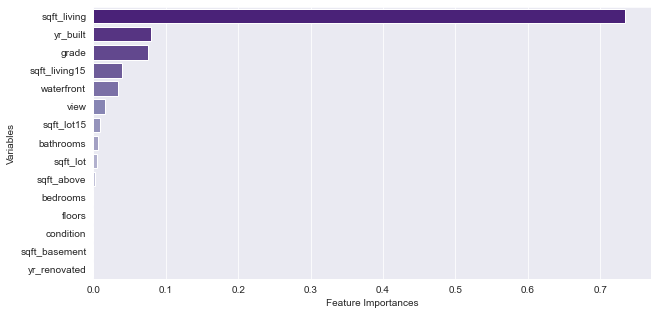

In [331]:
fig = plt.figure(figsize=(10,5))
sns.barplot(y='Variables',x='Feature Importances',data=out,orient='h',palette='Purples_r')

Square Foot of the house has the most and very high impact on the price of the house followed by the year in which the house was built followed by the grade of the house which is essentially the type of construction that the house has had followed by the average living area of 15 houses in the neighbourhood followed by whether the house had a waterfront or not

The Variables like condition of the house, the number of floors the house had, the number of bedrooms the house has, whether or not the house was ever renovated before, area of the basement and area of the plot have little to no impact on the dependent variable which is price and hence can be ignored when trying to fit more complex models.

The Area of the house has very significant in determining the price of the house, It is so important that it dominates most of the other variables over a large margin.

## Visualizing The Decision Tree

In [332]:
features = list(X_train.columns)

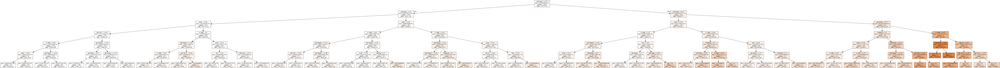

<Figure size 720x720 with 0 Axes>

In [333]:
fig=plt.figure(figsize=(10,10))
dot_data = StringIO()  
export_graphviz(tree, out_file=dot_data,feature_names=features,filled=True,rounded=False)

graph = pydot.graph_from_dot_data(dot_data.getvalue())  
Image(graph[0].create_png())  

In [334]:
print('The cross validated Test score (R-Squared) of the best Decision Tree Regressor model is: {}'.format(round(tree_mean_score_cv,4)))

The cross validated Test score (R-Squared) of the best Decision Tree Regressor model is: 0.576


# Sampling The Data For More Complicated Datasets

In Order to implement more complicated algorithms a sample of 1500 datapoints from the training set is used to train some of the more complicated models like Random Forest, Support Vector Machines With Kernel Tricks(Linear, RBF, Poly) and  LinearSVM

In [335]:
np.random.seed(0)
sample_train = np.random.randint(5404,16209,1500)
sample_test = np.random.randint(0,5404,1000)

In [336]:
X_train_sample = X_train.iloc[sample_train,:]

In [337]:
y_train_sample = y_train.iloc[sample_train]

In [338]:
X_test_sample = X_train.iloc[sample_test,:]

In [339]:
y_test_sample = y_test.iloc[sample_test]

In [340]:
X_train_sample.shape

(1500, 15)

In [341]:
y_train_sample.shape

(1500,)

In [342]:
X_test_sample.shape

(1000, 15)

In [343]:
y_test_sample.shape

(1000,)

# Model 6 - Random Forest Regressor

In [344]:
rf = RandomForestRegressor()

In [345]:
rf.fit(X_train_sample,y_train_sample)

RandomForestRegressor()

In [346]:
rf.score(X_train_sample,y_train_sample)

0.9527245786017229

In [347]:
rf.score(X_test_sample,y_test_sample)

-0.4706336276014731

In [348]:
grid_params = {'n_estimators':[400,500],'max_depth':depth[:51]}

In [349]:
grid = GridSearchCV(rf,grid_params,cv=kfold,verbose=3)

In [350]:
grid.fit(X_train_sample,y_train_sample)

Fitting 5 folds for each of 102 candidates, totalling 510 fits
[CV] max_depth=1, n_estimators=400 ...................................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] ....... max_depth=1, n_estimators=400, score=0.315, total=   0.7s
[CV] max_depth=1, n_estimators=400 ...................................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.6s remaining:    0.0s


[CV] ....... max_depth=1, n_estimators=400, score=0.327, total=   0.7s
[CV] max_depth=1, n_estimators=400 ...................................


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    1.4s remaining:    0.0s


[CV] ....... max_depth=1, n_estimators=400, score=0.370, total=   0.7s
[CV] max_depth=1, n_estimators=400 ...................................
[CV] ....... max_depth=1, n_estimators=400, score=0.388, total=   0.9s
[CV] max_depth=1, n_estimators=400 ...................................
[CV] ....... max_depth=1, n_estimators=400, score=0.272, total=   0.9s
[CV] max_depth=1, n_estimators=500 ...................................
[CV] ....... max_depth=1, n_estimators=500, score=0.320, total=   1.0s
[CV] max_depth=1, n_estimators=500 ...................................
[CV] ....... max_depth=1, n_estimators=500, score=0.325, total=   0.9s
[CV] max_depth=1, n_estimators=500 ...................................
[CV] ....... max_depth=1, n_estimators=500, score=0.370, total=   0.9s
[CV] max_depth=1, n_estimators=500 ...................................
[CV] ....... max_depth=1, n_estimators=500, score=0.388, total=   0.9s
[CV] max_depth=1, n_estimators=500 ...................................
[CV] .

[CV] ....... max_depth=7, n_estimators=400, score=0.651, total=   2.2s
[CV] max_depth=7, n_estimators=400 ...................................
[CV] ....... max_depth=7, n_estimators=400, score=0.613, total=   1.6s
[CV] max_depth=7, n_estimators=400 ...................................
[CV] ....... max_depth=7, n_estimators=400, score=0.640, total=   1.6s
[CV] max_depth=7, n_estimators=400 ...................................
[CV] ....... max_depth=7, n_estimators=400, score=0.593, total=   1.8s
[CV] max_depth=7, n_estimators=400 ...................................
[CV] ....... max_depth=7, n_estimators=400, score=0.658, total=   1.6s
[CV] max_depth=7, n_estimators=500 ...................................
[CV] ....... max_depth=7, n_estimators=500, score=0.650, total=   2.1s
[CV] max_depth=7, n_estimators=500 ...................................
[CV] ....... max_depth=7, n_estimators=500, score=0.610, total=   2.0s
[CV] max_depth=7, n_estimators=500 ...................................
[CV] .

[CV] ...... max_depth=12, n_estimators=500, score=0.619, total=   3.4s
[CV] max_depth=12, n_estimators=500 ..................................
[CV] ...... max_depth=12, n_estimators=500, score=0.688, total=   3.9s
[CV] max_depth=13, n_estimators=400 ..................................
[CV] ...... max_depth=13, n_estimators=400, score=0.671, total=   2.8s
[CV] max_depth=13, n_estimators=400 ..................................
[CV] ...... max_depth=13, n_estimators=400, score=0.619, total=   2.6s
[CV] max_depth=13, n_estimators=400 ..................................
[CV] ...... max_depth=13, n_estimators=400, score=0.654, total=   2.4s
[CV] max_depth=13, n_estimators=400 ..................................
[CV] ...... max_depth=13, n_estimators=400, score=0.618, total=   2.7s
[CV] max_depth=13, n_estimators=400 ..................................
[CV] ...... max_depth=13, n_estimators=400, score=0.694, total=   2.3s
[CV] max_depth=13, n_estimators=500 ..................................
[CV] .

[CV] ...... max_depth=18, n_estimators=500, score=0.623, total=   5.0s
[CV] max_depth=18, n_estimators=500 ..................................
[CV] ...... max_depth=18, n_estimators=500, score=0.653, total=   4.8s
[CV] max_depth=18, n_estimators=500 ..................................
[CV] ...... max_depth=18, n_estimators=500, score=0.624, total=   4.7s
[CV] max_depth=18, n_estimators=500 ..................................
[CV] ...... max_depth=18, n_estimators=500, score=0.688, total=   4.5s
[CV] max_depth=19, n_estimators=400 ..................................
[CV] ...... max_depth=19, n_estimators=400, score=0.677, total=   3.5s
[CV] max_depth=19, n_estimators=400 ..................................
[CV] ...... max_depth=19, n_estimators=400, score=0.627, total=   3.5s
[CV] max_depth=19, n_estimators=400 ..................................
[CV] ...... max_depth=19, n_estimators=400, score=0.651, total=   3.4s
[CV] max_depth=19, n_estimators=400 ..................................
[CV] .

[CV] ...... max_depth=24, n_estimators=400, score=0.692, total=   3.0s
[CV] max_depth=24, n_estimators=500 ..................................
[CV] ...... max_depth=24, n_estimators=500, score=0.673, total=   3.7s
[CV] max_depth=24, n_estimators=500 ..................................
[CV] ...... max_depth=24, n_estimators=500, score=0.623, total=   4.6s
[CV] max_depth=24, n_estimators=500 ..................................
[CV] ...... max_depth=24, n_estimators=500, score=0.650, total=   3.5s
[CV] max_depth=24, n_estimators=500 ..................................
[CV] ...... max_depth=24, n_estimators=500, score=0.625, total=   3.2s
[CV] max_depth=24, n_estimators=500 ..................................
[CV] ...... max_depth=24, n_estimators=500, score=0.692, total=   4.0s
[CV] max_depth=25, n_estimators=400 ..................................
[CV] ...... max_depth=25, n_estimators=400, score=0.674, total=   3.3s
[CV] max_depth=25, n_estimators=400 ..................................
[CV] .

[CV] ...... max_depth=30, n_estimators=400, score=0.647, total=   2.4s
[CV] max_depth=30, n_estimators=400 ..................................
[CV] ...... max_depth=30, n_estimators=400, score=0.622, total=   2.4s
[CV] max_depth=30, n_estimators=400 ..................................
[CV] ...... max_depth=30, n_estimators=400, score=0.688, total=   2.4s
[CV] max_depth=30, n_estimators=500 ..................................
[CV] ...... max_depth=30, n_estimators=500, score=0.677, total=   3.0s
[CV] max_depth=30, n_estimators=500 ..................................
[CV] ...... max_depth=30, n_estimators=500, score=0.624, total=   3.9s
[CV] max_depth=30, n_estimators=500 ..................................
[CV] ...... max_depth=30, n_estimators=500, score=0.654, total=   3.0s
[CV] max_depth=30, n_estimators=500 ..................................
[CV] ...... max_depth=30, n_estimators=500, score=0.630, total=   3.2s
[CV] max_depth=30, n_estimators=500 ..................................
[CV] .

[CV] ...... max_depth=36, n_estimators=400, score=0.669, total=   2.5s
[CV] max_depth=36, n_estimators=400 ..................................
[CV] ...... max_depth=36, n_estimators=400, score=0.625, total=   2.5s
[CV] max_depth=36, n_estimators=400 ..................................
[CV] ...... max_depth=36, n_estimators=400, score=0.657, total=   2.5s
[CV] max_depth=36, n_estimators=400 ..................................
[CV] ...... max_depth=36, n_estimators=400, score=0.624, total=   2.4s
[CV] max_depth=36, n_estimators=400 ..................................
[CV] ...... max_depth=36, n_estimators=400, score=0.694, total=   2.3s
[CV] max_depth=36, n_estimators=500 ..................................
[CV] ...... max_depth=36, n_estimators=500, score=0.672, total=   2.9s
[CV] max_depth=36, n_estimators=500 ..................................
[CV] ...... max_depth=36, n_estimators=500, score=0.623, total=   2.9s
[CV] max_depth=36, n_estimators=500 ..................................
[CV] .

[CV] ...... max_depth=41, n_estimators=500, score=0.620, total=   3.0s
[CV] max_depth=41, n_estimators=500 ..................................
[CV] ...... max_depth=41, n_estimators=500, score=0.691, total=   3.0s
[CV] max_depth=42, n_estimators=400 ..................................
[CV] ...... max_depth=42, n_estimators=400, score=0.670, total=   2.4s
[CV] max_depth=42, n_estimators=400 ..................................
[CV] ...... max_depth=42, n_estimators=400, score=0.626, total=   2.3s
[CV] max_depth=42, n_estimators=400 ..................................
[CV] ...... max_depth=42, n_estimators=400, score=0.657, total=   2.4s
[CV] max_depth=42, n_estimators=400 ..................................
[CV] ...... max_depth=42, n_estimators=400, score=0.626, total=   2.4s
[CV] max_depth=42, n_estimators=400 ..................................
[CV] ...... max_depth=42, n_estimators=400, score=0.698, total=   2.4s
[CV] max_depth=42, n_estimators=500 ..................................
[CV] .

[CV] ...... max_depth=47, n_estimators=500, score=0.617, total=   2.9s
[CV] max_depth=47, n_estimators=500 ..................................
[CV] ...... max_depth=47, n_estimators=500, score=0.650, total=   3.0s
[CV] max_depth=47, n_estimators=500 ..................................
[CV] ...... max_depth=47, n_estimators=500, score=0.627, total=   2.9s
[CV] max_depth=47, n_estimators=500 ..................................
[CV] ...... max_depth=47, n_estimators=500, score=0.682, total=   3.0s
[CV] max_depth=48, n_estimators=400 ..................................
[CV] ...... max_depth=48, n_estimators=400, score=0.677, total=   2.4s
[CV] max_depth=48, n_estimators=400 ..................................
[CV] ...... max_depth=48, n_estimators=400, score=0.625, total=   2.6s
[CV] max_depth=48, n_estimators=400 ..................................
[CV] ...... max_depth=48, n_estimators=400, score=0.654, total=   2.5s
[CV] max_depth=48, n_estimators=400 ..................................
[CV] .

[Parallel(n_jobs=1)]: Done 510 out of 510 | elapsed: 24.1min finished


GridSearchCV(cv=KFold(n_splits=5, random_state=0, shuffle=False),
             estimator=RandomForestRegressor(),
             param_grid={'max_depth': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12,
                                       13, 14, 15, 16, 17, 18, 19, 20, 21, 22,
                                       23, 24, 25, 26, 27, 28, 29, 30, ...],
                         'n_estimators': [400, 500]},
             verbose=3)

In [351]:
grid.best_params_

{'max_depth': 29, 'n_estimators': 500}

In [352]:
grid.best_score_

0.6576623021409377

In [353]:
results_rf = pd.DataFrame(grid.cv_results_)

In [354]:
results_rf.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.766948,0.091129,0.034108,0.004343,1,400,"{'max_depth': 1, 'n_estimators': 400}",0.314588,0.327252,0.369875,0.388378,0.271636,0.334346,0.041364,102
1,0.922745,0.043632,0.041280,0.003927,1,500,"{'max_depth': 1, 'n_estimators': 500}",0.320407,0.325404,0.369511,0.388292,0.272161,0.335155,0.040706,101
2,1.117818,0.111980,0.045487,0.010997,2,400,"{'max_depth': 2, 'n_estimators': 400}",0.477962,0.465429,0.428516,0.430088,0.474793,0.455358,0.021675,100
3,1.009897,0.180957,0.036109,0.011015,2,500,"{'max_depth': 2, 'n_estimators': 500}",0.479590,0.462194,0.428410,0.435013,0.483630,0.457767,0.022558,99
4,1.034838,0.146811,0.029907,0.004131,3,400,"{'max_depth': 3, 'n_estimators': 400}",0.537416,0.526264,0.492160,0.478425,0.563653,0.519584,0.030825,97


Text(0.5, 1.0, 'HeatMap Of Mean Test Score With respect To param_n_estimators and depth parameters')

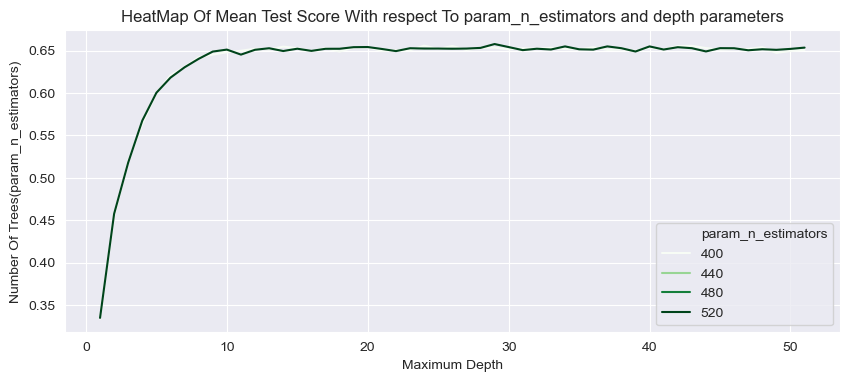

In [355]:
fig = plt.figure(figsize=(10,4),dpi=100)
#sns.heatmap(results_rf.pivot_table(index='param_n_estimators',columns='param_max_depth',values='mean_test_score'),annot=True,cmap='Purples')
sns.lineplot(x=results_rf['param_max_depth'],y=results_rf['mean_test_score'],hue=results_rf['param_n_estimators'],palette='Greens')
plt.ylabel('Number Of Trees(param_n_estimators)')
plt.xlabel('Maximum Depth')
plt.title('HeatMap Of Mean Test Score With respect To param_n_estimators and depth parameters')

In [356]:
rf = RandomForestRegressor(n_estimators=400,max_depth=40)

In [357]:
cross_val_rf = cross_val_score(rf,X_train_sample,y_train_sample,cv=kfold,verbose=3)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  ................................................................
[CV] .................................... , score=0.674, total=   2.4s
[CV]  ................................................................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    2.3s remaining:    0.0s


[CV] .................................... , score=0.628, total=   2.5s
[CV]  ................................................................


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    4.8s remaining:    0.0s


[CV] .................................... , score=0.653, total=   2.6s
[CV]  ................................................................
[CV] .................................... , score=0.620, total=   2.4s
[CV]  ................................................................
[CV] .................................... , score=0.685, total=   2.4s


[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   12.2s finished


In [358]:
rf_mean_score_cv = cross_val_rf.mean()

In [359]:
print('The cross validated Testing score(R-Squared) of the best Random Forest Regressor model is: {}'.format(round(rf_mean_score_cv,4)))

The cross validated Testing score(R-Squared) of the best Random Forest Regressor model is: 0.6519


This states that 67.38% of the variation in the price can be explaned by our explanatory variables in the Random Forest Model.

# Model 7 : Polynomial Regression

In [360]:
X.head()

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,sqft_living15,sqft_lot15
0,3.0,1.00,1180.000000,5650.0,1.0,0.0,0.0,3.0,7.0,1180.0,0.0,1955.0,0.0,1677.11642,5650.0
1,3.0,2.25,2570.000000,7242.0,2.0,0.0,0.0,3.0,7.0,2170.0,400.0,1951.0,1.0,1690.00000,7639.0
2,2.0,1.00,770.000000,10000.0,1.0,0.0,0.0,3.0,6.0,770.0,0.0,1933.0,0.0,2720.00000,8062.0
3,4.0,3.00,1960.000000,5000.0,1.0,0.0,0.0,5.0,7.0,1050.0,910.0,1965.0,0.0,1360.00000,5000.0
4,3.0,2.00,2181.810443,8080.0,1.0,0.0,0.0,3.0,8.0,1680.0,0.0,1987.0,0.0,1800.00000,7503.0


In [361]:
y.head()

0    221900.0
1    538000.0
2    180000.0
3    604000.0
4    510000.0
Name: price, dtype: float64

In [362]:
lis = np.random.randint(0,1000,10)

In [363]:
lis

array([474, 894, 103, 396, 463,   1, 388, 203, 698, 629])

In [364]:
training_score = []
testing_score = []
deg = []

for n in range(1,3):
    for j in lis:
        X_train  , X_test , y_train , y_test = train_test_split(X,y,random_state = j)
        scaler = MinMaxScaler()
        
        X_trn = scaler.fit_transform(X_train)
        X_tst = scaler.transform(X_test)
        
        
        
        X_train = pd.DataFrame(X_trn,columns=X_train.columns)
        X_test = pd.DataFrame(X_tst,columns=X_test.columns)
        
        # Polynomial Transformation
        scaler_poly = PolynomialFeatures(degree=n)
        X_poly_trn = scaler_poly.fit_transform(X_train)
        X_poly_tst =  scaler_poly.transform(X_test)
            
        lm_poly = LinearRegression()
        lm_poly.fit(X_poly_trn,y_train)
    
        pred_train = lm_poly.predict(X_poly_trn)
        pred_test = lm_poly.predict(X_poly_tst)
    
        training_score.append(r2_score(y_train, pred_train))
        testing_score.append(r2_score(y_test, pred_test))
        deg.append(n)
    

In [365]:
training_score

[0.6338433756681264,
 0.6311170681612808,
 0.631947856240846,
 0.6316605449348109,
 0.6317123704851033,
 0.6306262525825439,
 0.6313424837579227,
 0.6300266166593315,
 0.6312785060435384,
 0.6296590863841547,
 0.7245705295980848,
 0.7277223892072919,
 0.7206916257130007,
 0.7190869955262119,
 0.7289250366653408,
 0.7148082799313542,
 0.7298726803372642,
 0.7311330754329675,
 0.7316296078033832,
 0.7256471844582452]

In [366]:
testing_score

[0.6241709334397243,
 0.6331133890190952,
 0.627825131037675,
 0.6296453449108208,
 0.6298127497150436,
 0.6323517134845055,
 0.6322517522455535,
 0.6363530930156396,
 0.6308354253870578,
 0.6373340087585855,
 0.719943307371332,
 0.7060978667687714,
 0.7131715861303193,
 0.7333844582747209,
 0.6925735986820023,
 0.7431950693220408,
 0.702779053147597,
 0.691961976029671,
 0.6918452608573218,
 0.7145237275552888]

In [367]:
d = [1,1,1,1,1,1,1,1,1,1,2,2,2,2,2,2,2,2,2,2]

In [368]:
dic_training = {'training_score':training_score,'degree':d}

In [369]:
training = pd.DataFrame(dic_training)

In [370]:
training.head()

,training_score,degree
0,0.633843,1
1,0.631117,1
2,0.631948,1
3,0.631661,1
4,0.631712,1


In [371]:
training = training.reset_index()

In [372]:
training.head()

,index,training_score,degree
0,0,0.633843,1
1,1,0.631117,1
2,2,0.631948,1
3,3,0.631661,1
4,4,0.631712,1


In [373]:
dic_testing = {'testing_score':testing_score,'degree':d}

In [374]:
testing = pd.DataFrame(dic_testing)

In [375]:
testing.head()

,testing_score,degree
0,0.624171,1
1,0.633113,1
2,0.627825,1
3,0.629645,1
4,0.629813,1


In [376]:
testing = testing.reset_index()

Text(0, 0.5, 'Accuracy')

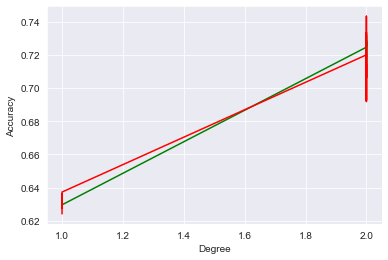

In [377]:
plt.plot(training['degree'],training['training_score'],color='green')
plt.plot(testing['degree'],testing['testing_score'],color='red')
plt.xlabel('Degree')
plt.ylabel('Accuracy')

In [378]:
training[training['index']<=9]

,index,training_score,degree
0,0,0.633843,1
1,1,0.631117,1
2,2,0.631948,1
3,3,0.631661,1
4,4,0.631712,1
5,5,0.630626,1
6,6,0.631342,1
7,7,0.630027,1
8,8,0.631279,1
9,9,0.629659,1


Text(0, 0.5, 'Test Score (R-Squared)')

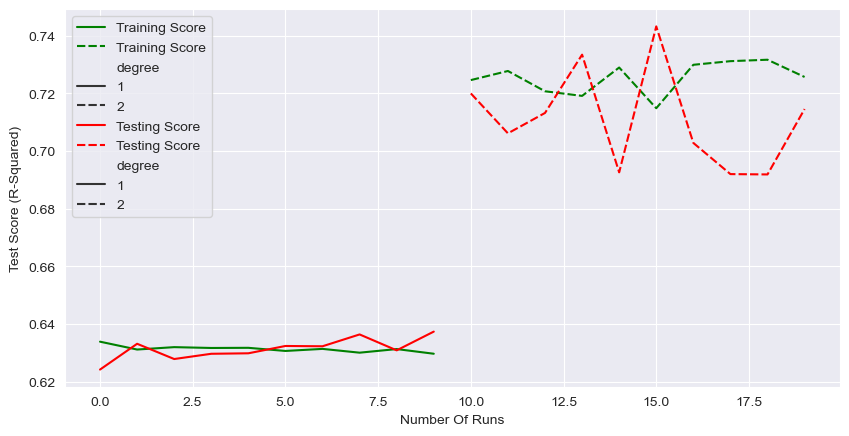

In [379]:
figure = plt.figure(figsize=(10,5),dpi=100)
sns.lineplot(x= training['index'],y= training['training_score'] ,color='green',data=training,style='degree',label='Training Score')
sns.lineplot(x=testing['index'],y= testing['testing_score'],color='red',data=testing,style='degree',label='Testing Score')
plt.xlabel('Number Of Runs')
plt.ylabel('Test Score (R-Squared)')

In [380]:
# Mean Testing Score
polynomial_reg_cv = np.mean(testing_score)
print(polynomial_reg_cv)

0.6711584722576384


In [381]:
np.mean(training_score)

0.6783650782795402

In [382]:
print('The cross validated score of the best Polynomial Regressor model is: {}'.format(round(np.mean(testing_score),4)))

The cross validated score of the best Polynomial Regressor model is: 0.6712


One Can Clearly see from the above plot that the Regression with 2nd Degree Polynomials Outperform the linear function. The Cross Validated Test Score (R-Squared) that we are able to get form the linear regression with degree 2 is: 0.6534 which means that in this model 65.34% of the variance of the price is explaned by our explanatory variables

 Gettig back the original train test split results and the scaling

In [383]:
X_train  , X_test , y_train , y_test = train_test_split(X,y,random_state = 0)

In [384]:
scaler = MinMaxScaler()

In [385]:
X_trn = scaler.fit_transform(X_train)
X_tst = scaler.transform(X_test)
        
X_train = pd.DataFrame(X_trn,columns=X_train.columns)
X_test = pd.DataFrame(X_tst,columns=X_test.columns)
        

# Model 8 - Linear Support Vector Regressor

In [386]:
from sklearn.svm import LinearSVR

In [387]:
linear_svr = LinearSVR()

In [388]:
linear_svr.fit(X_train_sample,y_train_sample)

LinearSVR()

In [389]:
grid_params = {'C':[0.001,0.01,0.1,1,10,100,1000],'epsilon':[0, 0.01, 0.1, 0.5, 1, 2, 4]}

In [390]:
grid = GridSearchCV(linear_svr,grid_params,cv=kfold,verbose=5)

In [391]:
grid.fit(X_train_sample,y_train_sample)

Fitting 5 folds for each of 49 candidates, totalling 245 fits
[CV] C=0.001, epsilon=0 ..............................................
[CV] ................. C=0.001, epsilon=0, score=-2.163, total=   0.0s
[CV] C=0.001, epsilon=0 ..............................................
[CV] ................. C=0.001, epsilon=0, score=-2.768, total=   0.0s
[CV] C=0.001, epsilon=0 ..............................................
[CV] ................. C=0.001, epsilon=0, score=-2.751, total=   0.0s
[CV] C=0.001, epsilon=0 ..............................................
[CV] ................. C=0.001, epsilon=0, score=-3.501, total=   0.0s
[CV] C=0.001, epsilon=0 ..............................................
[CV] ................. C=0.001, epsilon=0, score=-2.584, total=   0.0s
[CV] C=0.001, epsilon=0.01 ...........................................
[CV] .............. C=0.001, epsilon=0.01, score=-2.163, total=   0.0s
[CV] C=0.001, epsilon=0.01 ...........................................
[CV] ..........

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


[CV] ................. C=0.001, epsilon=4, score=-2.751, total=   0.0s
[CV] C=0.001, epsilon=4 ..............................................
[CV] ................. C=0.001, epsilon=4, score=-3.501, total=   0.0s
[CV] C=0.001, epsilon=4 ..............................................
[CV] ................. C=0.001, epsilon=4, score=-2.584, total=   0.0s
[CV] C=0.01, epsilon=0 ...............................................
[CV] .................. C=0.01, epsilon=0, score=-2.162, total=   0.0s
[CV] C=0.01, epsilon=0 ...............................................
[CV] .................. C=0.01, epsilon=0, score=-2.768, total=   0.0s
[CV] C=0.01, epsilon=0 ...............................................
[CV] .................. C=0.01, epsilon=0, score=-2.750, total=   0.0s
[CV] C=0.01, epsilon=0 ...............................................
[CV] .................. C=0.01, epsilon=0, score=-3.500, total=   0.0s
[CV] C=0.01, epsilon=0 ...............................................
[CV] .

[CV] ................... C=0.1, epsilon=4, score=-2.160, total=   0.0s
[CV] C=0.1, epsilon=4 ................................................
[CV] ................... C=0.1, epsilon=4, score=-2.766, total=   0.0s
[CV] C=0.1, epsilon=4 ................................................
[CV] ................... C=0.1, epsilon=4, score=-2.748, total=   0.0s
[CV] C=0.1, epsilon=4 ................................................
[CV] ................... C=0.1, epsilon=4, score=-3.497, total=   0.0s
[CV] C=0.1, epsilon=4 ................................................
[CV] ................... C=0.1, epsilon=4, score=-2.581, total=   0.0s
[CV] C=1, epsilon=0 ..................................................
[CV] ..................... C=1, epsilon=0, score=-2.139, total=   0.0s
[CV] C=1, epsilon=0 ..................................................
[CV] ..................... C=1, epsilon=0, score=-2.740, total=   0.0s
[CV] C=1, epsilon=0 ..................................................
[CV] .

[CV] .................... C=10, epsilon=4, score=-1.937, total=   0.0s
[CV] C=10, epsilon=4 .................................................
[CV] .................... C=10, epsilon=4, score=-2.491, total=   0.0s
[CV] C=10, epsilon=4 .................................................
[CV] .................... C=10, epsilon=4, score=-2.458, total=   0.0s
[CV] C=10, epsilon=4 .................................................
[CV] .................... C=10, epsilon=4, score=-3.124, total=   0.0s
[CV] C=10, epsilon=4 .................................................
[CV] .................... C=10, epsilon=4, score=-2.288, total=   0.0s
[CV] C=100, epsilon=0 ................................................
[CV] ................... C=100, epsilon=0, score=-0.589, total=   0.0s
[CV] C=100, epsilon=0 ................................................
[CV] ................... C=100, epsilon=0, score=-0.830, total=   0.0s
[CV] C=100, epsilon=0 ................................................
[CV] .

[CV] ................... C=1000, epsilon=2, score=0.156, total=   0.0s
[CV] C=1000, epsilon=4 ...............................................
[CV] ................... C=1000, epsilon=4, score=0.096, total=   0.0s
[CV] C=1000, epsilon=4 ...............................................
[CV] ................... C=1000, epsilon=4, score=0.026, total=   0.0s
[CV] C=1000, epsilon=4 ...............................................
[CV] ................... C=1000, epsilon=4, score=0.088, total=   0.0s
[CV] C=1000, epsilon=4 ...............................................
[CV] ................... C=1000, epsilon=4, score=0.100, total=   0.0s
[CV] C=1000, epsilon=4 ...............................................
[CV] ................... C=1000, epsilon=4, score=0.152, total=   0.0s


[Parallel(n_jobs=1)]: Done 245 out of 245 | elapsed:    1.2s finished


GridSearchCV(cv=KFold(n_splits=5, random_state=0, shuffle=False),
             estimator=LinearSVR(),
             param_grid={'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000],
                         'epsilon': [0, 0.01, 0.1, 0.5, 1, 2, 4]},
             verbose=5)

In [392]:
grid.best_params_

{'C': 1000, 'epsilon': 2}

In [393]:
grid.best_score_

0.09423368334530693

In [394]:
results_linear_svr = pd.DataFrame(grid.cv_results_)

In [395]:
results_linear_svr.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_epsilon,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.003192,3.988779e-04,0.001816,3.915267e-04,0.001,0,"{'C': 0.001, 'epsilon': 0}",-2.162521,-2.768467,-2.750646,-3.50084,-2.584142,-2.753323,0.432825,43
1,0.003214,3.884342e-04,0.001589,4.989154e-04,0.001,0.01,"{'C': 0.001, 'epsilon': 0.01}",-2.162521,-2.768467,-2.750646,-3.50084,-2.584142,-2.753323,0.432825,43
2,0.003391,4.885000e-04,0.001596,4.887142e-04,0.001,0.1,"{'C': 0.001, 'epsilon': 0.1}",-2.162521,-2.768467,-2.750646,-3.50084,-2.584142,-2.753323,0.432825,43
3,0.003191,3.991128e-04,0.001596,4.888113e-04,0.001,0.5,"{'C': 0.001, 'epsilon': 0.5}",-2.162521,-2.768467,-2.750646,-3.50084,-2.584142,-2.753323,0.432825,43
4,0.002992,1.784161e-07,0.001995,1.784161e-07,0.001,1,"{'C': 0.001, 'epsilon': 1}",-2.162521,-2.768467,-2.750646,-3.50084,-2.584142,-2.753323,0.432825,43


Text(0.5, 1.0, 'HeatMap Of Mean Test Score With respect To C and epsilon parameters')

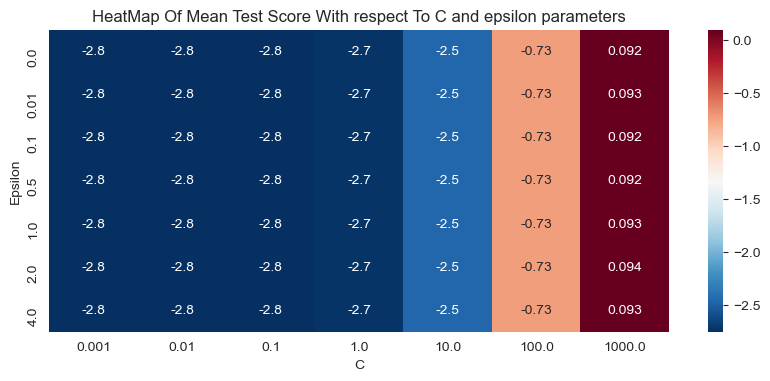

In [396]:
fig = plt.figure(figsize=(10,4),dpi=100)
sns.heatmap(results_linear_svr.pivot_table(index='param_epsilon',columns='param_C',values='mean_test_score'),annot=True,cmap='RdBu_r')
plt.ylabel('Epsilon')
plt.xlabel('C')
plt.title('HeatMap Of Mean Test Score With respect To C and epsilon parameters')

In [397]:
linear_svm = LinearSVR(epsilon=0,C=1000)

In [398]:
linear_svm.fit(X_train_sample,y_train_sample)

LinearSVR(C=1000, epsilon=0)

In [399]:
linear_svm_cross_val_score = cross_val_score(linear_svm,X_train_sample,y_train_sample,cv=kfold,verbose=5)
mean_cross_val_linear_svm = linear_svm_cross_val_score.mean()

[CV]  ................................................................
[CV] .................................... , score=0.101, total=   0.0s
[CV]  ................................................................
[CV] .................................... , score=0.028, total=   0.0s
[CV]  ................................................................
[CV] .................................... , score=0.088, total=   0.0s
[CV]  ................................................................
[CV] .................................... , score=0.098, total=   0.0s
[CV]  ................................................................
[CV] .................................... , score=0.153, total=   0.0s


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


In [400]:
print('The Final Accuracy Score That was Achived With Our Best Linear SVM Model with the value of C being 1000 and having epsilon as 0.5 Norm is: {} '.format(round(mean_cross_val_linear_svm,4)))

The Final Accuracy Score That was Achived With Our Best Linear SVM Model with the value of C being 1000 and having epsilon as 0.5 Norm is: 0.0936 


# Support Vector Machines Kernel Trick

## Model 9: SVM with Linear Kernel

In [401]:
svm_linear_kernel = SVR(kernel='linear')

In [402]:
grid_params = {'C':[0.001,0.01,0.1,1,10,100,1000]}

In [403]:
grid = GridSearchCV(svm_linear_kernel,grid_params,cv=kfold,verbose=5)

In [404]:
grid.fit(X_train_sample,y_train_sample)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Fitting 5 folds for each of 7 candidates, totalling 35 fits
[CV] C=0.001 .........................................................
[CV] ............................ C=0.001, score=-0.067, total=   0.1s
[CV] C=0.001 .........................................................
[CV] ............................ C=0.001, score=-0.132, total=   0.0s
[CV] C=0.001 .........................................................
[CV] ............................ C=0.001, score=-0.073, total=   0.0s
[CV] C=0.001 .........................................................


[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s


[CV] ............................ C=0.001, score=-0.070, total=   0.0s
[CV] C=0.001 .........................................................
[CV] ............................ C=0.001, score=-0.010, total=   0.0s
[CV] C=0.01 ..........................................................
[CV] ............................. C=0.01, score=-0.067, total=   0.0s
[CV] C=0.01 ..........................................................
[CV] ............................. C=0.01, score=-0.132, total=   0.0s
[CV] C=0.01 ..........................................................
[CV] ............................. C=0.01, score=-0.073, total=   0.1s
[CV] C=0.01 ..........................................................
[CV] ............................. C=0.01, score=-0.070, total=   0.0s
[CV] C=0.01 ..........................................................
[CV] ............................. C=0.01, score=-0.010, total=   0.0s
[CV] C=0.1 ...........................................................
[CV] .

[Parallel(n_jobs=1)]: Done  35 out of  35 | elapsed:    1.6s finished


GridSearchCV(cv=KFold(n_splits=5, random_state=0, shuffle=False),
             estimator=SVR(kernel='linear'),
             param_grid={'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000]}, verbose=5)

In [405]:
grid.best_params_

{'C': 1000}

In [406]:
grid.best_score_

0.0631502866821286

In [407]:
results_linearkernel_svm = pd.DataFrame(grid.cv_results_)

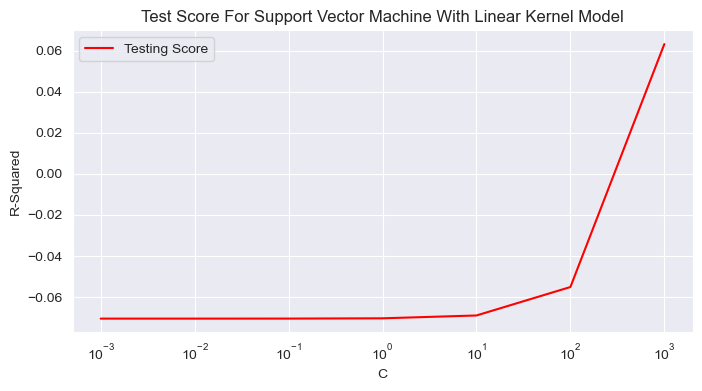

In [408]:
fig = plt.figure(figsize=(8,4),dpi=100)

plt.plot(results_linearkernel_svm['param_C'],
         results_linearkernel_svm['mean_test_score'],color='red',label ='Testing Score')
plt.xscale('log')
plt.xlabel('C')
plt.ylabel('R-Squared')
plt.title('Test Score For Support Vector Machine With Linear Kernel Model')
plt.legend()

In [409]:
svm_linear_kernel = SVR(kernel='linear',C=1000)

In [410]:
svm_linear_kernel.fit(X_train_sample,y_train_sample)

SVR(C=1000, kernel='linear')

In [411]:
svm_linearKernel_cross_val_score = cross_val_score(svm_linear_kernel,X_train_sample,y_train_sample,cv=kfold,verbose=5)
mean_cross_val_svm_linearKernel = svm_linearKernel_cross_val_score.mean()

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s


[CV]  ................................................................
[CV] .................................... , score=0.065, total=   0.1s
[CV]  ................................................................
[CV] .................................... , score=0.005, total=   0.0s
[CV]  ................................................................
[CV] .................................... , score=0.058, total=   0.0s
[CV]  ................................................................
[CV] .................................... , score=0.074, total=   0.0s
[CV]  ................................................................
[CV] .................................... , score=0.114, total=   0.1s


[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.2s finished


In [412]:
print('The Final Accuracy Score That was Achived With Our Best SVM Model With Linear Kernel with the value of C being 1000 : {} '.format(round(mean_cross_val_svm_linearKernel,4)))

The Final Accuracy Score That was Achived With Our Best SVM Model With Linear Kernel with the value of C being 1000 : 0.0632 


## Model 10: SVM with RBF Kernel

In [413]:
svm_rbf_kernel = SVR(kernel='rbf')

In [414]:
grid_params = {'gamma':[0.001,0.01,0.1,1,10,100,1000],'C':[0.001,0.01,0.1,1,10,100,1000]}

In [415]:
grid = GridSearchCV(svm_rbf_kernel,grid_params,cv=kfold,verbose=5)

In [416]:
grid.fit(X_train_sample,y_train_sample)

Fitting 5 folds for each of 49 candidates, totalling 245 fits
[CV] C=0.001, gamma=0.001 ............................................
[CV] ............... C=0.001, gamma=0.001, score=-0.067, total=   0.1s
[CV] C=0.001, gamma=0.001 ............................................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


[CV] ............... C=0.001, gamma=0.001, score=-0.132, total=   0.1s
[CV] C=0.001, gamma=0.001 ............................................


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.2s remaining:    0.0s


[CV] ............... C=0.001, gamma=0.001, score=-0.073, total=   0.1s
[CV] C=0.001, gamma=0.001 ............................................
[CV] ............... C=0.001, gamma=0.001, score=-0.070, total=   0.1s
[CV] C=0.001, gamma=0.001 ............................................
[CV] ............... C=0.001, gamma=0.001, score=-0.010, total=   0.1s
[CV] C=0.001, gamma=0.01 .............................................
[CV] ................ C=0.001, gamma=0.01, score=-0.067, total=   0.1s
[CV] C=0.001, gamma=0.01 .............................................
[CV] ................ C=0.001, gamma=0.01, score=-0.132, total=   0.1s
[CV] C=0.001, gamma=0.01 .............................................
[CV] ................ C=0.001, gamma=0.01, score=-0.073, total=   0.1s
[CV] C=0.001, gamma=0.01 .............................................
[CV] ................ C=0.001, gamma=0.01, score=-0.070, total=   0.1s
[CV] C=0.001, gamma=0.01 .............................................
[CV] .

[CV] .................. C=0.01, gamma=100, score=-0.067, total=   0.1s
[CV] C=0.01, gamma=100 ...............................................
[CV] .................. C=0.01, gamma=100, score=-0.132, total=   0.1s
[CV] C=0.01, gamma=100 ...............................................
[CV] .................. C=0.01, gamma=100, score=-0.073, total=   0.1s
[CV] C=0.01, gamma=100 ...............................................
[CV] .................. C=0.01, gamma=100, score=-0.070, total=   0.1s
[CV] C=0.01, gamma=100 ...............................................
[CV] .................. C=0.01, gamma=100, score=-0.010, total=   0.1s
[CV] C=0.01, gamma=1000 ..............................................
[CV] ................. C=0.01, gamma=1000, score=-0.067, total=   0.1s
[CV] C=0.01, gamma=1000 ..............................................
[CV] ................. C=0.01, gamma=1000, score=-0.132, total=   0.1s
[CV] C=0.01, gamma=1000 ..............................................
[CV] .

[CV] ..................... C=1, gamma=0.1, score=-0.010, total=   0.1s
[CV] C=1, gamma=1 ....................................................
[CV] ....................... C=1, gamma=1, score=-0.067, total=   0.1s
[CV] C=1, gamma=1 ....................................................
[CV] ....................... C=1, gamma=1, score=-0.132, total=   0.1s
[CV] C=1, gamma=1 ....................................................
[CV] ....................... C=1, gamma=1, score=-0.073, total=   0.1s
[CV] C=1, gamma=1 ....................................................
[CV] ....................... C=1, gamma=1, score=-0.069, total=   0.1s
[CV] C=1, gamma=1 ....................................................
[CV] ....................... C=1, gamma=1, score=-0.010, total=   0.1s
[CV] C=1, gamma=10 ...................................................
[CV] ...................... C=1, gamma=10, score=-0.067, total=   0.1s
[CV] C=1, gamma=10 ...................................................
[CV] .

[CV] ................. C=100, gamma=0.001, score=-0.073, total=   0.1s
[CV] C=100, gamma=0.001 ..............................................
[CV] ................. C=100, gamma=0.001, score=-0.070, total=   0.1s
[CV] C=100, gamma=0.001 ..............................................
[CV] ................. C=100, gamma=0.001, score=-0.010, total=   0.1s
[CV] C=100, gamma=0.01 ...............................................
[CV] .................. C=100, gamma=0.01, score=-0.067, total=   0.1s
[CV] C=100, gamma=0.01 ...............................................
[CV] .................. C=100, gamma=0.01, score=-0.132, total=   0.1s
[CV] C=100, gamma=0.01 ...............................................
[CV] .................. C=100, gamma=0.01, score=-0.073, total=   0.1s
[CV] C=100, gamma=0.01 ...............................................
[CV] .................. C=100, gamma=0.01, score=-0.069, total=   0.1s
[CV] C=100, gamma=0.01 ...............................................
[CV] .

[CV] .................. C=1000, gamma=100, score=-0.124, total=   0.1s
[CV] C=1000, gamma=100 ...............................................
[CV] .................. C=1000, gamma=100, score=-0.066, total=   0.1s
[CV] C=1000, gamma=100 ...............................................
[CV] .................. C=1000, gamma=100, score=-0.063, total=   0.1s
[CV] C=1000, gamma=100 ...............................................
[CV] .................. C=1000, gamma=100, score=-0.002, total=   0.1s
[CV] C=1000, gamma=1000 ..............................................
[CV] ................. C=1000, gamma=1000, score=-0.068, total=   0.1s
[CV] C=1000, gamma=1000 ..............................................
[CV] ................. C=1000, gamma=1000, score=-0.132, total=   0.1s
[CV] C=1000, gamma=1000 ..............................................
[CV] ................. C=1000, gamma=1000, score=-0.072, total=   0.1s
[CV] C=1000, gamma=1000 ..............................................
[CV] .

[Parallel(n_jobs=1)]: Done 245 out of 245 | elapsed:   19.0s finished


GridSearchCV(cv=KFold(n_splits=5, random_state=0, shuffle=False),
             estimator=SVR(),
             param_grid={'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000],
                         'gamma': [0.001, 0.01, 0.1, 1, 10, 100, 1000]},
             verbose=5)

In [417]:
grid.best_params_

{'C': 1000, 'gamma': 1}

In [418]:
grid.best_score_

0.06350594565406506

In [419]:
results_RBFkernel_svm = pd.DataFrame(grid.cv_results_)

In [420]:
results_RBFkernel_svm.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_gamma,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.065225,0.001620,0.011170,3.985885e-04,0.001,0.001,"{'C': 0.001, 'gamma': 0.001}",-0.067215,-0.132265,-0.072978,-0.069548,-0.0104,-0.070481,0.038587,49
1,0.062222,0.001616,0.011381,4.792394e-04,0.001,0.01,"{'C': 0.001, 'gamma': 0.01}",-0.067215,-0.132265,-0.072978,-0.069548,-0.0104,-0.070481,0.038587,47
2,0.062430,0.001627,0.011372,4.925539e-04,0.001,0.1,"{'C': 0.001, 'gamma': 0.1}",-0.067215,-0.132265,-0.072978,-0.069548,-0.0104,-0.070481,0.038587,43
3,0.060438,0.002148,0.010971,9.536743e-08,0.001,1,"{'C': 0.001, 'gamma': 1}",-0.067215,-0.132265,-0.072978,-0.069548,-0.0104,-0.070481,0.038587,37
4,0.061045,0.002924,0.011768,3.993078e-04,0.001,10,"{'C': 0.001, 'gamma': 10}",-0.067215,-0.132265,-0.072978,-0.069548,-0.0104,-0.070481,0.038587,38


Text(0.5, 1.0, 'Displaying The Test Score for the Range of cost function C And For Different Gama values')

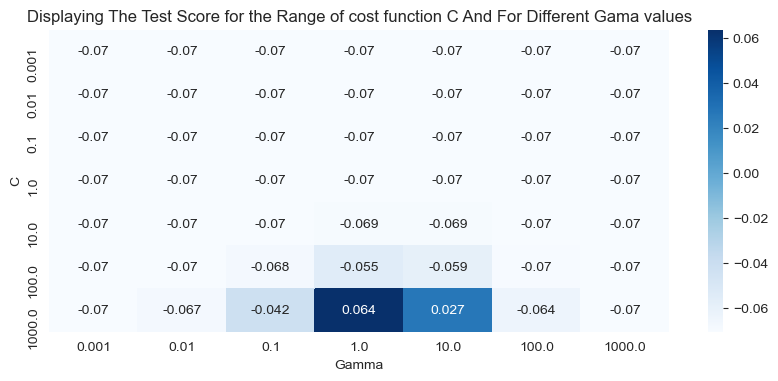

In [421]:
fig = plt.figure(figsize=(10,4),dpi=100)
sns.heatmap(results_RBFkernel_svm.pivot_table(index='param_C',columns='param_gamma',values='mean_test_score'),cmap='Blues',annot=True)
plt.xlabel('Gamma')
plt.ylabel('C')
plt.title('Displaying The Test Score for the Range of cost function C And For Different Gama values')

Text(0.5, 1.0, 'Train Vs Test Accuracy For Linear Support Vector Machine Model')

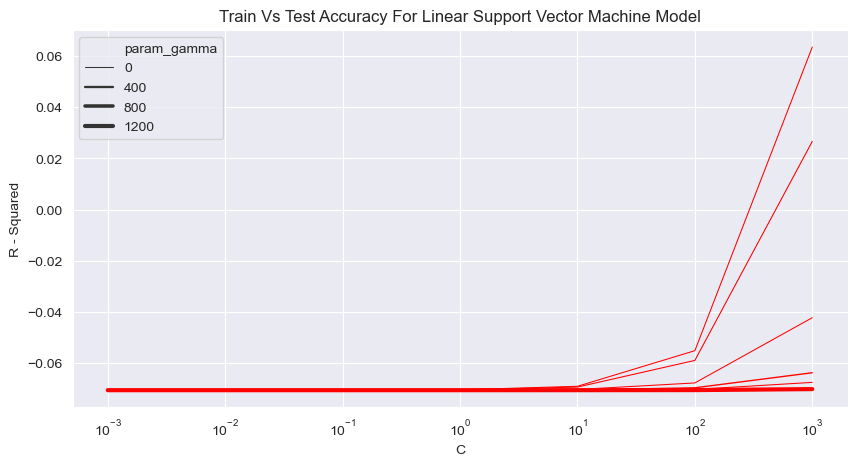

In [422]:
fig = plt.figure(figsize=(10,5),dpi=100)

sns.lineplot(x= results_RBFkernel_svm['param_C'],y= results_RBFkernel_svm['mean_test_score'],
size=results_RBFkernel_svm['param_gamma'],color='red')

plt.xscale('log')
plt.xlabel('C')
plt.ylabel('R - Squared')
plt.title('Train Vs Test Accuracy For Linear Support Vector Machine Model')



From The Above plot it can be clearly seen that the most accuracy can be obtained in the test dataset if the SVM with rbf Kernel is used with the C: 1000 and gamma: 1. The accuracy that was obtained for the test data set at this value of the cost function was 0.075 which is the R-Squared value which indicates that about only 7.5% of variation in price can be explained by our 15 explanatory.

This R-Squared Value could be considered as very poor as the value is very far from the ideal R-squared of 1.
The model was very time consuming and had very high computational complexity but still cold not deliver satisfactory results

In [423]:
svm_rbf_kernel = SVR(kernel='rbf',C=1000,gamma=1)

In [424]:
svm_rbf_kernel.fit(X_train_sample,y_train_sample)

SVR(C=1000, gamma=1)

In [425]:
svm_rbfKernel_cross_val_score = cross_val_score(svm_rbf_kernel,X_train_sample,y_train_sample,cv=kfold,verbose=5)
mean_cross_val_svm_rbf_kernel = svm_rbfKernel_cross_val_score.mean()

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s remaining:    0.0s


[CV]  ................................................................
[CV] .................................... , score=0.053, total=   0.1s
[CV]  ................................................................
[CV] .................................... , score=0.011, total=   0.1s
[CV]  ................................................................
[CV] .................................... , score=0.069, total=   0.1s
[CV]  ................................................................
[CV] .................................... , score=0.080, total=   0.1s
[CV]  ................................................................
[CV] .................................... , score=0.104, total=   0.1s


[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.3s finished


In [426]:
print('The Final Accuracy Score That was Achived With Our Best SVM Model With RBF Kernel with the value of C being 1000 and that of gamma being 1 is : {})'.format(round(mean_cross_val_svm_rbf_kernel,4)))

The Final Accuracy Score That was Achived With Our Best SVM Model With RBF Kernel with the value of C being 1000 and that of gamma being 1 is : 0.0635)


## Model 11: SVM with Polynomial Kernel

In [427]:
svm_poly_kernal = SVR(kernel='poly')

In [428]:
grid_params = {'gamma':[0.01,0.1,1,10,100],'C':[0.01,0.1,1,10,100,1000],'degree':[1,2,3]}

In [429]:
kfold = KFold(n_splits=3,random_state=0)

C:\Users\behab\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:297: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


In [430]:
grid = GridSearchCV(svm_poly_kernal,grid_params,cv=kfold,verbose=5)

In [431]:
grid.fit(X_train_sample,y_train_sample)

Fitting 3 folds for each of 90 candidates, totalling 270 fits
[CV] C=0.01, degree=1, gamma=0.01 ....................................
[CV] ....... C=0.01, degree=1, gamma=0.01, score=-0.089, total=   0.0s
[CV] C=0.01, degree=1, gamma=0.01 ....................................
[CV] ....... C=0.01, degree=1, gamma=0.01, score=-0.087, total=   0.0s
[CV] C=0.01, degree=1, gamma=0.01 ....................................
[CV] ....... C=0.01, degree=1, gamma=0.01, score=-0.024, total=   0.0s
[CV] C=0.01, degree=1, gamma=0.1 .....................................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s


[CV] ........ C=0.01, degree=1, gamma=0.1, score=-0.089, total=   0.0s
[CV] C=0.01, degree=1, gamma=0.1 .....................................
[CV] ........ C=0.01, degree=1, gamma=0.1, score=-0.087, total=   0.0s
[CV] C=0.01, degree=1, gamma=0.1 .....................................
[CV] ........ C=0.01, degree=1, gamma=0.1, score=-0.024, total=   0.0s
[CV] C=0.01, degree=1, gamma=1 .......................................
[CV] .......... C=0.01, degree=1, gamma=1, score=-0.089, total=   0.0s
[CV] C=0.01, degree=1, gamma=1 .......................................
[CV] .......... C=0.01, degree=1, gamma=1, score=-0.087, total=   0.0s
[CV] C=0.01, degree=1, gamma=1 .......................................
[CV] .......... C=0.01, degree=1, gamma=1, score=-0.024, total=   0.0s
[CV] C=0.01, degree=1, gamma=10 ......................................
[CV] ......... C=0.01, degree=1, gamma=10, score=-0.089, total=   0.0s
[CV] C=0.01, degree=1, gamma=10 ......................................
[CV] .

[CV] ......... C=0.1, degree=2, gamma=0.1, score=-0.087, total=   0.0s
[CV] C=0.1, degree=2, gamma=0.1 ......................................
[CV] ......... C=0.1, degree=2, gamma=0.1, score=-0.024, total=   0.0s
[CV] C=0.1, degree=2, gamma=1 ........................................
[CV] ........... C=0.1, degree=2, gamma=1, score=-0.089, total=   0.0s
[CV] C=0.1, degree=2, gamma=1 ........................................
[CV] ........... C=0.1, degree=2, gamma=1, score=-0.087, total=   0.0s
[CV] C=0.1, degree=2, gamma=1 ........................................
[CV] ........... C=0.1, degree=2, gamma=1, score=-0.024, total=   0.0s
[CV] C=0.1, degree=2, gamma=10 .......................................
[CV] .......... C=0.1, degree=2, gamma=10, score=-0.085, total=   0.0s
[CV] C=0.1, degree=2, gamma=10 .......................................
[CV] .......... C=0.1, degree=2, gamma=10, score=-0.081, total=   0.0s
[CV] C=0.1, degree=2, gamma=10 .......................................
[CV] .

[CV] ........... C=1, degree=3, gamma=0.1, score=-0.089, total=   0.1s
[CV] C=1, degree=3, gamma=0.1 ........................................
[CV] ........... C=1, degree=3, gamma=0.1, score=-0.087, total=   0.1s
[CV] C=1, degree=3, gamma=0.1 ........................................
[CV] ........... C=1, degree=3, gamma=0.1, score=-0.024, total=   0.1s
[CV] C=1, degree=3, gamma=1 ..........................................
[CV] ............. C=1, degree=3, gamma=1, score=-0.088, total=   0.1s
[CV] C=1, degree=3, gamma=1 ..........................................
[CV] ............. C=1, degree=3, gamma=1, score=-0.085, total=   0.1s
[CV] C=1, degree=3, gamma=1 ..........................................
[CV] ............. C=1, degree=3, gamma=1, score=-0.022, total=   0.1s
[CV] C=1, degree=3, gamma=10 .........................................
[CV] ............. C=1, degree=3, gamma=10, score=0.476, total=   0.1s
[CV] C=1, degree=3, gamma=10 .........................................
[CV] .

[CV] ......... C=100, degree=1, gamma=0.1, score=-0.023, total=   0.0s
[CV] C=100, degree=1, gamma=1 ........................................
[CV] ........... C=100, degree=1, gamma=1, score=-0.077, total=   0.0s
[CV] C=100, degree=1, gamma=1 ........................................
[CV] ........... C=100, degree=1, gamma=1, score=-0.073, total=   0.0s
[CV] C=100, degree=1, gamma=1 ........................................
[CV] ........... C=100, degree=1, gamma=1, score=-0.013, total=   0.0s
[CV] C=100, degree=1, gamma=10 .......................................
[CV] ........... C=100, degree=1, gamma=10, score=0.027, total=   0.0s
[CV] C=100, degree=1, gamma=10 .......................................
[CV] ........... C=100, degree=1, gamma=10, score=0.022, total=   0.0s
[CV] C=100, degree=1, gamma=10 .......................................
[CV] ........... C=100, degree=1, gamma=10, score=0.091, total=   0.0s
[CV] C=100, degree=1, gamma=100 ......................................
[CV] .

[CV] ........ C=1000, degree=2, gamma=0.1, score=-0.081, total=   0.0s
[CV] C=1000, degree=2, gamma=0.1 .....................................
[CV] ........ C=1000, degree=2, gamma=0.1, score=-0.019, total=   0.0s
[CV] C=1000, degree=2, gamma=1 .......................................
[CV] ........... C=1000, degree=2, gamma=1, score=0.269, total=   0.0s
[CV] C=1000, degree=2, gamma=1 .......................................
[CV] ........... C=1000, degree=2, gamma=1, score=0.262, total=   0.0s
[CV] C=1000, degree=2, gamma=1 .......................................
[CV] ........... C=1000, degree=2, gamma=1, score=0.323, total=   0.0s
[CV] C=1000, degree=2, gamma=10 ......................................
[CV] .......... C=1000, degree=2, gamma=10, score=0.651, total=   0.0s
[CV] C=1000, degree=2, gamma=10 ......................................
[CV] .......... C=1000, degree=2, gamma=10, score=0.612, total=   0.1s
[CV] C=1000, degree=2, gamma=10 ......................................
[CV] .

[Parallel(n_jobs=1)]: Done 270 out of 270 | elapsed: 41.5min finished


GridSearchCV(cv=KFold(n_splits=3, random_state=0, shuffle=False),
             estimator=SVR(kernel='poly'),
             param_grid={'C': [0.01, 0.1, 1, 10, 100, 1000],
                         'degree': [1, 2, 3],
                         'gamma': [0.01, 0.1, 1, 10, 100]},
             verbose=5)

In [432]:
grid.best_params_

{'C': 0.1, 'degree': 3, 'gamma': 100}

In [433]:
grid.best_score_

0.631682418406088

In [434]:
results_Polynomialkernel_svm = pd.DataFrame(grid.cv_results_)

In [435]:
results_Polynomialkernel_svm.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_degree,param_gamma,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score
0,0.032912,0.000814,0.009643,0.000467,0.01,1,0.01,"{'C': 0.01, 'degree': 1, 'gamma': 0.01}",-0.089227,-0.087424,-0.023900,-0.066850,0.030380,84
1,0.031598,0.000456,0.009641,0.000434,0.01,1,0.1,"{'C': 0.01, 'degree': 1, 'gamma': 0.1}",-0.089227,-0.087424,-0.023900,-0.066850,0.030380,78
2,0.030584,0.000475,0.008939,0.000027,0.01,1,1,"{'C': 0.01, 'degree': 1, 'gamma': 1}",-0.089226,-0.087423,-0.023899,-0.066849,0.030379,72
3,0.032261,0.001239,0.009294,0.000480,0.01,1,10,"{'C': 0.01, 'degree': 1, 'gamma': 10}",-0.089218,-0.087410,-0.023890,-0.066839,0.030379,63
4,0.031265,0.000495,0.008619,0.000480,0.01,1,100,"{'C': 0.01, 'degree': 1, 'gamma': 100}",-0.089133,-0.087280,-0.023801,-0.066738,0.030370,55


Text(0.5, 1.0, 'Gamma Vs Test Accuracy with respect to different polynomial degree')

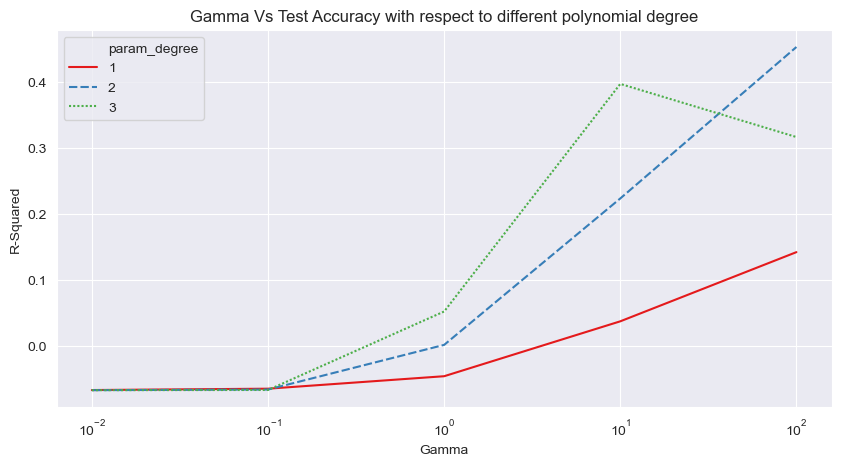

In [436]:
fig = plt.figure(figsize=(10,5),dpi=100)
sns.lineplot(results_Polynomialkernel_svm['param_gamma'],results_Polynomialkernel_svm['mean_test_score'],
             style=results_Polynomialkernel_svm['param_degree'],
             hue=results_Polynomialkernel_svm['param_degree'],ci=None,palette='Set1')

plt.xscale('log')
plt.xlabel('Gamma')
plt.ylabel('R-Squared')
plt.title('Gamma Vs Test Accuracy with respect to different polynomial degree')

Text(0.5, 1.0, 'HeatMap Of Mean Test Score With respect To C and Gamma parameters')

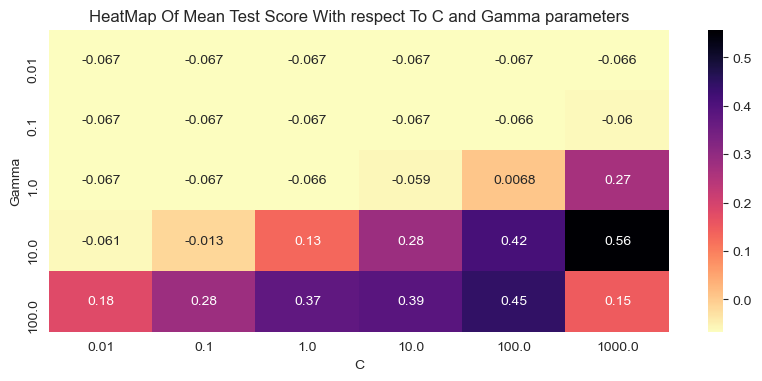

In [437]:
fig = plt.figure(figsize=(10,4),dpi=100)
sns.heatmap(results_Polynomialkernel_svm.pivot_table(index='param_gamma',columns='param_C',values='mean_test_score'),annot=True,cmap='magma_r')
plt.ylabel('Gamma')
plt.xlabel('C')
plt.title('HeatMap Of Mean Test Score With respect To C and Gamma parameters')

From the Above plots it can clearly be seen that the best value of Cost parameter for the SVM with Polynomial kernel would be the 1000 and the Gamma value for the model would be 10 and the degree of the model should be 3. The test score that we get with this model is (0.675 (R-Squared)) which means that about 67.5% of the variance in the price could be explaind by our explanatory variables. This is pretty high considereing all the other previous models and the model just being trained on a sample of data.

In [438]:
svm_poly_kernal = SVR(kernel='poly',C=100,degree=3,gamma=10)

In [439]:
svm_poly_kernal.fit(X_train_sample,y_train_sample)

SVR(C=100, gamma=10, kernel='poly')

In [440]:
kfold = KFold(n_splits=10,random_state=0)

C:\Users\behab\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:297: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


In [441]:
svm_poly_kernal_cross_val_score = cross_val_score(svm_poly_kernal,X_train_sample,y_train_sample,cv=kfold,verbose=5)
mean_cross_val_svm_poly_kernal = svm_poly_kernal_cross_val_score.mean()

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s remaining:    0.0s


[CV]  ................................................................
[CV] .................................... , score=0.740, total=   0.1s
[CV]  ................................................................
[CV] .................................... , score=0.691, total=   0.1s
[CV]  ................................................................
[CV] .................................... , score=0.564, total=   0.1s
[CV]  ................................................................
[CV] .................................... , score=0.595, total=   0.1s
[CV]  ................................................................
[CV] .................................... , score=0.585, total=   0.1s
[CV]  ................................................................


[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.3s remaining:    0.0s


[CV] .................................... , score=0.657, total=   0.1s
[CV]  ................................................................
[CV] .................................... , score=0.556, total=   0.1s
[CV]  ................................................................
[CV] .................................... , score=0.572, total=   0.1s
[CV]  ................................................................
[CV] .................................... , score=0.739, total=   0.1s
[CV]  ................................................................
[CV] .................................... , score=0.584, total=   0.1s


[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.9s finished


In [442]:
mean_cross_val_svm_poly_kernal

0.6283597620217782

In [443]:
print('The Final Accuracy Score That was Achived With Our Best SVM Model With Polynomial Kernel with the value of C being 1000 and that of gamma being 10 and degree of 3 is : {} '.format(round(mean_cross_val_svm_poly_kernal,4)))

The Final Accuracy Score That was Achived With Our Best SVM Model With Polynomial Kernel with the value of C being 1000 and that of gamma being 10 and degree of 3 is : 0.6284 


# Prediction Based On the Best Model.

In [444]:
evaluation = {'Models':['KNN Regressor','Linear Regression','Ridge Regression','Lasso Regression',
                       'Decision Tree Regressor','Random Forest Regressor','Polynomial Regression','Linear SVM',
                       'SVM Linear Kernel Regressor','SVM RBF Kernel Regressor','SVM Polynomial Kernel Regressor'],
             'Test Scores':[knn_mean_score_cv,lm_mean_score_cv,ridge_mean_score_cv,lasso_mean_score_cv,tree_mean_score_cv,
                           rf_mean_score_cv,polynomial_reg_cv,mean_cross_val_linear_svm,mean_cross_val_svm_linearKernel,
                           mean_cross_val_svm_rbf_kernel,mean_cross_val_svm_poly_kernal]}

In [445]:
eva = pd.DataFrame(evaluation)

In [446]:
eva.head(15)

,Models,Test Scores
0,KNN Regressor,0.632672
1,Linear Regression,0.625564
2,Ridge Regression,0.625616
3,Lasso Regression,0.625633
4,Decision Tree Regressor,0.576007
5,Random Forest Regressor,0.651900
6,Polynomial Regression,0.671158
7,Linear SVM,0.093571
8,SVM Linear Kernel Regressor,0.063150
9,SVM RBF Kernel Regressor,0.063506


## Best Model Ranked Top To Bottom

In [447]:
eva = eva.sort_values(by='Test Scores',ascending = False)

In [448]:
eva.head(15)

,Models,Test Scores
6,Polynomial Regression,0.671158
5,Random Forest Regressor,0.651900
0,KNN Regressor,0.632672
10,SVM Polynomial Kernel Regressor,0.628360
3,Lasso Regression,0.625633
2,Ridge Regression,0.625616
1,Linear Regression,0.625564
4,Decision Tree Regressor,0.576007
7,Linear SVM,0.093571
9,SVM RBF Kernel Regressor,0.063506


Text(0.5, 0, 'Test Scores(R-Squared)')

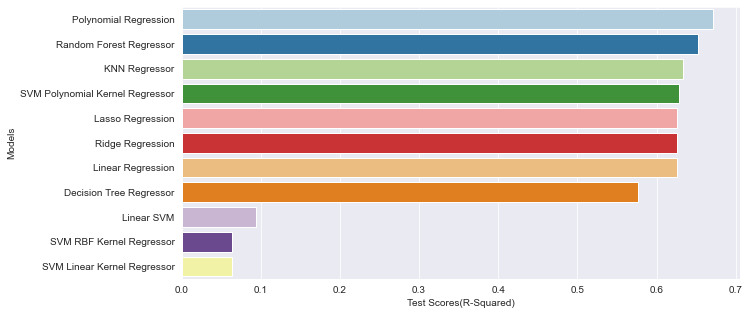

In [449]:
fig = plt.figure(figsize=(10,5))
sns.barplot(x=eva['Test Scores'],y=eva['Models'],orient='h',palette='Paired')
plt.ylabel('Models')
plt.xlabel('Test Scores(R-Squared)')

The best model is the Random Forest Regressor

As the Random Forest model is not the part of the class curriculum hence we are going to use the top 2 models for predictions which are random forest regressor and polynomial regressor

From the model that was taught in class we can say that the best model was Polynomial Regressor(Random Forest not Part of Classwork)

# Predicticting With The Best Model Overall(Random Forest Regressor)

In [450]:
rf = RandomForestRegressor(n_estimators=400,max_depth=40)

In [451]:
rf.fit(X_train,y_train)

RandomForestRegressor(max_depth=40, n_estimators=400)

In [452]:
prediction_rf = rf.predict(X_test)

In [453]:
print(prediction_rf)

[ 335752.4625     1669085.44166667  537001.1275     ...  784097.7275
  322871.025       567244.995     ]


In [454]:
# Training Score
print('The Training Score(R-Squared) of the best Random Forest Model is {}'.format(round(rf.score(X_train,y_train),2)))

The Training Score(R-Squared) of the best Random Forest Model is 0.96


In [455]:
# Testing Score
print('The Test Score(R-Squared) of the best Random Forest Model is {}'.format(round(rf.score(X_test,y_test),2)))

The Test Score(R-Squared) of the best Random Forest Model is 0.74


In [456]:
# Mean Squared Error For the Random Foresst Model
metrics.mean_squared_error(y_test,prediction_rf)

34548603889.80412

In [457]:
root_mean_squared_error_rf = round(metrics.mean_squared_error(y_test,prediction_rf)**(0.5),2)
print('The Root mean Squared error of the random forest model is: {}'.format(root_mean_squared_error_rf))

The Root mean Squared error of the random forest model is: 185872.55


# Predicticting With The Best Model among models discussed in class(Polynomial Regression)

In [458]:
scaler_poly = PolynomialFeatures(degree=2)
X_poly_trn = scaler_poly.fit_transform(X_train)
X_poly_tst =  scaler_poly.fit_transform(X_test)

In [459]:
lm_poly = LinearRegression()
lm_poly.fit(X_poly_trn,y_train)

LinearRegression()

In [460]:
pred_train = lm_poly.predict(X_poly_trn)
pred_test = lm_poly.predict(X_poly_tst)



In [461]:
# Prediction For the Test Data
print(pred_test)

[ 397594.28073596 1745850.17937834  486753.15009898 ...  732060.29861499
  334884.11250541  513867.66816136]


In [462]:
print('The Training Score(R-Squared) of the best Polynomial Regression Model is {}'.format(round(r2_score(y_train, pred_train),2)))

The Training Score(R-Squared) of the best Polynomial Regression Model is 0.73


In [463]:

print('The Testing Score(R-Squared) of the best Polynomial Regression Model is {}'.format(round(r2_score(y_test, pred_test),2)))

The Testing Score(R-Squared) of the best Polynomial Regression Model is 0.71


# Project Part 2

In [464]:
from sklearn.ensemble import BaggingRegressor

## Implementing Bagging On any two Models

Models On which Bagging Would be performed:
1) K Nearest Neighbours Regressor
2) Linear Regression

## Bagging with KNN

In [465]:
knn = KNeighborsRegressor(n_neighbors=8)
bag_reg_knn = BaggingRegressor(knn,bootstrap=True, n_jobs=-1, random_state=0)

In [466]:
kfold = KFold(n_splits=5,random_state=0)

C:\Users\behab\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:297: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


In [467]:
grid_params = {'n_estimators':[10,40,70,100],'max_samples':[0.05, 0.1, 0.2, 0.5,0.6,0.7,0.8]}

In [468]:
grid = GridSearchCV(bag_reg_knn,grid_params,cv=kfold,verbose=3)

In [469]:
grid.fit(X_train,y_train)

Fitting 5 folds for each of 28 candidates, totalling 140 fits
[CV] max_samples=0.05, n_estimators=10 ...............................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] ... max_samples=0.05, n_estimators=10, score=0.462, total=   2.9s
[CV] max_samples=0.05, n_estimators=10 ...............................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    2.8s remaining:    0.0s


[CV] ... max_samples=0.05, n_estimators=10, score=0.509, total=   0.3s
[CV] max_samples=0.05, n_estimators=10 ...............................


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    3.2s remaining:    0.0s


[CV] ... max_samples=0.05, n_estimators=10, score=0.484, total=   0.3s
[CV] max_samples=0.05, n_estimators=10 ...............................
[CV] ... max_samples=0.05, n_estimators=10, score=0.562, total=   0.3s
[CV] max_samples=0.05, n_estimators=10 ...............................
[CV] ... max_samples=0.05, n_estimators=10, score=0.526, total=   0.3s
[CV] max_samples=0.05, n_estimators=40 ...............................
[CV] ... max_samples=0.05, n_estimators=40, score=0.471, total=   0.8s
[CV] max_samples=0.05, n_estimators=40 ...............................
[CV] ... max_samples=0.05, n_estimators=40, score=0.517, total=   0.8s
[CV] max_samples=0.05, n_estimators=40 ...............................
[CV] ... max_samples=0.05, n_estimators=40, score=0.487, total=   0.9s
[CV] max_samples=0.05, n_estimators=40 ...............................
[CV] ... max_samples=0.05, n_estimators=40, score=0.558, total=   0.9s
[CV] max_samples=0.05, n_estimators=40 ...............................
[CV] .

[CV] .... max_samples=0.5, n_estimators=10, score=0.590, total=   1.6s
[CV] max_samples=0.5, n_estimators=10 ................................
[CV] .... max_samples=0.5, n_estimators=10, score=0.606, total=   1.6s
[CV] max_samples=0.5, n_estimators=10 ................................
[CV] .... max_samples=0.5, n_estimators=10, score=0.624, total=   1.3s
[CV] max_samples=0.5, n_estimators=10 ................................
[CV] .... max_samples=0.5, n_estimators=10, score=0.683, total=   1.4s
[CV] max_samples=0.5, n_estimators=10 ................................
[CV] .... max_samples=0.5, n_estimators=10, score=0.639, total=   1.5s
[CV] max_samples=0.5, n_estimators=40 ................................
[CV] .... max_samples=0.5, n_estimators=40, score=0.590, total=   5.5s
[CV] max_samples=0.5, n_estimators=40 ................................
[CV] .... max_samples=0.5, n_estimators=40, score=0.612, total=   5.8s
[CV] max_samples=0.5, n_estimators=40 ................................
[CV] .

[CV] ... max_samples=0.7, n_estimators=100, score=0.693, total=  20.6s
[CV] max_samples=0.7, n_estimators=100 ...............................
[CV] ... max_samples=0.7, n_estimators=100, score=0.649, total=  20.4s
[CV] max_samples=0.8, n_estimators=10 ................................
[CV] .... max_samples=0.8, n_estimators=10, score=0.598, total=   2.7s
[CV] max_samples=0.8, n_estimators=10 ................................
[CV] .... max_samples=0.8, n_estimators=10, score=0.607, total=   2.7s
[CV] max_samples=0.8, n_estimators=10 ................................
[CV] .... max_samples=0.8, n_estimators=10, score=0.632, total=   2.4s
[CV] max_samples=0.8, n_estimators=10 ................................
[CV] .... max_samples=0.8, n_estimators=10, score=0.693, total=   2.7s
[CV] max_samples=0.8, n_estimators=10 ................................
[CV] .... max_samples=0.8, n_estimators=10, score=0.640, total=   2.6s
[CV] max_samples=0.8, n_estimators=40 ................................
[CV] .

[Parallel(n_jobs=1)]: Done 140 out of 140 | elapsed: 15.8min finished


GridSearchCV(cv=KFold(n_splits=5, random_state=0, shuffle=False),
             estimator=BaggingRegressor(base_estimator=KNeighborsRegressor(n_neighbors=8),
                                        n_jobs=-1, random_state=0),
             param_grid={'max_samples': [0.05, 0.1, 0.2, 0.5, 0.6, 0.7, 0.8],
                         'n_estimators': [10, 40, 70, 100]},
             verbose=3)

In [470]:
grid.best_params_

{'max_samples': 0.8, 'n_estimators': 100}

In [471]:
grid.best_score_

0.6378345974073962

In [472]:
output = pd.DataFrame(grid.cv_results_)

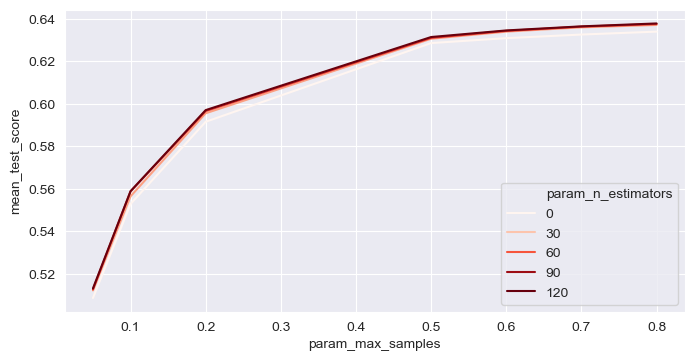

In [473]:
fig = plt.figure(figsize=(8,4),dpi=100)
sns.lineplot(x=output['param_max_samples'],y=output['mean_test_score'],hue=output['param_n_estimators'],
            palette='Reds')


In [474]:
baggaing_knn_score = grid.best_score_


In [475]:
print('The Best R Squared Value that we are getting is {}'.format(round(baggaing_knn_score,4)))

The Best R Squared Value that we are getting is 0.6378


## Bagging With Linear Regression

In [476]:
lm = LinearRegression()
bag_reg_lm = BaggingRegressor(lm,bootstrap=True, n_jobs=-1, random_state=0)

In [477]:
grid_params = {'n_estimators':[10,40,70,100],'max_samples':[0.05, 0.1, 0.2, 0.5,0.6,0.7,0.8]}

In [478]:
grid = GridSearchCV(bag_reg_lm,grid_params,cv=kfold,verbose=3)

In [479]:
grid.fit(X_train,y_train)

Fitting 5 folds for each of 28 candidates, totalling 140 fits
[CV] max_samples=0.05, n_estimators=10 ...............................
[CV] ... max_samples=0.05, n_estimators=10, score=0.632, total=   0.2s
[CV] max_samples=0.05, n_estimators=10 ...............................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s


[CV] ... max_samples=0.05, n_estimators=10, score=0.560, total=   0.2s
[CV] max_samples=0.05, n_estimators=10 ...............................
[CV] ... max_samples=0.05, n_estimators=10, score=0.629, total=   0.2s
[CV] max_samples=0.05, n_estimators=10 ...............................


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.3s remaining:    0.0s


[CV] ... max_samples=0.05, n_estimators=10, score=0.661, total=   0.2s
[CV] max_samples=0.05, n_estimators=10 ...............................
[CV] ... max_samples=0.05, n_estimators=10, score=0.628, total=   0.2s
[CV] max_samples=0.05, n_estimators=40 ...............................
[CV] ... max_samples=0.05, n_estimators=40, score=0.635, total=   0.3s
[CV] max_samples=0.05, n_estimators=40 ...............................
[CV] ... max_samples=0.05, n_estimators=40, score=0.562, total=   0.3s
[CV] max_samples=0.05, n_estimators=40 ...............................
[CV] ... max_samples=0.05, n_estimators=40, score=0.638, total=   0.3s
[CV] max_samples=0.05, n_estimators=40 ...............................
[CV] ... max_samples=0.05, n_estimators=40, score=0.663, total=   0.3s
[CV] max_samples=0.05, n_estimators=40 ...............................
[CV] ... max_samples=0.05, n_estimators=40, score=0.631, total=   0.3s
[CV] max_samples=0.05, n_estimators=70 ...............................
[CV] .

[CV] .... max_samples=0.5, n_estimators=10, score=0.638, total=   0.2s
[CV] max_samples=0.5, n_estimators=10 ................................
[CV] .... max_samples=0.5, n_estimators=10, score=0.662, total=   0.2s
[CV] max_samples=0.5, n_estimators=10 ................................
[CV] .... max_samples=0.5, n_estimators=10, score=0.631, total=   0.2s
[CV] max_samples=0.5, n_estimators=40 ................................
[CV] .... max_samples=0.5, n_estimators=40, score=0.638, total=   0.3s
[CV] max_samples=0.5, n_estimators=40 ................................
[CV] .... max_samples=0.5, n_estimators=40, score=0.556, total=   0.3s
[CV] max_samples=0.5, n_estimators=40 ................................
[CV] .... max_samples=0.5, n_estimators=40, score=0.641, total=   0.3s
[CV] max_samples=0.5, n_estimators=40 ................................
[CV] .... max_samples=0.5, n_estimators=40, score=0.662, total=   0.3s
[CV] max_samples=0.5, n_estimators=40 ................................
[CV] .

[CV] .... max_samples=0.8, n_estimators=10, score=0.561, total=   0.2s
[CV] max_samples=0.8, n_estimators=10 ................................
[CV] .... max_samples=0.8, n_estimators=10, score=0.640, total=   0.2s
[CV] max_samples=0.8, n_estimators=10 ................................
[CV] .... max_samples=0.8, n_estimators=10, score=0.662, total=   0.2s
[CV] max_samples=0.8, n_estimators=10 ................................
[CV] .... max_samples=0.8, n_estimators=10, score=0.631, total=   0.2s
[CV] max_samples=0.8, n_estimators=40 ................................
[CV] .... max_samples=0.8, n_estimators=40, score=0.637, total=   0.3s
[CV] max_samples=0.8, n_estimators=40 ................................
[CV] .... max_samples=0.8, n_estimators=40, score=0.557, total=   0.3s
[CV] max_samples=0.8, n_estimators=40 ................................
[CV] .... max_samples=0.8, n_estimators=40, score=0.641, total=   0.3s
[CV] max_samples=0.8, n_estimators=40 ................................
[CV] .

[Parallel(n_jobs=1)]: Done 140 out of 140 | elapsed:   48.6s finished


GridSearchCV(cv=KFold(n_splits=5, random_state=0, shuffle=False),
             estimator=BaggingRegressor(base_estimator=LinearRegression(),
                                        n_jobs=-1, random_state=0),
             param_grid={'max_samples': [0.05, 0.1, 0.2, 0.5, 0.6, 0.7, 0.8],
                         'n_estimators': [10, 40, 70, 100]},
             verbose=3)

In [480]:
grid.best_params_

{'max_samples': 0.2, 'n_estimators': 40}

In [481]:
output = pd.DataFrame(grid.cv_results_)

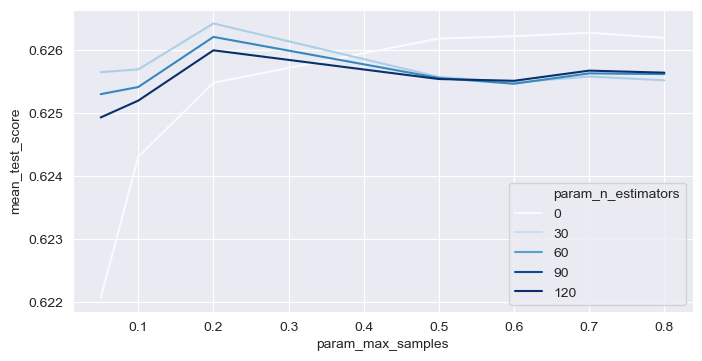

In [482]:
fig = plt.figure(figsize=(8,4),dpi=100)
sns.lineplot(x=output['param_max_samples'],y=output['mean_test_score'],hue=output['param_n_estimators'],
            palette='Blues')

In [483]:
baggaing_lm_score = grid.best_score_

In [484]:
print('The Best R Squared Value that we are getting is {}'.format(round(baggaing_lm_score,4)))

The Best R Squared Value that we are getting is 0.6264


# Pasting With Ridge

In [485]:
ridge = Ridge(random_state=0,alpha=1.0)
pst_reg_ridge = BaggingRegressor(ridge,bootstrap=False, n_jobs=-1, random_state=0)

In [486]:
grid_params = {'n_estimators':[10,40,70,100],'max_samples':[0.05, 0.1, 0.2, 0.5,0.6,0.7,0.8]}

In [487]:
grid = GridSearchCV(pst_reg_ridge,grid_params,cv=kfold,verbose=3)

In [488]:
grid.fit(X_train,y_train)

Fitting 5 folds for each of 28 candidates, totalling 140 fits
[CV] max_samples=0.05, n_estimators=10 ...............................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] ... max_samples=0.05, n_estimators=10, score=0.615, total=   0.5s
[CV] max_samples=0.05, n_estimators=10 ...............................
[CV] ... max_samples=0.05, n_estimators=10, score=0.560, total=   0.2s
[CV] max_samples=0.05, n_estimators=10 ...............................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.6s remaining:    0.0s


[CV] ... max_samples=0.05, n_estimators=10, score=0.626, total=   0.2s
[CV] max_samples=0.05, n_estimators=10 ...............................
[CV] ... max_samples=0.05, n_estimators=10, score=0.653, total=   0.2s
[CV] max_samples=0.05, n_estimators=10 ...............................
[CV] ... max_samples=0.05, n_estimators=10, score=0.621, total=   0.2s
[CV] max_samples=0.05, n_estimators=40 ...............................
[CV] ... max_samples=0.05, n_estimators=40, score=0.616, total=   0.3s
[CV] max_samples=0.05, n_estimators=40 ...............................
[CV] ... max_samples=0.05, n_estimators=40, score=0.564, total=   0.2s
[CV] max_samples=0.05, n_estimators=40 ...............................
[CV] ... max_samples=0.05, n_estimators=40, score=0.627, total=   0.2s
[CV] max_samples=0.05, n_estimators=40 ...............................
[CV] ... max_samples=0.05, n_estimators=40, score=0.658, total=   0.2s
[CV] max_samples=0.05, n_estimators=40 ...............................
[CV] .

[CV] .... max_samples=0.5, n_estimators=10, score=0.560, total=   0.2s
[CV] max_samples=0.5, n_estimators=10 ................................
[CV] .... max_samples=0.5, n_estimators=10, score=0.640, total=   0.2s
[CV] max_samples=0.5, n_estimators=10 ................................
[CV] .... max_samples=0.5, n_estimators=10, score=0.661, total=   0.2s
[CV] max_samples=0.5, n_estimators=10 ................................
[CV] .... max_samples=0.5, n_estimators=10, score=0.630, total=   0.2s
[CV] max_samples=0.5, n_estimators=40 ................................
[CV] .... max_samples=0.5, n_estimators=40, score=0.634, total=   0.3s
[CV] max_samples=0.5, n_estimators=40 ................................
[CV] .... max_samples=0.5, n_estimators=40, score=0.562, total=   0.2s
[CV] max_samples=0.5, n_estimators=40 ................................
[CV] .... max_samples=0.5, n_estimators=40, score=0.639, total=   0.2s
[CV] max_samples=0.5, n_estimators=40 ................................
[CV] .

[CV] ... max_samples=0.7, n_estimators=100, score=0.631, total=   0.4s
[CV] max_samples=0.8, n_estimators=10 ................................
[CV] .... max_samples=0.8, n_estimators=10, score=0.635, total=   0.2s
[CV] max_samples=0.8, n_estimators=10 ................................
[CV] .... max_samples=0.8, n_estimators=10, score=0.558, total=   0.2s
[CV] max_samples=0.8, n_estimators=10 ................................
[CV] .... max_samples=0.8, n_estimators=10, score=0.641, total=   0.2s
[CV] max_samples=0.8, n_estimators=10 ................................
[CV] .... max_samples=0.8, n_estimators=10, score=0.662, total=   0.2s
[CV] max_samples=0.8, n_estimators=10 ................................
[CV] .... max_samples=0.8, n_estimators=10, score=0.630, total=   0.2s
[CV] max_samples=0.8, n_estimators=40 ................................
[CV] .... max_samples=0.8, n_estimators=40, score=0.636, total=   0.2s
[CV] max_samples=0.8, n_estimators=40 ................................
[CV] .

[Parallel(n_jobs=1)]: Done 140 out of 140 | elapsed:   42.4s finished


GridSearchCV(cv=KFold(n_splits=5, random_state=0, shuffle=False),
             estimator=BaggingRegressor(base_estimator=Ridge(random_state=0),
                                        bootstrap=False, n_jobs=-1,
                                        random_state=0),
             param_grid={'max_samples': [0.05, 0.1, 0.2, 0.5, 0.6, 0.7, 0.8],
                         'n_estimators': [10, 40, 70, 100]},
             verbose=3)

In [489]:
grid.best_params_

{'max_samples': 0.6, 'n_estimators': 100}

In [490]:
grid.best_score_

0.6255672721908759

In [491]:
output = pd.DataFrame(grid.cv_results_)

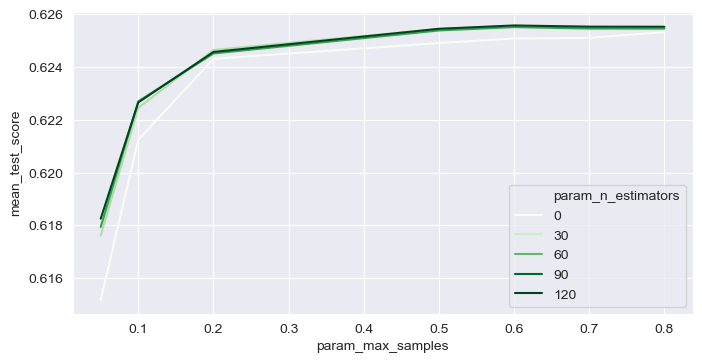

In [492]:
fig = plt.figure(figsize=(8,4),dpi=100)
sns.lineplot(x=output['param_max_samples'],y=output['mean_test_score'],hue=output['param_n_estimators'],
            palette='Greens')

In [493]:
pasting_ridge_score = grid.best_score_

In [494]:
print('The Best R Squared Value that we are getting is {}'.format(round(pasting_ridge_score,4)))

The Best R Squared Value that we are getting is 0.6256


# Pasting With Decision Tree

In [495]:
tree = DecisionTreeRegressor(max_depth=6)
pst_reg_tree = BaggingRegressor(tree,bootstrap=False, n_jobs=-1, random_state=0)

In [496]:
grid_params = {'n_estimators':[10,40,70,100],'max_samples':[0.05, 0.1, 0.2, 0.5,0.6,0.7,0.8]}

In [497]:
grid = GridSearchCV(pst_reg_tree,grid_params,cv=kfold,verbose=3)

In [498]:
grid.fit(X_train,y_train)

Fitting 5 folds for each of 28 candidates, totalling 140 fits
[CV] max_samples=0.05, n_estimators=10 ...............................
[CV] ... max_samples=0.05, n_estimators=10, score=0.628, total=   0.2s
[CV] max_samples=0.05, n_estimators=10 ...............................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s


[CV] ... max_samples=0.05, n_estimators=10, score=0.593, total=   0.2s
[CV] max_samples=0.05, n_estimators=10 ...............................
[CV] ... max_samples=0.05, n_estimators=10, score=0.652, total=   0.2s
[CV] max_samples=0.05, n_estimators=10 ...............................


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s remaining:    0.0s


[CV] ... max_samples=0.05, n_estimators=10, score=0.689, total=   0.2s
[CV] max_samples=0.05, n_estimators=10 ...............................
[CV] ... max_samples=0.05, n_estimators=10, score=0.637, total=   0.2s
[CV] max_samples=0.05, n_estimators=40 ...............................
[CV] ... max_samples=0.05, n_estimators=40, score=0.650, total=   0.2s
[CV] max_samples=0.05, n_estimators=40 ...............................
[CV] ... max_samples=0.05, n_estimators=40, score=0.608, total=   0.2s
[CV] max_samples=0.05, n_estimators=40 ...............................
[CV] ... max_samples=0.05, n_estimators=40, score=0.658, total=   0.2s
[CV] max_samples=0.05, n_estimators=40 ...............................
[CV] ... max_samples=0.05, n_estimators=40, score=0.693, total=   0.2s
[CV] max_samples=0.05, n_estimators=40 ...............................
[CV] ... max_samples=0.05, n_estimators=40, score=0.665, total=   0.2s
[CV] max_samples=0.05, n_estimators=70 ...............................
[CV] .

[CV] .... max_samples=0.5, n_estimators=10, score=0.583, total=   0.2s
[CV] max_samples=0.5, n_estimators=10 ................................
[CV] .... max_samples=0.5, n_estimators=10, score=0.630, total=   0.2s
[CV] max_samples=0.5, n_estimators=10 ................................
[CV] .... max_samples=0.5, n_estimators=10, score=0.663, total=   0.2s
[CV] max_samples=0.5, n_estimators=10 ................................
[CV] .... max_samples=0.5, n_estimators=10, score=0.654, total=   0.3s
[CV] max_samples=0.5, n_estimators=40 ................................
[CV] .... max_samples=0.5, n_estimators=40, score=0.674, total=   0.4s
[CV] max_samples=0.5, n_estimators=40 ................................
[CV] .... max_samples=0.5, n_estimators=40, score=0.598, total=   0.4s
[CV] max_samples=0.5, n_estimators=40 ................................
[CV] .... max_samples=0.5, n_estimators=40, score=0.663, total=   0.4s
[CV] max_samples=0.5, n_estimators=40 ................................
[CV] .

[CV] ... max_samples=0.7, n_estimators=100, score=0.667, total=   1.3s
[CV] max_samples=0.8, n_estimators=10 ................................
[CV] .... max_samples=0.8, n_estimators=10, score=0.679, total=   0.3s
[CV] max_samples=0.8, n_estimators=10 ................................
[CV] .... max_samples=0.8, n_estimators=10, score=0.572, total=   0.3s
[CV] max_samples=0.8, n_estimators=10 ................................
[CV] .... max_samples=0.8, n_estimators=10, score=0.633, total=   0.3s
[CV] max_samples=0.8, n_estimators=10 ................................
[CV] .... max_samples=0.8, n_estimators=10, score=0.646, total=   0.3s
[CV] max_samples=0.8, n_estimators=10 ................................
[CV] .... max_samples=0.8, n_estimators=10, score=0.647, total=   0.3s
[CV] max_samples=0.8, n_estimators=40 ................................
[CV] .... max_samples=0.8, n_estimators=40, score=0.675, total=   0.5s
[CV] max_samples=0.8, n_estimators=40 ................................
[CV] .

[Parallel(n_jobs=1)]: Done 140 out of 140 | elapsed:  1.1min finished


GridSearchCV(cv=KFold(n_splits=5, random_state=0, shuffle=False),
             estimator=BaggingRegressor(base_estimator=DecisionTreeRegressor(max_depth=6),
                                        bootstrap=False, n_jobs=-1,
                                        random_state=0),
             param_grid={'max_samples': [0.05, 0.1, 0.2, 0.5, 0.6, 0.7, 0.8],
                         'n_estimators': [10, 40, 70, 100]},
             verbose=3)

In [499]:
grid.best_params_

{'max_samples': 0.2, 'n_estimators': 100}

In [500]:
grid.best_score_

0.6681545154012655

In [501]:
output = pd.DataFrame(grid.cv_results_)

In [502]:
output.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_samples,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.144028,0.007127,0.018425,0.001336,0.05,10,"{'max_samples': 0.05, 'n_estimators': 10}",0.628048,0.592763,0.652117,0.689236,0.637056,0.639844,0.031476,25
1,0.185165,0.010854,0.034259,0.001887,0.05,40,"{'max_samples': 0.05, 'n_estimators': 40}",0.650247,0.608151,0.658196,0.693082,0.665252,0.654986,0.027506,14
2,0.241210,0.064224,0.057269,0.005638,0.05,70,"{'max_samples': 0.05, 'n_estimators': 70}",0.643322,0.609532,0.660846,0.690230,0.670374,0.654861,0.027259,15
3,0.296006,0.043199,0.060954,0.001745,0.05,100,"{'max_samples': 0.05, 'n_estimators': 100}",0.645036,0.613453,0.664534,0.689731,0.672048,0.656960,0.026054,11
4,0.146673,0.002500,0.017758,0.001133,0.1,10,"{'max_samples': 0.1, 'n_estimators': 10}",0.650988,0.596257,0.661916,0.677611,0.638443,0.645043,0.027584,23


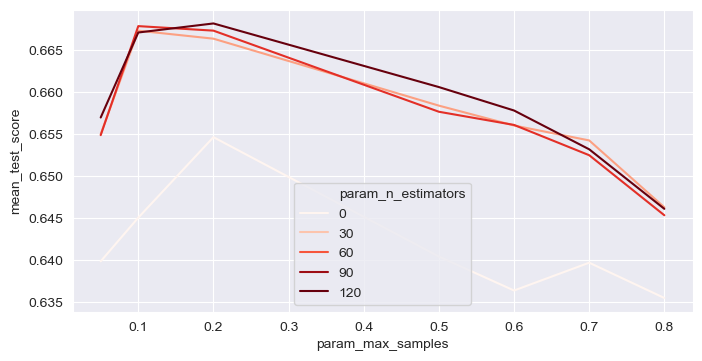

In [503]:
fig = plt.figure(figsize=(8,4),dpi=100)
sns.lineplot(x=output['param_max_samples'],y=output['mean_test_score'],hue=output['param_n_estimators'],
            palette='Reds')

In [504]:
pasting_tree_score = grid.best_score_

In [505]:
print('The Best R Squared Value that we are getting is {}'.format(round(pasting_ridge_score,4)))

The Best R Squared Value that we are getting is 0.6256


# Ada Boost on Lasso And Linear Regression

# Ada boost with Lasso

In [506]:
from sklearn.ensemble import AdaBoostRegressor

ada_lasso = AdaBoostRegressor(Lasso(alpha=100,random_state=0), random_state=0)
ada_lasso.fit(X_train, y_train)

AdaBoostRegressor(base_estimator=Lasso(alpha=100, random_state=0),
                  random_state=0)

In [507]:
grid_params = {'n_estimators':[10,40,70,100],'learning_rate':[0.0001, 0.001, 0.01, 0.1, 0.2, 0.3,0.5]}

In [508]:
grid = GridSearchCV(ada_lasso,grid_params,cv=kfold,verbose=3)

In [509]:
grid.fit(X_train,y_train)

Fitting 5 folds for each of 28 candidates, totalling 140 fits
[CV] learning_rate=0.0001, n_estimators=10 ...........................
[CV]  learning_rate=0.0001, n_estimators=10, score=0.635, total=   0.2s
[CV] learning_rate=0.0001, n_estimators=10 ...........................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s


[CV]  learning_rate=0.0001, n_estimators=10, score=0.561, total=   0.2s
[CV] learning_rate=0.0001, n_estimators=10 ...........................


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.3s remaining:    0.0s


[CV]  learning_rate=0.0001, n_estimators=10, score=0.640, total=   0.3s
[CV] learning_rate=0.0001, n_estimators=10 ...........................
[CV]  learning_rate=0.0001, n_estimators=10, score=0.661, total=   0.2s
[CV] learning_rate=0.0001, n_estimators=10 ...........................
[CV]  learning_rate=0.0001, n_estimators=10, score=0.631, total=   0.2s
[CV] learning_rate=0.0001, n_estimators=40 ...........................
[CV]  learning_rate=0.0001, n_estimators=40, score=0.635, total=   0.8s
[CV] learning_rate=0.0001, n_estimators=40 ...........................
[CV]  learning_rate=0.0001, n_estimators=40, score=0.560, total=   0.9s
[CV] learning_rate=0.0001, n_estimators=40 ...........................
[CV]  learning_rate=0.0001, n_estimators=40, score=0.640, total=   0.8s
[CV] learning_rate=0.0001, n_estimators=40 ...........................
[CV]  learning_rate=0.0001, n_estimators=40, score=0.662, total=   0.8s
[CV] learning_rate=0.0001, n_estimators=40 ...........................

[CV] .. learning_rate=0.1, n_estimators=10, score=0.643, total=   0.3s
[CV] learning_rate=0.1, n_estimators=10 ..............................
[CV] .. learning_rate=0.1, n_estimators=10, score=0.528, total=   0.2s
[CV] learning_rate=0.1, n_estimators=10 ..............................
[CV] .. learning_rate=0.1, n_estimators=10, score=0.642, total=   0.2s
[CV] learning_rate=0.1, n_estimators=10 ..............................
[CV] .. learning_rate=0.1, n_estimators=10, score=0.646, total=   0.2s
[CV] learning_rate=0.1, n_estimators=10 ..............................
[CV] .. learning_rate=0.1, n_estimators=10, score=0.621, total=   0.2s
[CV] learning_rate=0.1, n_estimators=40 ..............................
[CV] .. learning_rate=0.1, n_estimators=40, score=0.599, total=   0.9s
[CV] learning_rate=0.1, n_estimators=40 ..............................
[CV] .. learning_rate=0.1, n_estimators=40, score=0.305, total=   0.9s
[CV] learning_rate=0.1, n_estimators=40 ..............................
[CV] .

[CV] . learning_rate=0.3, n_estimators=100, score=0.366, total=   1.1s
[CV] learning_rate=0.3, n_estimators=100 .............................
[CV] . learning_rate=0.3, n_estimators=100, score=0.367, total=   1.0s
[CV] learning_rate=0.5, n_estimators=10 ..............................
[CV] .. learning_rate=0.5, n_estimators=10, score=0.591, total=   0.2s
[CV] learning_rate=0.5, n_estimators=10 ..............................
[CV] .. learning_rate=0.5, n_estimators=10, score=0.256, total=   0.3s
[CV] learning_rate=0.5, n_estimators=10 ..............................
[CV] .. learning_rate=0.5, n_estimators=10, score=0.506, total=   0.3s
[CV] learning_rate=0.5, n_estimators=10 ..............................
[CV] .. learning_rate=0.5, n_estimators=10, score=0.454, total=   0.2s
[CV] learning_rate=0.5, n_estimators=10 ..............................
[CV] .. learning_rate=0.5, n_estimators=10, score=0.421, total=   0.3s
[CV] learning_rate=0.5, n_estimators=40 ..............................
[CV] .

[Parallel(n_jobs=1)]: Done 140 out of 140 | elapsed:  2.6min finished


GridSearchCV(cv=KFold(n_splits=5, random_state=0, shuffle=False),
             estimator=AdaBoostRegressor(base_estimator=Lasso(alpha=100,
                                                              random_state=0),
                                         random_state=0),
             param_grid={'learning_rate': [0.0001, 0.001, 0.01, 0.1, 0.2, 0.3,
                                           0.5],
                         'n_estimators': [10, 40, 70, 100]},
             verbose=3)

In [510]:
grid.best_params_

{'learning_rate': 0.01, 'n_estimators': 10}

In [511]:
output = pd.DataFrame(grid.cv_results_)

In [512]:
output.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_learning_rate,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.218223,0.021207,0.006377,0.001014,0.0001,10,"{'learning_rate': 0.0001, 'n_estimators': 10}",0.635278,0.560712,0.640151,0.660912,0.631198,0.625650,0.034042,5
1,0.810242,0.039070,0.014960,0.001545,0.0001,40,"{'learning_rate': 0.0001, 'n_estimators': 40}",0.635094,0.559678,0.639624,0.662115,0.631766,0.625655,0.034652,4
2,1.394477,0.048305,0.029112,0.003851,0.0001,70,"{'learning_rate': 0.0001, 'n_estimators': 70}",0.634984,0.560325,0.639291,0.661940,0.631758,0.625659,0.034336,3
3,2.046318,0.103695,0.042691,0.003412,0.0001,100,"{'learning_rate': 0.0001, 'n_estimators': 100}",0.635030,0.560193,0.639472,0.661734,0.631478,0.625582,0.034350,6
4,0.206647,0.005217,0.006183,0.000746,0.001,10,"{'learning_rate': 0.001, 'n_estimators': 10}",0.635818,0.560466,0.640456,0.660812,0.631413,0.625793,0.034179,2


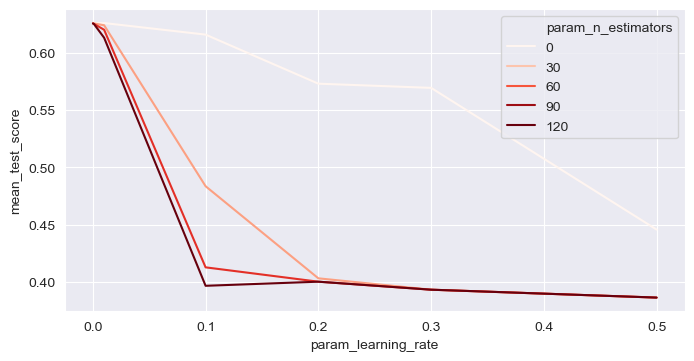

In [513]:
fig = plt.figure(figsize=(8,4),dpi=100)
sns.lineplot(x=output['param_learning_rate'],y=output['mean_test_score'],hue=output['param_n_estimators'],
            palette='Reds')

In [514]:
ada_lasso_score = grid.best_score_

In [515]:
print('The Best R Squared Value that we are getting is {}'.format(round(ada_lasso_score,4)))

The Best R Squared Value that we are getting is 0.6259


# Ada Boost with  Linear Regression

In [516]:
ada_linearReg = AdaBoostRegressor(LinearRegression(), random_state=0)
ada_linearReg.fit(X_train, y_train)

AdaBoostRegressor(base_estimator=LinearRegression(), random_state=0)

In [517]:
grid_params = {'n_estimators':[10,40,70,100],'learning_rate':[0.0001, 0.001, 0.01, 0.1, 0.2, 0.3,0.5]}

In [518]:
grid = GridSearchCV(ada_linearReg,grid_params,cv=kfold,verbose=3)

In [519]:
grid.fit(X_train,y_train)

Fitting 5 folds for each of 28 candidates, totalling 140 fits
[CV] learning_rate=0.0001, n_estimators=10 ...........................
[CV]  learning_rate=0.0001, n_estimators=10, score=0.635, total=   0.1s
[CV] learning_rate=0.0001, n_estimators=10 ...........................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


[CV]  learning_rate=0.0001, n_estimators=10, score=0.562, total=   0.1s
[CV] learning_rate=0.0001, n_estimators=10 ...........................
[CV]  learning_rate=0.0001, n_estimators=10, score=0.640, total=   0.1s
[CV] learning_rate=0.0001, n_estimators=10 ...........................


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s remaining:    0.0s


[CV]  learning_rate=0.0001, n_estimators=10, score=0.662, total=   0.1s
[CV] learning_rate=0.0001, n_estimators=10 ...........................
[CV]  learning_rate=0.0001, n_estimators=10, score=0.631, total=   0.2s
[CV] learning_rate=0.0001, n_estimators=40 ...........................
[CV]  learning_rate=0.0001, n_estimators=40, score=0.636, total=   0.5s
[CV] learning_rate=0.0001, n_estimators=40 ...........................
[CV]  learning_rate=0.0001, n_estimators=40, score=0.558, total=   0.5s
[CV] learning_rate=0.0001, n_estimators=40 ...........................
[CV]  learning_rate=0.0001, n_estimators=40, score=0.641, total=   0.5s
[CV] learning_rate=0.0001, n_estimators=40 ...........................
[CV]  learning_rate=0.0001, n_estimators=40, score=0.662, total=   0.6s
[CV] learning_rate=0.0001, n_estimators=40 ...........................
[CV]  learning_rate=0.0001, n_estimators=40, score=0.631, total=   0.6s
[CV] learning_rate=0.0001, n_estimators=70 ...........................

[CV] .. learning_rate=0.1, n_estimators=10, score=0.520, total=   0.1s
[CV] learning_rate=0.1, n_estimators=10 ..............................
[CV] .. learning_rate=0.1, n_estimators=10, score=0.644, total=   0.1s
[CV] learning_rate=0.1, n_estimators=10 ..............................
[CV] .. learning_rate=0.1, n_estimators=10, score=0.646, total=   0.1s
[CV] learning_rate=0.1, n_estimators=10 ..............................
[CV] .. learning_rate=0.1, n_estimators=10, score=0.618, total=   0.1s
[CV] learning_rate=0.1, n_estimators=40 ..............................
[CV] .. learning_rate=0.1, n_estimators=40, score=0.607, total=   0.5s
[CV] learning_rate=0.1, n_estimators=40 ..............................
[CV] .. learning_rate=0.1, n_estimators=40, score=0.305, total=   0.4s
[CV] learning_rate=0.1, n_estimators=40 ..............................
[CV] .. learning_rate=0.1, n_estimators=40, score=0.551, total=   0.5s
[CV] learning_rate=0.1, n_estimators=40 ..............................
[CV] .

[CV] . learning_rate=0.3, n_estimators=100, score=0.360, total=   0.5s
[CV] learning_rate=0.5, n_estimators=10 ..............................
[CV] .. learning_rate=0.5, n_estimators=10, score=0.593, total=   0.1s
[CV] learning_rate=0.5, n_estimators=10 ..............................
[CV] .. learning_rate=0.5, n_estimators=10, score=0.250, total=   0.1s
[CV] learning_rate=0.5, n_estimators=10 ..............................
[CV] .. learning_rate=0.5, n_estimators=10, score=0.517, total=   0.1s
[CV] learning_rate=0.5, n_estimators=10 ..............................
[CV] .. learning_rate=0.5, n_estimators=10, score=0.446, total=   0.1s
[CV] learning_rate=0.5, n_estimators=10 ..............................
[CV] .. learning_rate=0.5, n_estimators=10, score=0.413, total=   0.1s
[CV] learning_rate=0.5, n_estimators=40 ..............................
[CV] .. learning_rate=0.5, n_estimators=40, score=0.535, total=   0.3s
[CV] learning_rate=0.5, n_estimators=40 ..............................
[CV] .

[Parallel(n_jobs=1)]: Done 140 out of 140 | elapsed:  1.2min finished


GridSearchCV(cv=KFold(n_splits=5, random_state=0, shuffle=False),
             estimator=AdaBoostRegressor(base_estimator=LinearRegression(),
                                         random_state=0),
             param_grid={'learning_rate': [0.0001, 0.001, 0.01, 0.1, 0.2, 0.3,
                                           0.5],
                         'n_estimators': [10, 40, 70, 100]},
             verbose=3)

In [520]:
grid.best_params_

{'learning_rate': 0.01, 'n_estimators': 10}

In [521]:
ada_linerreg_score = grid.best_score_

In [522]:
output= pd.DataFrame(grid.cv_results_)

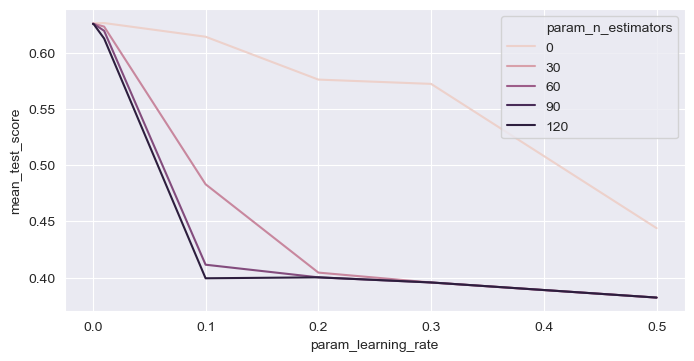

In [523]:
fig = plt.figure(figsize=(8,4),dpi=100)
sns.lineplot(x=output['param_learning_rate'],y=output['mean_test_score'],hue=output['param_n_estimators'])

In [524]:
print('The Best R Squared Value that we are getting is {}'.format(round(ada_linerreg_score,4)))

The Best R Squared Value that we are getting is 0.6263


# Gradient Boosting 

In [525]:
from  sklearn.ensemble import GradientBoostingRegressor

gbrt = GradientBoostingRegressor(max_depth=2, random_state=0)
gbrt.fit(X_train, y_train)


GradientBoostingRegressor(max_depth=2, random_state=0)

In [526]:
grid_params = {'max_depth':[1,2,3,4,5],'n_estimators':[10,40,70,100],'learning_rate':[0.0001, 0.001, 0.01, 0.1, 0.2, 0.3,0.5]}

In [527]:
grid = GridSearchCV(gbrt,grid_params,cv=kfold,verbose=3)

In [528]:
grid.fit(X_train,y_train)

Fitting 5 folds for each of 140 candidates, totalling 700 fits
[CV] learning_rate=0.0001, max_depth=1, n_estimators=10 ..............
[CV]  learning_rate=0.0001, max_depth=1, n_estimators=10, score=-0.000, total=   0.1s
[CV] learning_rate=0.0001, max_depth=1, n_estimators=10 ..............
[CV]  learning_rate=0.0001, max_depth=1, n_estimators=10, score=-0.001, total=   0.1s
[CV] learning_rate=0.0001, max_depth=1, n_estimators=10 ..............


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


[CV]  learning_rate=0.0001, max_depth=1, n_estimators=10, score=-0.000, total=   0.1s
[CV] learning_rate=0.0001, max_depth=1, n_estimators=10 ..............
[CV]  learning_rate=0.0001, max_depth=1, n_estimators=10, score=0.001, total=   0.1s
[CV] learning_rate=0.0001, max_depth=1, n_estimators=10 ..............
[CV]  learning_rate=0.0001, max_depth=1, n_estimators=10, score=0.000, total=   0.1s
[CV] learning_rate=0.0001, max_depth=1, n_estimators=40 ..............
[CV]  learning_rate=0.0001, max_depth=1, n_estimators=40, score=0.001, total=   0.2s
[CV] learning_rate=0.0001, max_depth=1, n_estimators=40 ..............
[CV]  learning_rate=0.0001, max_depth=1, n_estimators=40, score=0.001, total=   0.3s
[CV] learning_rate=0.0001, max_depth=1, n_estimators=40 ..............
[CV]  learning_rate=0.0001, max_depth=1, n_estimators=40, score=0.001, total=   0.3s
[CV] learning_rate=0.0001, max_depth=1, n_estimators=40 ..............
[CV]  learning_rate=0.0001, max_depth=1, n_estimators=40, score

[CV]  learning_rate=0.0001, max_depth=3, n_estimators=100, score=0.008, total=   1.7s
[CV] learning_rate=0.0001, max_depth=3, n_estimators=100 .............
[CV]  learning_rate=0.0001, max_depth=3, n_estimators=100, score=0.008, total=   1.9s
[CV] learning_rate=0.0001, max_depth=3, n_estimators=100 .............
[CV]  learning_rate=0.0001, max_depth=3, n_estimators=100, score=0.008, total=   1.7s
[CV] learning_rate=0.0001, max_depth=3, n_estimators=100 .............
[CV]  learning_rate=0.0001, max_depth=3, n_estimators=100, score=0.010, total=   1.8s
[CV] learning_rate=0.0001, max_depth=3, n_estimators=100 .............
[CV]  learning_rate=0.0001, max_depth=3, n_estimators=100, score=0.010, total=   1.8s
[CV] learning_rate=0.0001, max_depth=4, n_estimators=10 ..............
[CV]  learning_rate=0.0001, max_depth=4, n_estimators=10, score=0.000, total=   0.2s
[CV] learning_rate=0.0001, max_depth=4, n_estimators=10 ..............
[CV]  learning_rate=0.0001, max_depth=4, n_estimators=10, s

[CV]  learning_rate=0.001, max_depth=1, n_estimators=40, score=0.026, total=   0.3s
[CV] learning_rate=0.001, max_depth=1, n_estimators=40 ...............
[CV]  learning_rate=0.001, max_depth=1, n_estimators=40, score=0.024, total=   0.2s
[CV] learning_rate=0.001, max_depth=1, n_estimators=70 ...............
[CV]  learning_rate=0.001, max_depth=1, n_estimators=70, score=0.037, total=   0.4s
[CV] learning_rate=0.001, max_depth=1, n_estimators=70 ...............
[CV]  learning_rate=0.001, max_depth=1, n_estimators=70, score=0.043, total=   0.5s
[CV] learning_rate=0.001, max_depth=1, n_estimators=70 ...............
[CV]  learning_rate=0.001, max_depth=1, n_estimators=70, score=0.036, total=   0.4s
[CV] learning_rate=0.001, max_depth=1, n_estimators=70 ...............
[CV]  learning_rate=0.001, max_depth=1, n_estimators=70, score=0.045, total=   0.5s
[CV] learning_rate=0.001, max_depth=1, n_estimators=70 ...............
[CV]  learning_rate=0.001, max_depth=1, n_estimators=70, score=0.042, 

[CV]  learning_rate=0.001, max_depth=4, n_estimators=10, score=0.009, total=   0.2s
[CV] learning_rate=0.001, max_depth=4, n_estimators=10 ...............
[CV]  learning_rate=0.001, max_depth=4, n_estimators=10, score=0.009, total=   0.2s
[CV] learning_rate=0.001, max_depth=4, n_estimators=10 ...............
[CV]  learning_rate=0.001, max_depth=4, n_estimators=10, score=0.012, total=   0.2s
[CV] learning_rate=0.001, max_depth=4, n_estimators=10 ...............
[CV]  learning_rate=0.001, max_depth=4, n_estimators=10, score=0.011, total=   0.2s
[CV] learning_rate=0.001, max_depth=4, n_estimators=40 ...............
[CV]  learning_rate=0.001, max_depth=4, n_estimators=40, score=0.038, total=   0.9s
[CV] learning_rate=0.001, max_depth=4, n_estimators=40 ...............
[CV]  learning_rate=0.001, max_depth=4, n_estimators=40, score=0.040, total=   0.9s
[CV] learning_rate=0.001, max_depth=4, n_estimators=40 ...............
[CV]  learning_rate=0.001, max_depth=4, n_estimators=40, score=0.039, 

[CV]  learning_rate=0.01, max_depth=1, n_estimators=70, score=0.284, total=   0.5s
[CV] learning_rate=0.01, max_depth=1, n_estimators=100 ...............
[CV]  learning_rate=0.01, max_depth=1, n_estimators=100, score=0.323, total=   0.8s
[CV] learning_rate=0.01, max_depth=1, n_estimators=100 ...............
[CV]  learning_rate=0.01, max_depth=1, n_estimators=100, score=0.341, total=   0.7s
[CV] learning_rate=0.01, max_depth=1, n_estimators=100 ...............
[CV]  learning_rate=0.01, max_depth=1, n_estimators=100, score=0.313, total=   0.7s
[CV] learning_rate=0.01, max_depth=1, n_estimators=100 ...............
[CV]  learning_rate=0.01, max_depth=1, n_estimators=100, score=0.363, total=   0.7s
[CV] learning_rate=0.01, max_depth=1, n_estimators=100 ...............
[CV]  learning_rate=0.01, max_depth=1, n_estimators=100, score=0.349, total=   0.7s
[CV] learning_rate=0.01, max_depth=2, n_estimators=10 ................
[CV]  learning_rate=0.01, max_depth=2, n_estimators=10, score=0.079, to

[CV]  learning_rate=0.01, max_depth=4, n_estimators=40, score=0.336, total=   1.0s
[CV] learning_rate=0.01, max_depth=4, n_estimators=40 ................
[CV]  learning_rate=0.01, max_depth=4, n_estimators=40, score=0.336, total=   0.9s
[CV] learning_rate=0.01, max_depth=4, n_estimators=70 ................
[CV]  learning_rate=0.01, max_depth=4, n_estimators=70, score=0.446, total=   1.6s
[CV] learning_rate=0.01, max_depth=4, n_estimators=70 ................
[CV]  learning_rate=0.01, max_depth=4, n_estimators=70, score=0.434, total=   1.7s
[CV] learning_rate=0.01, max_depth=4, n_estimators=70 ................
[CV]  learning_rate=0.01, max_depth=4, n_estimators=70, score=0.428, total=   1.7s
[CV] learning_rate=0.01, max_depth=4, n_estimators=70 ................
[CV]  learning_rate=0.01, max_depth=4, n_estimators=70, score=0.475, total=   1.6s
[CV] learning_rate=0.01, max_depth=4, n_estimators=70 ................
[CV]  learning_rate=0.01, max_depth=4, n_estimators=70, score=0.471, total= 

[CV]  learning_rate=0.1, max_depth=2, n_estimators=10, score=0.479, total=   0.1s
[CV] learning_rate=0.1, max_depth=2, n_estimators=10 .................
[CV]  learning_rate=0.1, max_depth=2, n_estimators=10, score=0.462, total=   0.1s
[CV] learning_rate=0.1, max_depth=2, n_estimators=40 .................
[CV]  learning_rate=0.1, max_depth=2, n_estimators=40, score=0.649, total=   0.5s
[CV] learning_rate=0.1, max_depth=2, n_estimators=40 .................
[CV]  learning_rate=0.1, max_depth=2, n_estimators=40, score=0.597, total=   0.5s
[CV] learning_rate=0.1, max_depth=2, n_estimators=40 .................
[CV]  learning_rate=0.1, max_depth=2, n_estimators=40, score=0.633, total=   0.5s
[CV] learning_rate=0.1, max_depth=2, n_estimators=40 .................
[CV]  learning_rate=0.1, max_depth=2, n_estimators=40, score=0.673, total=   0.5s
[CV] learning_rate=0.1, max_depth=2, n_estimators=40 .................
[CV]  learning_rate=0.1, max_depth=2, n_estimators=40, score=0.645, total=   0.5s


[CV]  learning_rate=0.1, max_depth=4, n_estimators=100, score=0.709, total=   2.4s
[CV] learning_rate=0.1, max_depth=4, n_estimators=100 ................
[CV]  learning_rate=0.1, max_depth=4, n_estimators=100, score=0.739, total=   2.4s
[CV] learning_rate=0.1, max_depth=4, n_estimators=100 ................
[CV]  learning_rate=0.1, max_depth=4, n_estimators=100, score=0.710, total=   2.4s
[CV] learning_rate=0.1, max_depth=5, n_estimators=10 .................
[CV]  learning_rate=0.1, max_depth=5, n_estimators=10, score=0.561, total=   0.3s
[CV] learning_rate=0.1, max_depth=5, n_estimators=10 .................
[CV]  learning_rate=0.1, max_depth=5, n_estimators=10, score=0.532, total=   0.3s
[CV] learning_rate=0.1, max_depth=5, n_estimators=10 .................
[CV]  learning_rate=0.1, max_depth=5, n_estimators=10, score=0.546, total=   0.3s
[CV] learning_rate=0.1, max_depth=5, n_estimators=10 .................
[CV]  learning_rate=0.1, max_depth=5, n_estimators=10, score=0.596, total=   0.

[CV]  learning_rate=0.2, max_depth=2, n_estimators=70, score=0.638, total=   0.8s
[CV] learning_rate=0.2, max_depth=2, n_estimators=70 .................
[CV]  learning_rate=0.2, max_depth=2, n_estimators=70, score=0.689, total=   0.8s
[CV] learning_rate=0.2, max_depth=2, n_estimators=70 .................
[CV]  learning_rate=0.2, max_depth=2, n_estimators=70, score=0.719, total=   1.0s
[CV] learning_rate=0.2, max_depth=2, n_estimators=70 .................
[CV]  learning_rate=0.2, max_depth=2, n_estimators=70, score=0.677, total=   0.9s
[CV] learning_rate=0.2, max_depth=2, n_estimators=100 ................
[CV]  learning_rate=0.2, max_depth=2, n_estimators=100, score=0.711, total=   1.4s
[CV] learning_rate=0.2, max_depth=2, n_estimators=100 ................
[CV]  learning_rate=0.2, max_depth=2, n_estimators=100, score=0.646, total=   1.4s
[CV] learning_rate=0.2, max_depth=2, n_estimators=100 ................
[CV]  learning_rate=0.2, max_depth=2, n_estimators=100, score=0.688, total=   1.

[CV]  learning_rate=0.2, max_depth=5, n_estimators=40, score=0.731, total=   1.1s
[CV] learning_rate=0.2, max_depth=5, n_estimators=40 .................
[CV]  learning_rate=0.2, max_depth=5, n_estimators=40, score=0.657, total=   1.2s
[CV] learning_rate=0.2, max_depth=5, n_estimators=40 .................
[CV]  learning_rate=0.2, max_depth=5, n_estimators=40, score=0.703, total=   1.4s
[CV] learning_rate=0.2, max_depth=5, n_estimators=40 .................
[CV]  learning_rate=0.2, max_depth=5, n_estimators=40, score=0.723, total=   1.2s
[CV] learning_rate=0.2, max_depth=5, n_estimators=40 .................
[CV]  learning_rate=0.2, max_depth=5, n_estimators=40, score=0.707, total=   1.2s
[CV] learning_rate=0.2, max_depth=5, n_estimators=70 .................
[CV]  learning_rate=0.2, max_depth=5, n_estimators=70, score=0.732, total=   2.1s
[CV] learning_rate=0.2, max_depth=5, n_estimators=70 .................
[CV]  learning_rate=0.2, max_depth=5, n_estimators=70, score=0.658, total=   2.1s


[CV]  learning_rate=0.3, max_depth=2, n_estimators=100, score=0.691, total=   1.2s
[CV] learning_rate=0.3, max_depth=3, n_estimators=10 .................
[CV]  learning_rate=0.3, max_depth=3, n_estimators=10, score=0.669, total=   0.2s
[CV] learning_rate=0.3, max_depth=3, n_estimators=10 .................
[CV]  learning_rate=0.3, max_depth=3, n_estimators=10, score=0.606, total=   0.2s
[CV] learning_rate=0.3, max_depth=3, n_estimators=10 .................
[CV]  learning_rate=0.3, max_depth=3, n_estimators=10, score=0.670, total=   0.2s
[CV] learning_rate=0.3, max_depth=3, n_estimators=10 .................
[CV]  learning_rate=0.3, max_depth=3, n_estimators=10, score=0.674, total=   0.2s
[CV] learning_rate=0.3, max_depth=3, n_estimators=10 .................
[CV]  learning_rate=0.3, max_depth=3, n_estimators=10, score=0.646, total=   0.2s
[CV] learning_rate=0.3, max_depth=3, n_estimators=40 .................
[CV]  learning_rate=0.3, max_depth=3, n_estimators=40, score=0.719, total=   0.7s

[CV]  learning_rate=0.3, max_depth=5, n_estimators=70, score=0.700, total=   2.1s
[CV] learning_rate=0.3, max_depth=5, n_estimators=70 .................
[CV]  learning_rate=0.3, max_depth=5, n_estimators=70, score=0.710, total=   2.0s
[CV] learning_rate=0.3, max_depth=5, n_estimators=100 ................
[CV]  learning_rate=0.3, max_depth=5, n_estimators=100, score=0.708, total=   2.8s
[CV] learning_rate=0.3, max_depth=5, n_estimators=100 ................
[CV]  learning_rate=0.3, max_depth=5, n_estimators=100, score=0.654, total=   3.1s
[CV] learning_rate=0.3, max_depth=5, n_estimators=100 ................
[CV]  learning_rate=0.3, max_depth=5, n_estimators=100, score=0.701, total=   2.8s
[CV] learning_rate=0.3, max_depth=5, n_estimators=100 ................
[CV]  learning_rate=0.3, max_depth=5, n_estimators=100, score=0.699, total=   2.9s
[CV] learning_rate=0.3, max_depth=5, n_estimators=100 ................
[CV]  learning_rate=0.3, max_depth=5, n_estimators=100, score=0.704, total=   

[CV]  learning_rate=0.5, max_depth=3, n_estimators=40, score=0.688, total=   0.7s
[CV] learning_rate=0.5, max_depth=3, n_estimators=40 .................
[CV]  learning_rate=0.5, max_depth=3, n_estimators=40, score=0.726, total=   0.7s
[CV] learning_rate=0.5, max_depth=3, n_estimators=40 .................
[CV]  learning_rate=0.5, max_depth=3, n_estimators=40, score=0.672, total=   0.7s
[CV] learning_rate=0.5, max_depth=3, n_estimators=70 .................
[CV]  learning_rate=0.5, max_depth=3, n_estimators=70, score=0.703, total=   1.3s
[CV] learning_rate=0.5, max_depth=3, n_estimators=70 .................
[CV]  learning_rate=0.5, max_depth=3, n_estimators=70, score=0.631, total=   1.2s
[CV] learning_rate=0.5, max_depth=3, n_estimators=70 .................
[CV]  learning_rate=0.5, max_depth=3, n_estimators=70, score=0.683, total=   1.3s
[CV] learning_rate=0.5, max_depth=3, n_estimators=70 .................
[CV]  learning_rate=0.5, max_depth=3, n_estimators=70, score=0.732, total=   1.3s


[Parallel(n_jobs=1)]: Done 700 out of 700 | elapsed: 11.7min finished


GridSearchCV(cv=KFold(n_splits=5, random_state=0, shuffle=False),
             estimator=GradientBoostingRegressor(max_depth=2, random_state=0),
             param_grid={'learning_rate': [0.0001, 0.001, 0.01, 0.1, 0.2, 0.3,
                                           0.5],
                         'max_depth': [1, 2, 3, 4, 5],
                         'n_estimators': [10, 40, 70, 100]},
             verbose=3)

In [529]:
grid.best_params_

{'learning_rate': 0.2, 'max_depth': 4, 'n_estimators': 100}

In [530]:
gb_score = grid.best_score_

In [531]:
output = pd.DataFrame(grid.cv_results_)

In [532]:
output.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_learning_rate,param_max_depth,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.065479,0.001333,0.001996,0.000002,0.0001,1,10,"{'learning_rate': 0.0001, 'max_depth': 1, 'n_e...",-0.000248,-0.000907,-0.000412,0.000593,0.000167,-0.000162,0.000510,140
1,0.252336,0.007050,0.002795,0.000400,0.0001,1,40,"{'learning_rate': 0.0001, 'max_depth': 1, 'n_e...",0.001446,0.001138,0.001243,0.002635,0.002086,0.001710,0.000568,135
2,0.499082,0.055248,0.003192,0.000398,0.0001,1,70,"{'learning_rate': 0.0001, 'max_depth': 1, 'n_e...",0.003130,0.003149,0.002889,0.004657,0.003995,0.003564,0.000663,132
3,0.624537,0.006950,0.003790,0.000399,0.0001,1,100,"{'learning_rate': 0.0001, 'max_depth': 1, 'n_e...",0.004805,0.005149,0.004526,0.006670,0.005894,0.005409,0.000779,129
4,0.120876,0.000977,0.002394,0.000489,0.0001,2,10,"{'learning_rate': 0.0001, 'max_depth': 2, 'n_e...",0.000051,-0.000681,-0.000136,0.000871,0.000409,0.000103,0.000521,139


Text(72.72222222222221, 0.5, 'Learning Rate')

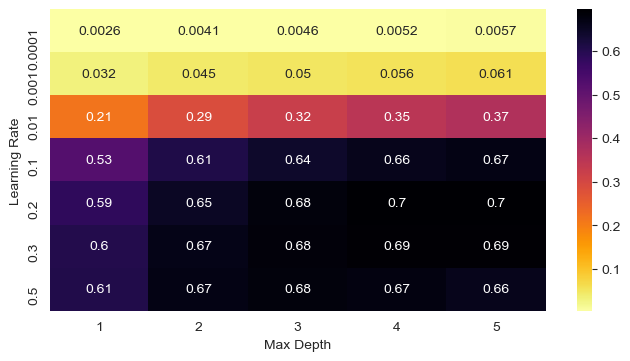

In [533]:
fig = plt.figure(figsize=(8,4),dpi=100)
sns.heatmap(output.pivot_table(index='param_learning_rate',columns='param_max_depth',values='mean_test_score'),annot=True,cmap='inferno_r')
plt.xlabel('Max Depth')
plt.ylabel('Learning Rate')

In [534]:
print('The Best R Squared Value that we are getting is {}'.format(round(gb_score,4)))

The Best R Squared Value that we are getting is 0.7118


# PCA

## Implementing Principal Component Analysis

In [535]:
from sklearn.decomposition import PCA

In [536]:
pca = PCA(n_components=0.90,random_state=0)
X_train_reduced = pca.fit_transform(X_train)
X_test_reduced = pca.transform(X_test)

In [537]:
X_test_reduced.shape

(5404, 7)

We could cut down the features to lesser than half and also keep almost 90% of the variance in the dataset

## Running All the previous Models in part 1 on the reduced dataset

# KNN with PCA

In [538]:
n = list(range(1,51))

In [539]:
knn = KNeighborsRegressor()

In [540]:
grid_params  = {'n_neighbors':n}

In [541]:
kfold = KFold(n_splits=5,random_state=0)

C:\Users\behab\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:297: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


In [542]:
grid = GridSearchCV(knn,grid_params,cv=kfold,verbose=3)

In [543]:
grid.fit(X_train_reduced,y_train)

Fitting 5 folds for each of 50 candidates, totalling 250 fits
[CV] n_neighbors=1 ...................................................
[CV] ....................... n_neighbors=1, score=0.434, total=   0.1s
[CV] n_neighbors=1 ...................................................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


[CV] ....................... n_neighbors=1, score=0.296, total=   0.1s
[CV] n_neighbors=1 ...................................................
[CV] ....................... n_neighbors=1, score=0.410, total=   0.0s
[CV] n_neighbors=1 ...................................................
[CV] ....................... n_neighbors=1, score=0.323, total=   0.1s
[CV] n_neighbors=1 ...................................................
[CV] ....................... n_neighbors=1, score=0.368, total=   0.0s
[CV] n_neighbors=2 ...................................................
[CV] ....................... n_neighbors=2, score=0.525, total=   0.1s
[CV] n_neighbors=2 ...................................................
[CV] ....................... n_neighbors=2, score=0.470, total=   0.1s
[CV] n_neighbors=2 ...................................................
[CV] ....................... n_neighbors=2, score=0.500, total=   0.1s
[CV] n_neighbors=2 ...................................................
[CV] .

[CV] ...................... n_neighbors=12, score=0.621, total=   0.1s
[CV] n_neighbors=13 ..................................................
[CV] ...................... n_neighbors=13, score=0.594, total=   0.1s
[CV] n_neighbors=13 ..................................................
[CV] ...................... n_neighbors=13, score=0.579, total=   0.1s
[CV] n_neighbors=13 ..................................................
[CV] ...................... n_neighbors=13, score=0.602, total=   0.1s
[CV] n_neighbors=13 ..................................................
[CV] ...................... n_neighbors=13, score=0.675, total=   0.1s
[CV] n_neighbors=13 ..................................................
[CV] ...................... n_neighbors=13, score=0.620, total=   0.1s
[CV] n_neighbors=14 ..................................................
[CV] ...................... n_neighbors=14, score=0.593, total=   0.1s
[CV] n_neighbors=14 ..................................................
[CV] .

[CV] ...................... n_neighbors=24, score=0.667, total=   0.1s
[CV] n_neighbors=24 ..................................................
[CV] ...................... n_neighbors=24, score=0.606, total=   0.1s
[CV] n_neighbors=25 ..................................................
[CV] ...................... n_neighbors=25, score=0.571, total=   0.1s
[CV] n_neighbors=25 ..................................................
[CV] ...................... n_neighbors=25, score=0.578, total=   0.1s
[CV] n_neighbors=25 ..................................................
[CV] ...................... n_neighbors=25, score=0.595, total=   0.1s
[CV] n_neighbors=25 ..................................................
[CV] ...................... n_neighbors=25, score=0.667, total=   0.1s
[CV] n_neighbors=25 ..................................................
[CV] ...................... n_neighbors=25, score=0.605, total=   0.1s
[CV] n_neighbors=26 ..................................................
[CV] .

[CV] ...................... n_neighbors=36, score=0.583, total=   0.1s
[CV] n_neighbors=36 ..................................................
[CV] ...................... n_neighbors=36, score=0.653, total=   0.1s
[CV] n_neighbors=36 ..................................................
[CV] ...................... n_neighbors=36, score=0.598, total=   0.1s
[CV] n_neighbors=37 ..................................................
[CV] ...................... n_neighbors=37, score=0.552, total=   0.1s
[CV] n_neighbors=37 ..................................................
[CV] ...................... n_neighbors=37, score=0.570, total=   0.1s
[CV] n_neighbors=37 ..................................................
[CV] ...................... n_neighbors=37, score=0.583, total=   0.1s
[CV] n_neighbors=37 ..................................................
[CV] ...................... n_neighbors=37, score=0.651, total=   0.1s
[CV] n_neighbors=37 ..................................................
[CV] .

[CV] ...................... n_neighbors=48, score=0.538, total=   0.1s
[CV] n_neighbors=48 ..................................................
[CV] ...................... n_neighbors=48, score=0.562, total=   0.1s
[CV] n_neighbors=48 ..................................................
[CV] ...................... n_neighbors=48, score=0.572, total=   0.1s
[CV] n_neighbors=48 ..................................................
[CV] ...................... n_neighbors=48, score=0.637, total=   0.1s
[CV] n_neighbors=48 ..................................................
[CV] ...................... n_neighbors=48, score=0.591, total=   0.1s
[CV] n_neighbors=49 ..................................................
[CV] ...................... n_neighbors=49, score=0.538, total=   0.1s
[CV] n_neighbors=49 ..................................................
[CV] ...................... n_neighbors=49, score=0.562, total=   0.1s
[CV] n_neighbors=49 ..................................................
[CV] .

[Parallel(n_jobs=1)]: Done 250 out of 250 | elapsed:   23.7s finished


GridSearchCV(cv=KFold(n_splits=5, random_state=0, shuffle=False),
             estimator=KNeighborsRegressor(),
             param_grid={'n_neighbors': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12,
                                         13, 14, 15, 16, 17, 18, 19, 20, 21, 22,
                                         23, 24, 25, 26, 27, 28, 29, 30, ...]},
             verbose=3)

In [544]:
grid.best_params_

{'n_neighbors': 10}

In [545]:
grid.best_score_

0.6154049837782184

In [546]:
results_knn_pca = pd.DataFrame(grid.cv_results_)

Text(0.5, 1.0, 'Testing Accuracy For Different values of K(Neighbours)')

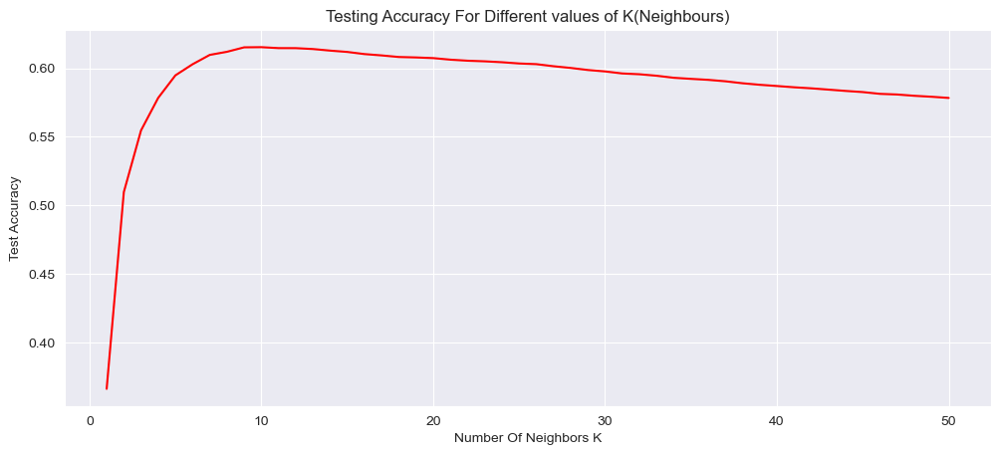

In [547]:
fig = plt.figure(figsize=(12,5),dpi=100)
sns.lineplot(data=results_knn_pca,x=results_knn_pca['param_n_neighbors'],y=results_knn_pca['mean_test_score'],color='red')
plt.xlabel('Number Of Neighbors K')
plt.ylabel('Test Accuracy')
plt.title('Testing Accuracy For Different values of K(Neighbours)')

In [548]:
knn = KNeighborsRegressor(n_neighbors=13)

In [549]:
cross_val_knn = cross_val_score(knn,X_train_reduced,y_train,cv=kfold,verbose=3)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s remaining:    0.0s


[CV]  ................................................................
[CV] .................................... , score=0.594, total=   0.1s
[CV]  ................................................................
[CV] .................................... , score=0.579, total=   0.1s
[CV]  ................................................................
[CV] .................................... , score=0.602, total=   0.1s
[CV]  ................................................................
[CV] .................................... , score=0.675, total=   0.1s
[CV]  ................................................................
[CV] .................................... , score=0.620, total=   0.1s


[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.3s finished


In [550]:
knn_mean_score_cv_pca = cross_val_knn.mean()

In [551]:
print('The cross validated R-Squared score of the best knn model with 13 neighbours on the reduced dataset by pca is: {}'.format(round(knn_mean_score_cv_pca,4)))

The cross validated R-Squared score of the best knn model with 13 neighbours on the reduced dataset by pca is: 0.6141


# Linear Regression with PCA

In [552]:
lm = LinearRegression()

In [553]:
lm.fit(X_train_reduced,y_train)

LinearRegression()

In [554]:
lm.score(X_train_reduced,y_train)

0.5748458975510977

In [555]:
lm.score(X_test_reduced,y_test)

0.560693047850001

In [556]:
cross_val_lm = cross_val_score(lm,X_train_reduced,y_train,cv=kfold,verbose=3)

[CV]  ................................................................
[CV] .................................... , score=0.569, total=   0.0s
[CV]  ................................................................
[CV] .................................... , score=0.515, total=   0.0s
[CV]  ................................................................
[CV] .................................... , score=0.585, total=   0.0s
[CV]  ................................................................
[CV] .................................... , score=0.606, total=   0.0s
[CV]  ................................................................
[CV] .................................... , score=0.570, total=   0.0s


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


In [557]:
lm_mean_score_cv_pca= cross_val_lm.mean()

Text(0.5, 1.0, 'Testing Accuracy For different Cross Validation Iteration')

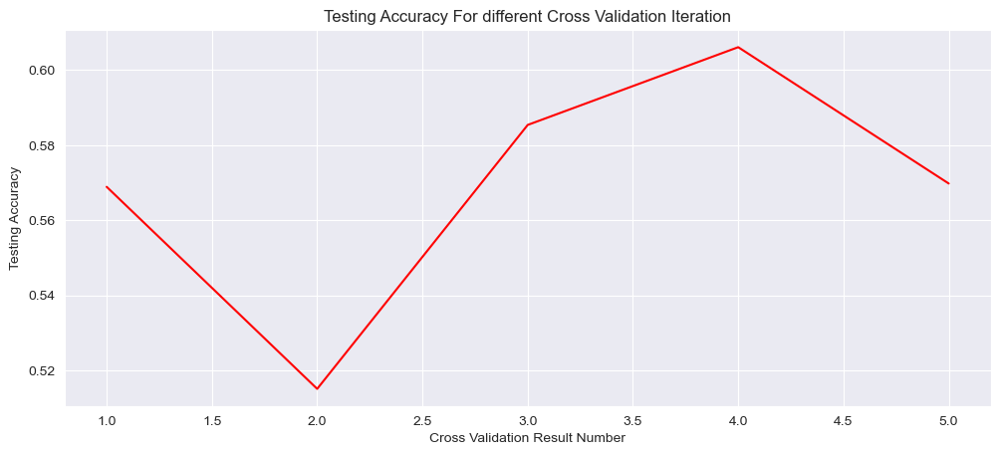

In [558]:
fig = plt.figure(figsize=(12,5),dpi=100)
plt.plot(np.arange(1,6),cross_val_lm,c='red')
plt.xlabel('Cross Validation Result Number')
plt.ylabel('Testing Accuracy')
plt.title('Testing Accuracy For different Cross Validation Iteration')


In [559]:
print('The cross validated Test score(R-Squared) of the best Linear model with reduced dataset is: {}'.format(round(lm_mean_score_cv_pca,4)))

The cross validated Test score(R-Squared) of the best Linear model with reduced dataset is: 0.5691


# Ridge Regression with PCA

In [560]:
ridge = Ridge(random_state=0)

In [561]:
ridge.fit(X_train_reduced,y_train)

Ridge(random_state=0)

In [562]:
ridge.score(X_train_reduced,y_train)

0.5748437522584566

In [563]:
ridge.score(X_test_reduced,y_test)

0.560669811728379

In [564]:
ridge = Ridge(random_state=0)

In [565]:
alpha_range = [0.0001,0.001,0.01,0.1,1,10,100,1000,10000]

In [566]:
grid_params = {'alpha':[0.0001,0.001,0.01,0.1,1,10,100,1000,10000]}

In [567]:
grid = GridSearchCV(ridge,grid_params,cv=kfold,verbose=3)

In [568]:
grid.fit(X_train_reduced,y_train)

Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] alpha=0.0001 ....................................................
[CV] ........................ alpha=0.0001, score=0.569, total=   0.0s
[CV] alpha=0.0001 ....................................................
[CV] ........................ alpha=0.0001, score=0.515, total=   0.0s
[CV] alpha=0.0001 ....................................................
[CV] ........................ alpha=0.0001, score=0.585, total=   0.0s
[CV] alpha=0.0001 ....................................................
[CV] ........................ alpha=0.0001, score=0.606, total=   0.0s
[CV] alpha=0.0001 ....................................................
[CV] ........................ alpha=0.0001, score=0.570, total=   0.0s
[CV] alpha=0.001 .....................................................
[CV] ......................... alpha=0.001, score=0.569, total=   0.0s
[CV] alpha=0.001 .....................................................
[CV] ............

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s



[CV] alpha=10 ........................................................
[CV] ............................ alpha=10, score=0.583, total=   0.0s
[CV] alpha=10 ........................................................
[CV] ............................ alpha=10, score=0.607, total=   0.0s
[CV] alpha=10 ........................................................
[CV] ............................ alpha=10, score=0.570, total=   0.0s
[CV] alpha=100 .......................................................
[CV] ........................... alpha=100, score=0.538, total=   0.0s
[CV] alpha=100 .......................................................
[CV] ........................... alpha=100, score=0.523, total=   0.0s
[CV] alpha=100 .......................................................
[CV] ........................... alpha=100, score=0.553, total=   0.0s
[CV] alpha=100 .......................................................
[CV] ........................... alpha=100, score=0.595, total=   0.0s
[CV] 

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:    0.2s finished


GridSearchCV(cv=KFold(n_splits=5, random_state=0, shuffle=False),
             estimator=Ridge(random_state=0),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.1, 1, 10, 100, 1000,
                                   10000]},
             verbose=3)

In [569]:
grid.best_params_

{'alpha': 10}

In [570]:
grid.best_score_

0.5691137357233904

In [571]:
results_ridge_pca = pd.DataFrame(grid.cv_results_)

Text(0.5, 1.0, 'Testing Accuracy by Range of Alpha(Tuning Parameter) values Ridge Regression')

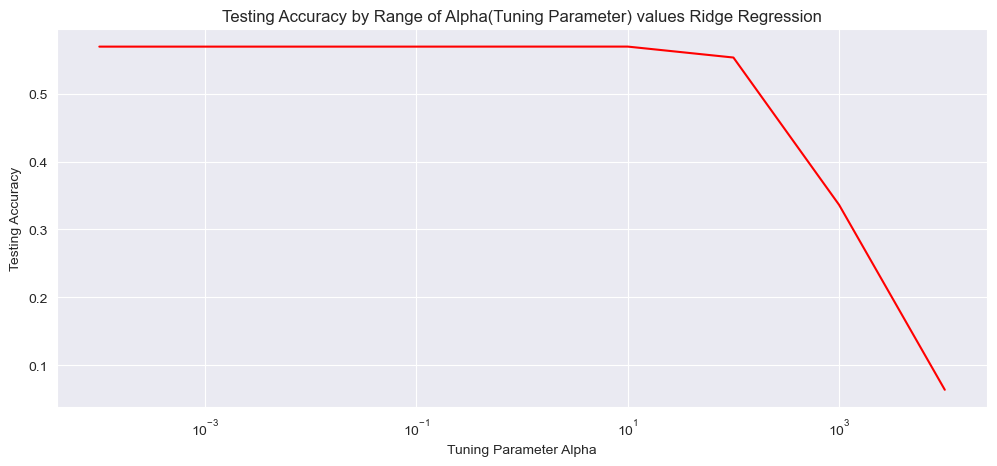

In [572]:
fig = plt.figure(figsize=(12,5),dpi=100)
sns.lineplot(data=results_ridge_pca,x='param_alpha',y='mean_test_score',color = 'red')
plt.xlabel('Tuning Parameter Alpha')
plt.ylabel('Testing Accuracy')
plt.xscale('log')
plt.title('Testing Accuracy by Range of Alpha(Tuning Parameter) values Ridge Regression')


In [573]:
ridge = Ridge(alpha=10,random_state=0)

In [574]:
cross_val_ridge = cross_val_score(ridge,X_train_reduced,y_train,cv=kfold,verbose=3)

[CV]  ................................................................
[CV] .................................... , score=0.567, total=   0.0s
[CV]  ................................................................
[CV] .................................... , score=0.519, total=   0.0s
[CV]  ................................................................
[CV] .................................... , score=0.583, total=   0.0s
[CV]  ................................................................
[CV] .................................... , score=0.607, total=   0.0s
[CV]  ................................................................
[CV] .................................... , score=0.570, total=   0.0s


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


In [575]:
ridge_mean_score_cv_pca= cross_val_ridge.mean()

In [576]:
print('The cross validated Testing score (R-Squared) of the best Ridge model with reduced dataset is: {}'.format(round(ridge_mean_score_cv_pca,4)))

The cross validated Testing score (R-Squared) of the best Ridge model with reduced dataset is: 0.5691


# Lasso Regression with PCA

In [577]:
lasso = Lasso(random_state=0)

In [578]:
lasso.fit(X_train_reduced,y_train)

Lasso(random_state=0)

In [579]:
lasso.score(X_train_reduced,y_train)

0.5748458950768187

In [580]:
lasso.score(X_test_reduced,y_test)

0.5606925605786921

In [581]:
alpha_range = [0.0001,0.001,0.01,0.1,1,10,100,1000,10000]

In [582]:
grid_params = {'alpha':[0.0001,0.001,0.01,0.1,1,10,100,1000,10000]}

In [583]:
grid = GridSearchCV(lasso,grid_params,cv=kfold,verbose=3)

In [584]:
grid.fit(X_train_reduced,y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] alpha=0.0001 ....................................................
[CV] ........................ alpha=0.0001, score=0.569, total=   0.0s
[CV] alpha=0.0001 ....................................................
[CV] ........................ alpha=0.0001, score=0.515, total=   0.0s
[CV] alpha=0.0001 ....................................................
[CV] ........................ alpha=0.0001, score=0.585, total=   0.0s
[CV] alpha=0.0001 ....................................................
[CV] ........................ alpha=0.0001, score=0.606, total=   0.0s
[CV] alpha=0.0001 ....................................................
[CV] ........................ alpha=0.0001, score=0.570, total=   0.0s
[CV] alpha=0.001 .....................................................
[CV] ......................... alpha=0.001, score=0.569, total=   0.0s
[CV] alpha=0.001 .....................................................
[CV] ............

[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:    0.1s finished


GridSearchCV(cv=KFold(n_splits=5, random_state=0, shuffle=False),
             estimator=Lasso(random_state=0),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.1, 1, 10, 100, 1000,
                                   10000]},
             verbose=3)

In [585]:
grid.best_params_

{'alpha': 100}

In [586]:
grid.best_score_

0.5691025412750093

In [587]:
results_lasso_pca = pd.DataFrame(grid.cv_results_)

Text(0.5, 1.0, 'Testing Accuracy by Range of Alpha(Tuning Parameter) values For Lasso Regression')

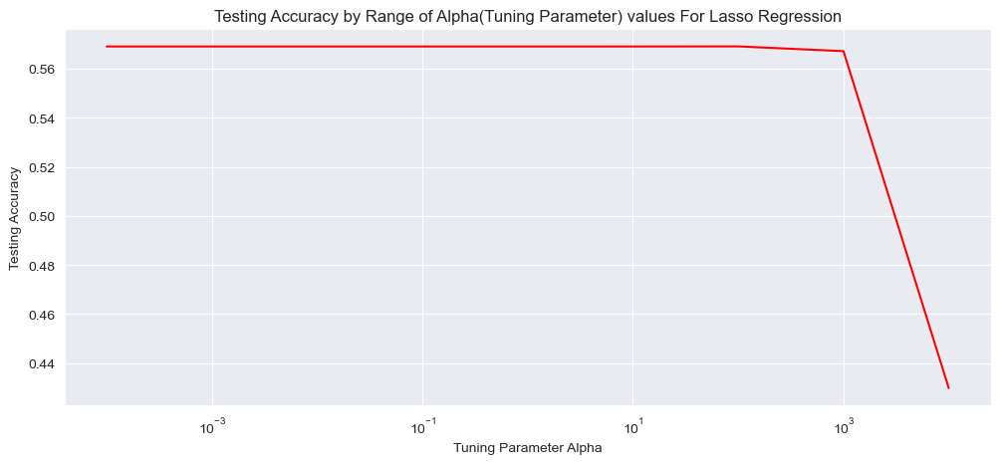

In [588]:
fig = plt.figure(figsize=(12,5),dpi=100)
sns.lineplot(data=results_lasso_pca,x='param_alpha',y='mean_test_score',color = 'red')
plt.xlabel('Tuning Parameter Alpha')
plt.ylabel('Testing Accuracy')
plt.xscale('log')
plt.title('Testing Accuracy by Range of Alpha(Tuning Parameter) values For Lasso Regression')


In [589]:
lasso = Lasso(alpha=100)

In [590]:
cross_val_lasso = cross_val_score(lasso,X_train_reduced,y_train,cv=kfold,verbose=3)

[CV]  ................................................................
[CV] .................................... , score=0.569, total=   0.0s
[CV]  ................................................................
[CV] .................................... , score=0.516, total=   0.0s
[CV]  ................................................................
[CV] .................................... , score=0.585, total=   0.0s
[CV]  ................................................................
[CV] .................................... , score=0.606, total=   0.0s
[CV]  ................................................................
[CV] .................................... , score=0.570, total=   0.0s


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


In [591]:
lasso_mean_score_cv_pca = cross_val_lasso.mean()

In [592]:
print('The cross validated Testing score(R-Squared) of the best Lasso model with reduced dataset is: {}'.format(round(lasso_mean_score_cv_pca,4)))

The cross validated Testing score(R-Squared) of the best Lasso model with reduced dataset is: 0.5691


In [593]:
# Decision Tree With PCA

In [594]:
tree = DecisionTreeRegressor(random_state=0)

In [595]:
tree.fit(X_train_reduced,y_train)

DecisionTreeRegressor(random_state=0)

In [596]:
tree.score(X_train_reduced,y_train)

0.9999287418430224

In [597]:
tree.score(X_test_reduced,y_test)

0.37229360704466685

In [598]:
depth = list(range(1,101))

In [599]:
grid_params = {'max_depth':depth}

In [600]:
grid = GridSearchCV(tree,grid_params,cv=kfold,verbose=3)

In [601]:
grid.fit(X_train_reduced,y_train)

Fitting 5 folds for each of 100 candidates, totalling 500 fits
[CV] max_depth=1 .....................................................
[CV] ......................... max_depth=1, score=0.216, total=   0.0s
[CV] max_depth=1 .....................................................
[CV] ......................... max_depth=1, score=0.198, total=   0.0s
[CV] max_depth=1 .....................................................
[CV] ......................... max_depth=1, score=0.230, total=   0.0s
[CV] max_depth=1 .....................................................
[CV] ......................... max_depth=1, score=0.249, total=   0.0s
[CV] max_depth=1 .....................................................
[CV] ......................... max_depth=1, score=0.234, total=   0.0s
[CV] max_depth=2 .....................................................
[CV] ......................... max_depth=2, score=0.313, total=   0.0s
[CV] max_depth=2 .....................................................
[CV] .........

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


[CV] ......................... max_depth=3, score=0.404, total=   0.0s
[CV] max_depth=3 .....................................................
[CV] ......................... max_depth=3, score=0.339, total=   0.0s
[CV] max_depth=3 .....................................................
[CV] ......................... max_depth=3, score=0.438, total=   0.0s
[CV] max_depth=3 .....................................................
[CV] ......................... max_depth=3, score=0.473, total=   0.0s
[CV] max_depth=3 .....................................................
[CV] ......................... max_depth=3, score=0.444, total=   0.0s
[CV] max_depth=4 .....................................................
[CV] ......................... max_depth=4, score=0.447, total=   0.0s
[CV] max_depth=4 .....................................................
[CV] ......................... max_depth=4, score=0.384, total=   0.0s
[CV] max_depth=4 .....................................................
[CV] .

[CV] ........................ max_depth=14, score=0.367, total=   0.1s
[CV] max_depth=14 ....................................................
[CV] ........................ max_depth=14, score=0.344, total=   0.1s
[CV] max_depth=15 ....................................................
[CV] ........................ max_depth=15, score=0.435, total=   0.1s
[CV] max_depth=15 ....................................................
[CV] ........................ max_depth=15, score=0.206, total=   0.1s
[CV] max_depth=15 ....................................................
[CV] ........................ max_depth=15, score=0.399, total=   0.1s
[CV] max_depth=15 ....................................................
[CV] ........................ max_depth=15, score=0.437, total=   0.1s
[CV] max_depth=15 ....................................................
[CV] ........................ max_depth=15, score=0.355, total=   0.1s
[CV] max_depth=16 ....................................................
[CV] .

[CV] ........................ max_depth=26, score=0.085, total=   0.1s
[CV] max_depth=26 ....................................................
[CV] ........................ max_depth=26, score=0.366, total=   0.1s
[CV] max_depth=26 ....................................................
[CV] ........................ max_depth=26, score=0.321, total=   0.1s
[CV] max_depth=26 ....................................................
[CV] ........................ max_depth=26, score=0.290, total=   0.1s
[CV] max_depth=27 ....................................................
[CV] ........................ max_depth=27, score=0.402, total=   0.1s
[CV] max_depth=27 ....................................................
[CV] ........................ max_depth=27, score=0.085, total=   0.1s
[CV] max_depth=27 ....................................................
[CV] ........................ max_depth=27, score=0.359, total=   0.1s
[CV] max_depth=27 ....................................................
[CV] .

[CV] ........................ max_depth=37, score=0.274, total=   0.1s
[CV] max_depth=38 ....................................................
[CV] ........................ max_depth=38, score=0.388, total=   0.1s
[CV] max_depth=38 ....................................................
[CV] ........................ max_depth=38, score=0.092, total=   0.1s
[CV] max_depth=38 ....................................................
[CV] ........................ max_depth=38, score=0.386, total=   0.1s
[CV] max_depth=38 ....................................................
[CV] ........................ max_depth=38, score=0.359, total=   0.1s
[CV] max_depth=38 ....................................................
[CV] ........................ max_depth=38, score=0.285, total=   0.1s
[CV] max_depth=39 ....................................................
[CV] ........................ max_depth=39, score=0.388, total=   0.1s
[CV] max_depth=39 ....................................................
[CV] .

[CV] ........................ max_depth=49, score=0.386, total=   0.1s
[CV] max_depth=49 ....................................................
[CV] ........................ max_depth=49, score=0.246, total=   0.1s
[CV] max_depth=49 ....................................................
[CV] ........................ max_depth=49, score=0.275, total=   0.1s
[CV] max_depth=50 ....................................................
[CV] ........................ max_depth=50, score=0.388, total=   0.1s
[CV] max_depth=50 ....................................................
[CV] ........................ max_depth=50, score=0.092, total=   0.1s
[CV] max_depth=50 ....................................................
[CV] ........................ max_depth=50, score=0.386, total=   0.1s
[CV] max_depth=50 ....................................................
[CV] ........................ max_depth=50, score=0.246, total=   0.1s
[CV] max_depth=50 ....................................................
[CV] .

[CV] ........................ max_depth=61, score=0.388, total=   0.1s
[CV] max_depth=61 ....................................................
[CV] ........................ max_depth=61, score=0.092, total=   0.1s
[CV] max_depth=61 ....................................................
[CV] ........................ max_depth=61, score=0.386, total=   0.1s
[CV] max_depth=61 ....................................................
[CV] ........................ max_depth=61, score=0.246, total=   0.1s
[CV] max_depth=61 ....................................................
[CV] ........................ max_depth=61, score=0.275, total=   0.1s
[CV] max_depth=62 ....................................................
[CV] ........................ max_depth=62, score=0.388, total=   0.1s
[CV] max_depth=62 ....................................................
[CV] ........................ max_depth=62, score=0.092, total=   0.1s
[CV] max_depth=62 ....................................................
[CV] .

[CV] ........................ max_depth=72, score=0.246, total=   0.1s
[CV] max_depth=72 ....................................................
[CV] ........................ max_depth=72, score=0.275, total=   0.1s
[CV] max_depth=73 ....................................................
[CV] ........................ max_depth=73, score=0.388, total=   0.2s
[CV] max_depth=73 ....................................................
[CV] ........................ max_depth=73, score=0.092, total=   0.1s
[CV] max_depth=73 ....................................................
[CV] ........................ max_depth=73, score=0.386, total=   0.1s
[CV] max_depth=73 ....................................................
[CV] ........................ max_depth=73, score=0.246, total=   0.1s
[CV] max_depth=73 ....................................................
[CV] ........................ max_depth=73, score=0.275, total=   0.1s
[CV] max_depth=74 ....................................................
[CV] .

[CV] ........................ max_depth=84, score=0.092, total=   0.1s
[CV] max_depth=84 ....................................................
[CV] ........................ max_depth=84, score=0.386, total=   0.1s
[CV] max_depth=84 ....................................................
[CV] ........................ max_depth=84, score=0.246, total=   0.1s
[CV] max_depth=84 ....................................................
[CV] ........................ max_depth=84, score=0.275, total=   0.1s
[CV] max_depth=85 ....................................................
[CV] ........................ max_depth=85, score=0.388, total=   0.1s
[CV] max_depth=85 ....................................................
[CV] ........................ max_depth=85, score=0.092, total=   0.1s
[CV] max_depth=85 ....................................................
[CV] ........................ max_depth=85, score=0.386, total=   0.1s
[CV] max_depth=85 ....................................................
[CV] .

[CV] ........................ max_depth=95, score=0.275, total=   0.1s
[CV] max_depth=96 ....................................................
[CV] ........................ max_depth=96, score=0.388, total=   0.1s
[CV] max_depth=96 ....................................................
[CV] ........................ max_depth=96, score=0.092, total=   0.1s
[CV] max_depth=96 ....................................................
[CV] ........................ max_depth=96, score=0.386, total=   0.1s
[CV] max_depth=96 ....................................................
[CV] ........................ max_depth=96, score=0.246, total=   0.1s
[CV] max_depth=96 ....................................................
[CV] ........................ max_depth=96, score=0.275, total=   0.1s
[CV] max_depth=97 ....................................................
[CV] ........................ max_depth=97, score=0.388, total=   0.1s
[CV] max_depth=97 ....................................................
[CV] .

[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:   55.2s finished


GridSearchCV(cv=KFold(n_splits=5, random_state=0, shuffle=False),
             estimator=DecisionTreeRegressor(random_state=0),
             param_grid={'max_depth': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12,
                                       13, 14, 15, 16, 17, 18, 19, 20, 21, 22,
                                       23, 24, 25, 26, 27, 28, 29, 30, ...]},
             verbose=3)

In [602]:
grid.best_params_

{'max_depth': 6}

In [603]:
grid.best_score_

0.5054241570335261

In [604]:
results_tree_pca = pd.DataFrame(grid.cv_results_)

Text(0.5, 1.0, 'Testing Accuracy by The Maximum Depth Of The Tree')

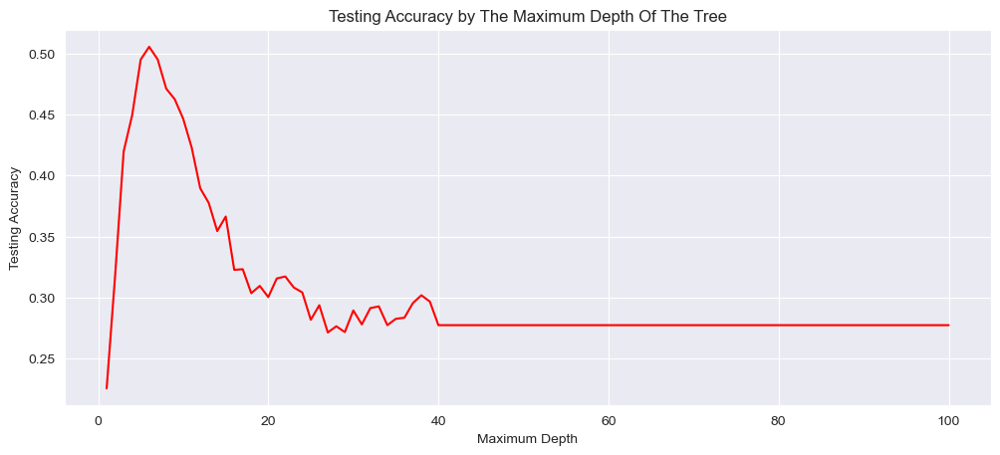

In [605]:
fig = plt.figure(figsize=(12,5),dpi=100)
sns.lineplot(data=results_tree_pca,x='param_max_depth',y='mean_test_score',color='red')
plt.xlabel('Maximum Depth')
plt.ylabel('Testing Accuracy')
plt.title('Testing Accuracy by The Maximum Depth Of The Tree')


In [606]:
tree = DecisionTreeRegressor(max_depth=9)

In [607]:
tree.fit(X_train_reduced,y_train)

DecisionTreeRegressor(max_depth=9)

In [608]:
cross_val_tree = cross_val_score(tree,X_train_reduced,y_train,verbose=3,cv=kfold)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


[CV]  ................................................................
[CV] .................................... , score=0.546, total=   0.1s
[CV]  ................................................................
[CV] .................................... , score=0.335, total=   0.1s
[CV]  ................................................................
[CV] .................................... , score=0.506, total=   0.1s
[CV]  ................................................................
[CV] .................................... , score=0.414, total=   0.1s
[CV]  ................................................................
[CV] .................................... , score=0.463, total=   0.1s


[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.2s finished


In [609]:
tree_mean_score_cv_pca = cross_val_tree.mean()

In [610]:
print('The cross validated Test score (R-Squared) of the best Decision Tree Regressor model on reduced dataset is: {}'.format(round(tree_mean_score_cv_pca,4)))

The cross validated Test score (R-Squared) of the best Decision Tree Regressor model on reduced dataset is: 0.4529


# Sampling The Data For More Complicated Datasets

In [611]:
np.random.seed(0)
sample_train = np.random.randint(5404,16209,1500)
sample_test = np.random.randint(0,5404,1000)


In [612]:
X_train_reduced = pd.DataFrame(X_train_reduced)
X_test_reduced = pd.DataFrame(X_test_reduced)

In [613]:
X_train_sample_reduced = X_train_reduced.iloc[sample_train,:]
y_train_sample = y_train.iloc[sample_train]


In [614]:
X_test_sample_reduced = X_train_reduced.iloc[sample_test,:]
y_test_sample = y_test.iloc[sample_test]


# Random Forrest after PCA

In [615]:
rf = RandomForestRegressor()

In [616]:
rf.fit(X_train_sample_reduced,y_train_sample)

RandomForestRegressor()

In [617]:
rf.score(X_train_sample_reduced,y_train_sample)

0.9426920974456848

In [618]:
rf.score(X_test_sample_reduced,y_test_sample)

-0.3940384335805436

In [619]:
grid_params = {'n_estimators':[400,500],'max_depth':depth[:51]}
grid = GridSearchCV(rf,grid_params,cv=kfold,verbose=3)


In [620]:
grid.fit(X_train_sample_reduced,y_train_sample)

Fitting 5 folds for each of 102 candidates, totalling 510 fits
[CV] max_depth=1, n_estimators=400 ...................................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] ....... max_depth=1, n_estimators=400, score=0.310, total=   0.7s
[CV] max_depth=1, n_estimators=400 ...................................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.6s remaining:    0.0s


[CV] ....... max_depth=1, n_estimators=400, score=0.303, total=   0.6s
[CV] max_depth=1, n_estimators=400 ...................................


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    1.2s remaining:    0.0s


[CV] ....... max_depth=1, n_estimators=400, score=0.305, total=   0.6s
[CV] max_depth=1, n_estimators=400 ...................................
[CV] ....... max_depth=1, n_estimators=400, score=0.175, total=   0.6s
[CV] max_depth=1, n_estimators=400 ...................................
[CV] ....... max_depth=1, n_estimators=400, score=0.202, total=   0.6s
[CV] max_depth=1, n_estimators=500 ...................................
[CV] ....... max_depth=1, n_estimators=500, score=0.313, total=   0.8s
[CV] max_depth=1, n_estimators=500 ...................................
[CV] ....... max_depth=1, n_estimators=500, score=0.301, total=   0.8s
[CV] max_depth=1, n_estimators=500 ...................................
[CV] ....... max_depth=1, n_estimators=500, score=0.307, total=   0.7s
[CV] max_depth=1, n_estimators=500 ...................................
[CV] ....... max_depth=1, n_estimators=500, score=0.166, total=   0.7s
[CV] max_depth=1, n_estimators=500 ...................................
[CV] .

[CV] ....... max_depth=7, n_estimators=400, score=0.611, total=   1.3s
[CV] max_depth=7, n_estimators=400 ...................................
[CV] ....... max_depth=7, n_estimators=400, score=0.549, total=   1.4s
[CV] max_depth=7, n_estimators=400 ...................................
[CV] ....... max_depth=7, n_estimators=400, score=0.502, total=   1.4s
[CV] max_depth=7, n_estimators=400 ...................................
[CV] ....... max_depth=7, n_estimators=400, score=0.498, total=   1.3s
[CV] max_depth=7, n_estimators=400 ...................................
[CV] ....... max_depth=7, n_estimators=400, score=0.480, total=   1.3s
[CV] max_depth=7, n_estimators=500 ...................................
[CV] ....... max_depth=7, n_estimators=500, score=0.600, total=   1.7s
[CV] max_depth=7, n_estimators=500 ...................................
[CV] ....... max_depth=7, n_estimators=500, score=0.544, total=   1.7s
[CV] max_depth=7, n_estimators=500 ...................................
[CV] .

[CV] ...... max_depth=12, n_estimators=500, score=0.488, total=   2.7s
[CV] max_depth=12, n_estimators=500 ..................................
[CV] ...... max_depth=12, n_estimators=500, score=0.495, total=   2.8s
[CV] max_depth=13, n_estimators=400 ..................................
[CV] ...... max_depth=13, n_estimators=400, score=0.639, total=   2.1s
[CV] max_depth=13, n_estimators=400 ..................................
[CV] ...... max_depth=13, n_estimators=400, score=0.581, total=   2.2s
[CV] max_depth=13, n_estimators=400 ..................................
[CV] ...... max_depth=13, n_estimators=400, score=0.540, total=   2.3s
[CV] max_depth=13, n_estimators=400 ..................................
[CV] ...... max_depth=13, n_estimators=400, score=0.494, total=   2.2s
[CV] max_depth=13, n_estimators=400 ..................................
[CV] ...... max_depth=13, n_estimators=400, score=0.504, total=   2.4s
[CV] max_depth=13, n_estimators=500 ..................................
[CV] .

[CV] ...... max_depth=18, n_estimators=500, score=0.573, total=   2.5s
[CV] max_depth=18, n_estimators=500 ..................................
[CV] ...... max_depth=18, n_estimators=500, score=0.532, total=   2.6s
[CV] max_depth=18, n_estimators=500 ..................................
[CV] ...... max_depth=18, n_estimators=500, score=0.497, total=   2.5s
[CV] max_depth=18, n_estimators=500 ..................................
[CV] ...... max_depth=18, n_estimators=500, score=0.503, total=   2.5s
[CV] max_depth=19, n_estimators=400 ..................................
[CV] ...... max_depth=19, n_estimators=400, score=0.641, total=   2.0s
[CV] max_depth=19, n_estimators=400 ..................................
[CV] ...... max_depth=19, n_estimators=400, score=0.579, total=   2.1s
[CV] max_depth=19, n_estimators=400 ..................................
[CV] ...... max_depth=19, n_estimators=400, score=0.539, total=   2.1s
[CV] max_depth=19, n_estimators=400 ..................................
[CV] .

[CV] ...... max_depth=24, n_estimators=400, score=0.500, total=   2.0s
[CV] max_depth=24, n_estimators=500 ..................................
[CV] ...... max_depth=24, n_estimators=500, score=0.648, total=   2.5s
[CV] max_depth=24, n_estimators=500 ..................................
[CV] ...... max_depth=24, n_estimators=500, score=0.573, total=   2.6s
[CV] max_depth=24, n_estimators=500 ..................................
[CV] ...... max_depth=24, n_estimators=500, score=0.534, total=   2.6s
[CV] max_depth=24, n_estimators=500 ..................................
[CV] ...... max_depth=24, n_estimators=500, score=0.491, total=   2.5s
[CV] max_depth=24, n_estimators=500 ..................................
[CV] ...... max_depth=24, n_estimators=500, score=0.502, total=   2.5s
[CV] max_depth=25, n_estimators=400 ..................................
[CV] ...... max_depth=25, n_estimators=400, score=0.651, total=   2.0s
[CV] max_depth=25, n_estimators=400 ..................................
[CV] .

[CV] ...... max_depth=30, n_estimators=400, score=0.545, total=   2.1s
[CV] max_depth=30, n_estimators=400 ..................................
[CV] ...... max_depth=30, n_estimators=400, score=0.492, total=   2.1s
[CV] max_depth=30, n_estimators=400 ..................................
[CV] ...... max_depth=30, n_estimators=400, score=0.508, total=   2.0s
[CV] max_depth=30, n_estimators=500 ..................................
[CV] ...... max_depth=30, n_estimators=500, score=0.646, total=   2.6s
[CV] max_depth=30, n_estimators=500 ..................................
[CV] ...... max_depth=30, n_estimators=500, score=0.577, total=   2.6s
[CV] max_depth=30, n_estimators=500 ..................................
[CV] ...... max_depth=30, n_estimators=500, score=0.535, total=   2.5s
[CV] max_depth=30, n_estimators=500 ..................................
[CV] ...... max_depth=30, n_estimators=500, score=0.494, total=   2.6s
[CV] max_depth=30, n_estimators=500 ..................................
[CV] .

[CV] ...... max_depth=36, n_estimators=400, score=0.643, total=   2.0s
[CV] max_depth=36, n_estimators=400 ..................................
[CV] ...... max_depth=36, n_estimators=400, score=0.572, total=   2.0s
[CV] max_depth=36, n_estimators=400 ..................................
[CV] ...... max_depth=36, n_estimators=400, score=0.529, total=   2.0s
[CV] max_depth=36, n_estimators=400 ..................................
[CV] ...... max_depth=36, n_estimators=400, score=0.491, total=   2.0s
[CV] max_depth=36, n_estimators=400 ..................................
[CV] ...... max_depth=36, n_estimators=400, score=0.493, total=   2.0s
[CV] max_depth=36, n_estimators=500 ..................................
[CV] ...... max_depth=36, n_estimators=500, score=0.648, total=   2.6s
[CV] max_depth=36, n_estimators=500 ..................................
[CV] ...... max_depth=36, n_estimators=500, score=0.576, total=   2.5s
[CV] max_depth=36, n_estimators=500 ..................................
[CV] .

[CV] ...... max_depth=41, n_estimators=500, score=0.492, total=   2.6s
[CV] max_depth=41, n_estimators=500 ..................................
[CV] ...... max_depth=41, n_estimators=500, score=0.494, total=   2.5s
[CV] max_depth=42, n_estimators=400 ..................................
[CV] ...... max_depth=42, n_estimators=400, score=0.648, total=   2.1s
[CV] max_depth=42, n_estimators=400 ..................................
[CV] ...... max_depth=42, n_estimators=400, score=0.573, total=   2.0s
[CV] max_depth=42, n_estimators=400 ..................................
[CV] ...... max_depth=42, n_estimators=400, score=0.535, total=   2.0s
[CV] max_depth=42, n_estimators=400 ..................................
[CV] ...... max_depth=42, n_estimators=400, score=0.489, total=   2.0s
[CV] max_depth=42, n_estimators=400 ..................................
[CV] ...... max_depth=42, n_estimators=400, score=0.511, total=   2.0s
[CV] max_depth=42, n_estimators=500 ..................................
[CV] .

[CV] ...... max_depth=47, n_estimators=500, score=0.577, total=   2.5s
[CV] max_depth=47, n_estimators=500 ..................................
[CV] ...... max_depth=47, n_estimators=500, score=0.531, total=   2.5s
[CV] max_depth=47, n_estimators=500 ..................................
[CV] ...... max_depth=47, n_estimators=500, score=0.496, total=   2.6s
[CV] max_depth=47, n_estimators=500 ..................................
[CV] ...... max_depth=47, n_estimators=500, score=0.501, total=   2.5s
[CV] max_depth=48, n_estimators=400 ..................................
[CV] ...... max_depth=48, n_estimators=400, score=0.647, total=   2.0s
[CV] max_depth=48, n_estimators=400 ..................................
[CV] ...... max_depth=48, n_estimators=400, score=0.580, total=   2.1s
[CV] max_depth=48, n_estimators=400 ..................................
[CV] ...... max_depth=48, n_estimators=400, score=0.542, total=   2.1s
[CV] max_depth=48, n_estimators=400 ..................................
[CV] .

[Parallel(n_jobs=1)]: Done 510 out of 510 | elapsed: 18.0min finished


GridSearchCV(cv=KFold(n_splits=5, random_state=0, shuffle=False),
             estimator=RandomForestRegressor(),
             param_grid={'max_depth': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12,
                                       13, 14, 15, 16, 17, 18, 19, 20, 21, 22,
                                       23, 24, 25, 26, 27, 28, 29, 30, ...],
                         'n_estimators': [400, 500]},
             verbose=3)

In [621]:
grid.best_params_

{'max_depth': 13, 'n_estimators': 500}

In [622]:
grid.best_score_

0.5541906463834563

In [623]:
results_rf_pca = pd.DataFrame(grid.cv_results_)

Text(0.5, 1.0, 'HeatMap Of Mean Test Score With respect To param_n_estimators and depth parameters')

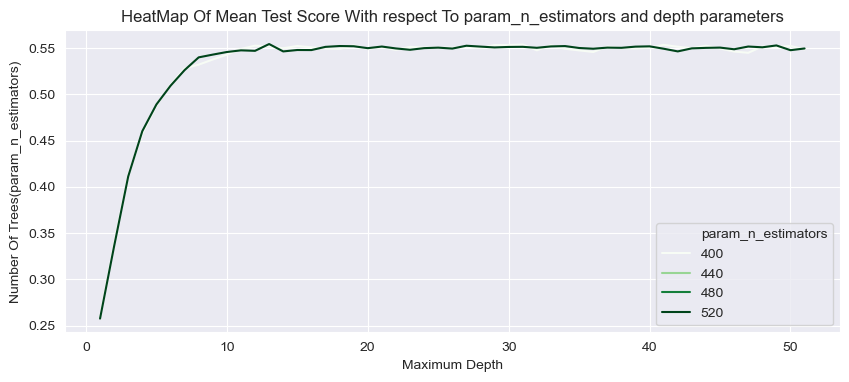

In [624]:
fig = plt.figure(figsize=(10,4),dpi=100)
#sns.heatmap(results_rf.pivot_table(index='param_n_estimators',columns='param_max_depth',values='mean_test_score'),annot=True,cmap='Purples')
sns.lineplot(x=results_rf_pca['param_max_depth'],y=results_rf_pca['mean_test_score'],hue=results_rf_pca['param_n_estimators'],palette='Greens')
plt.ylabel('Number Of Trees(param_n_estimators)')
plt.xlabel('Maximum Depth')
plt.title('HeatMap Of Mean Test Score With respect To param_n_estimators and depth parameters')


In [625]:
rf = RandomForestRegressor(n_estimators=400,max_depth=38)

In [626]:
cross_val_rf = cross_val_score(rf,X_train_sample_reduced,y_train_sample,cv=kfold,verbose=3)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  ................................................................
[CV] .................................... , score=0.640, total=   2.1s
[CV]  ................................................................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    2.0s remaining:    0.0s


[CV] .................................... , score=0.575, total=   2.3s
[CV]  ................................................................


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    4.4s remaining:    0.0s


[CV] .................................... , score=0.529, total=   2.3s
[CV]  ................................................................
[CV] .................................... , score=0.489, total=   2.1s
[CV]  ................................................................
[CV] .................................... , score=0.489, total=   2.0s


[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   10.8s finished


In [627]:
rf_mean_score_cv_pca = cross_val_rf.mean()


In [628]:
print('The cross validated Testing score(R-Squared) of the best Random Forest Regressor model on the reduced dataset is: {}'.format(round(rf_mean_score_cv_pca,4)))

The cross validated Testing score(R-Squared) of the best Random Forest Regressor model on the reduced dataset is: 0.5443


# Linear Support Vector Regressor with PCA

In [629]:
linear_svr = LinearSVR()

In [630]:
linear_svr.fit(X_train_sample_reduced,y_train_sample)


LinearSVR()

In [631]:
grid_params = {'C':[0.001,0.01,0.1,1,10,100,1000],'epsilon':[0, 0.01, 0.1, 0.5, 1, 2, 4]}

In [632]:
grid = GridSearchCV(linear_svr,grid_params,cv=kfold,verbose=5)

In [633]:
grid.fit(X_train_sample_reduced,y_train_sample)

Fitting 5 folds for each of 49 candidates, totalling 245 fits
[CV] C=0.001, epsilon=0 ..............................................
[CV] ................. C=0.001, epsilon=0, score=-2.163, total=   0.0s
[CV] C=0.001, epsilon=0 ..............................................
[CV] ................. C=0.001, epsilon=0, score=-2.768, total=   0.0s
[CV] C=0.001, epsilon=0 ..............................................
[CV] ................. C=0.001, epsilon=0, score=-2.751, total=   0.0s
[CV] C=0.001, epsilon=0 ..............................................
[CV] ................. C=0.001, epsilon=0, score=-3.501, total=   0.0s
[CV] C=0.001, epsilon=0 ..............................................
[CV] ................. C=0.001, epsilon=0, score=-2.584, total=   0.0s
[CV] C=0.001, epsilon=0.01 ...........................................
[CV] .............. C=0.001, epsilon=0.01, score=-2.163, total=   0.0s
[CV] C=0.001, epsilon=0.01 ...........................................
[CV] ..........

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


[CV] ............... C=0.001, epsilon=0.5, score=-2.584, total=   0.0s
[CV] C=0.001, epsilon=1 ..............................................
[CV] ................. C=0.001, epsilon=1, score=-2.163, total=   0.0s
[CV] C=0.001, epsilon=1 ..............................................
[CV] ................. C=0.001, epsilon=1, score=-2.768, total=   0.0s
[CV] C=0.001, epsilon=1 ..............................................
[CV] ................. C=0.001, epsilon=1, score=-2.751, total=   0.0s
[CV] C=0.001, epsilon=1 ..............................................
[CV] ................. C=0.001, epsilon=1, score=-3.501, total=   0.0s
[CV] C=0.001, epsilon=1 ..............................................
[CV] ................. C=0.001, epsilon=1, score=-2.584, total=   0.0s
[CV] C=0.001, epsilon=2 ..............................................
[CV] ................. C=0.001, epsilon=2, score=-2.163, total=   0.0s
[CV] C=0.001, epsilon=2 ..............................................
[CV] .

[CV] ................. C=0.1, epsilon=0.5, score=-2.749, total=   0.0s
[CV] C=0.1, epsilon=0.5 ..............................................
[CV] ................. C=0.1, epsilon=0.5, score=-3.499, total=   0.0s
[CV] C=0.1, epsilon=0.5 ..............................................
[CV] ................. C=0.1, epsilon=0.5, score=-2.583, total=   0.0s
[CV] C=0.1, epsilon=1 ................................................
[CV] ................... C=0.1, epsilon=1, score=-2.162, total=   0.0s
[CV] C=0.1, epsilon=1 ................................................
[CV] ................... C=0.1, epsilon=1, score=-2.767, total=   0.0s
[CV] C=0.1, epsilon=1 ................................................
[CV] ................... C=0.1, epsilon=1, score=-2.749, total=   0.0s
[CV] C=0.1, epsilon=1 ................................................
[CV] ................... C=0.1, epsilon=1, score=-3.499, total=   0.0s
[CV] C=0.1, epsilon=1 ................................................
[CV] .

[CV] .................. C=10, epsilon=0.5, score=-2.629, total=   0.0s
[CV] C=10, epsilon=0.5 ...............................................
[CV] .................. C=10, epsilon=0.5, score=-3.342, total=   0.0s
[CV] C=10, epsilon=0.5 ...............................................
[CV] .................. C=10, epsilon=0.5, score=-2.459, total=   0.0s
[CV] C=10, epsilon=1 .................................................
[CV] .................... C=10, epsilon=1, score=-2.069, total=   0.0s
[CV] C=10, epsilon=1 .................................................
[CV] .................... C=10, epsilon=1, score=-2.653, total=   0.0s
[CV] C=10, epsilon=1 .................................................
[CV] .................... C=10, epsilon=1, score=-2.629, total=   0.0s
[CV] C=10, epsilon=1 .................................................
[CV] .................... C=10, epsilon=1, score=-3.342, total=   0.0s
[CV] C=10, epsilon=1 .................................................
[CV] .

[CV] ............... C=1000, epsilon=0.01, score=-0.144, total=   0.0s
[CV] C=1000, epsilon=0.01 ............................................
[CV] ............... C=1000, epsilon=0.01, score=-0.171, total=   0.0s
[CV] C=1000, epsilon=0.01 ............................................
[CV] ............... C=1000, epsilon=0.01, score=-0.024, total=   0.0s
[CV] C=1000, epsilon=0.1 .............................................
[CV] ................ C=1000, epsilon=0.1, score=-0.101, total=   0.0s
[CV] C=1000, epsilon=0.1 .............................................
[CV] ................ C=1000, epsilon=0.1, score=-0.226, total=   0.0s
[CV] C=1000, epsilon=0.1 .............................................
[CV] ................ C=1000, epsilon=0.1, score=-0.144, total=   0.0s
[CV] C=1000, epsilon=0.1 .............................................
[CV] ................ C=1000, epsilon=0.1, score=-0.174, total=   0.0s
[CV] C=1000, epsilon=0.1 .............................................
[CV] .

[Parallel(n_jobs=1)]: Done 245 out of 245 | elapsed:    1.3s finished


GridSearchCV(cv=KFold(n_splits=5, random_state=0, shuffle=False),
             estimator=LinearSVR(),
             param_grid={'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000],
                         'epsilon': [0, 0.01, 0.1, 0.5, 1, 2, 4]},
             verbose=5)

In [634]:
grid.best_params_

{'C': 1000, 'epsilon': 1}

In [635]:
grid.best_score_

-0.13213643913416434

In [636]:
results_linear_svr_pca = pd.DataFrame(grid.cv_results_)

Text(0.5, 1.0, 'HeatMap Of Mean Test Score With respect To C and epsilon parameters')

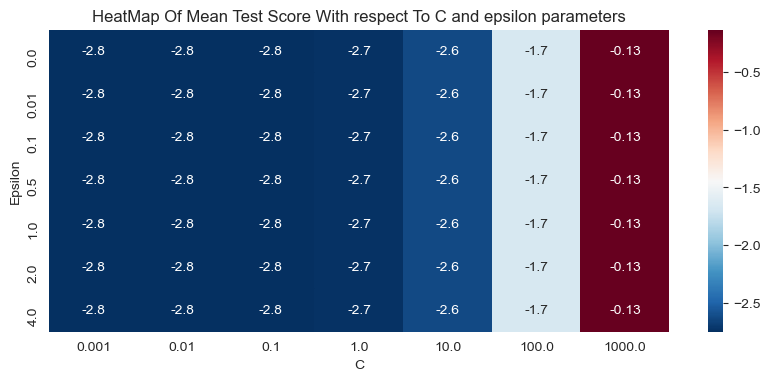

In [637]:
fig = plt.figure(figsize=(10,4),dpi=100)
sns.heatmap(results_linear_svr_pca.pivot_table(index='param_epsilon',columns='param_C',values='mean_test_score'),annot=True,cmap='RdBu_r')
plt.ylabel('Epsilon')
plt.xlabel('C')
plt.title('HeatMap Of Mean Test Score With respect To C and epsilon parameters')


In [638]:
linear_svm = LinearSVR(epsilon=0.01,C=1000)
linear_svm.fit(X_train_sample_reduced,y_train_sample)


LinearSVR(C=1000, epsilon=0.01)

In [639]:
linear_svm_cross_val_score = cross_val_score(linear_svm,X_train_sample_reduced,y_train_sample,cv=kfold,verbose=5)

[CV]  ................................................................
[CV] ................................... , score=-0.101, total=   0.0s
[CV]  ................................................................
[CV] ................................... , score=-0.226, total=   0.0s
[CV]  ................................................................
[CV] ................................... , score=-0.144, total=   0.0s
[CV]  ................................................................
[CV] ................................... , score=-0.171, total=   0.0s
[CV]  ................................................................
[CV] ................................... , score=-0.024, total=   0.0s


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


In [640]:
mean_cross_val_linear_svm_pca = linear_svm_cross_val_score.mean()

In [641]:
print('The Final Accuracy Score That was Achived With Our Best Linear SVM Model with the value of C being 1000 and having epsilon as 0.01 on the reduced dataset  is: {} '.format(round(mean_cross_val_linear_svm_pca,4)))

The Final Accuracy Score That was Achived With Our Best Linear SVM Model with the value of C being 1000 and having epsilon as 0.01 on the reduced dataset  is: -0.1332 


# Polynomial Regression With PCA

In [642]:
lis = np.random.randint(0,1000,10)

In [643]:
training_score = []
testing_score = []
deg = []

for n in range(1,3):
    for j in lis:
        X_train  , X_test , y_train , y_test = train_test_split(X,y,random_state = j)
        scaler = MinMaxScaler()
        
        X_trn = scaler.fit_transform(X_train)
        X_tst = scaler.transform(X_test)
        
        X_train_reduced = pca.fit_transform(X_trn)
        X_test_reduced = pca.transform(X_tst)
        
        # Polynomial Transformation
        scaler_poly = PolynomialFeatures(degree=n)
        X_poly_trn = scaler_poly.fit_transform(X_train_reduced)
        X_poly_tst =  scaler_poly.transform(X_test_reduced)
            
        lm_poly = LinearRegression()
        lm_poly.fit(X_poly_trn,y_train)
    
        pred_train = lm_poly.predict(X_poly_trn)
        pred_test = lm_poly.predict(X_poly_tst)
    
        training_score.append(r2_score(y_train, pred_train))
        testing_score.append(r2_score(y_test, pred_test))
        deg.append(n)


In [644]:
testing_score

[0.5677523388457483,
 0.5626460001637605,
 0.5777844647513407,
 0.5586224345392403,
 0.578006088491087,
 0.5673363866103196,
 0.5726063413413547,
 0.5562158524278029,
 0.5607091700809784,
 0.5831414842815356,
 0.670466425291792,
 0.6416436428581711,
 0.6790608034826675,
 0.6239202459616526,
 0.672575421415242,
 0.6567211372033083,
 0.6458305213717356,
 0.6386755611610756,
 0.6467990868298708,
 0.6803854345025644]

In [645]:
d = [1,1,1,1,1,1,1,1,1,1,2,2,2,2,2,2,2,2,2,2]

In [646]:
dic_training = {'training_score':training_score,'degree':d}

In [647]:
training = pd.DataFrame(dic_training)

In [648]:
training = training.reset_index()

In [649]:
dic_testing = {'testing_score':testing_score,'degree':d}

In [650]:
testing = pd.DataFrame(dic_testing)

In [651]:
testing = testing.reset_index()

Text(0, 0.5, 'Accuracy')

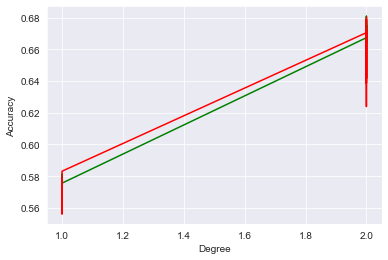

In [652]:
plt.plot(training['degree'],training['training_score'],color='green')
plt.plot(testing['degree'],testing['testing_score'],color='red')
plt.xlabel('Degree')
plt.ylabel('Accuracy')


In [653]:
training[training['index']<=9]

,index,training_score,degree
0,0,0.572756,1
1,1,0.581250,1
2,2,0.570939,1
3,3,0.578432,1
4,4,0.574666,1
5,5,0.569702,1
6,6,0.573467,1
7,7,0.578565,1
8,8,0.575347,1
9,9,0.575615,1


Text(0, 0.5, 'Test Score (R-Squared)')

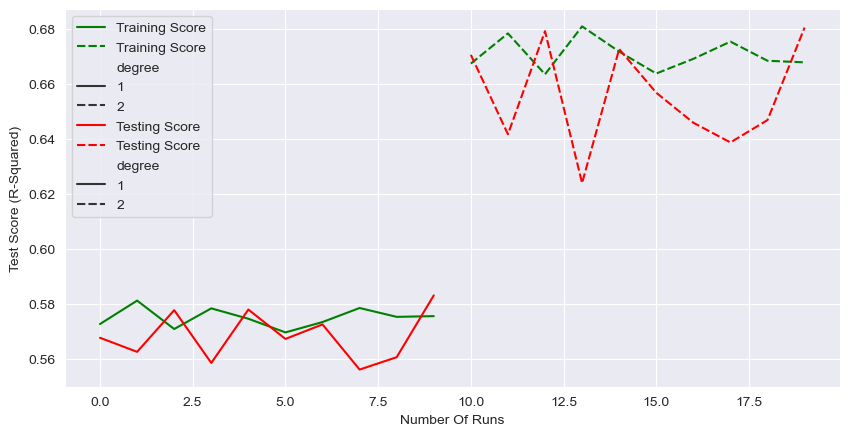

In [654]:
figure = plt.figure(figsize=(10,5),dpi=100)
sns.lineplot(x= training['index'],y= training['training_score'] ,color='green',data=training,style='degree',label='Training Score')
sns.lineplot(x=testing['index'],y= testing['testing_score'],color='red',data=testing,style='degree',label='Testing Score')
plt.xlabel('Number Of Runs')
plt.ylabel('Test Score (R-Squared)')


In [655]:
polynomial_reg_cv_pca = np.mean(testing_score)
print(polynomial_reg_cv_pca)


0.6120449420805625


In [656]:
print('The cross validated score of the best Polynomial Regressor model is: {}'.format(round(polynomial_reg_cv_pca,4)))

The cross validated score of the best Polynomial Regressor model is: 0.612


In [657]:
X_train  , X_test , y_train , y_test = train_test_split(X,y,random_state = 0) 

In [658]:
scaler = MinMaxScaler()

In [659]:
X_trn = scaler.fit_transform(X_train)
X_tst = scaler.transform(X_test)
        
X_train = pd.DataFrame(X_trn,columns=X_train.columns)
X_test = pd.DataFrame(X_tst,columns=X_test.columns)


In [660]:
pca = PCA(n_components=0.90,random_state=0)
X_train_reduced = pca.fit_transform(X_train)
X_test_reduced = pca.transform(X_test)

In [661]:
np.random.seed(0)
sample_train = np.random.randint(5404,16209,1500)
sample_test = np.random.randint(0,5404,1000)


In [662]:
X_train_reduced = pd.DataFrame(X_train_reduced)
X_test_reduced = pd.DataFrame(X_test_reduced)


In [663]:
X_train_sample_reduced = X_train_reduced.iloc[sample_train,:]
y_train_sample = y_train.iloc[sample_train]


In [664]:
X_test_sample_reduced = X_train_reduced.iloc[sample_test,:]
y_test_sample = y_test.iloc[sample_test]


# SVM Linear Kernel with PCA

In [665]:
svm_linear_kernel = SVR(kernel='linear')


In [666]:
grid_params = {'C':[0.001,0.01,0.1,1,10,100,1000]}

In [667]:
grid = GridSearchCV(svm_linear_kernel,grid_params,cv=kfold,verbose=5)

In [668]:
grid.fit(X_train_sample_reduced,y_train_sample)

Fitting 5 folds for each of 7 candidates, totalling 35 fits
[CV] C=0.001 .........................................................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


[CV] ............................ C=0.001, score=-0.067, total=   0.1s
[CV] C=0.001 .........................................................
[CV] ............................ C=0.001, score=-0.132, total=   0.1s
[CV] C=0.001 .........................................................
[CV] ............................ C=0.001, score=-0.073, total=   0.1s
[CV] C=0.001 .........................................................
[CV] ............................ C=0.001, score=-0.070, total=   0.1s
[CV] C=0.001 .........................................................
[CV] ............................ C=0.001, score=-0.010, total=   0.1s
[CV] C=0.01 ..........................................................
[CV] ............................. C=0.01, score=-0.067, total=   0.0s
[CV] C=0.01 ..........................................................
[CV] ............................. C=0.01, score=-0.132, total=   0.0s
[CV] C=0.01 ..........................................................


[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.2s remaining:    0.0s


[CV] ............................. C=0.01, score=-0.073, total=   0.1s
[CV] C=0.01 ..........................................................
[CV] ............................. C=0.01, score=-0.070, total=   0.0s
[CV] C=0.01 ..........................................................
[CV] ............................. C=0.01, score=-0.010, total=   0.0s
[CV] C=0.1 ...........................................................
[CV] .............................. C=0.1, score=-0.067, total=   0.0s
[CV] C=0.1 ...........................................................
[CV] .............................. C=0.1, score=-0.132, total=   0.0s
[CV] C=0.1 ...........................................................
[CV] .............................. C=0.1, score=-0.073, total=   0.0s
[CV] C=0.1 ...........................................................
[CV] .............................. C=0.1, score=-0.070, total=   0.0s
[CV] C=0.1 ...........................................................
[CV] .

[Parallel(n_jobs=1)]: Done  35 out of  35 | elapsed:    1.5s finished


GridSearchCV(cv=KFold(n_splits=5, random_state=0, shuffle=False),
             estimator=SVR(kernel='linear'),
             param_grid={'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000]}, verbose=5)

In [669]:
grid.best_params_

{'C': 1000}

In [670]:
grid.best_score_

0.06307925257964878

In [671]:
results_linearkernel_svm_pca = pd.DataFrame(grid.cv_results_)

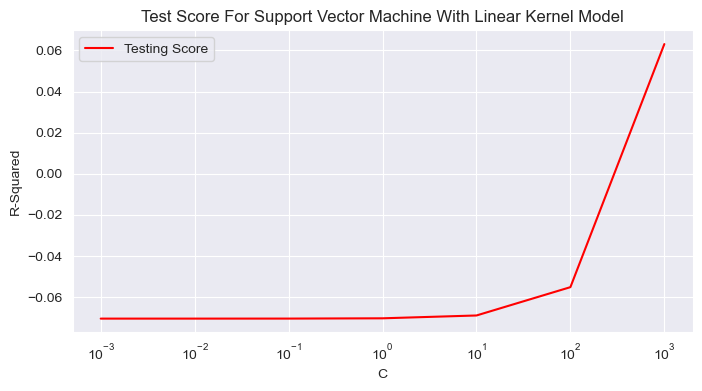

In [672]:
fig = plt.figure(figsize=(8,4),dpi=100)

plt.plot(results_linearkernel_svm_pca['param_C'],
         results_linearkernel_svm_pca['mean_test_score'],color='red',label ='Testing Score')
plt.xscale('log')
plt.xlabel('C')
plt.ylabel('R-Squared')
plt.title('Test Score For Support Vector Machine With Linear Kernel Model')
plt.legend()


In [673]:
svm_linear_kernel = SVR(kernel='linear',C=1000)
svm_linear_kernel.fit(X_train_sample_reduced,y_train_sample)


SVR(C=1000, kernel='linear')

In [674]:
svm_linearKernel_cross_val_score = cross_val_score(svm_linear_kernel,X_train_sample_reduced,y_train_sample,cv=kfold,verbose=5)

[CV]  ................................................................
[CV] .................................... , score=0.064, total=   0.0s
[CV]  ................................................................
[CV] .................................... , score=0.005, total=   0.0s
[CV]  ................................................................
[CV] .................................... , score=0.058, total=   0.0s
[CV]  ................................................................
[CV] .................................... , score=0.074, total=   0.0s
[CV]  ................................................................
[CV] .................................... , score=0.113, total=   0.0s


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s finished


In [675]:
mean_cross_val_svm_linearKernel_pca = svm_linearKernel_cross_val_score.mean()

In [676]:
print('The corss validated score for SVM with Linear kernel on reduced dataset is {}'.format(round(mean_cross_val_svm_linearKernel_pca,2)))

The corss validated score for SVM with Linear kernel on reduced dataset is 0.06


# SVM RBF Kernel With PCA

In [677]:
svm_rbf_kernel = SVR(kernel='rbf')

In [678]:
grid_params = {'gamma':[0.001,0.01,0.1,1,10,100,1000],'C':[0.001,0.01,0.1,1,10,100,1000]}

In [679]:
grid = GridSearchCV(svm_rbf_kernel,grid_params,cv=kfold,verbose=5)

In [680]:
grid.fit(X_train_sample_reduced,y_train_sample)

Fitting 5 folds for each of 49 candidates, totalling 245 fits
[CV] C=0.001, gamma=0.001 ............................................
[CV] ............... C=0.001, gamma=0.001, score=-0.067, total=   0.1s
[CV] C=0.001, gamma=0.001 ............................................
[CV] ............... C=0.001, gamma=0.001, score=-0.132, total=   0.1s
[CV] C=0.001, gamma=0.001 ............................................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s remaining:    0.0s


[CV] ............... C=0.001, gamma=0.001, score=-0.073, total=   0.1s
[CV] C=0.001, gamma=0.001 ............................................
[CV] ............... C=0.001, gamma=0.001, score=-0.070, total=   0.1s
[CV] C=0.001, gamma=0.001 ............................................
[CV] ............... C=0.001, gamma=0.001, score=-0.010, total=   0.1s
[CV] C=0.001, gamma=0.01 .............................................


[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.2s remaining:    0.0s


[CV] ................ C=0.001, gamma=0.01, score=-0.067, total=   0.1s
[CV] C=0.001, gamma=0.01 .............................................
[CV] ................ C=0.001, gamma=0.01, score=-0.132, total=   0.1s
[CV] C=0.001, gamma=0.01 .............................................
[CV] ................ C=0.001, gamma=0.01, score=-0.073, total=   0.1s
[CV] C=0.001, gamma=0.01 .............................................
[CV] ................ C=0.001, gamma=0.01, score=-0.070, total=   0.1s
[CV] C=0.001, gamma=0.01 .............................................
[CV] ................ C=0.001, gamma=0.01, score=-0.010, total=   0.1s
[CV] C=0.001, gamma=0.1 ..............................................
[CV] ................. C=0.001, gamma=0.1, score=-0.067, total=   0.1s
[CV] C=0.001, gamma=0.1 ..............................................
[CV] ................. C=0.001, gamma=0.1, score=-0.132, total=   0.1s
[CV] C=0.001, gamma=0.1 ..............................................
[CV] .

[CV] ................. C=0.01, gamma=1000, score=-0.067, total=   0.1s
[CV] C=0.01, gamma=1000 ..............................................
[CV] ................. C=0.01, gamma=1000, score=-0.132, total=   0.1s
[CV] C=0.01, gamma=1000 ..............................................
[CV] ................. C=0.01, gamma=1000, score=-0.073, total=   0.1s
[CV] C=0.01, gamma=1000 ..............................................
[CV] ................. C=0.01, gamma=1000, score=-0.070, total=   0.1s
[CV] C=0.01, gamma=1000 ..............................................
[CV] ................. C=0.01, gamma=1000, score=-0.010, total=   0.1s
[CV] C=0.1, gamma=0.001 ..............................................
[CV] ................. C=0.1, gamma=0.001, score=-0.067, total=   0.1s
[CV] C=0.1, gamma=0.001 ..............................................
[CV] ................. C=0.1, gamma=0.001, score=-0.132, total=   0.1s
[CV] C=0.1, gamma=0.001 ..............................................
[CV] .

[CV] ....................... C=1, gamma=1, score=-0.010, total=   0.1s
[CV] C=1, gamma=10 ...................................................
[CV] ...................... C=1, gamma=10, score=-0.067, total=   0.1s
[CV] C=1, gamma=10 ...................................................
[CV] ...................... C=1, gamma=10, score=-0.132, total=   0.1s
[CV] C=1, gamma=10 ...................................................
[CV] ...................... C=1, gamma=10, score=-0.073, total=   0.1s
[CV] C=1, gamma=10 ...................................................
[CV] ...................... C=1, gamma=10, score=-0.069, total=   0.1s
[CV] C=1, gamma=10 ...................................................
[CV] ...................... C=1, gamma=10, score=-0.010, total=   0.1s
[CV] C=1, gamma=100 ..................................................
[CV] ..................... C=1, gamma=100, score=-0.067, total=   0.1s
[CV] C=1, gamma=100 ..................................................
[CV] .

[CV] .................. C=100, gamma=0.01, score=-0.069, total=   0.1s
[CV] C=100, gamma=0.01 ...............................................
[CV] .................. C=100, gamma=0.01, score=-0.010, total=   0.1s
[CV] C=100, gamma=0.1 ................................................
[CV] ................... C=100, gamma=0.1, score=-0.065, total=   0.1s
[CV] C=100, gamma=0.1 ................................................
[CV] ................... C=100, gamma=0.1, score=-0.129, total=   0.1s
[CV] C=100, gamma=0.1 ................................................
[CV] ................... C=100, gamma=0.1, score=-0.070, total=   0.1s
[CV] C=100, gamma=0.1 ................................................
[CV] ................... C=100, gamma=0.1, score=-0.066, total=   0.1s
[CV] C=100, gamma=0.1 ................................................
[CV] ................... C=100, gamma=0.1, score=-0.008, total=   0.1s
[CV] C=100, gamma=1 ..................................................
[CV] .

[CV] ................. C=1000, gamma=1000, score=-0.071, total=   0.1s
[CV] C=1000, gamma=1000 ..............................................
[CV] ................. C=1000, gamma=1000, score=-0.068, total=   0.1s
[CV] C=1000, gamma=1000 ..............................................
[CV] ................. C=1000, gamma=1000, score=-0.009, total=   0.1s


[Parallel(n_jobs=1)]: Done 245 out of 245 | elapsed:   15.5s finished


GridSearchCV(cv=KFold(n_splits=5, random_state=0, shuffle=False),
             estimator=SVR(),
             param_grid={'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000],
                         'gamma': [0.001, 0.01, 0.1, 1, 10, 100, 1000]},
             verbose=5)

In [681]:
grid.best_params_

{'C': 1000, 'gamma': 1}

In [682]:
grid.best_score_

0.06597207475678812

In [683]:
results_RBFkernel_svm_pca = pd.DataFrame(grid.cv_results_)

Text(0.5, 1.0, 'Displaying The Test Score for the Range of cost function C And For Different Gama values')

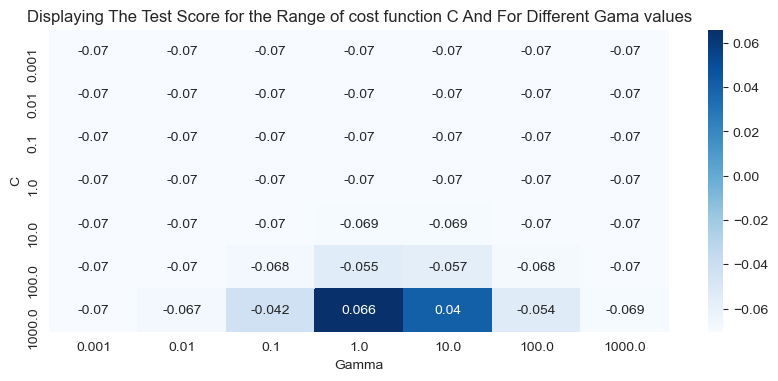

In [684]:
fig = plt.figure(figsize=(10,4),dpi=100)
sns.heatmap(results_RBFkernel_svm_pca.pivot_table(index='param_C',columns='param_gamma',values='mean_test_score'),cmap='Blues',annot=True)
plt.xlabel('Gamma')
plt.ylabel('C')
plt.title('Displaying The Test Score for the Range of cost function C And For Different Gama values')


Text(0.5, 1.0, 'Train Vs Test Accuracy For Linear Support Vector Machine Model')

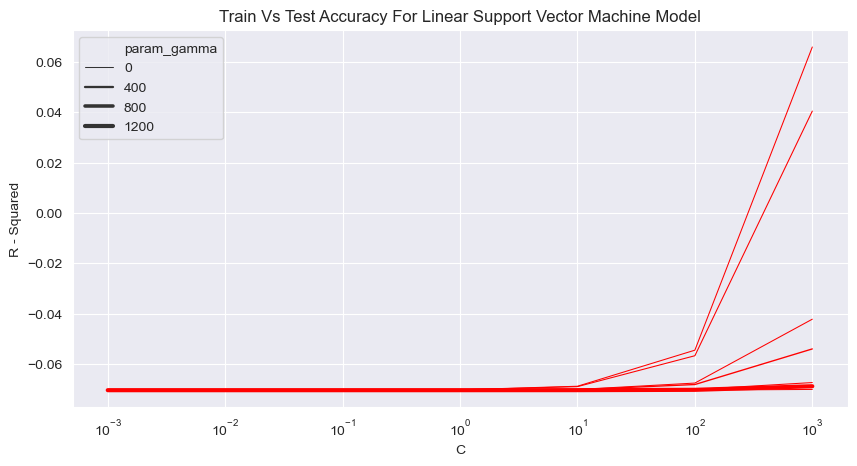

In [685]:
fig = plt.figure(figsize=(10,5),dpi=100)

sns.lineplot(x= results_RBFkernel_svm_pca['param_C'],y= results_RBFkernel_svm_pca['mean_test_score'],
size=results_RBFkernel_svm_pca['param_gamma'],color='red')

plt.xscale('log')
plt.xlabel('C')
plt.ylabel('R - Squared')
plt.title('Train Vs Test Accuracy For Linear Support Vector Machine Model')


In [686]:
svm_rbf_kernel = SVR(kernel='rbf',C=1000,gamma=1)

In [687]:
svm_rbf_kernel.fit(X_train_sample_reduced,y_train_sample)

SVR(C=1000, gamma=1)

In [688]:
svm_rbfKernel_cross_val_score = cross_val_score(svm_rbf_kernel,X_train_sample_reduced,y_train_sample,cv=kfold,verbose=5)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s


[CV]  ................................................................
[CV] .................................... , score=0.054, total=   0.1s
[CV]  ................................................................
[CV] .................................... , score=0.015, total=   0.1s
[CV]  ................................................................
[CV] .................................... , score=0.071, total=   0.1s
[CV]  ................................................................
[CV] .................................... , score=0.082, total=   0.1s
[CV]  ................................................................
[CV] .................................... , score=0.107, total=   0.1s


[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.2s finished


In [689]:
mean_cross_val_svm_rbf_kernel_pca = svm_rbfKernel_cross_val_score.mean()

In [690]:
print('The Final Accuracy Score That was Achived With Our Best SVM Model With RBF Kernel with the value of C being 1000 and that of gamma being 1 for the reduced dataset is : {})'.format(round(mean_cross_val_svm_rbf_kernel_pca,4)))

The Final Accuracy Score That was Achived With Our Best SVM Model With RBF Kernel with the value of C being 1000 and that of gamma being 1 for the reduced dataset is : 0.066)


# SVM Polynomial Kernel with PCA

In [691]:
svm_poly_kernal = SVR(kernel='poly')

In [692]:
grid_params = {'gamma':[0.01,0.1,1,10,100],'C':[0.01,0.1,1,10,100,1000],'degree':[1,2,3]}

In [693]:
kfold = KFold(n_splits=3,random_state=0)

C:\Users\behab\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:297: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


In [694]:
grid = GridSearchCV(svm_poly_kernal,grid_params,cv=kfold,verbose=5)

In [695]:
grid.fit(X_train_sample_reduced,y_train_sample)

Fitting 3 folds for each of 90 candidates, totalling 270 fits
[CV] C=0.01, degree=1, gamma=0.01 ....................................
[CV] ....... C=0.01, degree=1, gamma=0.01, score=-0.089, total=   0.0s

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.



[CV] C=0.01, degree=1, gamma=0.01 ....................................
[CV] ....... C=0.01, degree=1, gamma=0.01, score=-0.087, total=   0.0s
[CV] C=0.01, degree=1, gamma=0.01 ....................................
[CV] ....... C=0.01, degree=1, gamma=0.01, score=-0.024, total=   0.0s
[CV] C=0.01, degree=1, gamma=0.1 .....................................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s


[CV] ........ C=0.01, degree=1, gamma=0.1, score=-0.089, total=   0.0s
[CV] C=0.01, degree=1, gamma=0.1 .....................................
[CV] ........ C=0.01, degree=1, gamma=0.1, score=-0.087, total=   0.0s
[CV] C=0.01, degree=1, gamma=0.1 .....................................


[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s


[CV] ........ C=0.01, degree=1, gamma=0.1, score=-0.024, total=   0.0s
[CV] C=0.01, degree=1, gamma=1 .......................................
[CV] .......... C=0.01, degree=1, gamma=1, score=-0.089, total=   0.0s
[CV] C=0.01, degree=1, gamma=1 .......................................
[CV] .......... C=0.01, degree=1, gamma=1, score=-0.087, total=   0.0s
[CV] C=0.01, degree=1, gamma=1 .......................................
[CV] .......... C=0.01, degree=1, gamma=1, score=-0.024, total=   0.0s
[CV] C=0.01, degree=1, gamma=10 ......................................
[CV] ......... C=0.01, degree=1, gamma=10, score=-0.089, total=   0.0s
[CV] C=0.01, degree=1, gamma=10 ......................................
[CV] ......... C=0.01, degree=1, gamma=10, score=-0.087, total=   0.0s
[CV] C=0.01, degree=1, gamma=10 ......................................
[CV] ......... C=0.01, degree=1, gamma=10, score=-0.024, total=   0.0s
[CV] C=0.01, degree=1, gamma=100 .....................................
[CV] .

[CV] ......... C=0.1, degree=2, gamma=0.1, score=-0.024, total=   0.0s
[CV] C=0.1, degree=2, gamma=1 ........................................
[CV] ........... C=0.1, degree=2, gamma=1, score=-0.089, total=   0.0s
[CV] C=0.1, degree=2, gamma=1 ........................................
[CV] ........... C=0.1, degree=2, gamma=1, score=-0.087, total=   0.0s
[CV] C=0.1, degree=2, gamma=1 ........................................
[CV] ........... C=0.1, degree=2, gamma=1, score=-0.024, total=   0.0s
[CV] C=0.1, degree=2, gamma=10 .......................................
[CV] .......... C=0.1, degree=2, gamma=10, score=-0.089, total=   0.0s
[CV] C=0.1, degree=2, gamma=10 .......................................
[CV] .......... C=0.1, degree=2, gamma=10, score=-0.087, total=   0.0s
[CV] C=0.1, degree=2, gamma=10 .......................................
[CV] .......... C=0.1, degree=2, gamma=10, score=-0.024, total=   0.0s
[CV] C=0.1, degree=2, gamma=100 ......................................
[CV] .

[CV] ........... C=1, degree=3, gamma=0.1, score=-0.087, total=   0.0s
[CV] C=1, degree=3, gamma=0.1 ........................................
[CV] ........... C=1, degree=3, gamma=0.1, score=-0.024, total=   0.0s
[CV] C=1, degree=3, gamma=1 ..........................................
[CV] ............. C=1, degree=3, gamma=1, score=-0.089, total=   0.0s
[CV] C=1, degree=3, gamma=1 ..........................................
[CV] ............. C=1, degree=3, gamma=1, score=-0.087, total=   0.0s
[CV] C=1, degree=3, gamma=1 ..........................................
[CV] ............. C=1, degree=3, gamma=1, score=-0.024, total=   0.0s
[CV] C=1, degree=3, gamma=10 .........................................
[CV] ............ C=1, degree=3, gamma=10, score=-0.069, total=   0.0s
[CV] C=1, degree=3, gamma=10 .........................................
[CV] ............ C=1, degree=3, gamma=10, score=-0.069, total=   0.0s
[CV] C=1, degree=3, gamma=10 .........................................
[CV] .

[CV] ......... C=100, degree=1, gamma=0.1, score=-0.086, total=   0.0s
[CV] C=100, degree=1, gamma=0.1 ......................................
[CV] ......... C=100, degree=1, gamma=0.1, score=-0.023, total=   0.0s
[CV] C=100, degree=1, gamma=1 ........................................
[CV] ........... C=100, degree=1, gamma=1, score=-0.077, total=   0.0s
[CV] C=100, degree=1, gamma=1 ........................................
[CV] ........... C=100, degree=1, gamma=1, score=-0.073, total=   0.0s
[CV] C=100, degree=1, gamma=1 ........................................
[CV] ........... C=100, degree=1, gamma=1, score=-0.013, total=   0.0s
[CV] C=100, degree=1, gamma=10 .......................................
[CV] ........... C=100, degree=1, gamma=10, score=0.026, total=   0.0s
[CV] C=100, degree=1, gamma=10 .......................................
[CV] ........... C=100, degree=1, gamma=10, score=0.022, total=   0.0s
[CV] C=100, degree=1, gamma=10 .......................................
[CV] .

[CV] ........ C=1000, degree=2, gamma=0.1, score=-0.089, total=   0.0s
[CV] C=1000, degree=2, gamma=0.1 .....................................
[CV] ........ C=1000, degree=2, gamma=0.1, score=-0.087, total=   0.0s
[CV] C=1000, degree=2, gamma=0.1 .....................................
[CV] ........ C=1000, degree=2, gamma=0.1, score=-0.024, total=   0.0s
[CV] C=1000, degree=2, gamma=1 .......................................
[CV] .......... C=1000, degree=2, gamma=1, score=-0.077, total=   0.0s
[CV] C=1000, degree=2, gamma=1 .......................................
[CV] .......... C=1000, degree=2, gamma=1, score=-0.074, total=   0.0s
[CV] C=1000, degree=2, gamma=1 .......................................
[CV] .......... C=1000, degree=2, gamma=1, score=-0.005, total=   0.0s
[CV] C=1000, degree=2, gamma=10 ......................................
[CV] .......... C=1000, degree=2, gamma=10, score=0.257, total=   0.0s
[CV] C=1000, degree=2, gamma=10 ......................................
[CV] .

[Parallel(n_jobs=1)]: Done 270 out of 270 | elapsed:   54.8s finished


GridSearchCV(cv=KFold(n_splits=3, random_state=0, shuffle=False),
             estimator=SVR(kernel='poly'),
             param_grid={'C': [0.01, 0.1, 1, 10, 100, 1000],
                         'degree': [1, 2, 3],
                         'gamma': [0.01, 0.1, 1, 10, 100]},
             verbose=5)

In [696]:
grid.best_params_

{'C': 1000, 'degree': 1, 'gamma': 100}

In [697]:
grid.best_score_

0.5428007132034981

In [698]:
results_Polynomialkernel_svm_pca = pd.DataFrame(grid.cv_results_)

Text(0.5, 1.0, 'Gamma Vs Test Accuracy with respect to different polynomial degree')

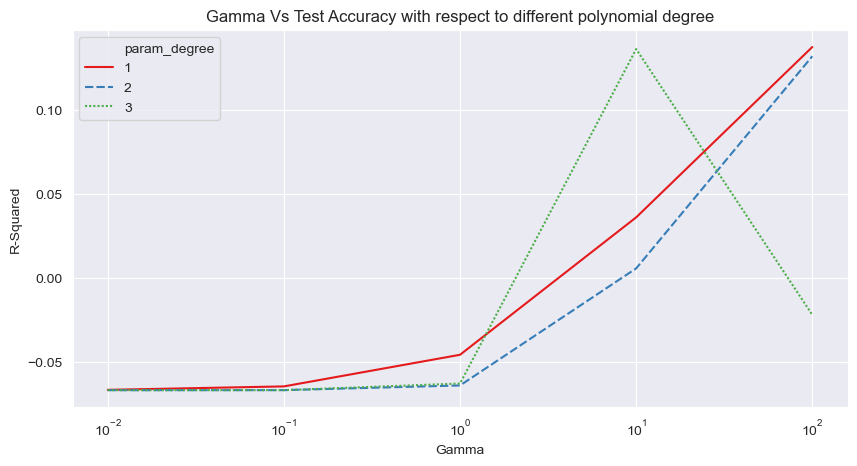

In [699]:
fig = plt.figure(figsize=(10,5),dpi=100)
sns.lineplot(results_Polynomialkernel_svm_pca['param_gamma'],results_Polynomialkernel_svm_pca['mean_test_score'],
             style=results_Polynomialkernel_svm_pca['param_degree'],
             hue=results_Polynomialkernel_svm_pca['param_degree'],ci=None,palette='Set1')

plt.xscale('log')
plt.xlabel('Gamma')
plt.ylabel('R-Squared')
plt.title('Gamma Vs Test Accuracy with respect to different polynomial degree')


Text(0.5, 1.0, 'HeatMap Of Mean Test Score With respect To C and Gamma parameters')

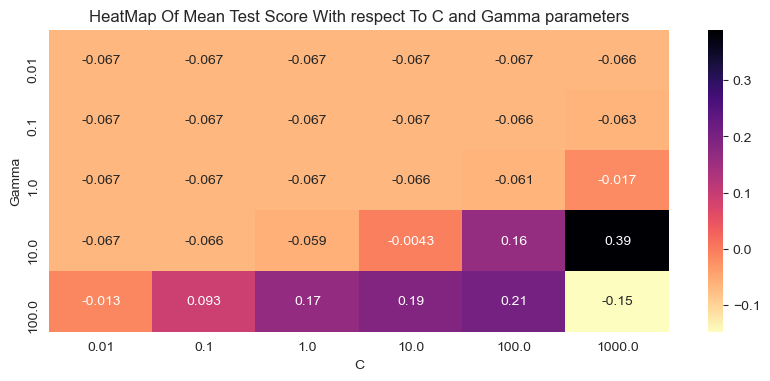

In [700]:
fig = plt.figure(figsize=(10,4),dpi=100)
sns.heatmap(results_Polynomialkernel_svm_pca.pivot_table(index='param_gamma',columns='param_C',values='mean_test_score'),annot=True,cmap='magma_r')
plt.ylabel('Gamma')
plt.xlabel('C')
plt.title('HeatMap Of Mean Test Score With respect To C and Gamma parameters')


In [701]:
svm_poly_kernal = SVR(kernel='poly',C=1000,degree=3,gamma=10)

In [702]:
svm_poly_kernal.fit(X_train_sample_reduced,y_train_sample)

SVR(C=1000, gamma=10, kernel='poly')

In [703]:
kfold = KFold(n_splits=10,random_state=0)

C:\Users\behab\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:297: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


In [704]:
svm_poly_kernal_cross_val_score = cross_val_score(svm_poly_kernal,X_train_sample_reduced,y_train_sample,cv=kfold,verbose=5)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


[CV]  ................................................................
[CV] .................................... , score=0.575, total=   0.1s
[CV]  ................................................................
[CV] .................................... , score=0.444, total=   0.1s
[CV]  ................................................................
[CV] .................................... , score=0.457, total=   0.1s
[CV]  ................................................................
[CV] .................................... , score=0.517, total=   0.1s
[CV]  ................................................................
[CV] .................................... , score=0.394, total=   0.1s
[CV]  ................................................................
[CV] .................................... , score=0.541, total=   0.1s
[CV]  ................................................................


[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.2s remaining:    0.0s


[CV] .................................... , score=0.393, total=   0.1s
[CV]  ................................................................
[CV] .................................... , score=0.551, total=   0.1s
[CV]  ................................................................
[CV] .................................... , score=0.583, total=   0.1s
[CV]  ................................................................
[CV] .................................... , score=0.507, total=   0.1s


[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.5s finished


In [705]:
mean_cross_val_svm_poly_kernal_pca = svm_poly_kernal_cross_val_score.mean()

In [706]:
print('The Final Accuracy Score That was Achived With Our Best SVM Model With Polynomial Kernel with the value of C being 1000 and that of gamma being 10 and degree of 3 is : {} '.format(round(mean_cross_val_svm_poly_kernal_pca,4)))

The Final Accuracy Score That was Achived With Our Best SVM Model With Polynomial Kernel with the value of C being 1000 and that of gamma being 10 and degree of 3 is : 0.4962 


# Comparing The Results OF the Models With PCA and Models Without PCA

In [707]:
evaluation_PCA = {'Models':['KNN Regressor PCA','Linear Regression PCA','Ridge Regression PCA','Lasso Regression PCA',
                       'Decision Tree Regressor PCA','Random Forest Regressor PCA','Polynomial Regression PCA','Linear SVM PCA',
                       'SVM Linear Kernel Regressor PCA','SVM RBF Kernel Regressor PCA','SVM Polynomial Kernel Regressor PCA'],
             'Test Scores':[knn_mean_score_cv_pca,lm_mean_score_cv_pca,ridge_mean_score_cv_pca,lasso_mean_score_cv_pca,tree_mean_score_cv_pca,
                           rf_mean_score_cv_pca,polynomial_reg_cv_pca,mean_cross_val_linear_svm_pca,mean_cross_val_svm_linearKernel_pca,
                           mean_cross_val_svm_rbf_kernel_pca,mean_cross_val_svm_poly_kernal_pca]}

In [708]:
eva_pca = pd.DataFrame(evaluation_PCA)

In [709]:
eva_pca = eva_pca.sort_values(by='Test Scores',ascending = False)

# Results For Models With PCA

Text(0.5, 0, 'Test Scores(R-Squared)')

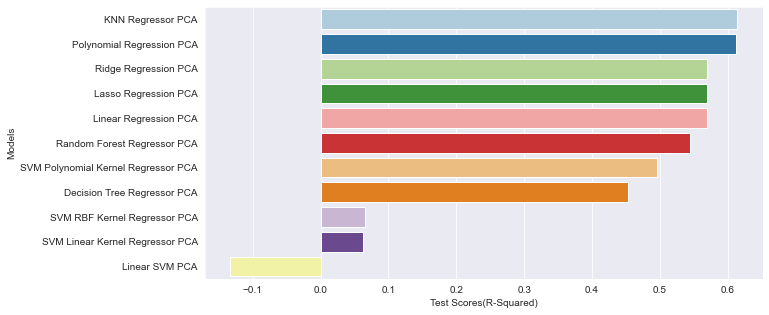

In [710]:
fig = plt.figure(figsize=(10,5))
sns.barplot(x=eva_pca['Test Scores'],y=eva_pca['Models'],orient='h',palette='Paired')
plt.ylabel('Models')
plt.xlabel('Test Scores(R-Squared)')


In [747]:
evaluation = {'Models':['KNN Regressor','Linear Regression','Ridge Regression','Lasso Regression',
                       'Decision Tree Regressor','Random Forest Regressor','Polynomial Regression','Linear SVM',
                       'SVM Linear Kernel Regressor','SVM RBF Kernel Regressor','SVM Polynomial Kernel Regressor',
                       'Bagging KNN','Bagging Linear Model','Pasting Ridge','Pasting Tree','AdaBoost Lasso',
                       'AdaBoost Linear Regression','Gradient Descent'],
             'Test Scores':[knn_mean_score_cv,lm_mean_score_cv,ridge_mean_score_cv,lasso_mean_score_cv,tree_mean_score_cv,
                           rf_mean_score_cv,polynomial_reg_cv,mean_cross_val_linear_svm,mean_cross_val_svm_linearKernel,
                           mean_cross_val_svm_rbf_kernel,mean_cross_val_svm_poly_kernal,baggaing_knn_score,baggaing_lm_score,
                           pasting_ridge_score,pasting_tree_score,ada_lasso_score,ada_linerreg_score,gb_score]}

In [748]:
eva = pd.DataFrame(evaluation)

In [749]:
eva = eva.sort_values(by='Test Scores',ascending = False)

# Results For Models Without PCA

Text(0.5, 0, 'Test Scores(R-Squared)')

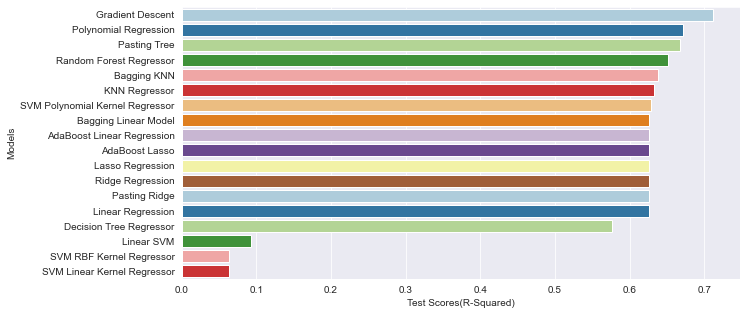

In [750]:
fig = plt.figure(figsize=(10,5))
sns.barplot(x=eva['Test Scores'],y=eva['Models'],orient='h',palette='Paired')
plt.ylabel('Models')
plt.xlabel('Test Scores(R-Squared)')

In [751]:
fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 10
fig_size[1] = 8
plt.rcParams["figure.figsize"] = fig_size

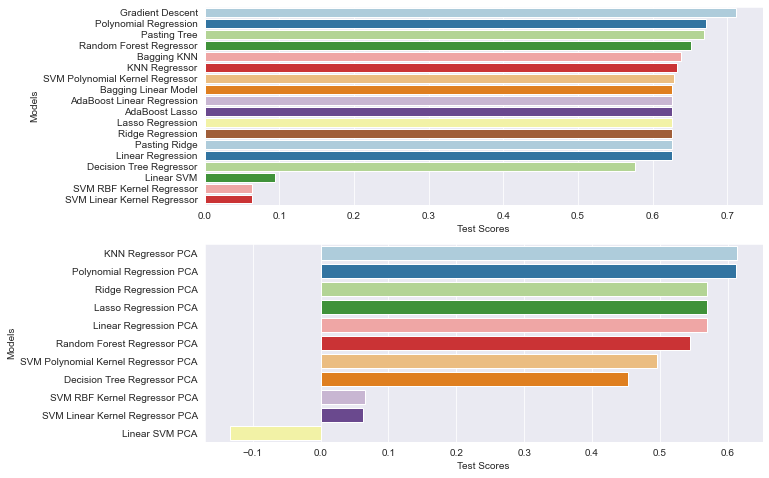

<Figure size 720x360 with 0 Axes>

In [752]:
fig, ax =plt.subplots(2,1)
plt.figure(figsize=(10,5))

sns.barplot(x=eva['Test Scores'],y=eva['Models'],orient='h',palette='Paired',ax=ax[0])

sns.barplot(x=eva_pca['Test Scores'],y=eva_pca['Models'],orient='h',palette='Paired',ax=ax[1])

As the Linear SVM PCA is performing very poorly we would like to remove it so that we have a common axis to compare the non pca to pca models

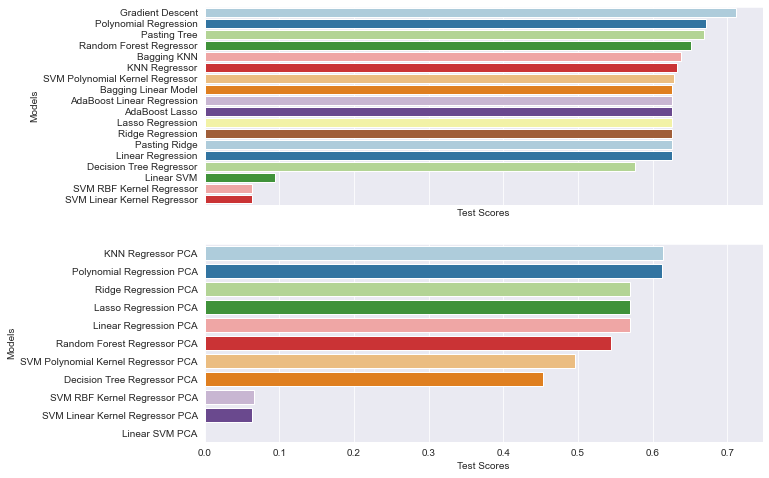

<Figure size 1000x1000 with 0 Axes>

In [755]:
fig, ax =plt.subplots(2,1,sharex=True)
plt.figure(figsize=(10,10),dpi=100)
sns.barplot(x=eva['Test Scores'],y=eva['Models'],orient='h',palette='Paired',ax=ax[0])
sns.barplot(x=eva_pca['Test Scores'][:-1],y=eva_pca['Models'],orient='h',palette='Paired',ax=ax[1])


As we can see that after implementing the PCA algorithm we could reduce the attributes form 15 to 7 that is more than 50% reduction in the number of variables while keeping upto 90% of the variance intact.
The PCA algorithm works very well we can see that even after reducing the number of attributes the models with PCA algorithm do pretty well, the accuracy they provide are less when compared to the models that were run on the full data. But the closeness in accuracy and the reduction in computation resource and the time to train the data makes PCA a viable option.

# Deep Learning Model

In [715]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Dropout

C:\Users\behab\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
C:\Users\behab\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
C:\Users\behab\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
C:\Users\behab\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:519: FutureWarning: Passi

In [716]:
X_train.shape

(16209, 15)

In [717]:

def create_model():    
    model = Sequential()

    model.add(Dense(15,activation='relu'))
    

    model.add(Dense(7,activation='relu'))
    

    model.add(Dense(3,activation='relu'))
    

    model.add(Dense(1))
    
    model.compile(optimizer = 'adam',loss='mse')
    return model



In [718]:
seed = 10
np.random.seed(10)

In [719]:
from tensorflow.keras.wrappers.scikit_learn import KerasRegressor

In [720]:
kfold = KFold(n_splits=5,random_state=0)

C:\Users\behab\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:297: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


In [721]:
model = KerasRegressor(build_fn= create_model,verbose=0)
param_grid = {'batch_size':[32,64,128,256],'epochs':[100,250,500]}
grid_search = GridSearchCV(estimator=model,param_grid=param_grid,cv=kfold,verbose=3,n_jobs=-1)

In [722]:
grid_search.fit(X_train.values,y_train.values)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


Fitting 5 folds for each of 12 candidates, totalling 60 fits


[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:  8.1min


Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor


[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed: 16.4min finished


GridSearchCV(cv=KFold(n_splits=5, random_state=0, shuffle=False),
             estimator=<tensorflow.python.keras.wrappers.scikit_learn.KerasRegressor object at 0x0000017FAEED9CC0>,
             n_jobs=-1,
             param_grid={'batch_size': [32, 64, 128, 256],
                         'epochs': [100, 250, 500]},
             verbose=3)

In [723]:
grid_search.best_params_

{'batch_size': 128, 'epochs': 500}

In [724]:
grid_search.best_score_

-49147472556.73611

In [725]:
dnn_results = pd.DataFrame(grid_search.cv_results_)

In [726]:
dnn_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_batch_size,param_epochs,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,85.651386,0.309602,0.203655,0.015118,32,100,"{'batch_size': 32, 'epochs': 100}",-6.639710e+10,-3.867465e+11,-4.657257e+11,-4.160463e+11,-4.978986e+10,-2.769411e+11,1.805401e+11,12
1,220.219871,2.190051,0.349664,0.050495,32,250,"{'batch_size': 32, 'epochs': 250}",-5.623692e+10,-4.631242e+10,-5.644526e+10,-4.257971e+10,-4.551348e+10,-4.941756e+10,5.788476e+09,2
2,448.007845,2.691757,0.339092,0.071187,32,500,"{'batch_size': 32, 'epochs': 500}",-5.379674e+10,-3.865752e+11,-5.242986e+10,-4.158725e+11,-4.298808e+10,-1.903325e+11,1.724813e+11,10
3,47.543368,0.892554,0.375595,0.086887,64,100,"{'batch_size': 64, 'epochs': 100}",-4.654548e+11,-5.222554e+10,-4.657479e+11,-5.342201e+10,-5.313254e+10,-2.179966e+11,2.021689e+11,11
4,123.486020,6.403342,0.523399,0.064531,64,250,"{'batch_size': 64, 'epochs': 250}",-6.204310e+10,-4.916703e+10,-6.087639e+10,-4.410376e+10,-4.868443e+10,-5.297494e+10,7.159204e+09,3


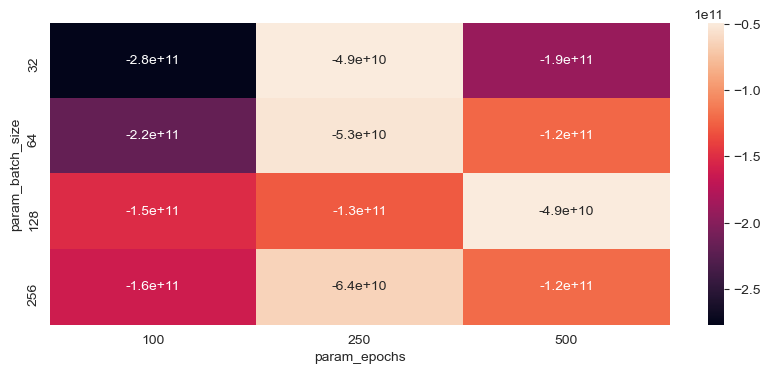

In [727]:
fig = plt.figure(figsize=(10,4),dpi=100)
sns.heatmap(dnn_results.pivot_table(index='param_batch_size',columns='param_epochs',values='mean_test_score'),annot=True)

In [728]:
model = Sequential()

model.add(Dense(15,activation='relu'))
    

model.add(Dense(7,activation='relu'))
    

model.add(Dense(3,activation='relu'))
    

model.add(Dense(1))
    
model.compile(optimizer = 'adam',loss='mse')

In [734]:
model.fit(X_train.values,y_train.values,epochs=500,batch_size=128,validation_data=(X_test.values,y_test.values))

Train on 16209 samples, validate on 5404 samples
Epoch 1/500
16209/16209 [==============================] - 0s 13us/sample - loss: 43508584886.6857 - val_loss: 42864714061.5011
Epoch 2/500
16209/16209 [==============================] - 0s 16us/sample - loss: 43505767532.5974 - val_loss: 42870255224.8941
Epoch 3/500
16209/16209 [==============================] - 0s 14us/sample - loss: 43504843581.2322 - val_loss: 42858927652.0030
Epoch 4/500
16209/16209 [==============================] - 0s 15us/sample - loss: 43501305909.0668 - val_loss: 42860992662.0755
Epoch 5/500
16209/16209 [==============================] - 0s 16us/sample - loss: 43500969580.6922 - val_loss: 42857244303.6329
Epoch 6/500
16209/16209 [==============================] - 0s 16us/sample - loss: 43497713939.6947 - val_loss: 42856902116.3346
Epoch 7/500
16209/16209 [==============================] - 0s 16us/sample - loss: 43499459333.5120 - val_loss: 42869732675.6477
Epoch 8/500
16209/16209 [==============================

Epoch 64/500
16209/16209 [==============================] - 0s 20us/sample - loss: 43287095535.4324 - val_loss: 42682762292.2990
Epoch 65/500
16209/16209 [==============================] - 0s 23us/sample - loss: 43284494202.7012 - val_loss: 42680742636.8616
Epoch 66/500
16209/16209 [==============================] - 0s 20us/sample - loss: 43279689310.2884 - val_loss: 42681946078.6499
Epoch 67/500
16209/16209 [==============================] - 0s 19us/sample - loss: 43278095013.9917 - val_loss: 42674570155.1088
Epoch 68/500
16209/16209 [==============================] - 0s 22us/sample - loss: 43280509395.6197 - val_loss: 42670073860.5477
Epoch 69/500
16209/16209 [==============================] - 0s 20us/sample - loss: 43268014367.0662 - val_loss: 42661432287.4078
Epoch 70/500
16209/16209 [==============================] - 0s 26us/sample - loss: 43268580875.7821 - val_loss: 42649602252.6484
Epoch 71/500
16209/16209 [==============================] - 0s 29us/sample - loss: 43265020596.90

16209/16209 [==============================] - 0s 19us/sample - loss: 43091811551.1965 - val_loss: 42454589644.6484
Epoch 128/500
16209/16209 [==============================] - 0s 20us/sample - loss: 43085513924.0313 - val_loss: 42454697973.3886
Epoch 129/500
16209/16209 [==============================] - 0s 20us/sample - loss: 43088159962.9006 - val_loss: 42447617179.3812
Epoch 130/500
16209/16209 [==============================] - 0s 20us/sample - loss: 43082775339.2905 - val_loss: 42450630925.8327
Epoch 131/500
16209/16209 [==============================] - 0s 17us/sample - loss: 43077513672.2483 - val_loss: 42439122343.6980
Epoch 132/500
16209/16209 [==============================] - 0s 19us/sample - loss: 43078579034.1662 - val_loss: 42442192097.1133
Epoch 133/500
16209/16209 [==============================] - 0s 18us/sample - loss: 43074955251.2387 - val_loss: 42429969426.9489
Epoch 134/500
16209/16209 [==============================] - 0s 17us/sample - loss: 43071265684.6661 - v

16209/16209 [==============================] - 0s 20us/sample - loss: 42932360817.1144 - val_loss: 42270376452.9267
Epoch 191/500
16209/16209 [==============================] - 0s 24us/sample - loss: 42936717088.3613 - val_loss: 42264396109.5011
Epoch 192/500
16209/16209 [==============================] - 0s 30us/sample - loss: 42930947114.3903 - val_loss: 42265837349.7084
Epoch 193/500
16209/16209 [==============================] - 0s 22us/sample - loss: 42930794780.1602 - val_loss: 42260086104.8705
Epoch 194/500
16209/16209 [==============================] - 0s 21us/sample - loss: 42927838299.4139 - val_loss: 42267930561.8475
Epoch 195/500
16209/16209 [==============================] - 0s 22us/sample - loss: 42925430755.0660 - val_loss: 42269417561.4389
Epoch 196/500
16209/16209 [==============================] - 0s 20us/sample - loss: 42937478936.9067 - val_loss: 42267417946.3864
Epoch 197/500
16209/16209 [==============================] - 0s 23us/sample - loss: 42917772091.7160 - v

16209/16209 [==============================] - 0s 24us/sample - loss: 42797173029.0046 - val_loss: 42130877042.0725
Epoch 254/500
16209/16209 [==============================] - 0s 19us/sample - loss: 42787238442.1692 - val_loss: 42139793984.0474
Epoch 255/500
16209/16209 [==============================] - 0s 19us/sample - loss: 42789204792.5572 - val_loss: 42126245183.0999
Epoch 256/500
16209/16209 [==============================] - 0s 20us/sample - loss: 42782761633.3168 - val_loss: 42136118196.9622
Epoch 257/500
16209/16209 [==============================] - 0s 19us/sample - loss: 42779183872.3317 - val_loss: 42137445228.1984
Epoch 258/500
16209/16209 [==============================] - 0s 19us/sample - loss: 42780201900.5461 - val_loss: 42126371896.8468
Epoch 259/500
16209/16209 [==============================] - 0s 17us/sample - loss: 42776982734.1393 - val_loss: 42128268184.1599
Epoch 260/500
16209/16209 [==============================] - 0s 20us/sample - loss: 42777081123.2989 - v

16209/16209 [==============================] - 0s 18us/sample - loss: 42662508381.8935 - val_loss: 41963467297.7291
Epoch 317/500
16209/16209 [==============================] - 0s 22us/sample - loss: 42656308843.6814 - val_loss: 41951020147.9674
Epoch 318/500
16209/16209 [==============================] - 0s 18us/sample - loss: 42654729205.3235 - val_loss: 41952647851.6773
Epoch 319/500
16209/16209 [==============================] - 0s 20us/sample - loss: 42651921629.9330 - val_loss: 41960267982.1643
Epoch 320/500
16209/16209 [==============================] - 0s 28us/sample - loss: 42659052168.5523 - val_loss: 41954151712.7816
Epoch 321/500
16209/16209 [==============================] - 0s 20us/sample - loss: 42652085994.7891 - val_loss: 41953179792.0118
Epoch 322/500
16209/16209 [==============================] - 0s 21us/sample - loss: 42648449320.9215 - val_loss: 41956401655.2835
Epoch 323/500
16209/16209 [==============================] - 0s 23us/sample - loss: 42646465246.4700 - v

16209/16209 [==============================] - 0s 21us/sample - loss: 42548026780.5945 - val_loss: 41838931576.8941
Epoch 380/500
16209/16209 [==============================] - 0s 19us/sample - loss: 42548021238.5238 - val_loss: 41843305709.2406
Epoch 381/500
16209/16209 [==============================] - 0s 18us/sample - loss: 42548776403.4302 - val_loss: 41835342777.5100
Epoch 382/500
16209/16209 [==============================] - 0s 25us/sample - loss: 42544905346.9613 - val_loss: 41835767491.1739
Epoch 383/500
16209/16209 [==============================] - 0s 19us/sample - loss: 42545618859.3458 - val_loss: 41830434058.0429
Epoch 384/500
16209/16209 [==============================] - 0s 18us/sample - loss: 42541676050.8577 - val_loss: 41830059501.4301
Epoch 385/500
16209/16209 [==============================] - 0s 17us/sample - loss: 42540642448.7966 - val_loss: 41825827340.5063
Epoch 386/500
16209/16209 [==============================] - 0s 23us/sample - loss: 42537855486.3259 - v

16209/16209 [==============================] - 1s 34us/sample - loss: 42444275779.9761 - val_loss: 41747533695.9053
Epoch 443/500
16209/16209 [==============================] - 0s 19us/sample - loss: 42452482120.3983 - val_loss: 41721630357.6965
Epoch 444/500
16209/16209 [==============================] - 0s 18us/sample - loss: 42442784757.8920 - val_loss: 41734371100.6129
Epoch 445/500
16209/16209 [==============================] - 0s 20us/sample - loss: 42445680304.6683 - val_loss: 41726049746.1436
Epoch 446/500
16209/16209 [==============================] - 0s 23us/sample - loss: 42440093662.5174 - val_loss: 41725924101.1162
Epoch 447/500
16209/16209 [==============================] - 0s 19us/sample - loss: 42440487937.7057 - val_loss: 41740025343.6210
Epoch 448/500
16209/16209 [==============================] - 0s 17us/sample - loss: 42432432744.4595 - val_loss: 41733970353.5514
Epoch 449/500
16209/16209 [==============================] - 0s 21us/sample - loss: 42431006189.2055 - v

In [735]:
output = pd.DataFrame(model.history.history)

Text(0.5, 0, 'Index')

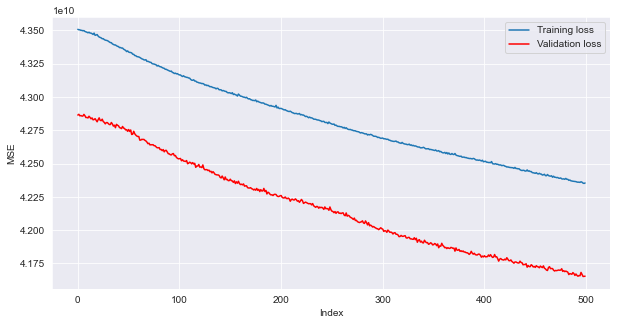

In [736]:
fig = plt.figure(figsize=(10,5))
sns.lineplot(x= output.index,y=output['loss'],label='Training loss')
sns.lineplot(x= output.index,y=output['val_loss'],label='Validation loss',color='red')
plt.ylabel('MSE')
plt.xlabel('Index')

In [737]:
X_train.head()

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,sqft_living15,sqft_lot15
0,0.090909,0.12500,0.050566,0.024488,0.0,0.0,0.0,1.00,0.500000,0.080918,0.013603,0.391304,0.0,0.161268,0.008121
1,0.272727,0.21875,0.092075,0.005573,0.0,0.0,0.0,0.50,0.500000,0.147343,0.000000,0.417391,1.0,0.196288,0.010946
2,0.272727,0.28125,0.104151,0.003570,0.0,0.0,0.0,0.75,0.583333,0.190723,0.000000,0.530435,0.0,0.291780,0.007445
3,0.272727,0.25000,0.194351,0.116049,0.0,0.0,0.0,0.75,0.666667,0.286232,0.000000,0.556522,0.0,0.380144,0.050042
4,0.272727,0.12500,0.105660,0.007863,0.0,0.0,0.0,0.75,0.500000,0.169082,0.000000,0.678261,0.0,0.271581,0.011486


In [738]:
print('The Prediction Accuracy for the Deep Neural Network on the testing dataset is {}'.format(round(metrics.r2_score(y_test,model.predict(X_test)),2)))

The Prediction Accuracy for the Deep Neural Network on the testing dataset is 0.69


In [740]:
dnn_accuracy = metrics.r2_score(y_test,model.predict(X_test))

In [741]:
dnn_accuracy

0.6864354280503161

# Comparing All the Models That Have been Created

In [760]:
evaluation = {'Models':['KNN Regressor','Linear Regression','Ridge Regression','Lasso Regression',
                       'Decision Tree Regressor','Random Forest Regressor','Polynomial Regression','Linear SVM',
                       'SVM Linear Kernel Regressor','SVM RBF Kernel Regressor','SVM Polynomial Kernel Regressor',
                       'Bagging KNN','Bagging Linear Model','Pasting Ridge','Pasting Tree','AdaBoost Lasso',
                       'AdaBoost Linear Regression','Gradient Descent','Deep Neural Network'],
             'Test Scores':[knn_mean_score_cv,lm_mean_score_cv,ridge_mean_score_cv,lasso_mean_score_cv,tree_mean_score_cv,
                           rf_mean_score_cv,polynomial_reg_cv,mean_cross_val_linear_svm,mean_cross_val_svm_linearKernel,
                           mean_cross_val_svm_rbf_kernel,mean_cross_val_svm_poly_kernal,baggaing_knn_score,baggaing_lm_score,
                           pasting_ridge_score,pasting_tree_score,ada_lasso_score,ada_linerreg_score,gb_score,dnn_accuracy]}

In [761]:
eva = pd.DataFrame(evaluation)

In [762]:
eva = eva.sort_values(by='Test Scores',ascending = False)

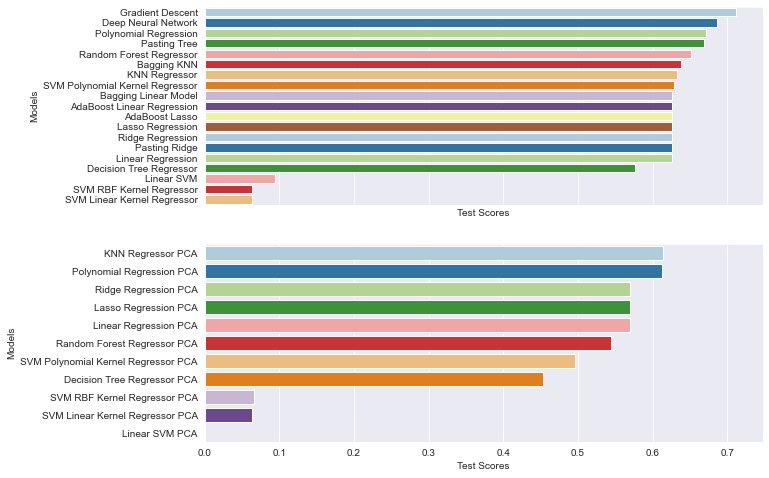

<Figure size 1000x1000 with 0 Axes>

In [763]:
fig, ax =plt.subplots(2,1,sharex=True)
plt.figure(figsize=(10,10),dpi=100)
sns.barplot(x=eva['Test Scores'],y=eva['Models'],orient='h',palette='Paired',ax=ax[0])
sns.barplot(x=eva_pca['Test Scores'][:-1],y=eva_pca['Models'],orient='h',palette='Paired',ax=ax[1])


The plot Above makes it very clear that the Gradient Descent Algorithm On trees actually provides us with the best score or the best R squared which is about 0.71

Hence we would like to make us of the Gradient Descent Algorithm to make the predictions for the test data

# Prediction

In [764]:
gbrt = GradientBoostingRegressor(learning_rate=0.2,max_depth=4,n_estimators=100,random_state=0)

In [765]:
gbrt.fit(X_train,y_train)

GradientBoostingRegressor(learning_rate=0.2, max_depth=4, random_state=0)

In [811]:
prediction = gbrt.predict(X_test)

## Predictions For the Test Set

In [770]:
print(list(gbrt.predict(X_test)))

[391694.4628908604, 1450567.793271134, 505127.8354101141, 653901.081125591, 696532.2963082253, 385273.77122629643, 372215.6004149924, 448499.21246950934, 586238.2294266961, 1948082.5303039704, 724583.6543836907, 395456.9346012529, 378270.22699316393, 410147.829426596, 751184.0918978811, 376883.6199281304, 415657.6911124771, 683889.2933568554, 191015.17416581605, 414636.1757956521, 303125.0231792115, 406968.0339042072, 516944.31063832174, 278949.8343654908, 525414.1925881532, 401295.0233934811, 352231.70753210934, 398700.3066344121, 868609.0404709959, 483896.5498061563, 850679.4473091619, 384832.7538296443, 525309.2537049463, 780376.2544050686, 750901.0701809343, 419006.550236517, 342119.27147707087, 367903.112790368, 383000.375118268, 238967.18160387586, 342902.18505432416, 265192.8668421055, 469157.1545281147, 603936.848055994, 515744.74103303463, 658878.9775320902, 374868.58857605024, 695197.890737423, 600535.6487302675, 785220.4927788172, 330974.5720983239, 450579.0201237603, 866861

In [808]:
x=np.array([100])
y = np.array([100])

Text(0.5, 1.0, 'Examining the Fit')

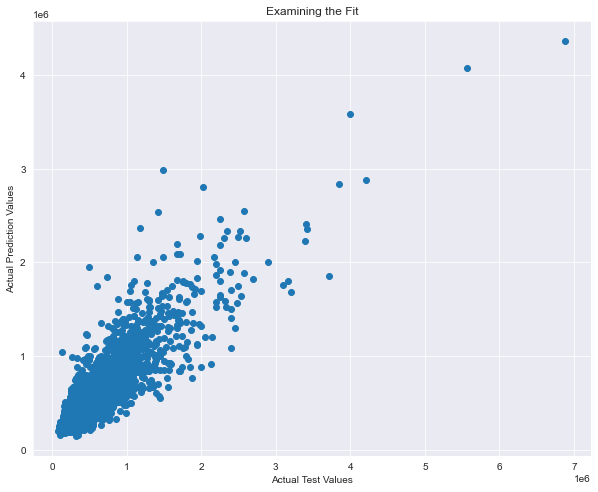

In [810]:
plt.scatter(y_test,gbrt.predict(X_test))
plt.xlabel('Actual Test Values')
plt.ylabel('Actual Prediction Values')
plt.title('Examining the Fit')

The above plot actually means that that we have significantly good predictions as the test actual scores and the predicted scores actually line up

In [814]:
print('The R squared value we get after implementing the final model on the testing dataset is 0.74 which also means that about 74% of the variance in the house prices is explained by our model which if you take the nature of problem into account is a very good score to have. The score is {}'.format(round(r2_score(y_test,prediction),2)))

The R squared value we get after implementing the final model on the testing dataset is 0.74 which also means that about 74% of the variance in the house prices is explained by our model which if you take the nature of problem into account is a very good score to have. The score is 0.74


Additional fit metrics

In [816]:
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error

In [819]:
print('The Mean Absolute Error is {}'.format(mean_absolute_error(y_test,prediction)))

The Mean Absolute Error is 121537.34656403525


In [821]:
print('The Mean Squared Error is {}'.format(mean_squared_error(y_test,prediction)))

The Mean Squared Error is 34580837874.11784


# End Of The Project